# 20. 난 스케치를 할 테니 너는 채색을 하거라  
## 20-1. 들어가며

오늘은 Tensorflow로 신경망을 구현하는과정을 보고 이해하는 부분이 많으니 부족한 부분이 있으면 전제를 참고하기 바랍니다.  
### 학습전제
-------------------------------
1. 신경망의 학습방법에 대한 전반적인 절차를 알고 있어야 한다.  
2. CNN, GAN에 대한 기본적인 개념을 알고 있어야 한다.
3. Tensorflow의 Subclassing API로 레이어 및 모델을 구성하는 방법에 대해 대략적으로 알고 있어야 한다.
4. Tensorflow의 GradientTape API를 이용한 학습코드를 보고 이해할 수 있어야 한다.  
5. **Tensorflow 내에서 잘 모르는 함수(또는 메서드)를 발견했을 때, 공식 문서에서 검색하고 이해해보려는 의지가 필요.  


### 학습목표
------------------------------------
1. 조건을 부여하여 생성 모델을 다루는 방법에 대해 이해합니다.
2. cGan 및 Pix2Pix의 구조와 학습방법을 이해하고 잘 활용합니다.  
3. CNN 기반의 모델을 구현하는데 자신감을 갖습니다.  

### 목차
----------------------------------------
1. 조건 없는 생성모델(Unconditional Generative Model), GAN
2. 조건 있는 생성모델(Conditional Generative Model), cGAN
3. 내가 원하는 숫자 이미지 만들기 (1) Generator 구성하기
4. 내가 원하는 숫자 이미지 만들기 (2) Discriminator 구성하기
5. 내가 원하는 숫자 이미지 만들기 (3) 학습 및 테스트하기
6. GAN의 입력에 이미지를 넣는다면? Pix2Pix
7. 난 스케치를 할 테니 너는 채색을 하거라 (1) 데이터 준비하기
8. 난 스케치를 할 테니 너는 채색을 하거라 (2) Generator 구성하기
9. 난 스케치를 할 테니 너는 채색을 하거라 (3) Generator 재구성하기
10. 난 스케치를 할 테니 너는 채색을 하거라 (4) Discriminator 구성하기
11. 난 스케치를 할 테니 너는 채색을 하거라 (5) 학습 및 테스트하기
12. 프로젝트 : Segmentation map으로 도로 이미지 만들기

## 20-2. 조건 없는 생성모델(Unconditional Generative Model), GAN
우리가 MNIST 데이터셋을 이용해 GAN을 학습시켜서 7이라는 이미지를 얻을때 어떤 방법을 이용할까요?  
여기서 우리가 하는 법은 다양한 노이즈를 입력하고 7이라는 숫자가 나오길 기다리는 것입니다.  
근데, 언제 나올지 모르기에 내가 원하는 이미지를 바로 만들어낼 수 없습니다.  
다시 말해 unconditioned generative model은 내가 생성하고자 하는 데이터에 대해 제어하기 힘들다.  
우리가 원하는 이미지를 바로 만들어내기 위해 특정조건을 줄 수는 없을까?

## 20-3. 조건 있는 생성모델(Conditional Generative Model), cGAN  
내가 원하는 종류의 이미지를 생성하고자 할 때, 기존 GAN의 생성과정의 불편함을 해소하기 위해 고안된 방법.  
GAN에 대해서 알고 있다면, cGAN도 어렵지 않다.  

### GAN의 목적 함수  
-------------------------------------
GAN은 Generator와 Discriminator가 minimax game을 통해 서로 경쟁하며 발전한다.
Generator는 아래 식을 최소화, Discriminator는 최대화하려고 학습한다.  
<img src="GAN.png">  
여기서 z는 임의의 노이즈, D,G는 각각 Discriminator, Generator를 의미.  
실제 이미지를 1, 가짜 https://aiffelstaticprd.blob.core.windows.net/media/images/cgan_img.max-800x600.png이미지를 0으로 두었을 때,  
D는 logD(x), log(1-D(G(z)))가 모두 최대가 되어야 한다.  
이러기 위해서는 두 개의 log 모두 1이 되게 해야 한다.-> D(x)=1, D(G(z))=0이 되도록 해야한다.
진짜 데이터(x)를 1로, 가짜 데이터(G(z))를 0으로 예측하도록 학습해야 함.  

G는 log(1-D(G(z)))만 최소가 되면 되므로 D(G(z))가 1이 되도록 한다.
G는 z를 입력받아 생성한 데이터 G(z)를 D가 진짜 데이터라고 예측할 만큼 진짜같은 가짜 데이터를 만들도록 학습  

### cGAN의 목적 함수
---------------------------------------
cGAN의 목적함수는 아래와 같다.  
<img src="cGAN.png">  
GAN과 cGAN의 차이는 특정조건을 나타내는 정보인 y를 같이 입력.  
y는 어떤 정보여도 상관없으며 MNIST데이터셋이라면 y는 0~9까지의 라벨정보가 된다.  
y가 임의 노이즈 입력인 z의 가이드라고 할 수 있다.  

### 그림으로 이해하기
-----------------------------------------
<img src="feedforward.png">  
G의 학습과정은 위와 같다.  
  * Generator: 노이즈z(파란색)이 입력, 특정 representation(검정색)으로 변환 후, 가짜 데이터G(z)(빨간색) 생성. 
  * Disicriminator: 실제 데이터 x와 Generator가 생성한 가짜 데이터G(z)를 입력, D(x), D(G(z))(보라색)을 계산하여 진짜와 가짜 식별.  

<img src="cGAN_ff.png">  
달라진 점은 y라는 정보가 같이 입력됨.  
  * Generator: 노이즈z(파란색), 추가정보y(녹색)을 입력받아 generator 내부에서 결합된 후, representation(검정색)으로 변환되며 가짜 데이터 G(z|y)를 생성. 보통 y는 레이블의 정보이며 one-hot 벡터를 입력.
  * Discriminator: 실제 데이터 x와 Generator가 생성한 가짜 데이터 G(z|y)를 입력받아, y정보가 각각 함께 입력되어 진짜와 가짜를 식별. x, y는 알맞은 한쌍을 이뤄야 하며 Generator의 y와 Discriminator의 y는 동일한 레이블이어야 한다.
  


## 20-4. 내가 원하는 숫자 이미지 만들기 (1) Generator 구성하기  
GAN, cGAN을 간단하게 구현하고 실험해보자. 데이터는 MNIST를 사용하며 실습코드는 [TF2-GAN](https://github.com/thisisiron/TF2-GAN)참고  

### 데이터 준비하기
------------------------------------------
터미널을 열어서 tensorflow-datasets라이브러리 설치.  
```
$ pip install tensorflow-datasets
```  
tensorflow-datasets라이브러리에서 MNIST 데이터셋 불러와 확인

In [ ]:
import tensorflow_datasets as tfds

mnist, info =  tfds.load(
    "mnist", split="train", with_info=True
)

fig = tfds.show_examples(mnist, info)

아래코드를 통해 이미지의 픽셀값의 범위을 -1 ~ 1사이로 변경했고, 레이블 정보를 원-핫 인코딩한다.

In [ ]:
import tensorflow as tf

BATCH_SIZE = 128

def gan_preprocessing(data):
    image = data["image"]
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    return image

def cgan_preprocessing(data):
    image = data["image"]
    image = tf.cast(image, tf.float32)
    image = (image / 127.5) - 1
    
    label = tf.one_hot(data["label"], 10)
    return image, label

gan_datasets = mnist.map(gan_preprocessing).shuffle(1000).batch(BATCH_SIZE)
cgan_datasets = mnist.map(cgan_preprocessing).shuffle(100).batch(BATCH_SIZE)
print("✅")

In [ ]:
import matplotlib.pyplot as plt

for i,j in cgan_datasets : break

# 이미지 i와 라벨 j가 일치하는지 확인해 봅니다.     
print("Label :", j[0])
print("Image Min/Max :", i.numpy().min(), i.numpy().max())
plt.imshow(i.numpy()[0,...,0], plt.cm.gray)

### GAN Generator 구성하기
---------------------------------------------
이번 구현은 Tensorflow2의 Subclassing방법 이용.  
Subclassing방법은 tensorflow.keras.Model을 상속받아 클래스를 만들며, 일반적으로 __init__()메서드안에서 레이어 구성을 정의하고, 구성된 레이어를 call()메서드에서 사용해 forward propagation을 진행.  
이 방식은 Pytorch의 모델 구성방법과 유사.

In [ ]:
from tensorflow.keras import layers, Input, Model

class GeneratorGAN(Model):
    def __init__(self):
        super(GeneratorGAN, self).__init__()

        self.dense_1 = layers.Dense(128, activation='relu')
        self.dense_2 = layers.Dense(256, activation='relu')
        self.dense_3 = layers.Dense(512, activation='relu')
        self.dense_4 = layers.Dense(28*28*1, activation='tanh')

        self.reshape = layers.Reshape((28, 28, 1))

    def call(self, noise):
        out = self.dense_1(noise)
        out = self.dense_2(out)
        out = self.dense_3(out)
        out = self.dense_4(out)
        return self.reshape(out)

print("✅")

__init__()메서드 안에서 모든 레이어 정의. 4개의 fully-connected-layer중 3개가 ReLU사용.
call()메서드에서 노이즈를 입력받아 __init__()의 레이어를 순서대로 통과.  
Generator는 숫자가 적힌 이미지를 출력해야 하므로 마지막 출력은 layers.Reshape()를 통해 (28, 28, 1)크기로 변환  
### cGAN Generator 구성하기
----------------------------------------

In [ ]:
class GeneratorCGAN(Model):
    def __init__(self):
        super(GeneratorCGAN, self).__init__()
        
        self.dense_z = layers.Dense(256, activation='relu')
        self.dense_y = layers.Dense(256, activation='relu')
        self.combined_dense = layers.Dense(512, activation='relu')
        self.final_dense = layers.Dense(28 * 28 * 1, activation='tanh')
        self.reshape = layers.Reshape((28, 28, 1))

    def call(self, noise, label):
        noise = self.dense_z(noise)
        label = self.dense_y(label)
        out = self.combined_dense(tf.concat([noise, label], axis=-1))
        out = self.final_dense(out)
        return self.reshape(out)
    
print("✅")

앞에서 봤듯이 GAN과 cGAN의 차이점은 레이블 정보가 추가된 것뿐이다.  
cGAN의 입력은 2개(노이즈와 레이블정보).  
노이즈 입력(dense_z) 및 레이블 입력(dense_y)가 서로 연결되어 다시 한번 1개의 fully-connected 레이어와 ReLU 활성화를 통과합니다 (tf.concat, conbined_dense)  
위의 결과가 1개의 fully-connected 레이어 및 Hyperbolic tangent 활성화를 거쳐 28x28 차원의 결과가 생성되고 (28,28,1) 크기의 이미지 형태로 변환되어 출력됩니다 (final_dense, reshape)


## 20-5. 내가 원하는 숫자 이미지 만들기 (2) Discriminator 구성하기  

### GAN Discriminator 구성하기
-----------------------------------------------------
Generator를 만들었으니, 실제 이미지와 Generator가 만든 가짜 이미지 중 진짜를 식별하는 Discriminator 구현

In [ ]:
class DiscriminatorGAN(Model):
    def __init__(self):
        super(DiscriminatorGAN, self).__init__()
        self.flatten = layers.Flatten()
        
        self.blocks = []
        for f in [512, 256, 128, 1]:
            self.blocks.append(
                layers.Dense(f, activation=None if f==1 else "relu")
            )
        
    def call(self, x):
        x = self.flatten(x)
        for block in self.blocks:
            x = block(x)
        return x
    
print("✅")

__init__()에 block이라는 리스트를 만들어 for를 통해 필요한 레이어를 쌓는다.  
이 방식은 fully-connected 레이어를 매번 정의하지 않아도 되서 많은 레이어가 필요시에 좋다.  
Discriminatord의 입력은 Generator가 생성한 이미지(28, 28, 1)이며 fully-connected 레이어에서 학습시키기 위해서 layers.Flatten()한다.  
blocks에 있는 레이어들을 순차적으로 꺼내서 입력데이터 통과시키고, 마지막 fully-connected 레이어를 통과하면 진짜인지 가짜인지를 나타내는 값 출력  

### cGAN Discriminator 구성하기  
-----------------------------------------
cGAN의 Discriminator에는 'Maxout'이라는 특별한 레이어 사용.  
Maxout은 두 레이어 사이를 연결할 때, 여러 개의 fully-connected 레이어를 통과시켜 그 중 가장 큰 값을 갖고 온다.  
Maxout을 식으로 표현하면 아래와 같다.  
<img src="maxout.png">  
[Maxout정보1](https://m.blog.naver.com/PostView.nhn?blogId=laonple&logNo=221259325819&proxyReferer=&proxyReferer=https:%2F%2Fwww.google.com%2F)  
[Maxout정보2](https://arxiv.org/pdf/1302.4389.pdf)  
Maxout은 tensorflow.keras.layers.Layer를 상속받아 아래와 같이 구성할 수 있다. 

In [ ]:
class Maxout(layers.Layer):
    def __init__(self, units, pieces):
        super(Maxout, self).__init__()
        self.dense = layers.Dense(units*pieces, activation="relu")
        self.dropout = layers.Dropout(.5)    
        self.reshape = layers.Reshape((-1, pieces, units))
    
    def call(self, x):
        x = self.dense(x)
        x = self.dropout(x)
        x = self.reshape(x)
        return tf.math.reduce_max(x, axis=1)

print("✅")

Maxout 레이어 구성할 때 units와 pieces의 설정이 필요하며 units차원 수를 가진 fully-connected 레이어를 pieces개 만큼 만들고 그중 최댓값을 출력한다. 식으로는 아래와 같다.(units=100, pieces=10)  
<img src="maxout1.png">  
각 wx+b가 100차원이다.  
위에서 정의한 maxout 레이어 3번이면 아래와 같이 cGAN의 Discriminator를 구성할수 있다.

In [ ]:
class DiscriminatorCGAN(Model):
    def __init__(self):
        super(DiscriminatorCGAN, self).__init__()
        self.flatten = layers.Flatten()
        
        self.image_block = Maxout(240, 5)
        self.label_block = Maxout(50, 5)
        self.combine_block = Maxout(240, 4)
        
        self.dense = layers.Dense(1, activation=None)
    
    def call(self, image, label):
        image = self.flatten(image)
        image = self.image_block(image)
        label = self.label_block(label)
        x = layers.Concatenate()([image, label])
        x = self.combine_block(x)
        return self.dense(x)
    
print("✅")

일반 GAN의 DIscriminator와 마찬가지로 입력받은 이미지를 layers.Flatten()으로 지나며 입력된 이미지와 레이블은 각각 Maxout을 한번씩 지나서 결합된 후에 Maxout을 한번더 통과한다.  
마지막 fully-connected 레이어를 통과하면 진짜인지 가짜인지를 나타내는 값이 출력된다.

## 20-6. 내가 원하는 숫자 이미지 만들기 (3) 학습 및 테스트하기
GAN, cGAN의 학습에 공통적으로 필요한 loss function과 optimizer를 정의하자.  
가짜인지 진짜인지 구분을 위해 Binary Cross Entropy를 사용하고 Adam optimizer를 사용.

In [ ]:
from tensorflow.keras import optimizers, losses

bce = losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return bce(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    return bce(tf.ones_like(real_output), real_output) + bce(tf.zeros_like(fake_output), fake_output)

gene_opt = optimizers.Adam(1e-4)
disc_opt = optimizers.Adam(1e-4)    

print("✅")

### GAN으로 MNIST 학습하기
----------------------------------------
이전에 구성한 GeneratorGAN 및 DiscriminatorGAN 모델 클래스 사용.  
입력으로 사용되는 노이즈를 100차원으로 설정. 하나의 배치 크기 데이터로 모델을 업데이트.

In [ ]:
gan_generator = GeneratorGAN()
gan_discriminator = DiscriminatorGAN()

@tf.function()
def gan_step(real_images):
    noise = tf.random.normal([real_images.shape[0], 100])
    
    with tf.GradientTape(persistent=True) as tape:
        # Generator를 이용해 가짜 이미지 생성
        fake_images = gan_generator(noise)
        # Discriminator를 이용해 진짜 및 가짜이미지를 각각 판별
        real_out = gan_discriminator(real_images)
        fake_out = gan_discriminator(fake_images)
        # 각 손실(loss)을 계산
        gene_loss = generator_loss(fake_out)
        disc_loss = discriminator_loss(real_out, fake_out)
    # gradient 계산
    gene_grad = tape.gradient(gene_loss, gan_generator.trainable_variables)
    disc_grad = tape.gradient(disc_loss, gan_discriminator.trainable_variables)
    # 모델 학습
    gene_opt.apply_gradients(zip(gene_grad, gan_generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_grad, gan_discriminator.trainable_variables))
    return gene_loss, disc_loss

print("✅")

In [ ]:
EPOCHS = 10
for epoch in range(1, EPOCHS+1):
    for i, images in enumerate(gan_datasets):
        gene_loss, disc_loss = gan_step(images)

        if (i+1) % 100 == 0:
            print(f"[{epoch}/{EPOCHS} EPOCHS, {i+1} ITER] G:{gene_loss}, D:{disc_loss}")

100차원 노이즈를 10개 사용하여 10개의 숫자 손글씨 데이터를 생성해서 시각화.(경고무시)

In [ ]:
import numpy as np

noise = tf.random.normal([10, 100])

output = gan_generator(noise)
output = np.squeeze(output.numpy())

plt.figure(figsize=(15,6))
for i in range(1, 11):
    plt.subplot(2,5,i)
    plt.imshow(output[i-1])

10번 학습의 가중치로는 좋은 결과 기대할 수 없다.  
500 epoch 학습한 가중치를 아래 첨부
```
$ mkdir -p ~/aiffel/conditional_generation/gan
$ wget https://aiffelstaticprd.blob.core.windows.net/media/documents/GAN_500.zip
$ mv GAN_500.zip ~/aiffel/conditional_generation/gan
$ cd ~/aiffel/conditional_generation/gan && unzip GAN_500.zip
```

In [ ]:
#GAN 결과
import os
weight_path = os.getenv('HOME')+'/aiffel/conditional_generation/gan/GAN_500'

noise = tf.random.normal([10, 100]) 

gan_generator = GeneratorGAN()
gan_generator.load_weights(weight_path)

output = gan_generator(noise)
output = np.squeeze(output.numpy())

plt.figure(figsize=(15,6))
for i in range(1, 11):
    plt.subplot(2,5,i)
    plt.imshow(output[i-1])

### cGAN으로 MNIST 학습하기
--------------------------------------------------
GAN과 동일하게 이전에 생성한 모델클래스 사용.  
연습삼아 1epoch만 돌려보자.

In [ ]:
cgan_generator = GeneratorCGAN()
cgan_discriminator = DiscriminatorCGAN()

@tf.function()
def cgan_step(real_images, labels):
    noise = tf.random.normal([real_images.shape[0], 100])
    
    with tf.GradientTape(persistent=True) as tape:
        fake_images = cgan_generator(noise, labels)
        
        real_out = cgan_discriminator(real_images, labels)
        fake_out = cgan_discriminator(fake_images, labels)
        
        gene_loss = generator_loss(fake_out)
        disc_loss = discriminator_loss(real_out, fake_out)
    
    gene_grad = tape.gradient(gene_loss, cgan_generator.trainable_variables)
    disc_grad = tape.gradient(disc_loss, cgan_discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_grad, cgan_generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_grad, cgan_discriminator.trainable_variables))
    return gene_loss, disc_loss


EPOCHS = 1
for epoch in range(1, EPOCHS+1):
    
    for i, (images, labels) in enumerate(cgan_datasets):
        gene_loss, disc_loss = cgan_step(images, labels)
    
        if (i+1) % 100 == 0:
            print(f"[{epoch}/{EPOCHS} EPOCHS, {i} ITER] G:{gene_loss}, D:{disc_loss}")

레이블 정보만 추가로 입력했다는 점만 제외하면 위의 GAN과 큰 차이가 없다  
이번에도 학습을 많이 해야 함으로 미리 학습한 가중치를 다운받는다.
```
$ mkdir -p ~/aiffel/conditional_generation/cgan
$ wget https://aiffelstaticprd.blob.core.windows.net/media/documents/CGAN_500.zip
$ mv CGAN_500.zip ~/aiffel/conditional_generation/cgan
$ cd ~/aiffel/conditional_generation/cgan && unzip CGAN_500.zip
```  
아래 코드에서 numbers에 생성하길 원하는 숫자를 입력하고 코드를 실행하자.

In [ ]:
number =   # TODO : 생성할 숫자를 입력해 주세요!!

weight_path = os.getenv('HOME')+'/aiffel/conditional_generation/cgan/CGAN_500'

noise = tf.random.normal([10, 100])

label = tf.one_hot(number, 10)
label = tf.expand_dims(label, axis=0)
label = tf.repeat(label, 10, axis=0)

generator = GeneratorCGAN()
generator.load_weights(weight_path)

output = generator(noise, label)
output = np.squeeze(output.numpy())

plt.figure(figsize=(15,6))
for i in range(1, 11):
    plt.subplot(2,5,i)
    plt.imshow(output[i-1])

## 20-7. GAN의 입력에 이미지를 넣는다면? Pix2Pix  
우리가 앞선 노드를 통해 cGAN은 작은 조건만으로 우리가 원하는 클래스의 이미지를 생성할 수 있음을 확인했습니다.  
근데 만약 입력 + 조건이 아니라 입력자체가 조건이 될 수 없을까요?  
이번에 소개할 Pix2Pix는 기존의 GAN처럼 노이즈를 이미지로 변환시키는 것이 아니라 이미지를 입력으로 원하는 다른 형태의 이미지로 변환 할 수 있는 GAN모델입니다.  
Pix2Pix를 제안한 논문은 Image-to-Image Translation with Conditional Adversarial Networks로 여기서 Conditional Adversarial Networks는 이전에 봤던 cGAN과 같은 구조.  
Image-to-Image는 이미지간 변환으로 한 이미지의 픽셀에서 다른 이미지의 픽셀로 변환한다는 뜻에서 Pix2Pix라고 불립니다.  
cGAN은 fully-connected 레이어를 연속으로 쌓아서 만들었지만, Pix2Pix는 convolution 레이어를 활용합니다.  
GAN기반이기에 Generator와 Discriminator로 구성되어있습니다.  

### Pix2Pix(Generator)
----------------------------------------
Generator는 이미지를 입력받아 변환된 이미지 출력하는데, 입력한 이미지와 변환한 이미지의 크기가 동일.  
<img src="pix2pix_gen.png">  
인코더에서 이미지(x)를 입력받아 단계적으로 이미지를 down-sampling하면서 이미지의 중요한 representation을 학습.  
디코더에서 다시 이미지를 up-sampling하며 입력한 이미지와 동일한 크기의 변환된 이미지(y)를 생성.  
이 과정은 모두 convolution레이어로 진행하며 레이어의 수많은 파라미터를 통해 잘 변환시킨다.  
인코더의 최종출력은 그림의 가장 작은 사각형이며 bottelneck이라고 불리는데, 이 부분이 입력 이미지의 가장 중요한 특징이 담겨있습니다.  
이런 작은 특징이 변환된 이미지를 생성하는데 충분한 정보가 제공될까요?  
이런 부분을 보완하기 위해 Generator 구조를 하나 더 제안합니다.  
그게 U-Net입니다.  
<img src="U_Net.png">  
위의 단순한 구조와 다른 점은 인코더와 디코더가 skip connection이 되어 있어 인코더로부터 더 많은 정보를 받아 더 선명한 결과를 만들어냅니다.(U-Net은 segmentation작업을 위해서 제안된 구조)  

### Pix2Pix(Loss Function)
------------------------------------------------------
Generator만으로 이미지 변환가능. 실제로 AutoEncoder 형태는 Generator만으로 이미지 변환 진행  
생성은 가능하지만 Generator로만 진행할 경우의 문제는 이미지의 평균적인 손실만 줄이는 쪽으로 파라미터를 학습하기에 흐릿해지는 경향을 벗어날 수 없습니다.  
하지만 Discriminator로 Generator와 경쟁을 시키면 진짜같은 이미지를 만들어야 하기에 더 좋은 결과를 얻을 수 있습니다.  


### Pix2Pix(Discriminator)
--------------------------------------------------------
<img src="DCGAN.png">  
기존의 DCGAN의 Discriminator는 가짜이미지나 진짜이미지를 입력받아 convolution레이어로 크기를 줄여나가 최종적으로 확률값을 출력하는 방식이었는데,Pix2Pix는 방식이 좋은지에 대한 의문점을 가지고 다른 구조의 Discriminator를 사용했습니다.  
<img src="pix2pix_dis.png">  
Pix2Pix는 convolution레이어를 거쳐 나오는 최종결과가 하나가 아닌 여러개의 값을 갖는다.  
각각의 값은 입력이미지의 receptive field에 대해서만 진짜인지 가짜인지의 확률값을 도출.  
여러 개의 확률값을 평균하여 최종 Discriminator의 출력을 생성.  
이미지의 일부영역(patch)를 기반으로 해서 PatchGAN이라고 부른다.  
일반적으로 이미지에서 거리가 먼 픽셀은 연관성이 없기에 일정영역에서 세부적으로 판별하는 것이 더 진짜 같은 이미지를 만들도록 하는 방식.  
<img src="patchgan.png">  
이미지 위에 적힌 숫자는 patch의 넓이를 적은 것으로 너무 적거나 너무 큰 패치는 좋지 않음을 알 수 있다.

## 20-8. 난 스케치를 할 테니 너는 채색을 하거라 (1) 데이터 준비하기  
Pix2Pix모델을 구현하고 실험해보자.  
사용할 데이터셋은 Sketch2Pokemon입니다.  
[포켓몬 데이터셋 정보](https://www.kaggle.com/norod78/sketch2pokemon)  
학습용 데이터셋에 830개의 이미지가 있으며, 256x256크기의 이미지쌍이 나란히 붙어 있어 256X512이미지로 구성.  
```
#학습용 데이터셋만 가져왔다.
$ wget https://aiffelstaticprd.blob.core.windows.net/media/documents/sketch2pokemon.zip
$ mv sketch2pokemon.zip ~/aiffel/conditional_generation
$ cd ~/aiffel/conditional_generation && unzip sketch2pokemon.zip
```

In [1]:
import os

data_path = os.getenv('HOME')+'/aiffel/conditional_generation/pokemon_pix2pix_dataset/train/'
print("number of train examples :", len(os.listdir(data_path)))

number of train examples : 830


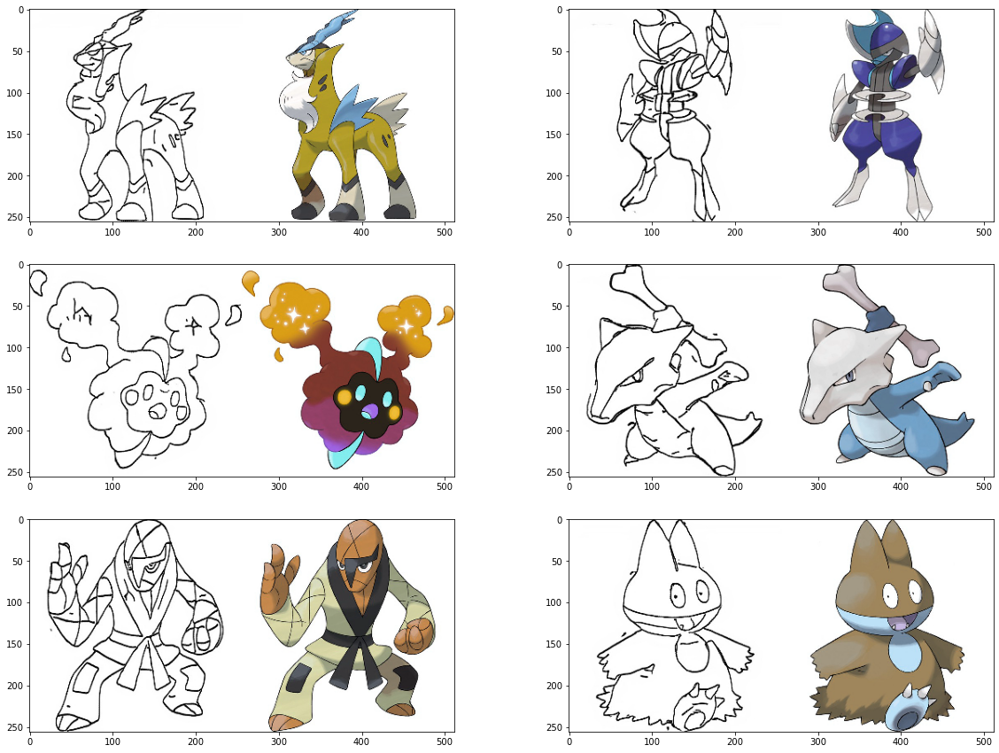

In [2]:
#임의의 이미지 6개를 불러와서 시각화  
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = data_path + os.listdir(data_path)[np.random.randint(800)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

하나의 이미지에 포켓몬 스케치와 실제 포켓몬 이미지가 함께 포함됨.  
여러번 돌리다보면 제대로 스케치 되지 않은 이미지가 있는데, 그 이유는 스케치 생성모델을 사용해서 만들었기 때문입니다.  
아래 코드로 이미지 하나 갖고 와서 크기 확인해보자

In [3]:
f = data_path + os.listdir(data_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)


데이터를 (256, 256, 3) 크기의 2개 이미지로 분할해서 사용하자. 아래코드를 통해 분할하고 한쌍의 이미지를 불러와보자

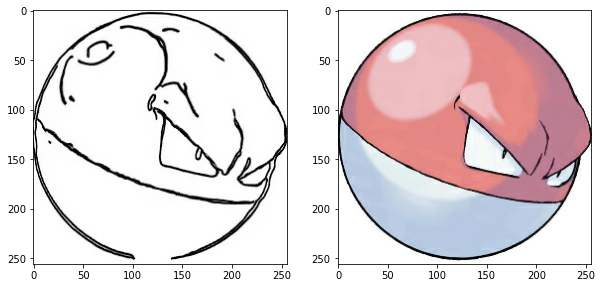

In [4]:
import tensorflow as tf

def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    sketch = img[:, :w, :] 
    sketch = tf.cast(sketch, tf.float32)
    colored = img[:, w:, :] 
    colored = tf.cast(colored, tf.float32)
    return normalize(sketch), normalize(colored)

f = data_path + os.listdir(data_path)[1]
sketch, colored = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(sketch))
plt.subplot(1,2,2); plt.imshow(denormalize(colored))

이번단계의 목표는 스케치이미지를 Pix2Pix에 입력하여 채색된 이미지를 생성하는 것이다.  
데이터의 다양성을 높이기 위해서 아래 코드로 여러 augmentation방법 적용

In [5]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]   

print("✅")

✅


위의 apply_augmentation함수는 스케치 및 채색된 이미지 2개를 입력받아 여러개의 연산을 동일하게 적용.  
1. 두 이미지가 채널 축으로 연결됩니다. (tf.concat). 두 이미지가 각각 3채널인 경우 6채널이 됩니다.  
2. 1.의 결과에 각 50% 확률로 Refection padding 또는 constant padding이 30픽셀의 pad width 만큼적용됩니다. (tf.pad)  
3. 2.의 결과에서 (256,256,6) 크기를 가진 이미지를 임의로 잘라냅니다. (tf.image.random_crop)  
4. 3.의 결과를 50% 확률로 가로로 뒤집습니다. (tf.image.random_flip_left_right)  
5. 4.의 결과를 50% 확률로 세로로 뒤집습니다. (tf.image.random_flip_up_down)  
6. 5.의 결과를 50% 확률로 회전시킵니다. (tf.image.rot90)  
이 과정을 데이터에 적용해서 시각화해보자

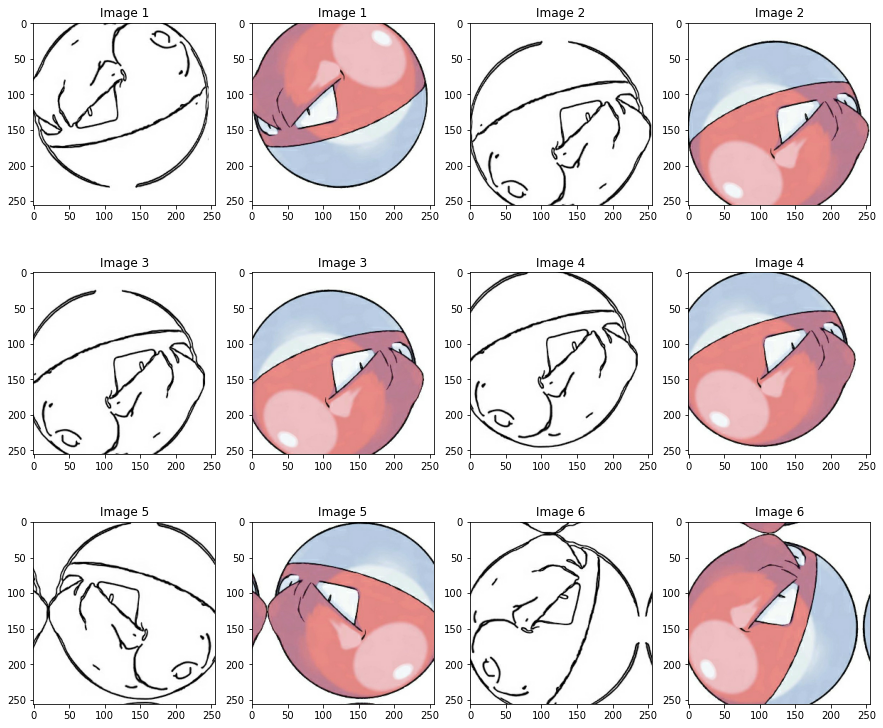

In [6]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_sketch, augmented_colored = apply_augmentation(sketch, colored)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_sketch)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_colored)); plt.title(f"Image {img_n}")
    img_n += 1

굉장히 다양한 이미지를 만들어 다양한 데이터셋을 만들어 좀더 좋은 일반화 결과를 얻을 수 있다.  
하나의 이미지를 불러와 위 과정이 잘 적용되었는지 확인해보자.

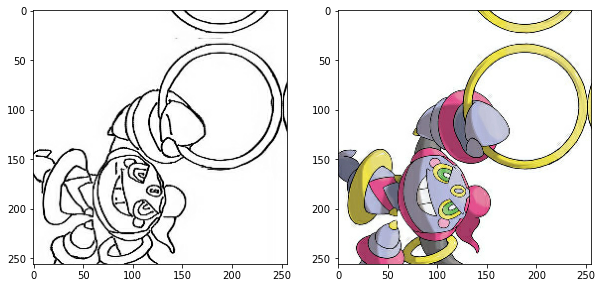

In [7]:
from tensorflow import data

def get_train(img_path):
    sketch, colored = load_img(img_path)
    sketch, colored = apply_augmentation(sketch, colored)
    return sketch, colored

train_images = data.Dataset.list_files(data_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
sketch, colored = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(sketch[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(colored[0].astype(np.uint8))

## 20-9. 난 스케치를 할 테니 너는 채색을 하거라 (2) Generator 구성하기
cGAN과 마찬가지로 Tensorflow의 Subclassing을 통해 모델을 구현.  

### Generator의 구성요소 알아보기
-----------------------------------------
논문의 구성정보  
<img src="pix2pix_model.png">  
generator 전체구조  
<img src="pix2pix_generator.png">  

### Generator 구현하기
------------------------------------
Encoder부분 구현.
Convolution->BatchNorm->LeakyReLu의 3개 레이어를 하나의 레이어로 만듬.

In [8]:
from tensorflow.keras import layers, Input, Model

class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu= layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

print("✅")

✅


__init__() 메서드에서 n_filters(사용할 필터갯수), use_bn(BatchNorm사용여부)를 설정가능.  
논문에서 고정된 값들은 각각 지정(필터의 크기(=4), stride(=2), LeakyReLU 활성화의 slope coefficient(=0.2))  
EncodeBlock을 여러번 사용하면 Encoder를 구성할 수 있습니다.

In [9]:
class Encoder(layers.Layer):
    def __init__(self):
        super(Encoder, self).__init__()
        filters = [64,128,256,512,512,512,512,512]
        
        self.blocks = []
        for i, f in enumerate(filters):
            if i == 0:
                self.blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.blocks.append(EncodeBlock(f))
    
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
    
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


filters에 각블록을 거치며 사용할 필터개수를 지정했으며 blocks에는 사용할 블록을 정의해두고, call()메소드에서 차례대로 블록통과.  
get summary는 레이어가 제대로 구성됐는지 확인하기 위해서 만들어놓음. 이미지를 입력하면 출력형태가 어떤지 확인해보자.

In [10]:
Encoder().get_summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
encode_block (EncodeBlock)   (None, 128, 128, 64)      3072      
_________________________________________________________________
encode_block_1 (EncodeBlock) (None, 64, 64, 128)       131584    
_________________________________________________________________
encode_block_2 (EncodeBlock) (None, 32, 32, 256)       525312    
_________________________________________________________________
encode_block_3 (EncodeBlock) (None, 16, 16, 512)       2099200   
_________________________________________________________________
encode_block_4 (EncodeBlock) (None, 8, 8, 512)         4196352   
_________________________________________________________________
encode_block_5 (EncodeBlock) (None, 4, 4, 512)         419635

(1,1,512)로 잘 출력됨을 확인.  
이제 Decoder 구현. Encoder와 동일하게 기본블록 정의, 블록 반복을 통해서 구현해보자

In [11]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

    
class Decoder(layers.Layer):
    def __init__(self):
        super(Decoder, self).__init__()
        filters = [512,512,512,512,256,128,64]
        
        self.blocks = []
        for i, f in enumerate(filters):
            if i < 3:
                self.blocks.append(DecodeBlock(f))
            else:
                self.blocks.append(DecodeBlock(f, dropout=False))
                
        self.blocks.append(layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False))
        
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
            
    def get_summary(self, input_shape=(1,1,256)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        
print("✅")

✅


맨 처음 3개 블록에서만 Dropout사용, 마지막 convolution에 3개의 필터사용해서 출력

In [12]:
Decoder().get_summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 1, 1, 256)]       0         
_________________________________________________________________
decode_block (DecodeBlock)   (None, 2, 2, 512)         2099200   
_________________________________________________________________
decode_block_1 (DecodeBlock) (None, 4, 4, 512)         4196352   
_________________________________________________________________
decode_block_2 (DecodeBlock) (None, 8, 8, 512)         4196352   
_________________________________________________________________
decode_block_3 (DecodeBlock) (None, 16, 16, 512)       4196352   
_________________________________________________________________
decode_block_4 (DecodeBlock) (None, 32, 32, 256)       2098176   
_________________________________________________________________
decode_block_5 (DecodeBlock) (None, 64, 64, 128)       5248

출력된 이미지 형태가 (256,256,3)임을 확인  
tf.keras.Model을 상속받아 Encoder와 Decoder 연결해 Generator를 구성.

In [13]:
class EncoderDecoderGenerator(Model):
    def __init__(self):
        super(EncoderDecoderGenerator, self).__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()
    
    def call(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x
   
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        

EncoderDecoderGenerator().get_summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
encoder_1 (Encoder)          (None, 1, 1, 512)         19544576  
_________________________________________________________________
decoder_1 (Decoder)          (None, 256, 256, 3)       19542784  
Total params: 39,087,360
Trainable params: 39,076,480
Non-trainable params: 10,880
_________________________________________________________________


## 20-10. 난 스케치를 할 테니 너는 채색을 하거라 (3) Generator 재구성하기  
이전에 봤듯이 일반 구조보다 U-Net이 좀더 실제 이미지와 같은 품질을 보여준다.  
하지만 이전에 구현한 것은 일반 Generator였으니 구현한 것을 수정 U-net Generator를 만들고 실험해보자  
기본블록은 아래코드로 구현

In [14]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

    
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)
    
print("✅")

✅


위의 코드에서는 따로 수정할게 없으니 그대로 갖다 씁니다.  
아래 코드에서 call()메소드안에서 forward propagation을 하도록 설정.  
call()내에서 skip connection이 어떻게 구현됐는지 확인해보잔

In [15]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1] # encoder의 마지막 출력은 decoder로 직접 입력되어 skip conncection대상이 아님
                    
        for block, feat in zip(self.decode_blocks, features[::-1]): # 인코더와 디코더 순서가 반대이므로.
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


__init__()안에 정의된 encode_blocks, decode_blocks가 call()내부에서 차례로 사용되어 encoder, decoder연산수행.  
skip connection을 위해서 features라는 리스트를 만들고 encoder에서 사용한 블록 출력을 차례대로 담는다.  
encoder의 최종 출력이 decoder의 입력으로 들어가면서 각각 decoder 블록을 지나가는데, features에 있는 출력도 함께 연결되어 다음블록 입력으로 사용.

Q10. 아래와 같은 데이터 A, B가 있을 때,  
데이터 A 크기 : (32,128,128,200) #(batch, width, height, channel)  
데이터 B 크기 : (32,128,128,400) #(batch, width, height, channel)  
여기서 사용되는 skip connection은 layers.Concatenate() 결과의 크기는 무엇일까요?  

ANS)(128,128,600)  
layers.Concatenate() 내에 별다른 설정이 없다면 가장 마지막 축(채널 축)을 기준으로 서로 연결됩니다.

In [16]:
#출력구조확인
UNetGenerator().get_summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block_16 (EncodeBlock)   (None, 128, 128, 64) 3072        input_4[0][0]                    
__________________________________________________________________________________________________
encode_block_17 (EncodeBlock)   (None, 64, 64, 128)  131584      encode_block_16[0][0]            
__________________________________________________________________________________________________
encode_block_18 (EncodeBlock)   (None, 32, 32, 256)  525312      encode_block_17[0][0]            
____________________________________________________________________________________________

원본 generator와 U-Net generator의 summary를 보면 파라미터가 늘어났음을 알 수 있다.  

Q11. U-Net Generator의 파라미터가 늘어난 곳은 Encoder와 Decoder 중 어디일까요?  
또한, 두 종류의 Generator 구조에서 동일한 수의 convolution 레이어를 사용했는데, 구체적으로 어느 부분에서 파라미터가 늘어났을까요?  
ANS)
U-Net Generator의 Decoder 구조 내 파라미터가 많아졌습니다. 이 부분의 각 convolution 레이어에서 사용된 필터의 수는 두 종류의 Decoder에서 동일하지만, 그 크기가 다릅니다.  
예를 들어, 이전 Decoder 블록의 출력의 크기가 (16,16,512)라면,  
Encoder-decoder Generator의 경우, Decoder의 다음 블록에서 계산할 convolution의 필터 크기는 4x4x512 입니다.  
U-Net Generator의 경우, Encoder 내 블록 출력이 함께 연결되어 Decoder의 다음 블록에서 계산할 convolution의 필터 크기는 4x4x(512+512) 입니다.

## 20-11. 난 스케치를 할 테니 너는 채색을 하거라(4) Discriminator 구성하기 

generator만으로는 좋은 이미지를 생성하기 부족함으로 discriminator를 만들자.  

### Discriminator의 구성요소 알아보기
-----------------------------
논문의 Disicriminator의 정보를 참고해보자.  
<img src="pix2pix_discriminator.png">  
generator와 크게 다른 점은 최종출력에 sigmoid(진짜인지 가짜인지 판별)을 사용한 것.  
<img src="discriminator.png">  
2개의 입력(in, unknown)을 연결한 후, encode 5개 블록을 통과한다.  
마지막 블록을 제외한 4개는 논문의 C64-C128-C256-C512이며, 마지막은 1차원 출력을 위한 블록이다.  
최종 출력 크기는 (30X30X1)로 32->31->30으로 크기가 줄었는데, 이전에 쓴 padding이나 stride로는 안되기에 다른 방법을 써야한다.  
최종 출력크기를 30으로 맞춘 이유는 70X70 PatchGAN을 사용했기에 강제로 맞췄다.  
[PatchGAN](https://medium.com/@sahiltinky94/understanding-patchgan-9f3c8380c207)  

### Discriminator 구현하기
-------------------------------------
기본 블록

In [17]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

print("✅")

✅


generator와 비슷하게 n_filters(필터수), stride(필터순회간격), custom pad(출력 feature map 크기조절), use_bn(BatchNorm 사용여부), act(활성화 함수 사용여부).  

Q12. 위에서 만든 DiscBlock의 설정을 다음과 같이 하여 DiscBlock(n_filters=64, stride=1, custom_pad=True, use_bn=True, act=True) 으로 생성된 블록에 (width, height, channel) = (128, 128, 32) 크기가 입력된다면, 블록 내부에서 순서대로 어떠한 레이어를 통과하는지, 그리고 각 레이어를 통과했을 때 출력 크기는 어떻게 되는지 적어주세요.  
ANS)  
1. 패딩 레이어 통과 layers.ZeroPadding2D() → (130,130,32)  
2. Convolution 레이어 통과 layers.Conv2D(64,4,1,"valid") → (127,127,64)  
패딩하지 않고 필터 크기 4 및 간격(stride) 1의 convolution 레이어를 통과하면 width 및 height 가 3씩 줄어듭니다. 이는 OutSize=(InSize+2∗PadSize−FilterSize)/Stride+1 의 식으로 계산할 수 있습니다. 채널 수는 사용한 필터 개수와 같습니다. 출력 : (127,127,64)  
3. BatchNormalization 레이어 통과  layers.BatchNormalization() → (127,127,64)  
이 외 다른 레이어(BatchNorm, LeakyReLU)는 출력의 크기에 영향을 주지 않습니다.
4. LeakyReLU 활성화 레이어 통과 layers.LeakyReLU(0.2) → (127,127,64)

In [18]:
inputs = Input((128,128,32))
out = layers.ZeroPadding2D()(inputs)
out = layers.Conv2D(64, 4, 1, "valid", use_bias=False)(out)
out = layers.BatchNormalization()(out)
out = layers.LeakyReLU(0.2)(out)

Model(inputs, out).summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 128, 128, 32)]    0         
_________________________________________________________________
zero_padding2d (ZeroPadding2 (None, 130, 130, 32)      0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 127, 127, 64)      32768     
_________________________________________________________________
batch_normalization_45 (Batc (None, 127, 127, 64)      256       
_________________________________________________________________
leaky_re_lu_24 (LeakyReLU)   (None, 127, 127, 64)      0         
Total params: 33,024
Trainable params: 32,896
Non-trainable params: 128
_________________________________________________________________


위와 같은 방식으로 사이즈를 1씩 줄일 수 있다. 

In [19]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    
print("✅")

✅


첫번째 블록은 concat, Discriminator의 최종출력은 sigmoid 활성화사용.

In [20]:
#각 블록의 출력 크기 확인
Discriminator().get_summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_7 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_6[0][0]                    
                                                                 input_7[0][0]                    
__________________________________________________________________________________________________
disc_block (DiscBlock)          (None, 128, 128, 64) 6144        concatenate_7[0][0]        

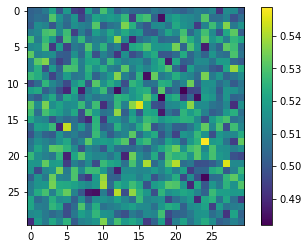

In [21]:
#임의의 (256,256,3)넣고 (30,30) 출력 시각화
x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

결과로 나온 이미지는 70X70 PatchGAN의 분류결과  
각 픽셀의 값은 sigmoid 결과값이기에 0 ~ 1사이의 값이므로 진짜인지 가짜인지 판별하는데 사용

## 20-12. 난 스케치를 할 테니 너는 채색을 하거라 (5) 학습 및 테스트하기  
이전에 만든 generator와 discriminator를 학습시키고, 스케치를 입력시켜 채색한 이미지를 생성해보자.  
학습에 필요한 손실함수 선택결과  
<img src="loss.png">  
가장 좋은 손실함수는 GAN 손실함수에 L1을 추가로 이용한 경우.  

In [22]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

print("✅")

✅


generator 손실함수(get_gene_loss): fake_disc(generator가 생성한 가짜 이미지를 discriminator에 입력해 얻은 값으로 1과 비교하기 위해 tf.ones_like()를 사용.), L1 손실을 계산하기 위해 fake_output과 real_output의 MAE(Mean Absolute Error)계산.  
discriminator 손실함수(get_disc_loss): 2개의 입력이 있는데, 각각 가짜 이미지와 진짜 이미지를 Discriminator에 입력해 얻은 값들. real_disc는 1로 채워진 벡터와 비교하고, fake_disc는 0으로 채워진 벡터와 비교.(진짜 이미지, 가짜 이미지를 구분해야 하므로)  
사용할 optimizer는 아래와 같다.

In [23]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

print("✅")

✅


배치 크기만큼 데이터 입력시 가중치 업데이트하는 과정

In [24]:
@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

print("✅")

✅


최종 generator 손실함수 계산시 L1손실에 100을 곱한 이유는 논문을 보면 알 수 있다.  
<img src="gene_loss.png">  
여기서 λ를 100으로 사용한 것이다.  
일단 10epoch학습

In [25]:
EPOCHS = 10

generator = UNetGenerator()
discriminator = Discriminator()

for epoch in range(1, EPOCHS+1):
    for i, (sketch, colored) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(sketch, colored)
                
        # 10회 반복마다 손실을 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[1] - STEP[10]                     
Generator_loss:0.9778                     
L1_loss:0.4801                     
Discriminator_loss:1.1236

EPOCH[1] - STEP[20]                     
Generator_loss:1.2696                     
L1_loss:0.3199                     
Discriminator_loss:1.7059

EPOCH[1] - STEP[30]                     
Generator_loss:0.9957                     
L1_loss:0.2804                     
Discriminator_loss:1.2490

EPOCH[1] - STEP[40]                     
Generator_loss:1.1881                     
L1_loss:0.2775                     
Discriminator_loss:1.1307

EPOCH[1] - STEP[50]                     
Generator_loss:1.5371                     
L1_loss:0.2534                     
Discriminator_loss:0.8261

EPOCH[1] - STEP[60]                     
Generator_loss:2.2097                     
L1_loss:0.2290                     
Discriminator_loss:0.7091

EPOCH[1] - STEP[70]                     
Generator_loss:1.0293                     
L1_loss:0.2952                    

EPOCH[3] - STEP[170]                     
Generator_loss:1.6327                     
L1_loss:0.2583                     
Discriminator_loss:0.7771

EPOCH[3] - STEP[180]                     
Generator_loss:2.6009                     
L1_loss:0.3045                     
Discriminator_loss:0.6907

EPOCH[3] - STEP[190]                     
Generator_loss:1.4977                     
L1_loss:0.2781                     
Discriminator_loss:1.2116

EPOCH[3] - STEP[200]                     
Generator_loss:1.3992                     
L1_loss:0.2285                     
Discriminator_loss:1.0601

EPOCH[4] - STEP[10]                     
Generator_loss:1.7275                     
L1_loss:0.2733                     
Discriminator_loss:0.5228

EPOCH[4] - STEP[20]                     
Generator_loss:0.5036                     
L1_loss:0.2269                     
Discriminator_loss:1.0903

EPOCH[4] - STEP[30]                     
Generator_loss:1.7610                     
L1_loss:0.2074                

EPOCH[6] - STEP[130]                     
Generator_loss:1.3387                     
L1_loss:0.2630                     
Discriminator_loss:0.3675

EPOCH[6] - STEP[140]                     
Generator_loss:1.9002                     
L1_loss:0.2529                     
Discriminator_loss:0.4425

EPOCH[6] - STEP[150]                     
Generator_loss:2.2371                     
L1_loss:0.2591                     
Discriminator_loss:0.1482

EPOCH[6] - STEP[160]                     
Generator_loss:2.1245                     
L1_loss:0.2346                     
Discriminator_loss:0.2174

EPOCH[6] - STEP[170]                     
Generator_loss:1.7997                     
L1_loss:0.2278                     
Discriminator_loss:0.4238

EPOCH[6] - STEP[180]                     
Generator_loss:0.8201                     
L1_loss:0.2673                     
Discriminator_loss:0.8573

EPOCH[6] - STEP[190]                     
Generator_loss:1.1657                     
L1_loss:0.2468             

EPOCH[9] - STEP[90]                     
Generator_loss:1.7249                     
L1_loss:0.2089                     
Discriminator_loss:0.7077

EPOCH[9] - STEP[100]                     
Generator_loss:2.3734                     
L1_loss:0.2724                     
Discriminator_loss:0.1919

EPOCH[9] - STEP[110]                     
Generator_loss:1.1869                     
L1_loss:0.2092                     
Discriminator_loss:1.2135

EPOCH[9] - STEP[120]                     
Generator_loss:0.3870                     
L1_loss:0.2231                     
Discriminator_loss:1.6400

EPOCH[9] - STEP[130]                     
Generator_loss:2.4041                     
L1_loss:0.2084                     
Discriminator_loss:0.3749

EPOCH[9] - STEP[140]                     
Generator_loss:3.1236                     
L1_loss:0.2894                     
Discriminator_loss:0.0958

EPOCH[9] - STEP[150]                     
Generator_loss:1.1512                     
L1_loss:0.2789              

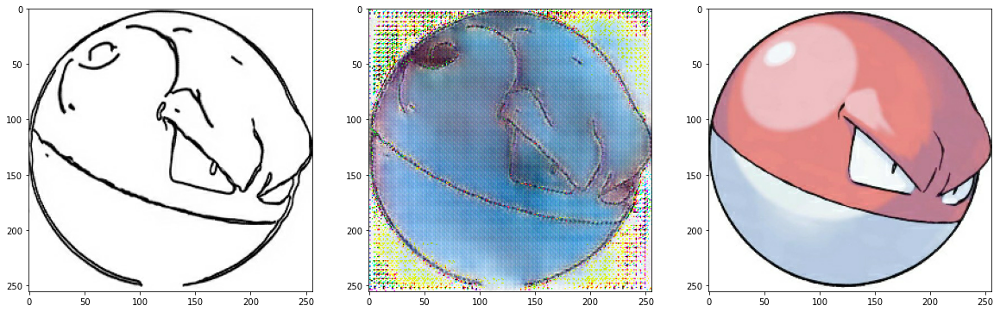

In [26]:
#학습해본 모델로 채색을 시켜보자!
test_ind = 1

f = data_path + os.listdir(data_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

128epoch를 돌린 모델로 채색을 시킨 결과
<img src="128epoch.png">

## 20-13. 프로젝트: Segmentation map으로 도로 이미지 만들기
이전 논문에서 도로 레이블 정보로 이미지를 생성한 결과
<img src="road.png">  
이번 프로젝트는 위와 같은 데이터셋으로 Pix2Pix 학습  
1000개의 학습용 이미지, 5개의 평가이미지사용.  

이전 포켓몬 데이터에서 사용했던 스케치와는 조금 다른 레이블 정보 이미지를 입력으로 사용하기 때문에, 전처리 과정에 대해 약간의 혼란이 있을 수 있지만 크게 다른 과정은 없습니다.
아래 Tensroflow에서 제공하는 Pix2Pix 튜토리얼은 위 이미지와 비슷한 레이블 정보 이미지를 사용하기 때문에 좋은 참고 자료가 될 수 있을 것 같습니다.

프로젝트 시작에 어려움이 있다면 아래 튜토리얼을 참고하시면서 이번 프로젝트를 수행해봅시다.
(아래 튜토리얼은 Pix2Pix 구조를 Functional API를 이용해 구현하기 때문에 이번에 진행한 Subclassing 방법을 이용한 모델 구현과 비교하면서 구현 방법에 대해서도 공부해 보시길 추천드립니다)  
[튜토리얼](https://www.tensorflow.org/tutorials/generative/pix2pix?hl=ko)

### 프로젝트 수행
----------------------------------------------------------------------------------------------------
프로젝트를 진행하면서 필수로 수행해야 할 사항은 다음과 같습니다.
1. 데이터에 한 가지 이상의 augmentation 방법을 적용하여 학습해주세요. (어떠한 방법을 사용했는지 적어주세요.)  
2. 이전에 구현했던 두 개의 Generator 중 Encoder와 Decoder간에 skip connection이 있는 U-Net Generator를 사용해주세요.  
3. 모델 학습 후, 학습된 Generator를 이용해 테스트합니다. 테스트 데이터는 다운받았던 "val" 폴더 내 이미지를 사용해주세요.  
4. 1개 이상의 이미지에 대해 테스트 과정을 거친 후 그 결과를 스케치, 생성된 사진, 실제 사진 순서로 나란히 시각화해 주세요.  
5. 모델을 충분히 학습하기에 시간이 부족할 수 있습니다. 적어도 10 epoch 이상 학습하며 중간 손실 값에 대한 로그를 남겨주세요. 좋은 결과를 얻기 위해선 긴 학습 시간이 필요하므로 테스트 결과는 만족스럽지 않아도 괜찮습니다.

In [27]:
import os

data_path = os.getenv('HOME')+'/aiffel/conditional_generation/cityscapes/train/'
print("number of train examples :", len(os.listdir(data_path)))

number of train examples : 1000


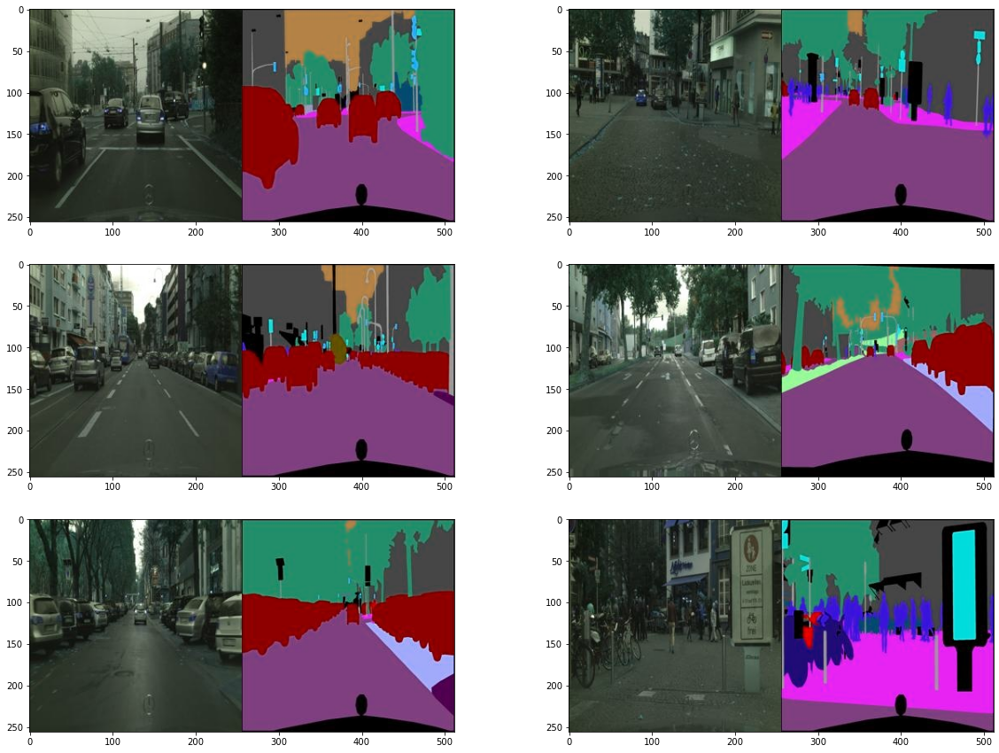

In [28]:
#임의의 이미지 6개를 불러와서 시각화  
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = data_path + os.listdir(data_path)[np.random.randint(800)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

In [29]:
f = data_path + os.listdir(data_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)


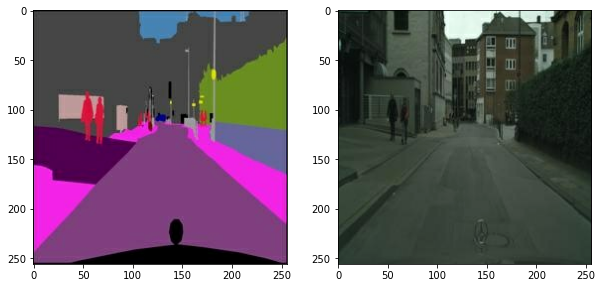

In [30]:
import tensorflow as tf

def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    sketch = img[:, w:, :] 
    sketch = tf.cast(sketch, tf.float32)
    colored = img[:, :w, :] 
    colored = tf.cast(colored, tf.float32)
    return normalize(sketch), normalize(colored)

f = data_path + os.listdir(data_path)[1]
sketch, colored = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(sketch))
plt.subplot(1,2,2); plt.imshow(denormalize(colored))

### Augmentation.  
위의 apply_augmentation함수는 스케치 및 채색된 이미지 2개를 입력받아 여러개의 연산을 동일하게 적용.  
1. 두 이미지가 채널 축으로 연결됩니다. (tf.concat). 두 이미지가 각각 3채널인 경우 6채널이 됩니다.  
2. 1.의 결과에 각 50% 확률로 Refection padding 또는 constant padding이 30픽셀의 pad width 만큼적용됩니다. (tf.pad)  
3. 2.의 결과에서 (256,256,6) 크기를 가진 이미지를 임의로 잘라냅니다. (tf.image.random_crop)  
4. 3.의 결과를 50% 확률로 가로로 뒤집습니다. (tf.image.random_flip_left_right)  
5. 4.의 결과를 50% 확률로 세로로 뒤집습니다. (tf.image.random_flip_up_down)  
6. 5.의 결과를 50% 확률로 회전시킵니다. (tf.image.rot90)  
이 과정을 데이터에 적용해서 시각화해보자

In [31]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]   

print("✅")

✅


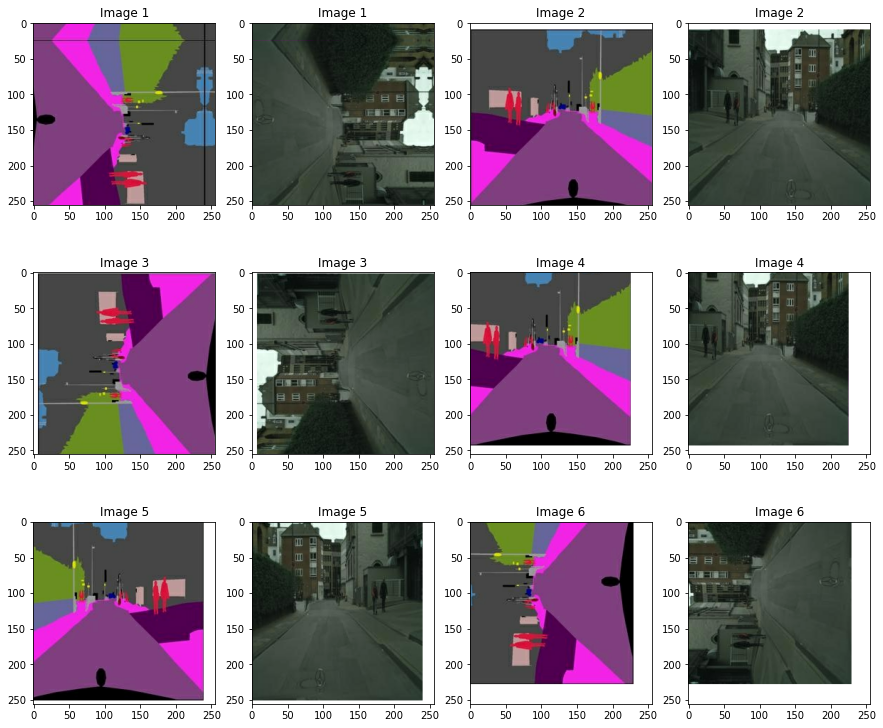

In [32]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_sketch, augmented_colored = apply_augmentation(sketch, colored)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_sketch)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_colored)); plt.title(f"Image {img_n}")
    img_n += 1

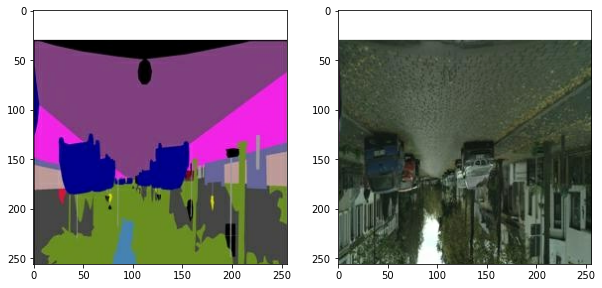

In [33]:
from tensorflow import data

def get_train(img_path):
    sketch, colored = load_img(img_path)
    sketch, colored = apply_augmentation(sketch, colored)
    return sketch, colored

train_images = data.Dataset.list_files(data_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
sketch, colored = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(sketch[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(colored[0].astype(np.uint8))

In [34]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

    
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)
    
print("✅")

✅


In [35]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1] # encoder의 마지막 출력은 decoder로 직접 입력되어 skip conncection대상이 아님
                    
        for block, feat in zip(self.decode_blocks, features[::-1]): # 인코더와 디코더 순서가 반대이므로.
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


In [36]:
#출력구조확인
UNetGenerator().get_summary()

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block_32 (EncodeBlock)   (None, 128, 128, 64) 3072        input_8[0][0]                    
__________________________________________________________________________________________________
encode_block_33 (EncodeBlock)   (None, 64, 64, 128)  131584      encode_block_32[0][0]            
__________________________________________________________________________________________________
encode_block_34 (EncodeBlock)   (None, 32, 32, 256)  525312      encode_block_33[0][0]            
____________________________________________________________________________________________

In [37]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

print("✅")

✅


In [38]:
inputs = Input((128,128,32))
out = layers.ZeroPadding2D()(inputs)
out = layers.Conv2D(64, 4, 1, "valid", use_bias=False)(out)
out = layers.BatchNormalization()(out)
out = layers.LeakyReLU(0.2)(out)

Model(inputs, out).summary()

Model: "model_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         [(None, 128, 128, 32)]    0         
_________________________________________________________________
zero_padding2d_7 (ZeroPaddin (None, 130, 130, 32)      0         
_________________________________________________________________
conv2d_56 (Conv2D)           (None, 127, 127, 64)      32768     
_________________________________________________________________
batch_normalization_85 (Batc (None, 127, 127, 64)      256       
_________________________________________________________________
leaky_re_lu_53 (LeakyReLU)   (None, 127, 127, 64)      0         
Total params: 33,024
Trainable params: 32,896
Non-trainable params: 128
_________________________________________________________________


In [39]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    
print("✅")

✅


In [40]:
#각 블록의 출력 크기 확인
Discriminator().get_summary()

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_10 (InputLayer)           [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_11 (InputLayer)           [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_24 (Concatenate)    (None, 256, 256, 6)  0           input_10[0][0]                   
                                                                 input_11[0][0]                   
__________________________________________________________________________________________________
disc_block_15 (DiscBlock)       (None, 128, 128, 64) 6144        concatenate_24[0][0]       

In [41]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

print("✅")

✅


In [42]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

print("✅")

✅


In [43]:
@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

print("✅")

✅


In [44]:
EPOCHS = 1000

generator = UNetGenerator()
discriminator = Discriminator()

for epoch in range(1, EPOCHS+1):
    for i, (sketch, colored) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(sketch, colored)
                
        # 10회 반복마다 손실을 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[1] - STEP[10]                     
Generator_loss:0.9879                     
L1_loss:0.3439                     
Discriminator_loss:1.2968

EPOCH[1] - STEP[20]                     
Generator_loss:1.0323                     
L1_loss:0.2289                     
Discriminator_loss:1.3801

EPOCH[1] - STEP[30]                     
Generator_loss:1.2094                     
L1_loss:0.2034                     
Discriminator_loss:1.5072

EPOCH[1] - STEP[40]                     
Generator_loss:0.7485                     
L1_loss:0.2117                     
Discriminator_loss:1.3399

EPOCH[1] - STEP[50]                     
Generator_loss:0.9746                     
L1_loss:0.2105                     
Discriminator_loss:1.1460

EPOCH[1] - STEP[60]                     
Generator_loss:0.9167                     
L1_loss:0.2093                     
Discriminator_loss:1.2158

EPOCH[1] - STEP[70]                     
Generator_loss:0.9878                     
L1_loss:0.1904                    

EPOCH[3] - STEP[70]                     
Generator_loss:2.6502                     
L1_loss:0.1826                     
Discriminator_loss:0.5446

EPOCH[3] - STEP[80]                     
Generator_loss:1.2461                     
L1_loss:0.1382                     
Discriminator_loss:1.1832

EPOCH[3] - STEP[90]                     
Generator_loss:2.7836                     
L1_loss:0.1556                     
Discriminator_loss:1.6643

EPOCH[3] - STEP[100]                     
Generator_loss:1.3742                     
L1_loss:0.1658                     
Discriminator_loss:0.4825

EPOCH[3] - STEP[110]                     
Generator_loss:1.6790                     
L1_loss:0.1970                     
Discriminator_loss:0.4141

EPOCH[3] - STEP[120]                     
Generator_loss:1.0757                     
L1_loss:0.1953                     
Discriminator_loss:1.1433

EPOCH[3] - STEP[130]                     
Generator_loss:1.9681                     
L1_loss:0.2122                

EPOCH[5] - STEP[130]                     
Generator_loss:1.7896                     
L1_loss:0.1578                     
Discriminator_loss:0.6608

EPOCH[5] - STEP[140]                     
Generator_loss:2.3561                     
L1_loss:0.2045                     
Discriminator_loss:0.3128

EPOCH[5] - STEP[150]                     
Generator_loss:2.1770                     
L1_loss:0.1790                     
Discriminator_loss:0.8806

EPOCH[5] - STEP[160]                     
Generator_loss:0.7726                     
L1_loss:0.2008                     
Discriminator_loss:0.8193

EPOCH[5] - STEP[170]                     
Generator_loss:1.4530                     
L1_loss:0.1837                     
Discriminator_loss:0.6682

EPOCH[5] - STEP[180]                     
Generator_loss:1.2390                     
L1_loss:0.2120                     
Discriminator_loss:0.5202

EPOCH[5] - STEP[190]                     
Generator_loss:1.3036                     
L1_loss:0.1708             

EPOCH[7] - STEP[190]                     
Generator_loss:2.4029                     
L1_loss:0.1664                     
Discriminator_loss:1.2923

EPOCH[7] - STEP[200]                     
Generator_loss:0.8863                     
L1_loss:0.1814                     
Discriminator_loss:0.7130

EPOCH[7] - STEP[210]                     
Generator_loss:1.7429                     
L1_loss:0.2272                     
Discriminator_loss:1.2181

EPOCH[7] - STEP[220]                     
Generator_loss:0.1452                     
L1_loss:0.1649                     
Discriminator_loss:2.5306

EPOCH[7] - STEP[230]                     
Generator_loss:1.3375                     
L1_loss:0.1935                     
Discriminator_loss:0.4183

EPOCH[7] - STEP[240]                     
Generator_loss:1.2019                     
L1_loss:0.2288                     
Discriminator_loss:0.4964

EPOCH[7] - STEP[250]                     
Generator_loss:1.5563                     
L1_loss:0.1572             

EPOCH[9] - STEP[250]                     
Generator_loss:0.8823                     
L1_loss:0.1686                     
Discriminator_loss:0.8240

EPOCH[10] - STEP[10]                     
Generator_loss:1.5218                     
L1_loss:0.1676                     
Discriminator_loss:0.9665

EPOCH[10] - STEP[20]                     
Generator_loss:1.8809                     
L1_loss:0.1573                     
Discriminator_loss:0.6071

EPOCH[10] - STEP[30]                     
Generator_loss:2.3956                     
L1_loss:0.1671                     
Discriminator_loss:2.3075

EPOCH[10] - STEP[40]                     
Generator_loss:0.3027                     
L1_loss:0.1991                     
Discriminator_loss:1.4954

EPOCH[10] - STEP[50]                     
Generator_loss:1.6344                     
L1_loss:0.2102                     
Discriminator_loss:0.6220

EPOCH[10] - STEP[60]                     
Generator_loss:1.5351                     
L1_loss:0.1958             

EPOCH[12] - STEP[60]                     
Generator_loss:1.2471                     
L1_loss:0.1855                     
Discriminator_loss:0.5786

EPOCH[12] - STEP[70]                     
Generator_loss:1.1539                     
L1_loss:0.1538                     
Discriminator_loss:1.9398

EPOCH[12] - STEP[80]                     
Generator_loss:1.2202                     
L1_loss:0.1691                     
Discriminator_loss:0.7625

EPOCH[12] - STEP[90]                     
Generator_loss:1.2205                     
L1_loss:0.2205                     
Discriminator_loss:0.4309

EPOCH[12] - STEP[100]                     
Generator_loss:1.1313                     
L1_loss:0.2045                     
Discriminator_loss:0.7760

EPOCH[12] - STEP[110]                     
Generator_loss:1.4353                     
L1_loss:0.1613                     
Discriminator_loss:1.4057

EPOCH[12] - STEP[120]                     
Generator_loss:0.4355                     
L1_loss:0.1565          

EPOCH[14] - STEP[120]                     
Generator_loss:1.3248                     
L1_loss:0.1629                     
Discriminator_loss:0.5657

EPOCH[14] - STEP[130]                     
Generator_loss:1.4980                     
L1_loss:0.1699                     
Discriminator_loss:1.7556

EPOCH[14] - STEP[140]                     
Generator_loss:1.4935                     
L1_loss:0.2020                     
Discriminator_loss:0.5751

EPOCH[14] - STEP[150]                     
Generator_loss:1.7869                     
L1_loss:0.1955                     
Discriminator_loss:0.2369

EPOCH[14] - STEP[160]                     
Generator_loss:2.1635                     
L1_loss:0.1910                     
Discriminator_loss:0.3454

EPOCH[14] - STEP[170]                     
Generator_loss:1.3416                     
L1_loss:0.1825                     
Discriminator_loss:1.3491

EPOCH[14] - STEP[180]                     
Generator_loss:2.4960                     
L1_loss:0.1791      

EPOCH[16] - STEP[180]                     
Generator_loss:1.2433                     
L1_loss:0.2133                     
Discriminator_loss:0.4576

EPOCH[16] - STEP[190]                     
Generator_loss:0.4644                     
L1_loss:0.1536                     
Discriminator_loss:1.6219

EPOCH[16] - STEP[200]                     
Generator_loss:1.3478                     
L1_loss:0.1754                     
Discriminator_loss:1.5189

EPOCH[16] - STEP[210]                     
Generator_loss:1.5696                     
L1_loss:0.1556                     
Discriminator_loss:1.1020

EPOCH[16] - STEP[220]                     
Generator_loss:1.2640                     
L1_loss:0.1530                     
Discriminator_loss:1.3848

EPOCH[16] - STEP[230]                     
Generator_loss:1.5721                     
L1_loss:0.1781                     
Discriminator_loss:0.4662

EPOCH[16] - STEP[240]                     
Generator_loss:3.2336                     
L1_loss:0.1632      

EPOCH[18] - STEP[240]                     
Generator_loss:1.6205                     
L1_loss:0.1435                     
Discriminator_loss:1.6870

EPOCH[18] - STEP[250]                     
Generator_loss:1.9586                     
L1_loss:0.2003                     
Discriminator_loss:0.2957

EPOCH[19] - STEP[10]                     
Generator_loss:2.3270                     
L1_loss:0.1762                     
Discriminator_loss:0.3914

EPOCH[19] - STEP[20]                     
Generator_loss:0.7953                     
L1_loss:0.1662                     
Discriminator_loss:0.8048

EPOCH[19] - STEP[30]                     
Generator_loss:2.1499                     
L1_loss:0.1789                     
Discriminator_loss:1.8659

EPOCH[19] - STEP[40]                     
Generator_loss:0.5620                     
L1_loss:0.1655                     
Discriminator_loss:1.4454

EPOCH[19] - STEP[50]                     
Generator_loss:1.1121                     
L1_loss:0.2130           

EPOCH[21] - STEP[50]                     
Generator_loss:1.3564                     
L1_loss:0.2353                     
Discriminator_loss:0.3629

EPOCH[21] - STEP[60]                     
Generator_loss:1.7887                     
L1_loss:0.1745                     
Discriminator_loss:0.4257

EPOCH[21] - STEP[70]                     
Generator_loss:1.0670                     
L1_loss:0.1487                     
Discriminator_loss:1.0751

EPOCH[21] - STEP[80]                     
Generator_loss:0.7187                     
L1_loss:0.1581                     
Discriminator_loss:1.4797

EPOCH[21] - STEP[90]                     
Generator_loss:0.7589                     
L1_loss:0.2038                     
Discriminator_loss:0.8798

EPOCH[21] - STEP[100]                     
Generator_loss:0.9604                     
L1_loss:0.1690                     
Discriminator_loss:0.7152

EPOCH[21] - STEP[110]                     
Generator_loss:0.9003                     
L1_loss:0.2178           

EPOCH[23] - STEP[110]                     
Generator_loss:2.4101                     
L1_loss:0.1828                     
Discriminator_loss:0.3548

EPOCH[23] - STEP[120]                     
Generator_loss:2.7298                     
L1_loss:0.1823                     
Discriminator_loss:0.4565

EPOCH[23] - STEP[130]                     
Generator_loss:1.0419                     
L1_loss:0.1886                     
Discriminator_loss:0.5283

EPOCH[23] - STEP[140]                     
Generator_loss:1.0439                     
L1_loss:0.1696                     
Discriminator_loss:1.2885

EPOCH[23] - STEP[150]                     
Generator_loss:0.9941                     
L1_loss:0.1733                     
Discriminator_loss:0.7569

EPOCH[23] - STEP[160]                     
Generator_loss:2.0904                     
L1_loss:0.1488                     
Discriminator_loss:1.3675

EPOCH[23] - STEP[170]                     
Generator_loss:1.7051                     
L1_loss:0.1877      

EPOCH[25] - STEP[170]                     
Generator_loss:0.7447                     
L1_loss:0.1871                     
Discriminator_loss:0.9056

EPOCH[25] - STEP[180]                     
Generator_loss:1.0644                     
L1_loss:0.1836                     
Discriminator_loss:0.7140

EPOCH[25] - STEP[190]                     
Generator_loss:1.4056                     
L1_loss:0.1809                     
Discriminator_loss:0.5879

EPOCH[25] - STEP[200]                     
Generator_loss:1.4808                     
L1_loss:0.1558                     
Discriminator_loss:1.1934

EPOCH[25] - STEP[210]                     
Generator_loss:2.0683                     
L1_loss:0.1876                     
Discriminator_loss:0.2159

EPOCH[25] - STEP[220]                     
Generator_loss:1.3336                     
L1_loss:0.2019                     
Discriminator_loss:0.6386

EPOCH[25] - STEP[230]                     
Generator_loss:1.8876                     
L1_loss:0.1669      

EPOCH[27] - STEP[230]                     
Generator_loss:1.4645                     
L1_loss:0.1594                     
Discriminator_loss:1.0280

EPOCH[27] - STEP[240]                     
Generator_loss:1.2272                     
L1_loss:0.1808                     
Discriminator_loss:1.5444

EPOCH[27] - STEP[250]                     
Generator_loss:0.8537                     
L1_loss:0.1896                     
Discriminator_loss:0.9298

EPOCH[28] - STEP[10]                     
Generator_loss:1.4674                     
L1_loss:0.1626                     
Discriminator_loss:1.2104

EPOCH[28] - STEP[20]                     
Generator_loss:1.0733                     
L1_loss:0.1979                     
Discriminator_loss:0.5937

EPOCH[28] - STEP[30]                     
Generator_loss:1.7282                     
L1_loss:0.1460                     
Discriminator_loss:2.1097

EPOCH[28] - STEP[40]                     
Generator_loss:0.8476                     
L1_loss:0.2083          

EPOCH[30] - STEP[40]                     
Generator_loss:1.8129                     
L1_loss:0.1615                     
Discriminator_loss:1.9291

EPOCH[30] - STEP[50]                     
Generator_loss:1.9266                     
L1_loss:0.1681                     
Discriminator_loss:0.5720

EPOCH[30] - STEP[60]                     
Generator_loss:1.0378                     
L1_loss:0.2019                     
Discriminator_loss:0.5879

EPOCH[30] - STEP[70]                     
Generator_loss:1.6277                     
L1_loss:0.1783                     
Discriminator_loss:2.2371

EPOCH[30] - STEP[80]                     
Generator_loss:1.4819                     
L1_loss:0.1752                     
Discriminator_loss:0.4233

EPOCH[30] - STEP[90]                     
Generator_loss:0.7342                     
L1_loss:0.1722                     
Discriminator_loss:0.8762

EPOCH[30] - STEP[100]                     
Generator_loss:1.1952                     
L1_loss:0.1946            

EPOCH[32] - STEP[100]                     
Generator_loss:2.3726                     
L1_loss:0.1803                     
Discriminator_loss:0.7992

EPOCH[32] - STEP[110]                     
Generator_loss:1.5959                     
L1_loss:0.1776                     
Discriminator_loss:0.8168

EPOCH[32] - STEP[120]                     
Generator_loss:1.6146                     
L1_loss:0.1869                     
Discriminator_loss:1.1162

EPOCH[32] - STEP[130]                     
Generator_loss:0.8765                     
L1_loss:0.1899                     
Discriminator_loss:0.6892

EPOCH[32] - STEP[140]                     
Generator_loss:1.8744                     
L1_loss:0.1679                     
Discriminator_loss:0.9926

EPOCH[32] - STEP[150]                     
Generator_loss:1.0849                     
L1_loss:0.1877                     
Discriminator_loss:0.7277

EPOCH[32] - STEP[160]                     
Generator_loss:2.3740                     
L1_loss:0.1688      

EPOCH[34] - STEP[160]                     
Generator_loss:2.5510                     
L1_loss:0.1574                     
Discriminator_loss:1.1039

EPOCH[34] - STEP[170]                     
Generator_loss:1.8246                     
L1_loss:0.2192                     
Discriminator_loss:0.3603

EPOCH[34] - STEP[180]                     
Generator_loss:0.8359                     
L1_loss:0.2111                     
Discriminator_loss:0.6778

EPOCH[34] - STEP[190]                     
Generator_loss:1.5102                     
L1_loss:0.1538                     
Discriminator_loss:1.4550

EPOCH[34] - STEP[200]                     
Generator_loss:1.4602                     
L1_loss:0.1670                     
Discriminator_loss:0.6404

EPOCH[34] - STEP[210]                     
Generator_loss:2.3781                     
L1_loss:0.1630                     
Discriminator_loss:1.1086

EPOCH[34] - STEP[220]                     
Generator_loss:2.1133                     
L1_loss:0.1765      

EPOCH[36] - STEP[220]                     
Generator_loss:1.1899                     
L1_loss:0.1864                     
Discriminator_loss:0.7694

EPOCH[36] - STEP[230]                     
Generator_loss:1.4637                     
L1_loss:0.1822                     
Discriminator_loss:0.3470

EPOCH[36] - STEP[240]                     
Generator_loss:1.0066                     
L1_loss:0.1887                     
Discriminator_loss:0.5377

EPOCH[36] - STEP[250]                     
Generator_loss:1.7738                     
L1_loss:0.1577                     
Discriminator_loss:0.4346

EPOCH[37] - STEP[10]                     
Generator_loss:1.5372                     
L1_loss:0.1447                     
Discriminator_loss:1.8851

EPOCH[37] - STEP[20]                     
Generator_loss:1.6446                     
L1_loss:0.1807                     
Discriminator_loss:0.9852

EPOCH[37] - STEP[30]                     
Generator_loss:2.0131                     
L1_loss:0.1773         

EPOCH[39] - STEP[30]                     
Generator_loss:2.3171                     
L1_loss:0.1672                     
Discriminator_loss:1.2914

EPOCH[39] - STEP[40]                     
Generator_loss:1.0994                     
L1_loss:0.1446                     
Discriminator_loss:2.0273

EPOCH[39] - STEP[50]                     
Generator_loss:0.7847                     
L1_loss:0.1948                     
Discriminator_loss:1.0914

EPOCH[39] - STEP[60]                     
Generator_loss:1.5335                     
L1_loss:0.1793                     
Discriminator_loss:0.5465

EPOCH[39] - STEP[70]                     
Generator_loss:0.4346                     
L1_loss:0.1834                     
Discriminator_loss:1.6868

EPOCH[39] - STEP[80]                     
Generator_loss:1.9113                     
L1_loss:0.1646                     
Discriminator_loss:0.5062

EPOCH[39] - STEP[90]                     
Generator_loss:2.0318                     
L1_loss:0.1936             

EPOCH[41] - STEP[90]                     
Generator_loss:2.6166                     
L1_loss:0.1710                     
Discriminator_loss:2.2524

EPOCH[41] - STEP[100]                     
Generator_loss:1.0842                     
L1_loss:0.1748                     
Discriminator_loss:1.5093

EPOCH[41] - STEP[110]                     
Generator_loss:1.4403                     
L1_loss:0.1617                     
Discriminator_loss:0.5489

EPOCH[41] - STEP[120]                     
Generator_loss:0.6675                     
L1_loss:0.1854                     
Discriminator_loss:0.8992

EPOCH[41] - STEP[130]                     
Generator_loss:1.9703                     
L1_loss:0.1509                     
Discriminator_loss:1.2406

EPOCH[41] - STEP[140]                     
Generator_loss:1.9248                     
L1_loss:0.1648                     
Discriminator_loss:1.4310

EPOCH[41] - STEP[150]                     
Generator_loss:1.6760                     
L1_loss:0.1689       

EPOCH[43] - STEP[150]                     
Generator_loss:0.6322                     
L1_loss:0.1804                     
Discriminator_loss:1.2859

EPOCH[43] - STEP[160]                     
Generator_loss:1.5637                     
L1_loss:0.1949                     
Discriminator_loss:0.3587

EPOCH[43] - STEP[170]                     
Generator_loss:1.0121                     
L1_loss:0.1506                     
Discriminator_loss:1.1042

EPOCH[43] - STEP[180]                     
Generator_loss:1.4487                     
L1_loss:0.1847                     
Discriminator_loss:0.3427

EPOCH[43] - STEP[190]                     
Generator_loss:1.0220                     
L1_loss:0.2120                     
Discriminator_loss:0.5490

EPOCH[43] - STEP[200]                     
Generator_loss:2.0112                     
L1_loss:0.1473                     
Discriminator_loss:0.9848

EPOCH[43] - STEP[210]                     
Generator_loss:2.7314                     
L1_loss:0.1771      

EPOCH[45] - STEP[210]                     
Generator_loss:1.5817                     
L1_loss:0.2156                     
Discriminator_loss:0.3826

EPOCH[45] - STEP[220]                     
Generator_loss:0.4037                     
L1_loss:0.1930                     
Discriminator_loss:1.3478

EPOCH[45] - STEP[230]                     
Generator_loss:1.3126                     
L1_loss:0.1737                     
Discriminator_loss:0.8539

EPOCH[45] - STEP[240]                     
Generator_loss:1.3523                     
L1_loss:0.1656                     
Discriminator_loss:0.5563

EPOCH[45] - STEP[250]                     
Generator_loss:1.5578                     
L1_loss:0.1770                     
Discriminator_loss:0.5677

EPOCH[46] - STEP[10]                     
Generator_loss:2.5476                     
L1_loss:0.1753                     
Discriminator_loss:1.5950

EPOCH[46] - STEP[20]                     
Generator_loss:0.9272                     
L1_loss:0.1713        

EPOCH[48] - STEP[20]                     
Generator_loss:0.8025                     
L1_loss:0.1860                     
Discriminator_loss:1.0980

EPOCH[48] - STEP[30]                     
Generator_loss:1.3954                     
L1_loss:0.1514                     
Discriminator_loss:1.5004

EPOCH[48] - STEP[40]                     
Generator_loss:2.3244                     
L1_loss:0.1672                     
Discriminator_loss:0.3203

EPOCH[48] - STEP[50]                     
Generator_loss:1.2708                     
L1_loss:0.1721                     
Discriminator_loss:0.8481

EPOCH[48] - STEP[60]                     
Generator_loss:1.5028                     
L1_loss:0.1681                     
Discriminator_loss:1.2839

EPOCH[48] - STEP[70]                     
Generator_loss:1.3788                     
L1_loss:0.1465                     
Discriminator_loss:1.5511

EPOCH[48] - STEP[80]                     
Generator_loss:0.9751                     
L1_loss:0.1558             

EPOCH[50] - STEP[80]                     
Generator_loss:1.0389                     
L1_loss:0.1531                     
Discriminator_loss:0.8441

EPOCH[50] - STEP[90]                     
Generator_loss:0.4559                     
L1_loss:0.2116                     
Discriminator_loss:1.4159

EPOCH[50] - STEP[100]                     
Generator_loss:1.3733                     
L1_loss:0.1426                     
Discriminator_loss:1.3051

EPOCH[50] - STEP[110]                     
Generator_loss:1.7896                     
L1_loss:0.1803                     
Discriminator_loss:0.4034

EPOCH[50] - STEP[120]                     
Generator_loss:1.4389                     
L1_loss:0.1454                     
Discriminator_loss:2.3058

EPOCH[50] - STEP[130]                     
Generator_loss:0.6387                     
L1_loss:0.1614                     
Discriminator_loss:1.3470

EPOCH[50] - STEP[140]                     
Generator_loss:1.8462                     
L1_loss:0.1657        

EPOCH[52] - STEP[140]                     
Generator_loss:2.3710                     
L1_loss:0.1724                     
Discriminator_loss:1.1387

EPOCH[52] - STEP[150]                     
Generator_loss:0.9988                     
L1_loss:0.2020                     
Discriminator_loss:0.5974

EPOCH[52] - STEP[160]                     
Generator_loss:1.1720                     
L1_loss:0.1966                     
Discriminator_loss:0.5080

EPOCH[52] - STEP[170]                     
Generator_loss:2.1567                     
L1_loss:0.1864                     
Discriminator_loss:0.5727

EPOCH[52] - STEP[180]                     
Generator_loss:2.0643                     
L1_loss:0.1848                     
Discriminator_loss:0.1805

EPOCH[52] - STEP[190]                     
Generator_loss:1.0603                     
L1_loss:0.1485                     
Discriminator_loss:1.3649

EPOCH[52] - STEP[200]                     
Generator_loss:2.2300                     
L1_loss:0.1770      

EPOCH[54] - STEP[200]                     
Generator_loss:0.9415                     
L1_loss:0.1797                     
Discriminator_loss:0.6430

EPOCH[54] - STEP[210]                     
Generator_loss:1.5019                     
L1_loss:0.1945                     
Discriminator_loss:0.4428

EPOCH[54] - STEP[220]                     
Generator_loss:1.5095                     
L1_loss:0.1646                     
Discriminator_loss:2.0057

EPOCH[54] - STEP[230]                     
Generator_loss:2.3948                     
L1_loss:0.1743                     
Discriminator_loss:1.4026

EPOCH[54] - STEP[240]                     
Generator_loss:2.0765                     
L1_loss:0.1811                     
Discriminator_loss:0.8649

EPOCH[54] - STEP[250]                     
Generator_loss:2.8043                     
L1_loss:0.1691                     
Discriminator_loss:0.5320

EPOCH[55] - STEP[10]                     
Generator_loss:1.1713                     
L1_loss:0.1605       

EPOCH[57] - STEP[10]                     
Generator_loss:0.7515                     
L1_loss:0.1541                     
Discriminator_loss:0.9876

EPOCH[57] - STEP[20]                     
Generator_loss:1.6792                     
L1_loss:0.1686                     
Discriminator_loss:1.0059

EPOCH[57] - STEP[30]                     
Generator_loss:3.3697                     
L1_loss:0.1851                     
Discriminator_loss:0.5671

EPOCH[57] - STEP[40]                     
Generator_loss:1.0092                     
L1_loss:0.1647                     
Discriminator_loss:0.8324

EPOCH[57] - STEP[50]                     
Generator_loss:1.9423                     
L1_loss:0.1527                     
Discriminator_loss:0.5428

EPOCH[57] - STEP[60]                     
Generator_loss:0.2830                     
L1_loss:0.1794                     
Discriminator_loss:1.7191

EPOCH[57] - STEP[70]                     
Generator_loss:2.0354                     
L1_loss:0.1587             

EPOCH[59] - STEP[70]                     
Generator_loss:0.7525                     
L1_loss:0.2053                     
Discriminator_loss:0.8008

EPOCH[59] - STEP[80]                     
Generator_loss:2.6676                     
L1_loss:0.1483                     
Discriminator_loss:1.0409

EPOCH[59] - STEP[90]                     
Generator_loss:1.1218                     
L1_loss:0.1635                     
Discriminator_loss:1.6434

EPOCH[59] - STEP[100]                     
Generator_loss:2.2052                     
L1_loss:0.1659                     
Discriminator_loss:0.7580

EPOCH[59] - STEP[110]                     
Generator_loss:1.1337                     
L1_loss:0.1576                     
Discriminator_loss:0.5041

EPOCH[59] - STEP[120]                     
Generator_loss:1.8671                     
L1_loss:0.1768                     
Discriminator_loss:0.3365

EPOCH[59] - STEP[130]                     
Generator_loss:0.3919                     
L1_loss:0.1740         

EPOCH[61] - STEP[130]                     
Generator_loss:1.2885                     
L1_loss:0.1801                     
Discriminator_loss:0.5971

EPOCH[61] - STEP[140]                     
Generator_loss:1.7916                     
L1_loss:0.1807                     
Discriminator_loss:0.3110

EPOCH[61] - STEP[150]                     
Generator_loss:1.0719                     
L1_loss:0.1793                     
Discriminator_loss:0.5879

EPOCH[61] - STEP[160]                     
Generator_loss:1.2379                     
L1_loss:0.1715                     
Discriminator_loss:1.2195

EPOCH[61] - STEP[170]                     
Generator_loss:1.1757                     
L1_loss:0.1941                     
Discriminator_loss:0.5013

EPOCH[61] - STEP[180]                     
Generator_loss:2.7807                     
L1_loss:0.1854                     
Discriminator_loss:0.4089

EPOCH[61] - STEP[190]                     
Generator_loss:2.3222                     
L1_loss:0.1972      

EPOCH[63] - STEP[190]                     
Generator_loss:1.3140                     
L1_loss:0.1492                     
Discriminator_loss:1.6948

EPOCH[63] - STEP[200]                     
Generator_loss:0.3813                     
L1_loss:0.1710                     
Discriminator_loss:1.5986

EPOCH[63] - STEP[210]                     
Generator_loss:1.1991                     
L1_loss:0.1589                     
Discriminator_loss:0.7819

EPOCH[63] - STEP[220]                     
Generator_loss:2.1573                     
L1_loss:0.1547                     
Discriminator_loss:1.6734

EPOCH[63] - STEP[230]                     
Generator_loss:1.6840                     
L1_loss:0.1738                     
Discriminator_loss:1.1818

EPOCH[63] - STEP[240]                     
Generator_loss:0.5914                     
L1_loss:0.1982                     
Discriminator_loss:1.0467

EPOCH[63] - STEP[250]                     
Generator_loss:1.5894                     
L1_loss:0.2229      

EPOCH[65] - STEP[250]                     
Generator_loss:1.3155                     
L1_loss:0.1824                     
Discriminator_loss:0.6281

EPOCH[66] - STEP[10]                     
Generator_loss:1.3392                     
L1_loss:0.1600                     
Discriminator_loss:0.5916

EPOCH[66] - STEP[20]                     
Generator_loss:0.6922                     
L1_loss:0.1763                     
Discriminator_loss:1.3303

EPOCH[66] - STEP[30]                     
Generator_loss:1.6031                     
L1_loss:0.1561                     
Discriminator_loss:0.4398

EPOCH[66] - STEP[40]                     
Generator_loss:1.5188                     
L1_loss:0.2462                     
Discriminator_loss:0.2906

EPOCH[66] - STEP[50]                     
Generator_loss:1.4357                     
L1_loss:0.1742                     
Discriminator_loss:1.6182

EPOCH[66] - STEP[60]                     
Generator_loss:1.8507                     
L1_loss:0.1509            

EPOCH[68] - STEP[60]                     
Generator_loss:1.1554                     
L1_loss:0.1720                     
Discriminator_loss:0.4801

EPOCH[68] - STEP[70]                     
Generator_loss:2.2791                     
L1_loss:0.1841                     
Discriminator_loss:0.7427

EPOCH[68] - STEP[80]                     
Generator_loss:1.7074                     
L1_loss:0.1740                     
Discriminator_loss:0.4554

EPOCH[68] - STEP[90]                     
Generator_loss:0.7587                     
L1_loss:0.1881                     
Discriminator_loss:0.8077

EPOCH[68] - STEP[100]                     
Generator_loss:0.2411                     
L1_loss:0.1814                     
Discriminator_loss:1.7450

EPOCH[68] - STEP[110]                     
Generator_loss:1.0026                     
L1_loss:0.2082                     
Discriminator_loss:0.5301

EPOCH[68] - STEP[120]                     
Generator_loss:0.4396                     
L1_loss:0.1572          

EPOCH[70] - STEP[120]                     
Generator_loss:0.8807                     
L1_loss:0.1847                     
Discriminator_loss:0.6836

EPOCH[70] - STEP[130]                     
Generator_loss:1.9543                     
L1_loss:0.1595                     
Discriminator_loss:0.6178

EPOCH[70] - STEP[140]                     
Generator_loss:1.5340                     
L1_loss:0.1561                     
Discriminator_loss:1.0923

EPOCH[70] - STEP[150]                     
Generator_loss:0.7863                     
L1_loss:0.1534                     
Discriminator_loss:0.9594

EPOCH[70] - STEP[160]                     
Generator_loss:3.1645                     
L1_loss:0.1789                     
Discriminator_loss:2.4134

EPOCH[70] - STEP[170]                     
Generator_loss:0.1717                     
L1_loss:0.1906                     
Discriminator_loss:2.1459

EPOCH[70] - STEP[180]                     
Generator_loss:2.0131                     
L1_loss:0.1785      

EPOCH[72] - STEP[180]                     
Generator_loss:0.6423                     
L1_loss:0.1726                     
Discriminator_loss:1.0373

EPOCH[72] - STEP[190]                     
Generator_loss:1.3057                     
L1_loss:0.1799                     
Discriminator_loss:1.4205

EPOCH[72] - STEP[200]                     
Generator_loss:1.5969                     
L1_loss:0.1768                     
Discriminator_loss:0.3978

EPOCH[72] - STEP[210]                     
Generator_loss:1.5789                     
L1_loss:0.1562                     
Discriminator_loss:0.4946

EPOCH[72] - STEP[220]                     
Generator_loss:1.7741                     
L1_loss:0.1374                     
Discriminator_loss:1.3887

EPOCH[72] - STEP[230]                     
Generator_loss:1.5983                     
L1_loss:0.1755                     
Discriminator_loss:0.7301

EPOCH[72] - STEP[240]                     
Generator_loss:0.9927                     
L1_loss:0.1760      

EPOCH[74] - STEP[240]                     
Generator_loss:0.5485                     
L1_loss:0.1569                     
Discriminator_loss:1.5305

EPOCH[74] - STEP[250]                     
Generator_loss:1.2663                     
L1_loss:0.1473                     
Discriminator_loss:1.1697

EPOCH[75] - STEP[10]                     
Generator_loss:2.4274                     
L1_loss:0.1560                     
Discriminator_loss:1.1973

EPOCH[75] - STEP[20]                     
Generator_loss:1.7895                     
L1_loss:0.1560                     
Discriminator_loss:1.6185

EPOCH[75] - STEP[30]                     
Generator_loss:1.6043                     
L1_loss:0.2054                     
Discriminator_loss:0.2999

EPOCH[75] - STEP[40]                     
Generator_loss:0.7083                     
L1_loss:0.1584                     
Discriminator_loss:0.8743

EPOCH[75] - STEP[50]                     
Generator_loss:1.7228                     
L1_loss:0.1719           

EPOCH[77] - STEP[50]                     
Generator_loss:1.5897                     
L1_loss:0.1588                     
Discriminator_loss:0.8642

EPOCH[77] - STEP[60]                     
Generator_loss:1.2940                     
L1_loss:0.1835                     
Discriminator_loss:0.6300

EPOCH[77] - STEP[70]                     
Generator_loss:2.0010                     
L1_loss:0.1852                     
Discriminator_loss:0.5678

EPOCH[77] - STEP[80]                     
Generator_loss:1.0636                     
L1_loss:0.2075                     
Discriminator_loss:0.6049

EPOCH[77] - STEP[90]                     
Generator_loss:0.7172                     
L1_loss:0.1288                     
Discriminator_loss:1.3528

EPOCH[77] - STEP[100]                     
Generator_loss:2.8431                     
L1_loss:0.1982                     
Discriminator_loss:0.1931

EPOCH[77] - STEP[110]                     
Generator_loss:2.0878                     
L1_loss:0.1789           

EPOCH[79] - STEP[110]                     
Generator_loss:2.1930                     
L1_loss:0.2005                     
Discriminator_loss:0.2778

EPOCH[79] - STEP[120]                     
Generator_loss:1.8912                     
L1_loss:0.1677                     
Discriminator_loss:1.4398

EPOCH[79] - STEP[130]                     
Generator_loss:2.0817                     
L1_loss:0.1703                     
Discriminator_loss:0.6474

EPOCH[79] - STEP[140]                     
Generator_loss:2.1003                     
L1_loss:0.1742                     
Discriminator_loss:1.3840

EPOCH[79] - STEP[150]                     
Generator_loss:0.1586                     
L1_loss:0.2105                     
Discriminator_loss:2.2091

EPOCH[79] - STEP[160]                     
Generator_loss:1.0677                     
L1_loss:0.1617                     
Discriminator_loss:0.8077

EPOCH[79] - STEP[170]                     
Generator_loss:2.0938                     
L1_loss:0.1651      

EPOCH[81] - STEP[170]                     
Generator_loss:1.2352                     
L1_loss:0.1624                     
Discriminator_loss:0.7504

EPOCH[81] - STEP[180]                     
Generator_loss:0.9824                     
L1_loss:0.1714                     
Discriminator_loss:1.1745

EPOCH[81] - STEP[190]                     
Generator_loss:1.5401                     
L1_loss:0.1642                     
Discriminator_loss:0.8638

EPOCH[81] - STEP[200]                     
Generator_loss:1.5668                     
L1_loss:0.2208                     
Discriminator_loss:0.2865

EPOCH[81] - STEP[210]                     
Generator_loss:1.5650                     
L1_loss:0.1633                     
Discriminator_loss:0.7083

EPOCH[81] - STEP[220]                     
Generator_loss:0.8478                     
L1_loss:0.1685                     
Discriminator_loss:0.7713

EPOCH[81] - STEP[230]                     
Generator_loss:1.5985                     
L1_loss:0.1886      

EPOCH[83] - STEP[230]                     
Generator_loss:2.0316                     
L1_loss:0.1451                     
Discriminator_loss:1.0858

EPOCH[83] - STEP[240]                     
Generator_loss:0.7342                     
L1_loss:0.1867                     
Discriminator_loss:0.7882

EPOCH[83] - STEP[250]                     
Generator_loss:1.7327                     
L1_loss:0.1866                     
Discriminator_loss:0.6050

EPOCH[84] - STEP[10]                     
Generator_loss:1.5505                     
L1_loss:0.1594                     
Discriminator_loss:1.2748

EPOCH[84] - STEP[20]                     
Generator_loss:2.2681                     
L1_loss:0.1761                     
Discriminator_loss:0.6308

EPOCH[84] - STEP[30]                     
Generator_loss:0.4195                     
L1_loss:0.1839                     
Discriminator_loss:1.2632

EPOCH[84] - STEP[40]                     
Generator_loss:1.1302                     
L1_loss:0.1389          

EPOCH[86] - STEP[40]                     
Generator_loss:1.7096                     
L1_loss:0.1785                     
Discriminator_loss:0.6126

EPOCH[86] - STEP[50]                     
Generator_loss:0.9987                     
L1_loss:0.1616                     
Discriminator_loss:1.2248

EPOCH[86] - STEP[60]                     
Generator_loss:1.7723                     
L1_loss:0.2292                     
Discriminator_loss:0.2334

EPOCH[86] - STEP[70]                     
Generator_loss:2.1580                     
L1_loss:0.2326                     
Discriminator_loss:0.1718

EPOCH[86] - STEP[80]                     
Generator_loss:2.1047                     
L1_loss:0.1623                     
Discriminator_loss:2.1914

EPOCH[86] - STEP[90]                     
Generator_loss:1.4329                     
L1_loss:0.1934                     
Discriminator_loss:0.5136

EPOCH[86] - STEP[100]                     
Generator_loss:1.7883                     
L1_loss:0.1497            

EPOCH[88] - STEP[100]                     
Generator_loss:0.7883                     
L1_loss:0.2033                     
Discriminator_loss:0.7949

EPOCH[88] - STEP[110]                     
Generator_loss:0.8332                     
L1_loss:0.2227                     
Discriminator_loss:0.7438

EPOCH[88] - STEP[120]                     
Generator_loss:1.9172                     
L1_loss:0.1654                     
Discriminator_loss:1.1696

EPOCH[88] - STEP[130]                     
Generator_loss:1.5382                     
L1_loss:0.1684                     
Discriminator_loss:0.7644

EPOCH[88] - STEP[140]                     
Generator_loss:0.6927                     
L1_loss:0.1701                     
Discriminator_loss:1.6406

EPOCH[88] - STEP[150]                     
Generator_loss:1.8397                     
L1_loss:0.1722                     
Discriminator_loss:0.8999

EPOCH[88] - STEP[160]                     
Generator_loss:0.9782                     
L1_loss:0.1730      

EPOCH[90] - STEP[160]                     
Generator_loss:1.2838                     
L1_loss:0.1756                     
Discriminator_loss:1.2374

EPOCH[90] - STEP[170]                     
Generator_loss:1.4558                     
L1_loss:0.1654                     
Discriminator_loss:1.1064

EPOCH[90] - STEP[180]                     
Generator_loss:1.3254                     
L1_loss:0.1817                     
Discriminator_loss:0.5296

EPOCH[90] - STEP[190]                     
Generator_loss:1.8533                     
L1_loss:0.1761                     
Discriminator_loss:0.8613

EPOCH[90] - STEP[200]                     
Generator_loss:0.9276                     
L1_loss:0.1341                     
Discriminator_loss:0.9982

EPOCH[90] - STEP[210]                     
Generator_loss:1.5750                     
L1_loss:0.1980                     
Discriminator_loss:0.3688

EPOCH[90] - STEP[220]                     
Generator_loss:1.4192                     
L1_loss:0.1689      

EPOCH[92] - STEP[220]                     
Generator_loss:0.8649                     
L1_loss:0.1844                     
Discriminator_loss:0.6734

EPOCH[92] - STEP[230]                     
Generator_loss:0.7547                     
L1_loss:0.1827                     
Discriminator_loss:0.7932

EPOCH[92] - STEP[240]                     
Generator_loss:0.7457                     
L1_loss:0.2003                     
Discriminator_loss:0.7751

EPOCH[92] - STEP[250]                     
Generator_loss:2.0215                     
L1_loss:0.1748                     
Discriminator_loss:0.2648

EPOCH[93] - STEP[10]                     
Generator_loss:1.0831                     
L1_loss:0.1649                     
Discriminator_loss:1.0311

EPOCH[93] - STEP[20]                     
Generator_loss:1.9044                     
L1_loss:0.1529                     
Discriminator_loss:3.2417

EPOCH[93] - STEP[30]                     
Generator_loss:0.7872                     
L1_loss:0.1574         

EPOCH[95] - STEP[30]                     
Generator_loss:1.0715                     
L1_loss:0.1832                     
Discriminator_loss:0.6932

EPOCH[95] - STEP[40]                     
Generator_loss:1.4922                     
L1_loss:0.1901                     
Discriminator_loss:0.3329

EPOCH[95] - STEP[50]                     
Generator_loss:1.8469                     
L1_loss:0.1634                     
Discriminator_loss:0.6919

EPOCH[95] - STEP[60]                     
Generator_loss:1.6646                     
L1_loss:0.1872                     
Discriminator_loss:0.4537

EPOCH[95] - STEP[70]                     
Generator_loss:1.7571                     
L1_loss:0.1442                     
Discriminator_loss:1.5575

EPOCH[95] - STEP[80]                     
Generator_loss:1.1635                     
L1_loss:0.1424                     
Discriminator_loss:0.5136

EPOCH[95] - STEP[90]                     
Generator_loss:1.5445                     
L1_loss:0.1604             

EPOCH[97] - STEP[90]                     
Generator_loss:1.4614                     
L1_loss:0.1894                     
Discriminator_loss:1.2279

EPOCH[97] - STEP[100]                     
Generator_loss:1.2676                     
L1_loss:0.2050                     
Discriminator_loss:0.4220

EPOCH[97] - STEP[110]                     
Generator_loss:1.0657                     
L1_loss:0.1609                     
Discriminator_loss:1.7380

EPOCH[97] - STEP[120]                     
Generator_loss:0.7109                     
L1_loss:0.1761                     
Discriminator_loss:0.7782

EPOCH[97] - STEP[130]                     
Generator_loss:1.1374                     
L1_loss:0.1699                     
Discriminator_loss:1.0963

EPOCH[97] - STEP[140]                     
Generator_loss:1.4512                     
L1_loss:0.1602                     
Discriminator_loss:0.8076

EPOCH[97] - STEP[150]                     
Generator_loss:1.0797                     
L1_loss:0.1412       

EPOCH[99] - STEP[150]                     
Generator_loss:1.8156                     
L1_loss:0.1699                     
Discriminator_loss:1.4200

EPOCH[99] - STEP[160]                     
Generator_loss:0.6367                     
L1_loss:0.1511                     
Discriminator_loss:1.2999

EPOCH[99] - STEP[170]                     
Generator_loss:2.4448                     
L1_loss:0.1509                     
Discriminator_loss:0.9256

EPOCH[99] - STEP[180]                     
Generator_loss:1.7287                     
L1_loss:0.1812                     
Discriminator_loss:0.3785

EPOCH[99] - STEP[190]                     
Generator_loss:1.8529                     
L1_loss:0.1519                     
Discriminator_loss:0.9490

EPOCH[99] - STEP[200]                     
Generator_loss:0.9190                     
L1_loss:0.1516                     
Discriminator_loss:0.9997

EPOCH[99] - STEP[210]                     
Generator_loss:0.8751                     
L1_loss:0.1886      

EPOCH[101] - STEP[200]                     
Generator_loss:0.8747                     
L1_loss:0.2196                     
Discriminator_loss:0.6439

EPOCH[101] - STEP[210]                     
Generator_loss:0.7158                     
L1_loss:0.1485                     
Discriminator_loss:1.3766

EPOCH[101] - STEP[220]                     
Generator_loss:2.3261                     
L1_loss:0.1572                     
Discriminator_loss:2.2600

EPOCH[101] - STEP[230]                     
Generator_loss:0.7238                     
L1_loss:0.1395                     
Discriminator_loss:1.6990

EPOCH[101] - STEP[240]                     
Generator_loss:2.6650                     
L1_loss:0.1712                     
Discriminator_loss:0.2968

EPOCH[101] - STEP[250]                     
Generator_loss:1.4094                     
L1_loss:0.1775                     
Discriminator_loss:0.8109

EPOCH[102] - STEP[10]                     
Generator_loss:1.1654                     
L1_loss:0.1726

EPOCH[103] - STEP[250]                     
Generator_loss:1.6318                     
L1_loss:0.1749                     
Discriminator_loss:1.2576

EPOCH[104] - STEP[10]                     
Generator_loss:1.6303                     
L1_loss:0.1676                     
Discriminator_loss:0.4877

EPOCH[104] - STEP[20]                     
Generator_loss:1.8127                     
L1_loss:0.1781                     
Discriminator_loss:1.0099

EPOCH[104] - STEP[30]                     
Generator_loss:1.1595                     
L1_loss:0.1623                     
Discriminator_loss:0.6461

EPOCH[104] - STEP[40]                     
Generator_loss:1.7872                     
L1_loss:0.1497                     
Discriminator_loss:0.9385

EPOCH[104] - STEP[50]                     
Generator_loss:0.8127                     
L1_loss:0.1717                     
Discriminator_loss:0.9187

EPOCH[104] - STEP[60]                     
Generator_loss:1.6813                     
L1_loss:0.1761     

EPOCH[106] - STEP[50]                     
Generator_loss:0.8949                     
L1_loss:0.1646                     
Discriminator_loss:0.6583

EPOCH[106] - STEP[60]                     
Generator_loss:0.8500                     
L1_loss:0.2164                     
Discriminator_loss:0.6767

EPOCH[106] - STEP[70]                     
Generator_loss:0.6850                     
L1_loss:0.1477                     
Discriminator_loss:1.0819

EPOCH[106] - STEP[80]                     
Generator_loss:0.7962                     
L1_loss:0.1916                     
Discriminator_loss:0.8457

EPOCH[106] - STEP[90]                     
Generator_loss:1.0847                     
L1_loss:0.1848                     
Discriminator_loss:0.5565

EPOCH[106] - STEP[100]                     
Generator_loss:2.0833                     
L1_loss:0.1608                     
Discriminator_loss:2.3269

EPOCH[106] - STEP[110]                     
Generator_loss:1.7196                     
L1_loss:0.2062    

EPOCH[108] - STEP[100]                     
Generator_loss:0.4614                     
L1_loss:0.1906                     
Discriminator_loss:1.2114

EPOCH[108] - STEP[110]                     
Generator_loss:1.2987                     
L1_loss:0.1766                     
Discriminator_loss:0.9982

EPOCH[108] - STEP[120]                     
Generator_loss:2.0470                     
L1_loss:0.1841                     
Discriminator_loss:0.2743

EPOCH[108] - STEP[130]                     
Generator_loss:0.6421                     
L1_loss:0.1496                     
Discriminator_loss:1.4510

EPOCH[108] - STEP[140]                     
Generator_loss:1.7948                     
L1_loss:0.1563                     
Discriminator_loss:2.0386

EPOCH[108] - STEP[150]                     
Generator_loss:1.7083                     
L1_loss:0.2215                     
Discriminator_loss:0.4915

EPOCH[108] - STEP[160]                     
Generator_loss:0.7662                     
L1_loss:0.138

EPOCH[110] - STEP[150]                     
Generator_loss:1.2223                     
L1_loss:0.1408                     
Discriminator_loss:1.0412

EPOCH[110] - STEP[160]                     
Generator_loss:1.4876                     
L1_loss:0.2157                     
Discriminator_loss:0.3250

EPOCH[110] - STEP[170]                     
Generator_loss:2.4241                     
L1_loss:0.1980                     
Discriminator_loss:0.1602

EPOCH[110] - STEP[180]                     
Generator_loss:1.2106                     
L1_loss:0.1685                     
Discriminator_loss:0.8078

EPOCH[110] - STEP[190]                     
Generator_loss:2.1196                     
L1_loss:0.1542                     
Discriminator_loss:0.5435

EPOCH[110] - STEP[200]                     
Generator_loss:1.0545                     
L1_loss:0.1634                     
Discriminator_loss:0.8879

EPOCH[110] - STEP[210]                     
Generator_loss:1.5658                     
L1_loss:0.197

EPOCH[112] - STEP[200]                     
Generator_loss:1.2465                     
L1_loss:0.1952                     
Discriminator_loss:0.5491

EPOCH[112] - STEP[210]                     
Generator_loss:0.6501                     
L1_loss:0.1739                     
Discriminator_loss:0.9599

EPOCH[112] - STEP[220]                     
Generator_loss:1.2198                     
L1_loss:0.1706                     
Discriminator_loss:0.7424

EPOCH[112] - STEP[230]                     
Generator_loss:2.0993                     
L1_loss:0.2190                     
Discriminator_loss:0.2450

EPOCH[112] - STEP[240]                     
Generator_loss:1.6468                     
L1_loss:0.1512                     
Discriminator_loss:1.3489

EPOCH[112] - STEP[250]                     
Generator_loss:1.2546                     
L1_loss:0.1780                     
Discriminator_loss:0.5501

EPOCH[113] - STEP[10]                     
Generator_loss:0.9765                     
L1_loss:0.1643

EPOCH[114] - STEP[250]                     
Generator_loss:1.3142                     
L1_loss:0.1562                     
Discriminator_loss:0.5797

EPOCH[115] - STEP[10]                     
Generator_loss:1.0564                     
L1_loss:0.1737                     
Discriminator_loss:1.1087

EPOCH[115] - STEP[20]                     
Generator_loss:0.9945                     
L1_loss:0.1681                     
Discriminator_loss:1.8634

EPOCH[115] - STEP[30]                     
Generator_loss:0.8093                     
L1_loss:0.1617                     
Discriminator_loss:0.8846

EPOCH[115] - STEP[40]                     
Generator_loss:1.0065                     
L1_loss:0.1640                     
Discriminator_loss:1.3882

EPOCH[115] - STEP[50]                     
Generator_loss:1.2668                     
L1_loss:0.2037                     
Discriminator_loss:0.9586

EPOCH[115] - STEP[60]                     
Generator_loss:0.7245                     
L1_loss:0.1456     

EPOCH[117] - STEP[50]                     
Generator_loss:1.8970                     
L1_loss:0.2157                     
Discriminator_loss:1.9659

EPOCH[117] - STEP[60]                     
Generator_loss:1.4953                     
L1_loss:0.1935                     
Discriminator_loss:0.3442

EPOCH[117] - STEP[70]                     
Generator_loss:1.5883                     
L1_loss:0.1621                     
Discriminator_loss:0.5902

EPOCH[117] - STEP[80]                     
Generator_loss:1.1257                     
L1_loss:0.1570                     
Discriminator_loss:0.9856

EPOCH[117] - STEP[90]                     
Generator_loss:1.5636                     
L1_loss:0.1503                     
Discriminator_loss:0.5955

EPOCH[117] - STEP[100]                     
Generator_loss:0.4706                     
L1_loss:0.1717                     
Discriminator_loss:1.2063

EPOCH[117] - STEP[110]                     
Generator_loss:1.2527                     
L1_loss:0.1638    

EPOCH[119] - STEP[100]                     
Generator_loss:0.7150                     
L1_loss:0.1571                     
Discriminator_loss:0.8970

EPOCH[119] - STEP[110]                     
Generator_loss:1.4613                     
L1_loss:0.1703                     
Discriminator_loss:0.4034

EPOCH[119] - STEP[120]                     
Generator_loss:2.0208                     
L1_loss:0.1652                     
Discriminator_loss:0.8435

EPOCH[119] - STEP[130]                     
Generator_loss:0.9582                     
L1_loss:0.1796                     
Discriminator_loss:0.6033

EPOCH[119] - STEP[140]                     
Generator_loss:1.5747                     
L1_loss:0.1898                     
Discriminator_loss:0.7014

EPOCH[119] - STEP[150]                     
Generator_loss:2.1428                     
L1_loss:0.1389                     
Discriminator_loss:1.4195

EPOCH[119] - STEP[160]                     
Generator_loss:1.1427                     
L1_loss:0.172

EPOCH[121] - STEP[150]                     
Generator_loss:0.9739                     
L1_loss:0.1672                     
Discriminator_loss:0.8604

EPOCH[121] - STEP[160]                     
Generator_loss:1.3152                     
L1_loss:0.1435                     
Discriminator_loss:0.9865

EPOCH[121] - STEP[170]                     
Generator_loss:1.5138                     
L1_loss:0.1503                     
Discriminator_loss:0.8798

EPOCH[121] - STEP[180]                     
Generator_loss:2.4108                     
L1_loss:0.1647                     
Discriminator_loss:0.5683

EPOCH[121] - STEP[190]                     
Generator_loss:1.8362                     
L1_loss:0.1627                     
Discriminator_loss:1.4803

EPOCH[121] - STEP[200]                     
Generator_loss:0.6766                     
L1_loss:0.1846                     
Discriminator_loss:1.1003

EPOCH[121] - STEP[210]                     
Generator_loss:1.0565                     
L1_loss:0.171

EPOCH[123] - STEP[200]                     
Generator_loss:0.9285                     
L1_loss:0.1713                     
Discriminator_loss:0.7941

EPOCH[123] - STEP[210]                     
Generator_loss:1.2566                     
L1_loss:0.1475                     
Discriminator_loss:0.9171

EPOCH[123] - STEP[220]                     
Generator_loss:2.4704                     
L1_loss:0.1915                     
Discriminator_loss:0.4253

EPOCH[123] - STEP[230]                     
Generator_loss:1.5272                     
L1_loss:0.1558                     
Discriminator_loss:1.4332

EPOCH[123] - STEP[240]                     
Generator_loss:1.8906                     
L1_loss:0.1953                     
Discriminator_loss:0.2961

EPOCH[123] - STEP[250]                     
Generator_loss:1.2790                     
L1_loss:0.1590                     
Discriminator_loss:0.8835

EPOCH[124] - STEP[10]                     
Generator_loss:1.0173                     
L1_loss:0.1784

EPOCH[125] - STEP[250]                     
Generator_loss:0.5020                     
L1_loss:0.1997                     
Discriminator_loss:1.1115

EPOCH[126] - STEP[10]                     
Generator_loss:1.9520                     
L1_loss:0.1547                     
Discriminator_loss:0.8293

EPOCH[126] - STEP[20]                     
Generator_loss:0.6387                     
L1_loss:0.1681                     
Discriminator_loss:1.0188

EPOCH[126] - STEP[30]                     
Generator_loss:1.1343                     
L1_loss:0.1251                     
Discriminator_loss:1.2224

EPOCH[126] - STEP[40]                     
Generator_loss:0.6780                     
L1_loss:0.1570                     
Discriminator_loss:1.4778

EPOCH[126] - STEP[50]                     
Generator_loss:0.9521                     
L1_loss:0.1766                     
Discriminator_loss:0.6896

EPOCH[126] - STEP[60]                     
Generator_loss:1.5166                     
L1_loss:0.1761     

EPOCH[128] - STEP[50]                     
Generator_loss:1.8229                     
L1_loss:0.1747                     
Discriminator_loss:0.3966

EPOCH[128] - STEP[60]                     
Generator_loss:2.4911                     
L1_loss:0.1663                     
Discriminator_loss:1.2195

EPOCH[128] - STEP[70]                     
Generator_loss:1.6247                     
L1_loss:0.1504                     
Discriminator_loss:0.3837

EPOCH[128] - STEP[80]                     
Generator_loss:1.0506                     
L1_loss:0.1723                     
Discriminator_loss:0.5859

EPOCH[128] - STEP[90]                     
Generator_loss:1.1851                     
L1_loss:0.1645                     
Discriminator_loss:0.5230

EPOCH[128] - STEP[100]                     
Generator_loss:1.1565                     
L1_loss:0.1630                     
Discriminator_loss:1.2693

EPOCH[128] - STEP[110]                     
Generator_loss:0.8124                     
L1_loss:0.1630    

EPOCH[130] - STEP[100]                     
Generator_loss:1.9540                     
L1_loss:0.1712                     
Discriminator_loss:0.3951

EPOCH[130] - STEP[110]                     
Generator_loss:1.5351                     
L1_loss:0.1655                     
Discriminator_loss:0.9708

EPOCH[130] - STEP[120]                     
Generator_loss:0.2773                     
L1_loss:0.2228                     
Discriminator_loss:1.7791

EPOCH[130] - STEP[130]                     
Generator_loss:0.8132                     
L1_loss:0.1955                     
Discriminator_loss:0.7299

EPOCH[130] - STEP[140]                     
Generator_loss:1.4462                     
L1_loss:0.1494                     
Discriminator_loss:1.0307

EPOCH[130] - STEP[150]                     
Generator_loss:0.6430                     
L1_loss:0.1909                     
Discriminator_loss:1.0594

EPOCH[130] - STEP[160]                     
Generator_loss:0.9631                     
L1_loss:0.156

EPOCH[132] - STEP[150]                     
Generator_loss:0.9609                     
L1_loss:0.2068                     
Discriminator_loss:0.6738

EPOCH[132] - STEP[160]                     
Generator_loss:2.6123                     
L1_loss:0.1582                     
Discriminator_loss:0.9623

EPOCH[132] - STEP[170]                     
Generator_loss:2.1299                     
L1_loss:0.1668                     
Discriminator_loss:0.3223

EPOCH[132] - STEP[180]                     
Generator_loss:1.9983                     
L1_loss:0.1612                     
Discriminator_loss:0.9694

EPOCH[132] - STEP[190]                     
Generator_loss:0.6640                     
L1_loss:0.2321                     
Discriminator_loss:0.8281

EPOCH[132] - STEP[200]                     
Generator_loss:1.2480                     
L1_loss:0.1505                     
Discriminator_loss:2.4399

EPOCH[132] - STEP[210]                     
Generator_loss:1.0056                     
L1_loss:0.187

EPOCH[134] - STEP[200]                     
Generator_loss:1.1611                     
L1_loss:0.1573                     
Discriminator_loss:0.9511

EPOCH[134] - STEP[210]                     
Generator_loss:1.0667                     
L1_loss:0.1733                     
Discriminator_loss:0.9010

EPOCH[134] - STEP[220]                     
Generator_loss:1.5052                     
L1_loss:0.1598                     
Discriminator_loss:0.6603

EPOCH[134] - STEP[230]                     
Generator_loss:0.5904                     
L1_loss:0.1364                     
Discriminator_loss:1.3776

EPOCH[134] - STEP[240]                     
Generator_loss:1.7156                     
L1_loss:0.1801                     
Discriminator_loss:0.2547

EPOCH[134] - STEP[250]                     
Generator_loss:2.9214                     
L1_loss:0.1644                     
Discriminator_loss:2.1410

EPOCH[135] - STEP[10]                     
Generator_loss:0.7449                     
L1_loss:0.1793

EPOCH[136] - STEP[250]                     
Generator_loss:1.6794                     
L1_loss:0.1368                     
Discriminator_loss:1.5454

EPOCH[137] - STEP[10]                     
Generator_loss:1.4622                     
L1_loss:0.1634                     
Discriminator_loss:0.8304

EPOCH[137] - STEP[20]                     
Generator_loss:2.4065                     
L1_loss:0.2168                     
Discriminator_loss:0.1242

EPOCH[137] - STEP[30]                     
Generator_loss:2.9524                     
L1_loss:0.1688                     
Discriminator_loss:1.3385

EPOCH[137] - STEP[40]                     
Generator_loss:1.8463                     
L1_loss:0.1677                     
Discriminator_loss:1.0718

EPOCH[137] - STEP[50]                     
Generator_loss:2.2650                     
L1_loss:0.1823                     
Discriminator_loss:0.2534

EPOCH[137] - STEP[60]                     
Generator_loss:1.6425                     
L1_loss:0.1775     

EPOCH[139] - STEP[50]                     
Generator_loss:1.6550                     
L1_loss:0.1598                     
Discriminator_loss:1.9152

EPOCH[139] - STEP[60]                     
Generator_loss:2.1391                     
L1_loss:0.1614                     
Discriminator_loss:1.9472

EPOCH[139] - STEP[70]                     
Generator_loss:0.9048                     
L1_loss:0.1740                     
Discriminator_loss:1.2860

EPOCH[139] - STEP[80]                     
Generator_loss:0.5708                     
L1_loss:0.1606                     
Discriminator_loss:1.3594

EPOCH[139] - STEP[90]                     
Generator_loss:0.8659                     
L1_loss:0.1521                     
Discriminator_loss:0.8357

EPOCH[139] - STEP[100]                     
Generator_loss:1.2050                     
L1_loss:0.1538                     
Discriminator_loss:1.3994

EPOCH[139] - STEP[110]                     
Generator_loss:1.0858                     
L1_loss:0.1762    

EPOCH[141] - STEP[100]                     
Generator_loss:0.8761                     
L1_loss:0.1609                     
Discriminator_loss:0.9587

EPOCH[141] - STEP[110]                     
Generator_loss:1.5881                     
L1_loss:0.1824                     
Discriminator_loss:0.4306

EPOCH[141] - STEP[120]                     
Generator_loss:0.7941                     
L1_loss:0.1517                     
Discriminator_loss:1.5505

EPOCH[141] - STEP[130]                     
Generator_loss:0.9630                     
L1_loss:0.1297                     
Discriminator_loss:1.3673

EPOCH[141] - STEP[140]                     
Generator_loss:2.1906                     
L1_loss:0.1562                     
Discriminator_loss:0.6964

EPOCH[141] - STEP[150]                     
Generator_loss:1.0682                     
L1_loss:0.1455                     
Discriminator_loss:1.1787

EPOCH[141] - STEP[160]                     
Generator_loss:0.6340                     
L1_loss:0.159

EPOCH[143] - STEP[150]                     
Generator_loss:1.9154                     
L1_loss:0.1435                     
Discriminator_loss:0.3596

EPOCH[143] - STEP[160]                     
Generator_loss:1.2211                     
L1_loss:0.1713                     
Discriminator_loss:0.8901

EPOCH[143] - STEP[170]                     
Generator_loss:1.7965                     
L1_loss:0.1768                     
Discriminator_loss:0.9259

EPOCH[143] - STEP[180]                     
Generator_loss:1.1854                     
L1_loss:0.1785                     
Discriminator_loss:1.1447

EPOCH[143] - STEP[190]                     
Generator_loss:1.7536                     
L1_loss:0.1907                     
Discriminator_loss:0.5381

EPOCH[143] - STEP[200]                     
Generator_loss:1.1542                     
L1_loss:0.1471                     
Discriminator_loss:0.8559

EPOCH[143] - STEP[210]                     
Generator_loss:1.3617                     
L1_loss:0.158

EPOCH[145] - STEP[200]                     
Generator_loss:1.7934                     
L1_loss:0.1745                     
Discriminator_loss:2.1765

EPOCH[145] - STEP[210]                     
Generator_loss:1.5475                     
L1_loss:0.1869                     
Discriminator_loss:0.3191

EPOCH[145] - STEP[220]                     
Generator_loss:2.2406                     
L1_loss:0.1898                     
Discriminator_loss:0.1905

EPOCH[145] - STEP[230]                     
Generator_loss:0.8074                     
L1_loss:0.1603                     
Discriminator_loss:0.8126

EPOCH[145] - STEP[240]                     
Generator_loss:1.8941                     
L1_loss:0.1783                     
Discriminator_loss:1.2030

EPOCH[145] - STEP[250]                     
Generator_loss:1.4007                     
L1_loss:0.1593                     
Discriminator_loss:1.5117

EPOCH[146] - STEP[10]                     
Generator_loss:1.8601                     
L1_loss:0.1682

EPOCH[147] - STEP[250]                     
Generator_loss:1.2716                     
L1_loss:0.1660                     
Discriminator_loss:1.0042

EPOCH[148] - STEP[10]                     
Generator_loss:1.3295                     
L1_loss:0.1739                     
Discriminator_loss:0.6639

EPOCH[148] - STEP[20]                     
Generator_loss:1.0767                     
L1_loss:0.1607                     
Discriminator_loss:0.7748

EPOCH[148] - STEP[30]                     
Generator_loss:1.6116                     
L1_loss:0.1655                     
Discriminator_loss:0.3553

EPOCH[148] - STEP[40]                     
Generator_loss:0.9445                     
L1_loss:0.1496                     
Discriminator_loss:1.3409

EPOCH[148] - STEP[50]                     
Generator_loss:1.8053                     
L1_loss:0.1507                     
Discriminator_loss:0.5408

EPOCH[148] - STEP[60]                     
Generator_loss:2.3511                     
L1_loss:0.1433     

EPOCH[150] - STEP[50]                     
Generator_loss:2.1561                     
L1_loss:0.1729                     
Discriminator_loss:0.5729

EPOCH[150] - STEP[60]                     
Generator_loss:2.0407                     
L1_loss:0.1674                     
Discriminator_loss:0.8228

EPOCH[150] - STEP[70]                     
Generator_loss:1.5823                     
L1_loss:0.1602                     
Discriminator_loss:1.3356

EPOCH[150] - STEP[80]                     
Generator_loss:0.8823                     
L1_loss:0.1625                     
Discriminator_loss:0.6176

EPOCH[150] - STEP[90]                     
Generator_loss:1.1379                     
L1_loss:0.1827                     
Discriminator_loss:1.5852

EPOCH[150] - STEP[100]                     
Generator_loss:0.3292                     
L1_loss:0.1862                     
Discriminator_loss:1.6009

EPOCH[150] - STEP[110]                     
Generator_loss:1.6129                     
L1_loss:0.1578    

EPOCH[152] - STEP[100]                     
Generator_loss:1.5082                     
L1_loss:0.1647                     
Discriminator_loss:0.7108

EPOCH[152] - STEP[110]                     
Generator_loss:1.0491                     
L1_loss:0.1597                     
Discriminator_loss:1.6525

EPOCH[152] - STEP[120]                     
Generator_loss:1.1183                     
L1_loss:0.1578                     
Discriminator_loss:0.7360

EPOCH[152] - STEP[130]                     
Generator_loss:1.5200                     
L1_loss:0.1810                     
Discriminator_loss:0.5178

EPOCH[152] - STEP[140]                     
Generator_loss:0.9102                     
L1_loss:0.1772                     
Discriminator_loss:0.6975

EPOCH[152] - STEP[150]                     
Generator_loss:1.0062                     
L1_loss:0.1600                     
Discriminator_loss:1.2557

EPOCH[152] - STEP[160]                     
Generator_loss:2.6634                     
L1_loss:0.182

EPOCH[154] - STEP[150]                     
Generator_loss:0.4687                     
L1_loss:0.1534                     
Discriminator_loss:1.4142

EPOCH[154] - STEP[160]                     
Generator_loss:1.0438                     
L1_loss:0.1803                     
Discriminator_loss:0.5969

EPOCH[154] - STEP[170]                     
Generator_loss:0.7715                     
L1_loss:0.1591                     
Discriminator_loss:1.1136

EPOCH[154] - STEP[180]                     
Generator_loss:1.5118                     
L1_loss:0.1511                     
Discriminator_loss:0.6295

EPOCH[154] - STEP[190]                     
Generator_loss:1.7315                     
L1_loss:0.1637                     
Discriminator_loss:0.5478

EPOCH[154] - STEP[200]                     
Generator_loss:1.6853                     
L1_loss:0.1545                     
Discriminator_loss:2.2378

EPOCH[154] - STEP[210]                     
Generator_loss:1.7394                     
L1_loss:0.155

EPOCH[156] - STEP[200]                     
Generator_loss:1.7087                     
L1_loss:0.1678                     
Discriminator_loss:0.7546

EPOCH[156] - STEP[210]                     
Generator_loss:0.4482                     
L1_loss:0.1696                     
Discriminator_loss:1.2684

EPOCH[156] - STEP[220]                     
Generator_loss:1.9831                     
L1_loss:0.1649                     
Discriminator_loss:1.2938

EPOCH[156] - STEP[230]                     
Generator_loss:1.3657                     
L1_loss:0.1918                     
Discriminator_loss:0.3986

EPOCH[156] - STEP[240]                     
Generator_loss:1.0016                     
L1_loss:0.1644                     
Discriminator_loss:0.6097

EPOCH[156] - STEP[250]                     
Generator_loss:0.1599                     
L1_loss:0.1875                     
Discriminator_loss:2.2250

EPOCH[157] - STEP[10]                     
Generator_loss:1.5672                     
L1_loss:0.1746

EPOCH[158] - STEP[250]                     
Generator_loss:1.6244                     
L1_loss:0.1517                     
Discriminator_loss:0.9620

EPOCH[159] - STEP[10]                     
Generator_loss:0.4665                     
L1_loss:0.1504                     
Discriminator_loss:1.2345

EPOCH[159] - STEP[20]                     
Generator_loss:0.5997                     
L1_loss:0.1810                     
Discriminator_loss:0.9166

EPOCH[159] - STEP[30]                     
Generator_loss:0.7898                     
L1_loss:0.1712                     
Discriminator_loss:1.6569

EPOCH[159] - STEP[40]                     
Generator_loss:1.4838                     
L1_loss:0.1687                     
Discriminator_loss:0.6372

EPOCH[159] - STEP[50]                     
Generator_loss:1.0604                     
L1_loss:0.1757                     
Discriminator_loss:1.8317

EPOCH[159] - STEP[60]                     
Generator_loss:0.6895                     
L1_loss:0.1685     

EPOCH[161] - STEP[50]                     
Generator_loss:0.8545                     
L1_loss:0.1761                     
Discriminator_loss:1.4255

EPOCH[161] - STEP[60]                     
Generator_loss:1.2248                     
L1_loss:0.1472                     
Discriminator_loss:0.5753

EPOCH[161] - STEP[70]                     
Generator_loss:0.2892                     
L1_loss:0.1618                     
Discriminator_loss:1.7310

EPOCH[161] - STEP[80]                     
Generator_loss:1.3688                     
L1_loss:0.1438                     
Discriminator_loss:0.8195

EPOCH[161] - STEP[90]                     
Generator_loss:1.1048                     
L1_loss:0.2050                     
Discriminator_loss:0.5122

EPOCH[161] - STEP[100]                     
Generator_loss:0.4846                     
L1_loss:0.1630                     
Discriminator_loss:1.1891

EPOCH[161] - STEP[110]                     
Generator_loss:2.1397                     
L1_loss:0.1572    

EPOCH[163] - STEP[100]                     
Generator_loss:1.5734                     
L1_loss:0.1745                     
Discriminator_loss:1.3663

EPOCH[163] - STEP[110]                     
Generator_loss:1.4894                     
L1_loss:0.1683                     
Discriminator_loss:1.5158

EPOCH[163] - STEP[120]                     
Generator_loss:0.2993                     
L1_loss:0.1917                     
Discriminator_loss:1.6343

EPOCH[163] - STEP[130]                     
Generator_loss:3.1797                     
L1_loss:0.1620                     
Discriminator_loss:0.8715

EPOCH[163] - STEP[140]                     
Generator_loss:2.2486                     
L1_loss:0.1652                     
Discriminator_loss:1.5047

EPOCH[163] - STEP[150]                     
Generator_loss:1.2948                     
L1_loss:0.1522                     
Discriminator_loss:0.9657

EPOCH[163] - STEP[160]                     
Generator_loss:2.2267                     
L1_loss:0.188

EPOCH[165] - STEP[150]                     
Generator_loss:1.5543                     
L1_loss:0.1475                     
Discriminator_loss:1.6656

EPOCH[165] - STEP[160]                     
Generator_loss:1.6410                     
L1_loss:0.1580                     
Discriminator_loss:0.5455

EPOCH[165] - STEP[170]                     
Generator_loss:0.7734                     
L1_loss:0.1793                     
Discriminator_loss:0.8157

EPOCH[165] - STEP[180]                     
Generator_loss:0.7770                     
L1_loss:0.1970                     
Discriminator_loss:0.7735

EPOCH[165] - STEP[190]                     
Generator_loss:1.2951                     
L1_loss:0.1770                     
Discriminator_loss:0.6471

EPOCH[165] - STEP[200]                     
Generator_loss:1.0390                     
L1_loss:0.1638                     
Discriminator_loss:0.6727

EPOCH[165] - STEP[210]                     
Generator_loss:1.7727                     
L1_loss:0.204

EPOCH[167] - STEP[200]                     
Generator_loss:0.9994                     
L1_loss:0.1666                     
Discriminator_loss:0.9202

EPOCH[167] - STEP[210]                     
Generator_loss:1.7348                     
L1_loss:0.1570                     
Discriminator_loss:1.3435

EPOCH[167] - STEP[220]                     
Generator_loss:1.9317                     
L1_loss:0.1799                     
Discriminator_loss:0.6996

EPOCH[167] - STEP[230]                     
Generator_loss:1.1722                     
L1_loss:0.1512                     
Discriminator_loss:0.6871

EPOCH[167] - STEP[240]                     
Generator_loss:1.2088                     
L1_loss:0.1487                     
Discriminator_loss:0.9196

EPOCH[167] - STEP[250]                     
Generator_loss:0.3992                     
L1_loss:0.1627                     
Discriminator_loss:1.6257

EPOCH[168] - STEP[10]                     
Generator_loss:0.7653                     
L1_loss:0.1433

EPOCH[169] - STEP[250]                     
Generator_loss:0.8918                     
L1_loss:0.1554                     
Discriminator_loss:1.4118

EPOCH[170] - STEP[10]                     
Generator_loss:2.3961                     
L1_loss:0.1414                     
Discriminator_loss:1.5385

EPOCH[170] - STEP[20]                     
Generator_loss:1.0122                     
L1_loss:0.1775                     
Discriminator_loss:0.8853

EPOCH[170] - STEP[30]                     
Generator_loss:1.5578                     
L1_loss:0.1632                     
Discriminator_loss:0.4284

EPOCH[170] - STEP[40]                     
Generator_loss:1.2355                     
L1_loss:0.1558                     
Discriminator_loss:1.4151

EPOCH[170] - STEP[50]                     
Generator_loss:2.0821                     
L1_loss:0.1461                     
Discriminator_loss:1.1502

EPOCH[170] - STEP[60]                     
Generator_loss:2.1559                     
L1_loss:0.1447     

EPOCH[172] - STEP[50]                     
Generator_loss:1.1521                     
L1_loss:0.1370                     
Discriminator_loss:1.2154

EPOCH[172] - STEP[60]                     
Generator_loss:1.5234                     
L1_loss:0.1685                     
Discriminator_loss:2.2832

EPOCH[172] - STEP[70]                     
Generator_loss:1.3622                     
L1_loss:0.1620                     
Discriminator_loss:1.7465

EPOCH[172] - STEP[80]                     
Generator_loss:1.1088                     
L1_loss:0.1692                     
Discriminator_loss:0.6403

EPOCH[172] - STEP[90]                     
Generator_loss:2.4041                     
L1_loss:0.1751                     
Discriminator_loss:0.4283

EPOCH[172] - STEP[100]                     
Generator_loss:0.9802                     
L1_loss:0.1619                     
Discriminator_loss:0.8396

EPOCH[172] - STEP[110]                     
Generator_loss:0.9943                     
L1_loss:0.1852    

EPOCH[174] - STEP[100]                     
Generator_loss:0.8588                     
L1_loss:0.1839                     
Discriminator_loss:1.0706

EPOCH[174] - STEP[110]                     
Generator_loss:1.8301                     
L1_loss:0.1678                     
Discriminator_loss:0.7833

EPOCH[174] - STEP[120]                     
Generator_loss:1.5604                     
L1_loss:0.1466                     
Discriminator_loss:1.4593

EPOCH[174] - STEP[130]                     
Generator_loss:1.8621                     
L1_loss:0.1636                     
Discriminator_loss:1.3344

EPOCH[174] - STEP[140]                     
Generator_loss:1.7608                     
L1_loss:0.1743                     
Discriminator_loss:0.6712

EPOCH[174] - STEP[150]                     
Generator_loss:1.4307                     
L1_loss:0.1419                     
Discriminator_loss:1.6542

EPOCH[174] - STEP[160]                     
Generator_loss:2.0866                     
L1_loss:0.179

EPOCH[176] - STEP[150]                     
Generator_loss:1.1918                     
L1_loss:0.1582                     
Discriminator_loss:0.8022

EPOCH[176] - STEP[160]                     
Generator_loss:1.5496                     
L1_loss:0.1733                     
Discriminator_loss:0.7680

EPOCH[176] - STEP[170]                     
Generator_loss:1.7315                     
L1_loss:0.1705                     
Discriminator_loss:1.3477

EPOCH[176] - STEP[180]                     
Generator_loss:1.4718                     
L1_loss:0.1609                     
Discriminator_loss:0.5688

EPOCH[176] - STEP[190]                     
Generator_loss:2.2408                     
L1_loss:0.1558                     
Discriminator_loss:0.4259

EPOCH[176] - STEP[200]                     
Generator_loss:0.4017                     
L1_loss:0.1547                     
Discriminator_loss:1.3592

EPOCH[176] - STEP[210]                     
Generator_loss:3.0901                     
L1_loss:0.152

EPOCH[178] - STEP[200]                     
Generator_loss:1.9738                     
L1_loss:0.1707                     
Discriminator_loss:1.3178

EPOCH[178] - STEP[210]                     
Generator_loss:2.0434                     
L1_loss:0.1805                     
Discriminator_loss:0.9716

EPOCH[178] - STEP[220]                     
Generator_loss:1.1200                     
L1_loss:0.1537                     
Discriminator_loss:1.1010

EPOCH[178] - STEP[230]                     
Generator_loss:0.4353                     
L1_loss:0.1408                     
Discriminator_loss:1.3931

EPOCH[178] - STEP[240]                     
Generator_loss:0.7030                     
L1_loss:0.2118                     
Discriminator_loss:0.8094

EPOCH[178] - STEP[250]                     
Generator_loss:1.8760                     
L1_loss:0.1796                     
Discriminator_loss:0.4809

EPOCH[179] - STEP[10]                     
Generator_loss:1.1708                     
L1_loss:0.1660

EPOCH[180] - STEP[250]                     
Generator_loss:1.3837                     
L1_loss:0.1507                     
Discriminator_loss:1.2642

EPOCH[181] - STEP[10]                     
Generator_loss:1.5753                     
L1_loss:0.1688                     
Discriminator_loss:1.1354

EPOCH[181] - STEP[20]                     
Generator_loss:1.8060                     
L1_loss:0.1789                     
Discriminator_loss:0.5745

EPOCH[181] - STEP[30]                     
Generator_loss:2.0805                     
L1_loss:0.1515                     
Discriminator_loss:1.0047

EPOCH[181] - STEP[40]                     
Generator_loss:1.4304                     
L1_loss:0.1757                     
Discriminator_loss:0.5580

EPOCH[181] - STEP[50]                     
Generator_loss:2.3849                     
L1_loss:0.1551                     
Discriminator_loss:0.3645

EPOCH[181] - STEP[60]                     
Generator_loss:0.7313                     
L1_loss:0.1737     

EPOCH[183] - STEP[50]                     
Generator_loss:1.4034                     
L1_loss:0.1835                     
Discriminator_loss:0.5897

EPOCH[183] - STEP[60]                     
Generator_loss:0.8559                     
L1_loss:0.1811                     
Discriminator_loss:0.8022

EPOCH[183] - STEP[70]                     
Generator_loss:0.5660                     
L1_loss:0.2087                     
Discriminator_loss:1.0768

EPOCH[183] - STEP[80]                     
Generator_loss:1.1475                     
L1_loss:0.1558                     
Discriminator_loss:1.0048

EPOCH[183] - STEP[90]                     
Generator_loss:1.8350                     
L1_loss:0.1700                     
Discriminator_loss:0.4609

EPOCH[183] - STEP[100]                     
Generator_loss:1.9462                     
L1_loss:0.1574                     
Discriminator_loss:1.6260

EPOCH[183] - STEP[110]                     
Generator_loss:2.6414                     
L1_loss:0.1627    

EPOCH[185] - STEP[100]                     
Generator_loss:1.4533                     
L1_loss:0.1714                     
Discriminator_loss:0.5790

EPOCH[185] - STEP[110]                     
Generator_loss:2.0343                     
L1_loss:0.1713                     
Discriminator_loss:1.2365

EPOCH[185] - STEP[120]                     
Generator_loss:0.7856                     
L1_loss:0.1784                     
Discriminator_loss:1.0773

EPOCH[185] - STEP[130]                     
Generator_loss:1.4831                     
L1_loss:0.1925                     
Discriminator_loss:0.3438

EPOCH[185] - STEP[140]                     
Generator_loss:1.0389                     
L1_loss:0.1776                     
Discriminator_loss:1.1263

EPOCH[185] - STEP[150]                     
Generator_loss:1.4621                     
L1_loss:0.1626                     
Discriminator_loss:1.8188

EPOCH[185] - STEP[160]                     
Generator_loss:2.0892                     
L1_loss:0.170

EPOCH[187] - STEP[150]                     
Generator_loss:1.8621                     
L1_loss:0.1806                     
Discriminator_loss:2.3732

EPOCH[187] - STEP[160]                     
Generator_loss:3.0485                     
L1_loss:0.1705                     
Discriminator_loss:1.3496

EPOCH[187] - STEP[170]                     
Generator_loss:1.2566                     
L1_loss:0.1683                     
Discriminator_loss:0.5030

EPOCH[187] - STEP[180]                     
Generator_loss:2.1283                     
L1_loss:0.1414                     
Discriminator_loss:1.0803

EPOCH[187] - STEP[190]                     
Generator_loss:1.5650                     
L1_loss:0.2014                     
Discriminator_loss:0.4489

EPOCH[187] - STEP[200]                     
Generator_loss:2.1138                     
L1_loss:0.1937                     
Discriminator_loss:0.1845

EPOCH[187] - STEP[210]                     
Generator_loss:1.2165                     
L1_loss:0.164

EPOCH[189] - STEP[200]                     
Generator_loss:1.3497                     
L1_loss:0.1775                     
Discriminator_loss:0.5820

EPOCH[189] - STEP[210]                     
Generator_loss:1.0187                     
L1_loss:0.1619                     
Discriminator_loss:0.5562

EPOCH[189] - STEP[220]                     
Generator_loss:2.4510                     
L1_loss:0.1815                     
Discriminator_loss:0.4022

EPOCH[189] - STEP[230]                     
Generator_loss:1.4224                     
L1_loss:0.1588                     
Discriminator_loss:0.8470

EPOCH[189] - STEP[240]                     
Generator_loss:0.7430                     
L1_loss:0.1427                     
Discriminator_loss:1.1425

EPOCH[189] - STEP[250]                     
Generator_loss:1.5999                     
L1_loss:0.1832                     
Discriminator_loss:0.2885

EPOCH[190] - STEP[10]                     
Generator_loss:1.6141                     
L1_loss:0.1767

EPOCH[191] - STEP[250]                     
Generator_loss:1.6820                     
L1_loss:0.1656                     
Discriminator_loss:0.5046

EPOCH[192] - STEP[10]                     
Generator_loss:1.8377                     
L1_loss:0.1581                     
Discriminator_loss:1.6049

EPOCH[192] - STEP[20]                     
Generator_loss:1.6459                     
L1_loss:0.1556                     
Discriminator_loss:0.8675

EPOCH[192] - STEP[30]                     
Generator_loss:1.4222                     
L1_loss:0.1477                     
Discriminator_loss:1.4030

EPOCH[192] - STEP[40]                     
Generator_loss:0.9499                     
L1_loss:0.1617                     
Discriminator_loss:0.6386

EPOCH[192] - STEP[50]                     
Generator_loss:1.7638                     
L1_loss:0.1603                     
Discriminator_loss:1.4174

EPOCH[192] - STEP[60]                     
Generator_loss:1.7439                     
L1_loss:0.1407     

EPOCH[194] - STEP[50]                     
Generator_loss:1.3265                     
L1_loss:0.1351                     
Discriminator_loss:1.1473

EPOCH[194] - STEP[60]                     
Generator_loss:1.1577                     
L1_loss:0.1649                     
Discriminator_loss:1.3251

EPOCH[194] - STEP[70]                     
Generator_loss:1.8420                     
L1_loss:0.1968                     
Discriminator_loss:0.2510

EPOCH[194] - STEP[80]                     
Generator_loss:1.5529                     
L1_loss:0.1719                     
Discriminator_loss:0.6181

EPOCH[194] - STEP[90]                     
Generator_loss:1.8273                     
L1_loss:0.1574                     
Discriminator_loss:1.2440

EPOCH[194] - STEP[100]                     
Generator_loss:1.8387                     
L1_loss:0.1482                     
Discriminator_loss:1.5370

EPOCH[194] - STEP[110]                     
Generator_loss:1.3694                     
L1_loss:0.1609    

EPOCH[196] - STEP[100]                     
Generator_loss:1.4570                     
L1_loss:0.1588                     
Discriminator_loss:0.5455

EPOCH[196] - STEP[110]                     
Generator_loss:1.3005                     
L1_loss:0.1482                     
Discriminator_loss:1.1047

EPOCH[196] - STEP[120]                     
Generator_loss:0.9492                     
L1_loss:0.1533                     
Discriminator_loss:0.6600

EPOCH[196] - STEP[130]                     
Generator_loss:1.5238                     
L1_loss:0.2398                     
Discriminator_loss:0.3357

EPOCH[196] - STEP[140]                     
Generator_loss:2.9626                     
L1_loss:0.1746                     
Discriminator_loss:1.7314

EPOCH[196] - STEP[150]                     
Generator_loss:0.8212                     
L1_loss:0.1852                     
Discriminator_loss:0.7544

EPOCH[196] - STEP[160]                     
Generator_loss:1.8581                     
L1_loss:0.131

EPOCH[198] - STEP[150]                     
Generator_loss:1.3267                     
L1_loss:0.1604                     
Discriminator_loss:0.8196

EPOCH[198] - STEP[160]                     
Generator_loss:1.3631                     
L1_loss:0.1529                     
Discriminator_loss:1.1941

EPOCH[198] - STEP[170]                     
Generator_loss:2.2127                     
L1_loss:0.1764                     
Discriminator_loss:1.2125

EPOCH[198] - STEP[180]                     
Generator_loss:1.6832                     
L1_loss:0.1877                     
Discriminator_loss:0.3336

EPOCH[198] - STEP[190]                     
Generator_loss:1.7995                     
L1_loss:0.1362                     
Discriminator_loss:2.5612

EPOCH[198] - STEP[200]                     
Generator_loss:1.9954                     
L1_loss:0.1607                     
Discriminator_loss:2.0968

EPOCH[198] - STEP[210]                     
Generator_loss:2.3866                     
L1_loss:0.133

EPOCH[200] - STEP[200]                     
Generator_loss:1.7910                     
L1_loss:0.1630                     
Discriminator_loss:0.3427

EPOCH[200] - STEP[210]                     
Generator_loss:0.6310                     
L1_loss:0.1777                     
Discriminator_loss:1.0638

EPOCH[200] - STEP[220]                     
Generator_loss:0.5905                     
L1_loss:0.1695                     
Discriminator_loss:1.6265

EPOCH[200] - STEP[230]                     
Generator_loss:1.5246                     
L1_loss:0.1831                     
Discriminator_loss:0.3207

EPOCH[200] - STEP[240]                     
Generator_loss:1.7797                     
L1_loss:0.1474                     
Discriminator_loss:1.2514

EPOCH[200] - STEP[250]                     
Generator_loss:1.9922                     
L1_loss:0.1370                     
Discriminator_loss:2.1057

EPOCH[201] - STEP[10]                     
Generator_loss:1.1716                     
L1_loss:0.1849

EPOCH[202] - STEP[250]                     
Generator_loss:1.1893                     
L1_loss:0.1877                     
Discriminator_loss:0.5256

EPOCH[203] - STEP[10]                     
Generator_loss:1.3411                     
L1_loss:0.1489                     
Discriminator_loss:1.4028

EPOCH[203] - STEP[20]                     
Generator_loss:1.1820                     
L1_loss:0.1490                     
Discriminator_loss:1.7013

EPOCH[203] - STEP[30]                     
Generator_loss:0.6845                     
L1_loss:0.1436                     
Discriminator_loss:1.0454

EPOCH[203] - STEP[40]                     
Generator_loss:1.0212                     
L1_loss:0.1613                     
Discriminator_loss:0.5947

EPOCH[203] - STEP[50]                     
Generator_loss:1.4642                     
L1_loss:0.1665                     
Discriminator_loss:0.4174

EPOCH[203] - STEP[60]                     
Generator_loss:2.0934                     
L1_loss:0.1589     

EPOCH[205] - STEP[50]                     
Generator_loss:0.4126                     
L1_loss:0.1977                     
Discriminator_loss:1.2786

EPOCH[205] - STEP[60]                     
Generator_loss:2.0495                     
L1_loss:0.1659                     
Discriminator_loss:1.3219

EPOCH[205] - STEP[70]                     
Generator_loss:1.6234                     
L1_loss:0.1882                     
Discriminator_loss:0.3611

EPOCH[205] - STEP[80]                     
Generator_loss:0.7517                     
L1_loss:0.1757                     
Discriminator_loss:1.3337

EPOCH[205] - STEP[90]                     
Generator_loss:0.8831                     
L1_loss:0.1785                     
Discriminator_loss:0.7239

EPOCH[205] - STEP[100]                     
Generator_loss:1.6495                     
L1_loss:0.1701                     
Discriminator_loss:0.2975

EPOCH[205] - STEP[110]                     
Generator_loss:1.8863                     
L1_loss:0.1594    

EPOCH[207] - STEP[100]                     
Generator_loss:0.9748                     
L1_loss:0.1641                     
Discriminator_loss:0.6720

EPOCH[207] - STEP[110]                     
Generator_loss:0.9135                     
L1_loss:0.1449                     
Discriminator_loss:0.8026

EPOCH[207] - STEP[120]                     
Generator_loss:0.8664                     
L1_loss:0.1480                     
Discriminator_loss:0.9382

EPOCH[207] - STEP[130]                     
Generator_loss:0.7722                     
L1_loss:0.1657                     
Discriminator_loss:0.8951

EPOCH[207] - STEP[140]                     
Generator_loss:1.3486                     
L1_loss:0.1551                     
Discriminator_loss:0.8084

EPOCH[207] - STEP[150]                     
Generator_loss:0.8575                     
L1_loss:0.1578                     
Discriminator_loss:1.0570

EPOCH[207] - STEP[160]                     
Generator_loss:1.5509                     
L1_loss:0.151

EPOCH[209] - STEP[150]                     
Generator_loss:1.5014                     
L1_loss:0.1594                     
Discriminator_loss:0.6173

EPOCH[209] - STEP[160]                     
Generator_loss:0.6451                     
L1_loss:0.1579                     
Discriminator_loss:1.1521

EPOCH[209] - STEP[170]                     
Generator_loss:1.6990                     
L1_loss:0.1643                     
Discriminator_loss:1.0706

EPOCH[209] - STEP[180]                     
Generator_loss:1.9188                     
L1_loss:0.1619                     
Discriminator_loss:1.7789

EPOCH[209] - STEP[190]                     
Generator_loss:2.7808                     
L1_loss:0.1669                     
Discriminator_loss:0.9430

EPOCH[209] - STEP[200]                     
Generator_loss:1.8902                     
L1_loss:0.2073                     
Discriminator_loss:0.3092

EPOCH[209] - STEP[210]                     
Generator_loss:1.3670                     
L1_loss:0.151

EPOCH[211] - STEP[200]                     
Generator_loss:0.7735                     
L1_loss:0.1539                     
Discriminator_loss:0.9626

EPOCH[211] - STEP[210]                     
Generator_loss:0.9700                     
L1_loss:0.1480                     
Discriminator_loss:1.2670

EPOCH[211] - STEP[220]                     
Generator_loss:1.6453                     
L1_loss:0.1775                     
Discriminator_loss:0.5827

EPOCH[211] - STEP[230]                     
Generator_loss:1.9903                     
L1_loss:0.1470                     
Discriminator_loss:2.4247

EPOCH[211] - STEP[240]                     
Generator_loss:0.8367                     
L1_loss:0.1812                     
Discriminator_loss:0.8070

EPOCH[211] - STEP[250]                     
Generator_loss:1.6775                     
L1_loss:0.1503                     
Discriminator_loss:1.7331

EPOCH[212] - STEP[10]                     
Generator_loss:1.1669                     
L1_loss:0.1545

EPOCH[213] - STEP[250]                     
Generator_loss:1.3409                     
L1_loss:0.1445                     
Discriminator_loss:1.7873

EPOCH[214] - STEP[10]                     
Generator_loss:1.0943                     
L1_loss:0.1507                     
Discriminator_loss:0.5721

EPOCH[214] - STEP[20]                     
Generator_loss:0.6741                     
L1_loss:0.1812                     
Discriminator_loss:0.8887

EPOCH[214] - STEP[30]                     
Generator_loss:2.1072                     
L1_loss:0.2003                     
Discriminator_loss:0.3603

EPOCH[214] - STEP[40]                     
Generator_loss:0.9108                     
L1_loss:0.1522                     
Discriminator_loss:1.3301

EPOCH[214] - STEP[50]                     
Generator_loss:1.5639                     
L1_loss:0.1633                     
Discriminator_loss:0.4955

EPOCH[214] - STEP[60]                     
Generator_loss:2.4526                     
L1_loss:0.1558     

EPOCH[216] - STEP[50]                     
Generator_loss:1.4526                     
L1_loss:0.1668                     
Discriminator_loss:0.4741

EPOCH[216] - STEP[60]                     
Generator_loss:0.9209                     
L1_loss:0.1776                     
Discriminator_loss:0.9035

EPOCH[216] - STEP[70]                     
Generator_loss:1.6786                     
L1_loss:0.1515                     
Discriminator_loss:0.7238

EPOCH[216] - STEP[80]                     
Generator_loss:0.8323                     
L1_loss:0.1681                     
Discriminator_loss:0.7900

EPOCH[216] - STEP[90]                     
Generator_loss:0.9127                     
L1_loss:0.2063                     
Discriminator_loss:0.5985

EPOCH[216] - STEP[100]                     
Generator_loss:1.3638                     
L1_loss:0.1551                     
Discriminator_loss:0.7773

EPOCH[216] - STEP[110]                     
Generator_loss:2.0487                     
L1_loss:0.1547    

EPOCH[218] - STEP[100]                     
Generator_loss:2.1386                     
L1_loss:0.1476                     
Discriminator_loss:0.9402

EPOCH[218] - STEP[110]                     
Generator_loss:1.7474                     
L1_loss:0.1824                     
Discriminator_loss:0.7013

EPOCH[218] - STEP[120]                     
Generator_loss:1.9246                     
L1_loss:0.1663                     
Discriminator_loss:0.6061

EPOCH[218] - STEP[130]                     
Generator_loss:1.6886                     
L1_loss:0.1539                     
Discriminator_loss:0.3246

EPOCH[218] - STEP[140]                     
Generator_loss:1.0808                     
L1_loss:0.1430                     
Discriminator_loss:1.4697

EPOCH[218] - STEP[150]                     
Generator_loss:2.0104                     
L1_loss:0.1689                     
Discriminator_loss:1.1646

EPOCH[218] - STEP[160]                     
Generator_loss:2.2044                     
L1_loss:0.174

EPOCH[220] - STEP[150]                     
Generator_loss:1.4268                     
L1_loss:0.1737                     
Discriminator_loss:0.6271

EPOCH[220] - STEP[160]                     
Generator_loss:1.8482                     
L1_loss:0.1706                     
Discriminator_loss:0.7973

EPOCH[220] - STEP[170]                     
Generator_loss:2.2868                     
L1_loss:0.1572                     
Discriminator_loss:0.2740

EPOCH[220] - STEP[180]                     
Generator_loss:0.5560                     
L1_loss:0.1761                     
Discriminator_loss:1.0273

EPOCH[220] - STEP[190]                     
Generator_loss:1.1992                     
L1_loss:0.1730                     
Discriminator_loss:0.6545

EPOCH[220] - STEP[200]                     
Generator_loss:1.8058                     
L1_loss:0.1697                     
Discriminator_loss:1.6063

EPOCH[220] - STEP[210]                     
Generator_loss:0.8678                     
L1_loss:0.137

EPOCH[222] - STEP[200]                     
Generator_loss:1.4012                     
L1_loss:0.1793                     
Discriminator_loss:0.5502

EPOCH[222] - STEP[210]                     
Generator_loss:0.9863                     
L1_loss:0.1795                     
Discriminator_loss:0.6565

EPOCH[222] - STEP[220]                     
Generator_loss:2.3429                     
L1_loss:0.1587                     
Discriminator_loss:1.8026

EPOCH[222] - STEP[230]                     
Generator_loss:1.9742                     
L1_loss:0.1592                     
Discriminator_loss:1.0646

EPOCH[222] - STEP[240]                     
Generator_loss:1.4884                     
L1_loss:0.1914                     
Discriminator_loss:0.3231

EPOCH[222] - STEP[250]                     
Generator_loss:1.9396                     
L1_loss:0.1806                     
Discriminator_loss:0.6886

EPOCH[223] - STEP[10]                     
Generator_loss:2.9327                     
L1_loss:0.1875

EPOCH[224] - STEP[250]                     
Generator_loss:2.5678                     
L1_loss:0.1487                     
Discriminator_loss:1.2336

EPOCH[225] - STEP[10]                     
Generator_loss:2.0543                     
L1_loss:0.1566                     
Discriminator_loss:0.6492

EPOCH[225] - STEP[20]                     
Generator_loss:2.2372                     
L1_loss:0.1423                     
Discriminator_loss:0.4274

EPOCH[225] - STEP[30]                     
Generator_loss:0.6151                     
L1_loss:0.1397                     
Discriminator_loss:1.3002

EPOCH[225] - STEP[40]                     
Generator_loss:1.7163                     
L1_loss:0.1739                     
Discriminator_loss:0.7070

EPOCH[225] - STEP[50]                     
Generator_loss:0.8219                     
L1_loss:0.1312                     
Discriminator_loss:1.0763

EPOCH[225] - STEP[60]                     
Generator_loss:1.0686                     
L1_loss:0.1416     

EPOCH[227] - STEP[50]                     
Generator_loss:2.2762                     
L1_loss:0.1810                     
Discriminator_loss:0.8945

EPOCH[227] - STEP[60]                     
Generator_loss:1.6589                     
L1_loss:0.1574                     
Discriminator_loss:0.4226

EPOCH[227] - STEP[70]                     
Generator_loss:1.1476                     
L1_loss:0.1574                     
Discriminator_loss:1.4429

EPOCH[227] - STEP[80]                     
Generator_loss:1.2214                     
L1_loss:0.1654                     
Discriminator_loss:0.4998

EPOCH[227] - STEP[90]                     
Generator_loss:2.1238                     
L1_loss:0.1278                     
Discriminator_loss:1.4627

EPOCH[227] - STEP[100]                     
Generator_loss:1.6981                     
L1_loss:0.1592                     
Discriminator_loss:1.5352

EPOCH[227] - STEP[110]                     
Generator_loss:1.7449                     
L1_loss:0.1655    

EPOCH[229] - STEP[100]                     
Generator_loss:1.1367                     
L1_loss:0.1760                     
Discriminator_loss:0.6082

EPOCH[229] - STEP[110]                     
Generator_loss:1.5767                     
L1_loss:0.1507                     
Discriminator_loss:1.4792

EPOCH[229] - STEP[120]                     
Generator_loss:2.0777                     
L1_loss:0.1612                     
Discriminator_loss:0.2510

EPOCH[229] - STEP[130]                     
Generator_loss:2.0647                     
L1_loss:0.1634                     
Discriminator_loss:0.6812

EPOCH[229] - STEP[140]                     
Generator_loss:0.6748                     
L1_loss:0.1759                     
Discriminator_loss:0.8699

EPOCH[229] - STEP[150]                     
Generator_loss:0.8988                     
L1_loss:0.1650                     
Discriminator_loss:1.0782

EPOCH[229] - STEP[160]                     
Generator_loss:1.3468                     
L1_loss:0.165

EPOCH[231] - STEP[150]                     
Generator_loss:1.6858                     
L1_loss:0.1444                     
Discriminator_loss:0.4961

EPOCH[231] - STEP[160]                     
Generator_loss:1.9186                     
L1_loss:0.1955                     
Discriminator_loss:0.2830

EPOCH[231] - STEP[170]                     
Generator_loss:1.5155                     
L1_loss:0.1805                     
Discriminator_loss:0.3591

EPOCH[231] - STEP[180]                     
Generator_loss:2.3696                     
L1_loss:0.1582                     
Discriminator_loss:1.1915

EPOCH[231] - STEP[190]                     
Generator_loss:1.8127                     
L1_loss:0.1342                     
Discriminator_loss:0.9390

EPOCH[231] - STEP[200]                     
Generator_loss:1.4559                     
L1_loss:0.1650                     
Discriminator_loss:0.5460

EPOCH[231] - STEP[210]                     
Generator_loss:1.3946                     
L1_loss:0.153

EPOCH[233] - STEP[200]                     
Generator_loss:0.5850                     
L1_loss:0.1677                     
Discriminator_loss:1.4258

EPOCH[233] - STEP[210]                     
Generator_loss:1.0649                     
L1_loss:0.1627                     
Discriminator_loss:0.5746

EPOCH[233] - STEP[220]                     
Generator_loss:1.5745                     
L1_loss:0.1600                     
Discriminator_loss:0.4344

EPOCH[233] - STEP[230]                     
Generator_loss:1.6002                     
L1_loss:0.1510                     
Discriminator_loss:1.4181

EPOCH[233] - STEP[240]                     
Generator_loss:1.3552                     
L1_loss:0.1799                     
Discriminator_loss:0.7464

EPOCH[233] - STEP[250]                     
Generator_loss:1.2001                     
L1_loss:0.1813                     
Discriminator_loss:0.4639

EPOCH[234] - STEP[10]                     
Generator_loss:0.6255                     
L1_loss:0.1429

EPOCH[235] - STEP[250]                     
Generator_loss:2.3914                     
L1_loss:0.1468                     
Discriminator_loss:1.3256

EPOCH[236] - STEP[10]                     
Generator_loss:0.9398                     
L1_loss:0.1520                     
Discriminator_loss:1.0858

EPOCH[236] - STEP[20]                     
Generator_loss:0.9748                     
L1_loss:0.1703                     
Discriminator_loss:0.6860

EPOCH[236] - STEP[30]                     
Generator_loss:1.6863                     
L1_loss:0.1562                     
Discriminator_loss:0.3658

EPOCH[236] - STEP[40]                     
Generator_loss:1.1342                     
L1_loss:0.1774                     
Discriminator_loss:0.5726

EPOCH[236] - STEP[50]                     
Generator_loss:1.7845                     
L1_loss:0.1435                     
Discriminator_loss:0.8445

EPOCH[236] - STEP[60]                     
Generator_loss:1.1842                     
L1_loss:0.1756     

EPOCH[238] - STEP[50]                     
Generator_loss:1.6817                     
L1_loss:0.1514                     
Discriminator_loss:1.2842

EPOCH[238] - STEP[60]                     
Generator_loss:0.9413                     
L1_loss:0.1711                     
Discriminator_loss:1.1057

EPOCH[238] - STEP[70]                     
Generator_loss:0.4918                     
L1_loss:0.1480                     
Discriminator_loss:1.1983

EPOCH[238] - STEP[80]                     
Generator_loss:0.9738                     
L1_loss:0.1605                     
Discriminator_loss:0.8335

EPOCH[238] - STEP[90]                     
Generator_loss:0.9594                     
L1_loss:0.1653                     
Discriminator_loss:0.8824

EPOCH[238] - STEP[100]                     
Generator_loss:1.2464                     
L1_loss:0.1538                     
Discriminator_loss:0.6508

EPOCH[238] - STEP[110]                     
Generator_loss:0.6796                     
L1_loss:0.1630    

EPOCH[240] - STEP[100]                     
Generator_loss:2.0115                     
L1_loss:0.1552                     
Discriminator_loss:0.5244

EPOCH[240] - STEP[110]                     
Generator_loss:1.6131                     
L1_loss:0.1572                     
Discriminator_loss:2.2099

EPOCH[240] - STEP[120]                     
Generator_loss:1.8396                     
L1_loss:0.1624                     
Discriminator_loss:1.1318

EPOCH[240] - STEP[130]                     
Generator_loss:1.0780                     
L1_loss:0.1628                     
Discriminator_loss:0.8808

EPOCH[240] - STEP[140]                     
Generator_loss:2.3636                     
L1_loss:0.1824                     
Discriminator_loss:0.5436

EPOCH[240] - STEP[150]                     
Generator_loss:0.7378                     
L1_loss:0.1413                     
Discriminator_loss:1.0185

EPOCH[240] - STEP[160]                     
Generator_loss:0.6191                     
L1_loss:0.155

EPOCH[242] - STEP[150]                     
Generator_loss:2.0721                     
L1_loss:0.1573                     
Discriminator_loss:1.3671

EPOCH[242] - STEP[160]                     
Generator_loss:0.6364                     
L1_loss:0.1548                     
Discriminator_loss:1.4474

EPOCH[242] - STEP[170]                     
Generator_loss:0.9520                     
L1_loss:0.1461                     
Discriminator_loss:0.8362

EPOCH[242] - STEP[180]                     
Generator_loss:1.8455                     
L1_loss:0.1600                     
Discriminator_loss:0.8779

EPOCH[242] - STEP[190]                     
Generator_loss:1.5472                     
L1_loss:0.1764                     
Discriminator_loss:0.5435

EPOCH[242] - STEP[200]                     
Generator_loss:1.4810                     
L1_loss:0.1442                     
Discriminator_loss:0.5381

EPOCH[242] - STEP[210]                     
Generator_loss:0.6470                     
L1_loss:0.143

EPOCH[244] - STEP[200]                     
Generator_loss:2.5453                     
L1_loss:0.1510                     
Discriminator_loss:1.7223

EPOCH[244] - STEP[210]                     
Generator_loss:0.7946                     
L1_loss:0.1642                     
Discriminator_loss:0.9482

EPOCH[244] - STEP[220]                     
Generator_loss:0.7096                     
L1_loss:0.1569                     
Discriminator_loss:0.9876

EPOCH[244] - STEP[230]                     
Generator_loss:1.8340                     
L1_loss:0.1638                     
Discriminator_loss:0.4198

EPOCH[244] - STEP[240]                     
Generator_loss:1.4063                     
L1_loss:0.1434                     
Discriminator_loss:0.5833

EPOCH[244] - STEP[250]                     
Generator_loss:0.9895                     
L1_loss:0.1593                     
Discriminator_loss:1.6628

EPOCH[245] - STEP[10]                     
Generator_loss:0.9591                     
L1_loss:0.1850

EPOCH[246] - STEP[250]                     
Generator_loss:1.4478                     
L1_loss:0.1413                     
Discriminator_loss:2.3461

EPOCH[247] - STEP[10]                     
Generator_loss:1.3542                     
L1_loss:0.1740                     
Discriminator_loss:0.4094

EPOCH[247] - STEP[20]                     
Generator_loss:1.5986                     
L1_loss:0.1606                     
Discriminator_loss:1.0098

EPOCH[247] - STEP[30]                     
Generator_loss:1.8943                     
L1_loss:0.1573                     
Discriminator_loss:0.8569

EPOCH[247] - STEP[40]                     
Generator_loss:2.0932                     
L1_loss:0.1568                     
Discriminator_loss:1.6803

EPOCH[247] - STEP[50]                     
Generator_loss:1.5330                     
L1_loss:0.1527                     
Discriminator_loss:0.5595

EPOCH[247] - STEP[60]                     
Generator_loss:1.3115                     
L1_loss:0.1493     

EPOCH[249] - STEP[50]                     
Generator_loss:2.4840                     
L1_loss:0.1447                     
Discriminator_loss:1.5724

EPOCH[249] - STEP[60]                     
Generator_loss:1.8857                     
L1_loss:0.1816                     
Discriminator_loss:0.3357

EPOCH[249] - STEP[70]                     
Generator_loss:1.1731                     
L1_loss:0.1470                     
Discriminator_loss:1.2386

EPOCH[249] - STEP[80]                     
Generator_loss:1.1911                     
L1_loss:0.1657                     
Discriminator_loss:0.9752

EPOCH[249] - STEP[90]                     
Generator_loss:2.7999                     
L1_loss:0.1756                     
Discriminator_loss:0.3960

EPOCH[249] - STEP[100]                     
Generator_loss:1.2753                     
L1_loss:0.1469                     
Discriminator_loss:1.1511

EPOCH[249] - STEP[110]                     
Generator_loss:1.2108                     
L1_loss:0.1528    

EPOCH[251] - STEP[100]                     
Generator_loss:1.2126                     
L1_loss:0.1483                     
Discriminator_loss:0.8255

EPOCH[251] - STEP[110]                     
Generator_loss:1.2617                     
L1_loss:0.1561                     
Discriminator_loss:1.0221

EPOCH[251] - STEP[120]                     
Generator_loss:1.0482                     
L1_loss:0.1691                     
Discriminator_loss:0.7663

EPOCH[251] - STEP[130]                     
Generator_loss:0.5111                     
L1_loss:0.1659                     
Discriminator_loss:1.3184

EPOCH[251] - STEP[140]                     
Generator_loss:0.4498                     
L1_loss:0.1672                     
Discriminator_loss:1.4190

EPOCH[251] - STEP[150]                     
Generator_loss:2.6606                     
L1_loss:0.1662                     
Discriminator_loss:0.9042

EPOCH[251] - STEP[160]                     
Generator_loss:2.0206                     
L1_loss:0.181

EPOCH[253] - STEP[150]                     
Generator_loss:1.7657                     
L1_loss:0.1566                     
Discriminator_loss:0.5295

EPOCH[253] - STEP[160]                     
Generator_loss:1.9716                     
L1_loss:0.1392                     
Discriminator_loss:2.1114

EPOCH[253] - STEP[170]                     
Generator_loss:0.9148                     
L1_loss:0.2007                     
Discriminator_loss:0.7038

EPOCH[253] - STEP[180]                     
Generator_loss:1.6355                     
L1_loss:0.1324                     
Discriminator_loss:0.7669

EPOCH[253] - STEP[190]                     
Generator_loss:2.3375                     
L1_loss:0.1635                     
Discriminator_loss:0.5656

EPOCH[253] - STEP[200]                     
Generator_loss:0.9800                     
L1_loss:0.1485                     
Discriminator_loss:1.5871

EPOCH[253] - STEP[210]                     
Generator_loss:0.7417                     
L1_loss:0.185

EPOCH[255] - STEP[200]                     
Generator_loss:0.9645                     
L1_loss:0.1704                     
Discriminator_loss:1.3184

EPOCH[255] - STEP[210]                     
Generator_loss:1.1206                     
L1_loss:0.1724                     
Discriminator_loss:0.5950

EPOCH[255] - STEP[220]                     
Generator_loss:1.4607                     
L1_loss:0.1445                     
Discriminator_loss:0.8421

EPOCH[255] - STEP[230]                     
Generator_loss:1.5824                     
L1_loss:0.1564                     
Discriminator_loss:1.9116

EPOCH[255] - STEP[240]                     
Generator_loss:1.4231                     
L1_loss:0.1816                     
Discriminator_loss:0.4051

EPOCH[255] - STEP[250]                     
Generator_loss:0.7747                     
L1_loss:0.1760                     
Discriminator_loss:0.7928

EPOCH[256] - STEP[10]                     
Generator_loss:1.2764                     
L1_loss:0.1503

EPOCH[257] - STEP[250]                     
Generator_loss:1.5027                     
L1_loss:0.1422                     
Discriminator_loss:1.3154

EPOCH[258] - STEP[10]                     
Generator_loss:1.9232                     
L1_loss:0.1769                     
Discriminator_loss:0.7297

EPOCH[258] - STEP[20]                     
Generator_loss:1.3590                     
L1_loss:0.1460                     
Discriminator_loss:1.8104

EPOCH[258] - STEP[30]                     
Generator_loss:1.5394                     
L1_loss:0.1703                     
Discriminator_loss:0.4265

EPOCH[258] - STEP[40]                     
Generator_loss:1.3814                     
L1_loss:0.1575                     
Discriminator_loss:0.7241

EPOCH[258] - STEP[50]                     
Generator_loss:1.5885                     
L1_loss:0.1813                     
Discriminator_loss:0.2899

EPOCH[258] - STEP[60]                     
Generator_loss:0.6581                     
L1_loss:0.1441     

EPOCH[260] - STEP[50]                     
Generator_loss:0.7844                     
L1_loss:0.1410                     
Discriminator_loss:1.4363

EPOCH[260] - STEP[60]                     
Generator_loss:1.3599                     
L1_loss:0.1409                     
Discriminator_loss:0.9058

EPOCH[260] - STEP[70]                     
Generator_loss:1.5362                     
L1_loss:0.1488                     
Discriminator_loss:0.5703

EPOCH[260] - STEP[80]                     
Generator_loss:2.2058                     
L1_loss:0.1618                     
Discriminator_loss:0.6885

EPOCH[260] - STEP[90]                     
Generator_loss:1.5227                     
L1_loss:0.1215                     
Discriminator_loss:1.4080

EPOCH[260] - STEP[100]                     
Generator_loss:1.6629                     
L1_loss:0.1582                     
Discriminator_loss:0.8136

EPOCH[260] - STEP[110]                     
Generator_loss:1.3051                     
L1_loss:0.1600    

EPOCH[262] - STEP[100]                     
Generator_loss:1.6115                     
L1_loss:0.1867                     
Discriminator_loss:0.5688

EPOCH[262] - STEP[110]                     
Generator_loss:1.8479                     
L1_loss:0.1806                     
Discriminator_loss:0.3643

EPOCH[262] - STEP[120]                     
Generator_loss:1.0932                     
L1_loss:0.1555                     
Discriminator_loss:0.6114

EPOCH[262] - STEP[130]                     
Generator_loss:0.8082                     
L1_loss:0.1702                     
Discriminator_loss:0.8189

EPOCH[262] - STEP[140]                     
Generator_loss:1.0242                     
L1_loss:0.1624                     
Discriminator_loss:0.8585

EPOCH[262] - STEP[150]                     
Generator_loss:0.9298                     
L1_loss:0.1748                     
Discriminator_loss:0.8084

EPOCH[262] - STEP[160]                     
Generator_loss:0.3765                     
L1_loss:0.145

EPOCH[264] - STEP[150]                     
Generator_loss:1.4098                     
L1_loss:0.1832                     
Discriminator_loss:0.6795

EPOCH[264] - STEP[160]                     
Generator_loss:1.6151                     
L1_loss:0.1609                     
Discriminator_loss:0.8963

EPOCH[264] - STEP[170]                     
Generator_loss:2.0743                     
L1_loss:0.1608                     
Discriminator_loss:0.5099

EPOCH[264] - STEP[180]                     
Generator_loss:2.1020                     
L1_loss:0.1705                     
Discriminator_loss:1.5146

EPOCH[264] - STEP[190]                     
Generator_loss:1.2275                     
L1_loss:0.1699                     
Discriminator_loss:0.6622

EPOCH[264] - STEP[200]                     
Generator_loss:1.4517                     
L1_loss:0.1616                     
Discriminator_loss:0.5538

EPOCH[264] - STEP[210]                     
Generator_loss:1.3340                     
L1_loss:0.154

EPOCH[266] - STEP[200]                     
Generator_loss:0.8969                     
L1_loss:0.1696                     
Discriminator_loss:0.8217

EPOCH[266] - STEP[210]                     
Generator_loss:2.4675                     
L1_loss:0.1730                     
Discriminator_loss:0.1390

EPOCH[266] - STEP[220]                     
Generator_loss:1.3000                     
L1_loss:0.1619                     
Discriminator_loss:1.2735

EPOCH[266] - STEP[230]                     
Generator_loss:1.1648                     
L1_loss:0.1474                     
Discriminator_loss:1.5112

EPOCH[266] - STEP[240]                     
Generator_loss:2.2965                     
L1_loss:0.1693                     
Discriminator_loss:0.4709

EPOCH[266] - STEP[250]                     
Generator_loss:1.9074                     
L1_loss:0.1434                     
Discriminator_loss:0.7156

EPOCH[267] - STEP[10]                     
Generator_loss:1.7452                     
L1_loss:0.1403

EPOCH[268] - STEP[250]                     
Generator_loss:0.9516                     
L1_loss:0.1571                     
Discriminator_loss:0.8155

EPOCH[269] - STEP[10]                     
Generator_loss:1.6996                     
L1_loss:0.1717                     
Discriminator_loss:1.5133

EPOCH[269] - STEP[20]                     
Generator_loss:1.3291                     
L1_loss:0.1881                     
Discriminator_loss:0.7928

EPOCH[269] - STEP[30]                     
Generator_loss:2.1617                     
L1_loss:0.1624                     
Discriminator_loss:0.4606

EPOCH[269] - STEP[40]                     
Generator_loss:1.2405                     
L1_loss:0.1675                     
Discriminator_loss:0.4666

EPOCH[269] - STEP[50]                     
Generator_loss:1.8562                     
L1_loss:0.1644                     
Discriminator_loss:1.5156

EPOCH[269] - STEP[60]                     
Generator_loss:1.6402                     
L1_loss:0.1243     

EPOCH[271] - STEP[50]                     
Generator_loss:1.2938                     
L1_loss:0.1594                     
Discriminator_loss:0.9211

EPOCH[271] - STEP[60]                     
Generator_loss:1.1203                     
L1_loss:0.1549                     
Discriminator_loss:0.5912

EPOCH[271] - STEP[70]                     
Generator_loss:0.8069                     
L1_loss:0.1397                     
Discriminator_loss:1.7737

EPOCH[271] - STEP[80]                     
Generator_loss:0.8542                     
L1_loss:0.1813                     
Discriminator_loss:0.8501

EPOCH[271] - STEP[90]                     
Generator_loss:1.2588                     
L1_loss:0.1566                     
Discriminator_loss:0.6756

EPOCH[271] - STEP[100]                     
Generator_loss:0.9952                     
L1_loss:0.1676                     
Discriminator_loss:0.8340

EPOCH[271] - STEP[110]                     
Generator_loss:1.9853                     
L1_loss:0.1553    

EPOCH[273] - STEP[100]                     
Generator_loss:1.4972                     
L1_loss:0.1526                     
Discriminator_loss:0.6207

EPOCH[273] - STEP[110]                     
Generator_loss:0.7427                     
L1_loss:0.1584                     
Discriminator_loss:0.9234

EPOCH[273] - STEP[120]                     
Generator_loss:1.5049                     
L1_loss:0.1637                     
Discriminator_loss:1.5295

EPOCH[273] - STEP[130]                     
Generator_loss:1.3773                     
L1_loss:0.1534                     
Discriminator_loss:0.6212

EPOCH[273] - STEP[140]                     
Generator_loss:1.7830                     
L1_loss:0.1876                     
Discriminator_loss:0.4475

EPOCH[273] - STEP[150]                     
Generator_loss:1.1919                     
L1_loss:0.1493                     
Discriminator_loss:1.1717

EPOCH[273] - STEP[160]                     
Generator_loss:0.9082                     
L1_loss:0.135

EPOCH[275] - STEP[150]                     
Generator_loss:1.7200                     
L1_loss:0.1887                     
Discriminator_loss:0.3006

EPOCH[275] - STEP[160]                     
Generator_loss:1.6890                     
L1_loss:0.1633                     
Discriminator_loss:0.5336

EPOCH[275] - STEP[170]                     
Generator_loss:1.2436                     
L1_loss:0.1645                     
Discriminator_loss:1.4260

EPOCH[275] - STEP[180]                     
Generator_loss:1.4709                     
L1_loss:0.1585                     
Discriminator_loss:0.5431

EPOCH[275] - STEP[190]                     
Generator_loss:2.2630                     
L1_loss:0.1598                     
Discriminator_loss:0.8323

EPOCH[275] - STEP[200]                     
Generator_loss:1.0248                     
L1_loss:0.1625                     
Discriminator_loss:1.0972

EPOCH[275] - STEP[210]                     
Generator_loss:0.4710                     
L1_loss:0.156

EPOCH[277] - STEP[200]                     
Generator_loss:1.3197                     
L1_loss:0.1631                     
Discriminator_loss:1.2069

EPOCH[277] - STEP[210]                     
Generator_loss:0.5076                     
L1_loss:0.1778                     
Discriminator_loss:1.4155

EPOCH[277] - STEP[220]                     
Generator_loss:1.3068                     
L1_loss:0.1803                     
Discriminator_loss:0.4941

EPOCH[277] - STEP[230]                     
Generator_loss:1.8067                     
L1_loss:0.1621                     
Discriminator_loss:1.1507

EPOCH[277] - STEP[240]                     
Generator_loss:1.6549                     
L1_loss:0.1602                     
Discriminator_loss:1.6063

EPOCH[277] - STEP[250]                     
Generator_loss:2.5197                     
L1_loss:0.1427                     
Discriminator_loss:1.0664

EPOCH[278] - STEP[10]                     
Generator_loss:2.4465                     
L1_loss:0.1774

EPOCH[279] - STEP[250]                     
Generator_loss:1.3378                     
L1_loss:0.1609                     
Discriminator_loss:0.5052

EPOCH[280] - STEP[10]                     
Generator_loss:1.2159                     
L1_loss:0.1791                     
Discriminator_loss:0.6132

EPOCH[280] - STEP[20]                     
Generator_loss:0.2971                     
L1_loss:0.1645                     
Discriminator_loss:1.8114

EPOCH[280] - STEP[30]                     
Generator_loss:1.3215                     
L1_loss:0.1851                     
Discriminator_loss:0.7978

EPOCH[280] - STEP[40]                     
Generator_loss:2.3191                     
L1_loss:0.1689                     
Discriminator_loss:1.5404

EPOCH[280] - STEP[50]                     
Generator_loss:1.2632                     
L1_loss:0.1376                     
Discriminator_loss:0.5420

EPOCH[280] - STEP[60]                     
Generator_loss:0.6128                     
L1_loss:0.1627     

EPOCH[282] - STEP[50]                     
Generator_loss:2.1015                     
L1_loss:0.1706                     
Discriminator_loss:0.5546

EPOCH[282] - STEP[60]                     
Generator_loss:1.4926                     
L1_loss:0.1530                     
Discriminator_loss:0.9824

EPOCH[282] - STEP[70]                     
Generator_loss:1.0983                     
L1_loss:0.1542                     
Discriminator_loss:1.1297

EPOCH[282] - STEP[80]                     
Generator_loss:2.2380                     
L1_loss:0.1633                     
Discriminator_loss:0.6125

EPOCH[282] - STEP[90]                     
Generator_loss:0.6484                     
L1_loss:0.1521                     
Discriminator_loss:1.0268

EPOCH[282] - STEP[100]                     
Generator_loss:1.0986                     
L1_loss:0.1536                     
Discriminator_loss:0.6056

EPOCH[282] - STEP[110]                     
Generator_loss:1.3444                     
L1_loss:0.1707    

EPOCH[284] - STEP[100]                     
Generator_loss:2.1556                     
L1_loss:0.1797                     
Discriminator_loss:0.2332

EPOCH[284] - STEP[110]                     
Generator_loss:1.3452                     
L1_loss:0.1673                     
Discriminator_loss:1.0449

EPOCH[284] - STEP[120]                     
Generator_loss:1.5287                     
L1_loss:0.1685                     
Discriminator_loss:1.7784

EPOCH[284] - STEP[130]                     
Generator_loss:1.5591                     
L1_loss:0.1291                     
Discriminator_loss:1.3649

EPOCH[284] - STEP[140]                     
Generator_loss:1.4875                     
L1_loss:0.1612                     
Discriminator_loss:0.5904

EPOCH[284] - STEP[150]                     
Generator_loss:2.2603                     
L1_loss:0.1568                     
Discriminator_loss:1.0527

EPOCH[284] - STEP[160]                     
Generator_loss:0.4506                     
L1_loss:0.164

EPOCH[286] - STEP[150]                     
Generator_loss:0.4400                     
L1_loss:0.1974                     
Discriminator_loss:1.3877

EPOCH[286] - STEP[160]                     
Generator_loss:2.1676                     
L1_loss:0.1583                     
Discriminator_loss:0.6469

EPOCH[286] - STEP[170]                     
Generator_loss:2.0500                     
L1_loss:0.1377                     
Discriminator_loss:1.6662

EPOCH[286] - STEP[180]                     
Generator_loss:1.6743                     
L1_loss:0.1663                     
Discriminator_loss:0.3885

EPOCH[286] - STEP[190]                     
Generator_loss:0.8567                     
L1_loss:0.1404                     
Discriminator_loss:0.9527

EPOCH[286] - STEP[200]                     
Generator_loss:1.1342                     
L1_loss:0.1593                     
Discriminator_loss:0.9998

EPOCH[286] - STEP[210]                     
Generator_loss:0.4936                     
L1_loss:0.147

EPOCH[288] - STEP[200]                     
Generator_loss:0.9234                     
L1_loss:0.1544                     
Discriminator_loss:1.0434

EPOCH[288] - STEP[210]                     
Generator_loss:1.9405                     
L1_loss:0.1499                     
Discriminator_loss:1.2044

EPOCH[288] - STEP[220]                     
Generator_loss:0.9021                     
L1_loss:0.1773                     
Discriminator_loss:0.7583

EPOCH[288] - STEP[230]                     
Generator_loss:2.5737                     
L1_loss:0.1463                     
Discriminator_loss:0.9332

EPOCH[288] - STEP[240]                     
Generator_loss:1.7436                     
L1_loss:0.1537                     
Discriminator_loss:1.0250

EPOCH[288] - STEP[250]                     
Generator_loss:1.6123                     
L1_loss:0.1691                     
Discriminator_loss:1.4035

EPOCH[289] - STEP[10]                     
Generator_loss:1.3551                     
L1_loss:0.1615

EPOCH[290] - STEP[250]                     
Generator_loss:1.1642                     
L1_loss:0.1788                     
Discriminator_loss:0.6092

EPOCH[291] - STEP[10]                     
Generator_loss:1.6202                     
L1_loss:0.1478                     
Discriminator_loss:0.5136

EPOCH[291] - STEP[20]                     
Generator_loss:1.3984                     
L1_loss:0.1463                     
Discriminator_loss:1.5637

EPOCH[291] - STEP[30]                     
Generator_loss:0.8313                     
L1_loss:0.1643                     
Discriminator_loss:0.9150

EPOCH[291] - STEP[40]                     
Generator_loss:1.9804                     
L1_loss:0.2111                     
Discriminator_loss:0.2135

EPOCH[291] - STEP[50]                     
Generator_loss:1.3662                     
L1_loss:0.1620                     
Discriminator_loss:1.0470

EPOCH[291] - STEP[60]                     
Generator_loss:1.6228                     
L1_loss:0.1610     

EPOCH[293] - STEP[50]                     
Generator_loss:2.1171                     
L1_loss:0.1530                     
Discriminator_loss:0.7519

EPOCH[293] - STEP[60]                     
Generator_loss:0.4140                     
L1_loss:0.1663                     
Discriminator_loss:1.3378

EPOCH[293] - STEP[70]                     
Generator_loss:0.9085                     
L1_loss:0.2115                     
Discriminator_loss:0.6247

EPOCH[293] - STEP[80]                     
Generator_loss:0.9999                     
L1_loss:0.1681                     
Discriminator_loss:0.6602

EPOCH[293] - STEP[90]                     
Generator_loss:1.1293                     
L1_loss:0.1754                     
Discriminator_loss:0.9629

EPOCH[293] - STEP[100]                     
Generator_loss:1.2488                     
L1_loss:0.1733                     
Discriminator_loss:0.4604

EPOCH[293] - STEP[110]                     
Generator_loss:0.9116                     
L1_loss:0.1717    

EPOCH[295] - STEP[100]                     
Generator_loss:2.2158                     
L1_loss:0.1535                     
Discriminator_loss:0.7068

EPOCH[295] - STEP[110]                     
Generator_loss:1.2976                     
L1_loss:0.1920                     
Discriminator_loss:0.4585

EPOCH[295] - STEP[120]                     
Generator_loss:0.9034                     
L1_loss:0.1984                     
Discriminator_loss:0.7170

EPOCH[295] - STEP[130]                     
Generator_loss:1.0646                     
L1_loss:0.1457                     
Discriminator_loss:1.3095

EPOCH[295] - STEP[140]                     
Generator_loss:2.7513                     
L1_loss:0.1301                     
Discriminator_loss:0.9357

EPOCH[295] - STEP[150]                     
Generator_loss:1.9825                     
L1_loss:0.1961                     
Discriminator_loss:0.1964

EPOCH[295] - STEP[160]                     
Generator_loss:0.7093                     
L1_loss:0.141

EPOCH[297] - STEP[150]                     
Generator_loss:1.3575                     
L1_loss:0.1544                     
Discriminator_loss:0.8961

EPOCH[297] - STEP[160]                     
Generator_loss:1.4808                     
L1_loss:0.1409                     
Discriminator_loss:0.6807

EPOCH[297] - STEP[170]                     
Generator_loss:3.2463                     
L1_loss:0.1791                     
Discriminator_loss:0.6527

EPOCH[297] - STEP[180]                     
Generator_loss:2.6576                     
L1_loss:0.1546                     
Discriminator_loss:0.5702

EPOCH[297] - STEP[190]                     
Generator_loss:1.3850                     
L1_loss:0.1502                     
Discriminator_loss:0.7642

EPOCH[297] - STEP[200]                     
Generator_loss:1.7423                     
L1_loss:0.1794                     
Discriminator_loss:0.9667

EPOCH[297] - STEP[210]                     
Generator_loss:1.5108                     
L1_loss:0.205

EPOCH[299] - STEP[200]                     
Generator_loss:1.3375                     
L1_loss:0.1712                     
Discriminator_loss:0.4650

EPOCH[299] - STEP[210]                     
Generator_loss:1.4970                     
L1_loss:0.1289                     
Discriminator_loss:1.2767

EPOCH[299] - STEP[220]                     
Generator_loss:1.2885                     
L1_loss:0.1537                     
Discriminator_loss:1.2748

EPOCH[299] - STEP[230]                     
Generator_loss:0.7377                     
L1_loss:0.1724                     
Discriminator_loss:0.8785

EPOCH[299] - STEP[240]                     
Generator_loss:1.0512                     
L1_loss:0.1514                     
Discriminator_loss:1.1143

EPOCH[299] - STEP[250]                     
Generator_loss:2.0215                     
L1_loss:0.1455                     
Discriminator_loss:1.6493

EPOCH[300] - STEP[10]                     
Generator_loss:0.7037                     
L1_loss:0.1453

EPOCH[301] - STEP[250]                     
Generator_loss:0.5463                     
L1_loss:0.1543                     
Discriminator_loss:1.3694

EPOCH[302] - STEP[10]                     
Generator_loss:1.9394                     
L1_loss:0.1578                     
Discriminator_loss:1.6239

EPOCH[302] - STEP[20]                     
Generator_loss:1.0069                     
L1_loss:0.1196                     
Discriminator_loss:1.2551

EPOCH[302] - STEP[30]                     
Generator_loss:1.1948                     
L1_loss:0.1752                     
Discriminator_loss:1.0885

EPOCH[302] - STEP[40]                     
Generator_loss:0.9388                     
L1_loss:0.1536                     
Discriminator_loss:0.9975

EPOCH[302] - STEP[50]                     
Generator_loss:1.4604                     
L1_loss:0.1756                     
Discriminator_loss:0.3542

EPOCH[302] - STEP[60]                     
Generator_loss:1.7268                     
L1_loss:0.1626     

EPOCH[304] - STEP[50]                     
Generator_loss:1.6028                     
L1_loss:0.1456                     
Discriminator_loss:0.4924

EPOCH[304] - STEP[60]                     
Generator_loss:3.4904                     
L1_loss:0.1496                     
Discriminator_loss:2.1497

EPOCH[304] - STEP[70]                     
Generator_loss:1.5110                     
L1_loss:0.1362                     
Discriminator_loss:0.9512

EPOCH[304] - STEP[80]                     
Generator_loss:1.3796                     
L1_loss:0.1927                     
Discriminator_loss:0.3834

EPOCH[304] - STEP[90]                     
Generator_loss:1.1852                     
L1_loss:0.1504                     
Discriminator_loss:0.6089

EPOCH[304] - STEP[100]                     
Generator_loss:0.8165                     
L1_loss:0.1847                     
Discriminator_loss:0.8029

EPOCH[304] - STEP[110]                     
Generator_loss:0.2127                     
L1_loss:0.1581    

EPOCH[306] - STEP[100]                     
Generator_loss:2.9167                     
L1_loss:0.1548                     
Discriminator_loss:2.6001

EPOCH[306] - STEP[110]                     
Generator_loss:1.6549                     
L1_loss:0.1482                     
Discriminator_loss:0.7556

EPOCH[306] - STEP[120]                     
Generator_loss:0.9068                     
L1_loss:0.1701                     
Discriminator_loss:0.7302

EPOCH[306] - STEP[130]                     
Generator_loss:2.3081                     
L1_loss:0.1684                     
Discriminator_loss:1.2467

EPOCH[306] - STEP[140]                     
Generator_loss:0.7734                     
L1_loss:0.1574                     
Discriminator_loss:1.0156

EPOCH[306] - STEP[150]                     
Generator_loss:1.3913                     
L1_loss:0.2003                     
Discriminator_loss:0.3971

EPOCH[306] - STEP[160]                     
Generator_loss:1.3741                     
L1_loss:0.153

EPOCH[308] - STEP[150]                     
Generator_loss:0.6056                     
L1_loss:0.2092                     
Discriminator_loss:1.0200

EPOCH[308] - STEP[160]                     
Generator_loss:1.1914                     
L1_loss:0.1736                     
Discriminator_loss:0.6317

EPOCH[308] - STEP[170]                     
Generator_loss:0.8866                     
L1_loss:0.1602                     
Discriminator_loss:1.3336

EPOCH[308] - STEP[180]                     
Generator_loss:1.7745                     
L1_loss:0.1661                     
Discriminator_loss:0.4057

EPOCH[308] - STEP[190]                     
Generator_loss:1.8048                     
L1_loss:0.1655                     
Discriminator_loss:0.7641

EPOCH[308] - STEP[200]                     
Generator_loss:1.1330                     
L1_loss:0.1578                     
Discriminator_loss:1.3340

EPOCH[308] - STEP[210]                     
Generator_loss:1.5905                     
L1_loss:0.165

EPOCH[310] - STEP[200]                     
Generator_loss:0.9564                     
L1_loss:0.1471                     
Discriminator_loss:0.8872

EPOCH[310] - STEP[210]                     
Generator_loss:2.0004                     
L1_loss:0.1579                     
Discriminator_loss:1.0452

EPOCH[310] - STEP[220]                     
Generator_loss:0.7665                     
L1_loss:0.1549                     
Discriminator_loss:1.2933

EPOCH[310] - STEP[230]                     
Generator_loss:1.1658                     
L1_loss:0.1629                     
Discriminator_loss:0.7866

EPOCH[310] - STEP[240]                     
Generator_loss:1.2413                     
L1_loss:0.1513                     
Discriminator_loss:0.5729

EPOCH[310] - STEP[250]                     
Generator_loss:0.8259                     
L1_loss:0.1459                     
Discriminator_loss:1.2064

EPOCH[311] - STEP[10]                     
Generator_loss:1.2863                     
L1_loss:0.1482

EPOCH[312] - STEP[250]                     
Generator_loss:0.2825                     
L1_loss:0.1514                     
Discriminator_loss:1.8425

EPOCH[313] - STEP[10]                     
Generator_loss:1.3521                     
L1_loss:0.1416                     
Discriminator_loss:0.9192

EPOCH[313] - STEP[20]                     
Generator_loss:1.3549                     
L1_loss:0.1541                     
Discriminator_loss:0.5561

EPOCH[313] - STEP[30]                     
Generator_loss:2.3526                     
L1_loss:0.1564                     
Discriminator_loss:1.5296

EPOCH[313] - STEP[40]                     
Generator_loss:2.2985                     
L1_loss:0.1813                     
Discriminator_loss:0.7481

EPOCH[313] - STEP[50]                     
Generator_loss:2.1218                     
L1_loss:0.1884                     
Discriminator_loss:0.2629

EPOCH[313] - STEP[60]                     
Generator_loss:0.7219                     
L1_loss:0.1521     

EPOCH[315] - STEP[50]                     
Generator_loss:1.4573                     
L1_loss:0.1671                     
Discriminator_loss:0.3597

EPOCH[315] - STEP[60]                     
Generator_loss:2.0127                     
L1_loss:0.1457                     
Discriminator_loss:1.8707

EPOCH[315] - STEP[70]                     
Generator_loss:1.2117                     
L1_loss:0.1558                     
Discriminator_loss:0.6399

EPOCH[315] - STEP[80]                     
Generator_loss:1.9091                     
L1_loss:0.1553                     
Discriminator_loss:1.0368

EPOCH[315] - STEP[90]                     
Generator_loss:1.0381                     
L1_loss:0.1564                     
Discriminator_loss:0.6851

EPOCH[315] - STEP[100]                     
Generator_loss:0.9630                     
L1_loss:0.1618                     
Discriminator_loss:0.8315

EPOCH[315] - STEP[110]                     
Generator_loss:1.2010                     
L1_loss:0.1574    

EPOCH[317] - STEP[100]                     
Generator_loss:0.9295                     
L1_loss:0.1456                     
Discriminator_loss:1.2559

EPOCH[317] - STEP[110]                     
Generator_loss:1.2583                     
L1_loss:0.1728                     
Discriminator_loss:1.0049

EPOCH[317] - STEP[120]                     
Generator_loss:1.1593                     
L1_loss:0.1270                     
Discriminator_loss:0.9503

EPOCH[317] - STEP[130]                     
Generator_loss:0.7200                     
L1_loss:0.1649                     
Discriminator_loss:1.0162

EPOCH[317] - STEP[140]                     
Generator_loss:1.1235                     
L1_loss:0.1954                     
Discriminator_loss:0.4932

EPOCH[317] - STEP[150]                     
Generator_loss:0.5109                     
L1_loss:0.1474                     
Discriminator_loss:1.4045

EPOCH[317] - STEP[160]                     
Generator_loss:0.5135                     
L1_loss:0.226

EPOCH[319] - STEP[150]                     
Generator_loss:1.5473                     
L1_loss:0.1521                     
Discriminator_loss:1.2458

EPOCH[319] - STEP[160]                     
Generator_loss:2.3104                     
L1_loss:0.1608                     
Discriminator_loss:0.3639

EPOCH[319] - STEP[170]                     
Generator_loss:1.5271                     
L1_loss:0.1558                     
Discriminator_loss:0.7863

EPOCH[319] - STEP[180]                     
Generator_loss:1.4339                     
L1_loss:0.1743                     
Discriminator_loss:0.5835

EPOCH[319] - STEP[190]                     
Generator_loss:1.9165                     
L1_loss:0.1534                     
Discriminator_loss:0.4755

EPOCH[319] - STEP[200]                     
Generator_loss:2.9949                     
L1_loss:0.1672                     
Discriminator_loss:2.5896

EPOCH[319] - STEP[210]                     
Generator_loss:1.6072                     
L1_loss:0.138

EPOCH[321] - STEP[200]                     
Generator_loss:1.2829                     
L1_loss:0.1354                     
Discriminator_loss:1.4848

EPOCH[321] - STEP[210]                     
Generator_loss:1.2385                     
L1_loss:0.1450                     
Discriminator_loss:0.9050

EPOCH[321] - STEP[220]                     
Generator_loss:1.2505                     
L1_loss:0.1526                     
Discriminator_loss:0.6326

EPOCH[321] - STEP[230]                     
Generator_loss:0.9583                     
L1_loss:0.1491                     
Discriminator_loss:0.6734

EPOCH[321] - STEP[240]                     
Generator_loss:0.5840                     
L1_loss:0.1684                     
Discriminator_loss:1.2149

EPOCH[321] - STEP[250]                     
Generator_loss:1.4622                     
L1_loss:0.1727                     
Discriminator_loss:0.5517

EPOCH[322] - STEP[10]                     
Generator_loss:1.5310                     
L1_loss:0.1692

EPOCH[323] - STEP[250]                     
Generator_loss:1.9052                     
L1_loss:0.1724                     
Discriminator_loss:0.6826

EPOCH[324] - STEP[10]                     
Generator_loss:1.8448                     
L1_loss:0.1551                     
Discriminator_loss:1.1923

EPOCH[324] - STEP[20]                     
Generator_loss:1.7601                     
L1_loss:0.1626                     
Discriminator_loss:0.5612

EPOCH[324] - STEP[30]                     
Generator_loss:0.5851                     
L1_loss:0.1835                     
Discriminator_loss:1.1472

EPOCH[324] - STEP[40]                     
Generator_loss:2.2706                     
L1_loss:0.1388                     
Discriminator_loss:1.3914

EPOCH[324] - STEP[50]                     
Generator_loss:1.7454                     
L1_loss:0.1470                     
Discriminator_loss:0.9175

EPOCH[324] - STEP[60]                     
Generator_loss:1.9821                     
L1_loss:0.1331     

EPOCH[326] - STEP[50]                     
Generator_loss:1.7142                     
L1_loss:0.1755                     
Discriminator_loss:0.3173

EPOCH[326] - STEP[60]                     
Generator_loss:1.8055                     
L1_loss:0.1723                     
Discriminator_loss:0.4176

EPOCH[326] - STEP[70]                     
Generator_loss:0.6559                     
L1_loss:0.1634                     
Discriminator_loss:1.0043

EPOCH[326] - STEP[80]                     
Generator_loss:1.2267                     
L1_loss:0.1773                     
Discriminator_loss:0.6945

EPOCH[326] - STEP[90]                     
Generator_loss:1.0295                     
L1_loss:0.1683                     
Discriminator_loss:0.6935

EPOCH[326] - STEP[100]                     
Generator_loss:1.0871                     
L1_loss:0.1608                     
Discriminator_loss:1.0753

EPOCH[326] - STEP[110]                     
Generator_loss:1.3560                     
L1_loss:0.1589    

EPOCH[328] - STEP[100]                     
Generator_loss:2.0418                     
L1_loss:0.1495                     
Discriminator_loss:0.5765

EPOCH[328] - STEP[110]                     
Generator_loss:1.2804                     
L1_loss:0.1486                     
Discriminator_loss:1.7474

EPOCH[328] - STEP[120]                     
Generator_loss:1.6003                     
L1_loss:0.1413                     
Discriminator_loss:2.1162

EPOCH[328] - STEP[130]                     
Generator_loss:1.8933                     
L1_loss:0.1649                     
Discriminator_loss:0.6822

EPOCH[328] - STEP[140]                     
Generator_loss:1.8599                     
L1_loss:0.1520                     
Discriminator_loss:0.9380

EPOCH[328] - STEP[150]                     
Generator_loss:1.5538                     
L1_loss:0.1474                     
Discriminator_loss:1.0382

EPOCH[328] - STEP[160]                     
Generator_loss:0.8090                     
L1_loss:0.178

EPOCH[330] - STEP[150]                     
Generator_loss:2.5164                     
L1_loss:0.1595                     
Discriminator_loss:1.5673

EPOCH[330] - STEP[160]                     
Generator_loss:1.2780                     
L1_loss:0.1599                     
Discriminator_loss:0.5720

EPOCH[330] - STEP[170]                     
Generator_loss:0.8565                     
L1_loss:0.1594                     
Discriminator_loss:0.7813

EPOCH[330] - STEP[180]                     
Generator_loss:2.0646                     
L1_loss:0.1340                     
Discriminator_loss:1.3864

EPOCH[330] - STEP[190]                     
Generator_loss:2.0873                     
L1_loss:0.1743                     
Discriminator_loss:0.3393

EPOCH[330] - STEP[200]                     
Generator_loss:1.7362                     
L1_loss:0.1603                     
Discriminator_loss:0.5316

EPOCH[330] - STEP[210]                     
Generator_loss:1.4952                     
L1_loss:0.155

EPOCH[332] - STEP[200]                     
Generator_loss:1.5755                     
L1_loss:0.1424                     
Discriminator_loss:1.4323

EPOCH[332] - STEP[210]                     
Generator_loss:1.2400                     
L1_loss:0.1437                     
Discriminator_loss:0.9704

EPOCH[332] - STEP[220]                     
Generator_loss:2.0895                     
L1_loss:0.1600                     
Discriminator_loss:0.2446

EPOCH[332] - STEP[230]                     
Generator_loss:0.7617                     
L1_loss:0.1810                     
Discriminator_loss:1.1010

EPOCH[332] - STEP[240]                     
Generator_loss:1.4924                     
L1_loss:0.1569                     
Discriminator_loss:0.8683

EPOCH[332] - STEP[250]                     
Generator_loss:1.8285                     
L1_loss:0.1402                     
Discriminator_loss:1.9580

EPOCH[333] - STEP[10]                     
Generator_loss:1.4929                     
L1_loss:0.1361

EPOCH[334] - STEP[250]                     
Generator_loss:1.1015                     
L1_loss:0.1639                     
Discriminator_loss:0.9813

EPOCH[335] - STEP[10]                     
Generator_loss:1.7909                     
L1_loss:0.1633                     
Discriminator_loss:0.4429

EPOCH[335] - STEP[20]                     
Generator_loss:1.3541                     
L1_loss:0.1458                     
Discriminator_loss:0.6838

EPOCH[335] - STEP[30]                     
Generator_loss:1.5543                     
L1_loss:0.1692                     
Discriminator_loss:0.5038

EPOCH[335] - STEP[40]                     
Generator_loss:1.4535                     
L1_loss:0.1553                     
Discriminator_loss:0.8537

EPOCH[335] - STEP[50]                     
Generator_loss:2.3443                     
L1_loss:0.1190                     
Discriminator_loss:1.1463

EPOCH[335] - STEP[60]                     
Generator_loss:2.8145                     
L1_loss:0.1585     

EPOCH[337] - STEP[50]                     
Generator_loss:1.9707                     
L1_loss:0.1648                     
Discriminator_loss:0.7054

EPOCH[337] - STEP[60]                     
Generator_loss:1.7327                     
L1_loss:0.1416                     
Discriminator_loss:1.2108

EPOCH[337] - STEP[70]                     
Generator_loss:2.6982                     
L1_loss:0.1926                     
Discriminator_loss:1.3160

EPOCH[337] - STEP[80]                     
Generator_loss:2.6094                     
L1_loss:0.1370                     
Discriminator_loss:1.4758

EPOCH[337] - STEP[90]                     
Generator_loss:2.1204                     
L1_loss:0.1597                     
Discriminator_loss:0.4778

EPOCH[337] - STEP[100]                     
Generator_loss:1.0918                     
L1_loss:0.1458                     
Discriminator_loss:1.5795

EPOCH[337] - STEP[110]                     
Generator_loss:2.0792                     
L1_loss:0.1533    

EPOCH[339] - STEP[100]                     
Generator_loss:0.7464                     
L1_loss:0.1336                     
Discriminator_loss:0.9449

EPOCH[339] - STEP[110]                     
Generator_loss:1.5068                     
L1_loss:0.1691                     
Discriminator_loss:0.4925

EPOCH[339] - STEP[120]                     
Generator_loss:1.6097                     
L1_loss:0.1625                     
Discriminator_loss:1.4634

EPOCH[339] - STEP[130]                     
Generator_loss:1.1138                     
L1_loss:0.1460                     
Discriminator_loss:0.8482

EPOCH[339] - STEP[140]                     
Generator_loss:2.4450                     
L1_loss:0.1420                     
Discriminator_loss:0.8566

EPOCH[339] - STEP[150]                     
Generator_loss:0.6638                     
L1_loss:0.1551                     
Discriminator_loss:1.1563

EPOCH[339] - STEP[160]                     
Generator_loss:2.1401                     
L1_loss:0.177

EPOCH[341] - STEP[150]                     
Generator_loss:2.1206                     
L1_loss:0.1618                     
Discriminator_loss:1.5408

EPOCH[341] - STEP[160]                     
Generator_loss:1.2085                     
L1_loss:0.1995                     
Discriminator_loss:0.5089

EPOCH[341] - STEP[170]                     
Generator_loss:1.5267                     
L1_loss:0.1500                     
Discriminator_loss:1.0281

EPOCH[341] - STEP[180]                     
Generator_loss:1.8910                     
L1_loss:0.1428                     
Discriminator_loss:0.8621

EPOCH[341] - STEP[190]                     
Generator_loss:1.4225                     
L1_loss:0.1490                     
Discriminator_loss:0.5505

EPOCH[341] - STEP[200]                     
Generator_loss:0.9297                     
L1_loss:0.1781                     
Discriminator_loss:0.8296

EPOCH[341] - STEP[210]                     
Generator_loss:0.9214                     
L1_loss:0.157

EPOCH[343] - STEP[200]                     
Generator_loss:1.2718                     
L1_loss:0.1637                     
Discriminator_loss:0.7738

EPOCH[343] - STEP[210]                     
Generator_loss:1.2075                     
L1_loss:0.1245                     
Discriminator_loss:1.0945

EPOCH[343] - STEP[220]                     
Generator_loss:1.2349                     
L1_loss:0.1447                     
Discriminator_loss:0.9891

EPOCH[343] - STEP[230]                     
Generator_loss:2.2948                     
L1_loss:0.1512                     
Discriminator_loss:0.8524

EPOCH[343] - STEP[240]                     
Generator_loss:1.0430                     
L1_loss:0.1652                     
Discriminator_loss:0.6524

EPOCH[343] - STEP[250]                     
Generator_loss:1.1097                     
L1_loss:0.1450                     
Discriminator_loss:0.6047

EPOCH[344] - STEP[10]                     
Generator_loss:0.8264                     
L1_loss:0.1481

EPOCH[345] - STEP[250]                     
Generator_loss:2.0264                     
L1_loss:0.1596                     
Discriminator_loss:0.8919

EPOCH[346] - STEP[10]                     
Generator_loss:1.6564                     
L1_loss:0.1379                     
Discriminator_loss:1.3393

EPOCH[346] - STEP[20]                     
Generator_loss:1.0058                     
L1_loss:0.1754                     
Discriminator_loss:0.7328

EPOCH[346] - STEP[30]                     
Generator_loss:1.3658                     
L1_loss:0.1464                     
Discriminator_loss:0.4755

EPOCH[346] - STEP[40]                     
Generator_loss:1.1905                     
L1_loss:0.1567                     
Discriminator_loss:0.7260

EPOCH[346] - STEP[50]                     
Generator_loss:1.7668                     
L1_loss:0.1946                     
Discriminator_loss:0.7978

EPOCH[346] - STEP[60]                     
Generator_loss:0.8946                     
L1_loss:0.1710     

EPOCH[348] - STEP[50]                     
Generator_loss:0.8898                     
L1_loss:0.1520                     
Discriminator_loss:1.5329

EPOCH[348] - STEP[60]                     
Generator_loss:1.1694                     
L1_loss:0.1811                     
Discriminator_loss:0.4990

EPOCH[348] - STEP[70]                     
Generator_loss:1.2038                     
L1_loss:0.1378                     
Discriminator_loss:1.0757

EPOCH[348] - STEP[80]                     
Generator_loss:2.7073                     
L1_loss:0.1456                     
Discriminator_loss:0.9771

EPOCH[348] - STEP[90]                     
Generator_loss:0.6285                     
L1_loss:0.1879                     
Discriminator_loss:1.0413

EPOCH[348] - STEP[100]                     
Generator_loss:1.8526                     
L1_loss:0.1629                     
Discriminator_loss:1.0787

EPOCH[348] - STEP[110]                     
Generator_loss:2.0844                     
L1_loss:0.1455    

EPOCH[350] - STEP[100]                     
Generator_loss:1.1115                     
L1_loss:0.1581                     
Discriminator_loss:0.5884

EPOCH[350] - STEP[110]                     
Generator_loss:1.0288                     
L1_loss:0.1549                     
Discriminator_loss:1.0068

EPOCH[350] - STEP[120]                     
Generator_loss:1.1361                     
L1_loss:0.1937                     
Discriminator_loss:0.5443

EPOCH[350] - STEP[130]                     
Generator_loss:0.7192                     
L1_loss:0.1523                     
Discriminator_loss:1.1008

EPOCH[350] - STEP[140]                     
Generator_loss:1.3974                     
L1_loss:0.1560                     
Discriminator_loss:0.4136

EPOCH[350] - STEP[150]                     
Generator_loss:1.8920                     
L1_loss:0.1346                     
Discriminator_loss:1.3754

EPOCH[350] - STEP[160]                     
Generator_loss:0.7328                     
L1_loss:0.150

EPOCH[352] - STEP[150]                     
Generator_loss:1.4833                     
L1_loss:0.1671                     
Discriminator_loss:2.7945

EPOCH[352] - STEP[160]                     
Generator_loss:1.2927                     
L1_loss:0.1515                     
Discriminator_loss:0.9242

EPOCH[352] - STEP[170]                     
Generator_loss:1.0179                     
L1_loss:0.1373                     
Discriminator_loss:0.7645

EPOCH[352] - STEP[180]                     
Generator_loss:1.1025                     
L1_loss:0.1448                     
Discriminator_loss:0.5955

EPOCH[352] - STEP[190]                     
Generator_loss:1.1786                     
L1_loss:0.1627                     
Discriminator_loss:0.5637

EPOCH[352] - STEP[200]                     
Generator_loss:2.3697                     
L1_loss:0.1390                     
Discriminator_loss:0.7763

EPOCH[352] - STEP[210]                     
Generator_loss:1.2962                     
L1_loss:0.164

EPOCH[354] - STEP[200]                     
Generator_loss:1.8748                     
L1_loss:0.1936                     
Discriminator_loss:0.2899

EPOCH[354] - STEP[210]                     
Generator_loss:1.0771                     
L1_loss:0.1436                     
Discriminator_loss:0.8617

EPOCH[354] - STEP[220]                     
Generator_loss:1.2684                     
L1_loss:0.1530                     
Discriminator_loss:1.4752

EPOCH[354] - STEP[230]                     
Generator_loss:2.4321                     
L1_loss:0.1495                     
Discriminator_loss:1.2605

EPOCH[354] - STEP[240]                     
Generator_loss:0.8067                     
L1_loss:0.1414                     
Discriminator_loss:1.3530

EPOCH[354] - STEP[250]                     
Generator_loss:0.7506                     
L1_loss:0.1546                     
Discriminator_loss:1.0895

EPOCH[355] - STEP[10]                     
Generator_loss:2.1038                     
L1_loss:0.1574

EPOCH[356] - STEP[250]                     
Generator_loss:1.5289                     
L1_loss:0.1424                     
Discriminator_loss:1.3783

EPOCH[357] - STEP[10]                     
Generator_loss:1.8030                     
L1_loss:0.1318                     
Discriminator_loss:1.2013

EPOCH[357] - STEP[20]                     
Generator_loss:1.6312                     
L1_loss:0.1663                     
Discriminator_loss:0.5066

EPOCH[357] - STEP[30]                     
Generator_loss:2.5360                     
L1_loss:0.1440                     
Discriminator_loss:0.4152

EPOCH[357] - STEP[40]                     
Generator_loss:1.0627                     
L1_loss:0.1931                     
Discriminator_loss:0.6839

EPOCH[357] - STEP[50]                     
Generator_loss:1.8168                     
L1_loss:0.1177                     
Discriminator_loss:1.0911

EPOCH[357] - STEP[60]                     
Generator_loss:0.5810                     
L1_loss:0.1694     

EPOCH[359] - STEP[50]                     
Generator_loss:0.9107                     
L1_loss:0.1452                     
Discriminator_loss:1.4106

EPOCH[359] - STEP[60]                     
Generator_loss:1.9085                     
L1_loss:0.1170                     
Discriminator_loss:1.4437

EPOCH[359] - STEP[70]                     
Generator_loss:2.1260                     
L1_loss:0.1678                     
Discriminator_loss:0.3496

EPOCH[359] - STEP[80]                     
Generator_loss:1.5631                     
L1_loss:0.1708                     
Discriminator_loss:0.5815

EPOCH[359] - STEP[90]                     
Generator_loss:1.1817                     
L1_loss:0.1414                     
Discriminator_loss:1.1751

EPOCH[359] - STEP[100]                     
Generator_loss:2.1467                     
L1_loss:0.1398                     
Discriminator_loss:0.8625

EPOCH[359] - STEP[110]                     
Generator_loss:0.9035                     
L1_loss:0.1375    

EPOCH[361] - STEP[100]                     
Generator_loss:0.9787                     
L1_loss:0.1709                     
Discriminator_loss:0.7657

EPOCH[361] - STEP[110]                     
Generator_loss:2.0932                     
L1_loss:0.1340                     
Discriminator_loss:1.2683

EPOCH[361] - STEP[120]                     
Generator_loss:1.4307                     
L1_loss:0.1716                     
Discriminator_loss:0.4817

EPOCH[361] - STEP[130]                     
Generator_loss:1.0185                     
L1_loss:0.1372                     
Discriminator_loss:1.0383

EPOCH[361] - STEP[140]                     
Generator_loss:1.3526                     
L1_loss:0.1705                     
Discriminator_loss:0.8005

EPOCH[361] - STEP[150]                     
Generator_loss:1.4664                     
L1_loss:0.1662                     
Discriminator_loss:0.6288

EPOCH[361] - STEP[160]                     
Generator_loss:1.2105                     
L1_loss:0.158

EPOCH[363] - STEP[150]                     
Generator_loss:0.5982                     
L1_loss:0.1572                     
Discriminator_loss:1.3589

EPOCH[363] - STEP[160]                     
Generator_loss:0.9409                     
L1_loss:0.1256                     
Discriminator_loss:1.5129

EPOCH[363] - STEP[170]                     
Generator_loss:0.5933                     
L1_loss:0.1824                     
Discriminator_loss:1.0191

EPOCH[363] - STEP[180]                     
Generator_loss:1.3237                     
L1_loss:0.1684                     
Discriminator_loss:1.1213

EPOCH[363] - STEP[190]                     
Generator_loss:0.5050                     
L1_loss:0.1721                     
Discriminator_loss:1.2219

EPOCH[363] - STEP[200]                     
Generator_loss:1.3298                     
L1_loss:0.1468                     
Discriminator_loss:0.6692

EPOCH[363] - STEP[210]                     
Generator_loss:1.7687                     
L1_loss:0.147

EPOCH[365] - STEP[200]                     
Generator_loss:1.7551                     
L1_loss:0.1484                     
Discriminator_loss:0.9023

EPOCH[365] - STEP[210]                     
Generator_loss:2.1249                     
L1_loss:0.1549                     
Discriminator_loss:1.9921

EPOCH[365] - STEP[220]                     
Generator_loss:0.5582                     
L1_loss:0.1609                     
Discriminator_loss:1.0674

EPOCH[365] - STEP[230]                     
Generator_loss:1.5504                     
L1_loss:0.1733                     
Discriminator_loss:0.6561

EPOCH[365] - STEP[240]                     
Generator_loss:1.2729                     
L1_loss:0.1392                     
Discriminator_loss:0.9829

EPOCH[365] - STEP[250]                     
Generator_loss:1.2798                     
L1_loss:0.1769                     
Discriminator_loss:0.7235

EPOCH[366] - STEP[10]                     
Generator_loss:0.8213                     
L1_loss:0.1500

EPOCH[367] - STEP[250]                     
Generator_loss:2.0759                     
L1_loss:0.1579                     
Discriminator_loss:1.5657

EPOCH[368] - STEP[10]                     
Generator_loss:1.1851                     
L1_loss:0.1554                     
Discriminator_loss:0.5999

EPOCH[368] - STEP[20]                     
Generator_loss:2.7031                     
L1_loss:0.1346                     
Discriminator_loss:1.6720

EPOCH[368] - STEP[30]                     
Generator_loss:1.2476                     
L1_loss:0.1606                     
Discriminator_loss:1.2049

EPOCH[368] - STEP[40]                     
Generator_loss:2.6942                     
L1_loss:0.1998                     
Discriminator_loss:0.5647

EPOCH[368] - STEP[50]                     
Generator_loss:2.0137                     
L1_loss:0.1358                     
Discriminator_loss:0.6370

EPOCH[368] - STEP[60]                     
Generator_loss:1.3886                     
L1_loss:0.1801     

EPOCH[370] - STEP[50]                     
Generator_loss:1.4406                     
L1_loss:0.1625                     
Discriminator_loss:0.5557

EPOCH[370] - STEP[60]                     
Generator_loss:1.9526                     
L1_loss:0.1526                     
Discriminator_loss:0.8223

EPOCH[370] - STEP[70]                     
Generator_loss:1.5446                     
L1_loss:0.1597                     
Discriminator_loss:0.5173

EPOCH[370] - STEP[80]                     
Generator_loss:2.3761                     
L1_loss:0.1306                     
Discriminator_loss:1.2677

EPOCH[370] - STEP[90]                     
Generator_loss:1.9008                     
L1_loss:0.1690                     
Discriminator_loss:0.3278

EPOCH[370] - STEP[100]                     
Generator_loss:2.4051                     
L1_loss:0.1428                     
Discriminator_loss:1.5469

EPOCH[370] - STEP[110]                     
Generator_loss:1.4147                     
L1_loss:0.1340    

EPOCH[372] - STEP[100]                     
Generator_loss:1.5068                     
L1_loss:0.1671                     
Discriminator_loss:0.3967

EPOCH[372] - STEP[110]                     
Generator_loss:1.7474                     
L1_loss:0.1516                     
Discriminator_loss:1.7864

EPOCH[372] - STEP[120]                     
Generator_loss:1.5431                     
L1_loss:0.1446                     
Discriminator_loss:0.8587

EPOCH[372] - STEP[130]                     
Generator_loss:0.4833                     
L1_loss:0.1386                     
Discriminator_loss:1.5357

EPOCH[372] - STEP[140]                     
Generator_loss:2.6342                     
L1_loss:0.1346                     
Discriminator_loss:1.6142

EPOCH[372] - STEP[150]                     
Generator_loss:1.4222                     
L1_loss:0.1516                     
Discriminator_loss:0.5171

EPOCH[372] - STEP[160]                     
Generator_loss:1.9546                     
L1_loss:0.154

EPOCH[374] - STEP[150]                     
Generator_loss:0.2204                     
L1_loss:0.1338                     
Discriminator_loss:2.2818

EPOCH[374] - STEP[160]                     
Generator_loss:1.7267                     
L1_loss:0.1366                     
Discriminator_loss:0.7111

EPOCH[374] - STEP[170]                     
Generator_loss:1.0150                     
L1_loss:0.1594                     
Discriminator_loss:1.3960

EPOCH[374] - STEP[180]                     
Generator_loss:0.7405                     
L1_loss:0.1642                     
Discriminator_loss:1.2861

EPOCH[374] - STEP[190]                     
Generator_loss:1.4249                     
L1_loss:0.1394                     
Discriminator_loss:0.6599

EPOCH[374] - STEP[200]                     
Generator_loss:1.6608                     
L1_loss:0.1648                     
Discriminator_loss:0.5221

EPOCH[374] - STEP[210]                     
Generator_loss:0.6089                     
L1_loss:0.141

EPOCH[376] - STEP[200]                     
Generator_loss:1.4116                     
L1_loss:0.1588                     
Discriminator_loss:0.6953

EPOCH[376] - STEP[210]                     
Generator_loss:2.2779                     
L1_loss:0.1503                     
Discriminator_loss:0.4065

EPOCH[376] - STEP[220]                     
Generator_loss:1.0397                     
L1_loss:0.1495                     
Discriminator_loss:0.9458

EPOCH[376] - STEP[230]                     
Generator_loss:1.5560                     
L1_loss:0.1504                     
Discriminator_loss:0.9209

EPOCH[376] - STEP[240]                     
Generator_loss:2.2032                     
L1_loss:0.1425                     
Discriminator_loss:0.9896

EPOCH[376] - STEP[250]                     
Generator_loss:2.1354                     
L1_loss:0.1588                     
Discriminator_loss:0.6128

EPOCH[377] - STEP[10]                     
Generator_loss:1.9061                     
L1_loss:0.1554

EPOCH[378] - STEP[250]                     
Generator_loss:0.8501                     
L1_loss:0.1357                     
Discriminator_loss:1.0770

EPOCH[379] - STEP[10]                     
Generator_loss:1.1837                     
L1_loss:0.1628                     
Discriminator_loss:0.7777

EPOCH[379] - STEP[20]                     
Generator_loss:1.4115                     
L1_loss:0.1490                     
Discriminator_loss:0.8490

EPOCH[379] - STEP[30]                     
Generator_loss:1.6143                     
L1_loss:0.1441                     
Discriminator_loss:1.1133

EPOCH[379] - STEP[40]                     
Generator_loss:1.6412                     
L1_loss:0.1354                     
Discriminator_loss:1.1164

EPOCH[379] - STEP[50]                     
Generator_loss:0.5386                     
L1_loss:0.1796                     
Discriminator_loss:1.1571

EPOCH[379] - STEP[60]                     
Generator_loss:1.4471                     
L1_loss:0.1815     

EPOCH[381] - STEP[50]                     
Generator_loss:1.7993                     
L1_loss:0.1567                     
Discriminator_loss:0.6057

EPOCH[381] - STEP[60]                     
Generator_loss:1.6631                     
L1_loss:0.1374                     
Discriminator_loss:0.7457

EPOCH[381] - STEP[70]                     
Generator_loss:2.2640                     
L1_loss:0.1559                     
Discriminator_loss:0.7785

EPOCH[381] - STEP[80]                     
Generator_loss:1.2566                     
L1_loss:0.1608                     
Discriminator_loss:1.1111

EPOCH[381] - STEP[90]                     
Generator_loss:2.2539                     
L1_loss:0.1494                     
Discriminator_loss:1.4223

EPOCH[381] - STEP[100]                     
Generator_loss:1.6034                     
L1_loss:0.1564                     
Discriminator_loss:1.3366

EPOCH[381] - STEP[110]                     
Generator_loss:1.1841                     
L1_loss:0.1427    

EPOCH[383] - STEP[100]                     
Generator_loss:1.2543                     
L1_loss:0.1226                     
Discriminator_loss:1.0437

EPOCH[383] - STEP[110]                     
Generator_loss:1.4060                     
L1_loss:0.1663                     
Discriminator_loss:0.7359

EPOCH[383] - STEP[120]                     
Generator_loss:1.2744                     
L1_loss:0.1657                     
Discriminator_loss:0.7096

EPOCH[383] - STEP[130]                     
Generator_loss:2.0936                     
L1_loss:0.1366                     
Discriminator_loss:1.8362

EPOCH[383] - STEP[140]                     
Generator_loss:1.6112                     
L1_loss:0.1404                     
Discriminator_loss:1.2405

EPOCH[383] - STEP[150]                     
Generator_loss:1.2656                     
L1_loss:0.1495                     
Discriminator_loss:1.3997

EPOCH[383] - STEP[160]                     
Generator_loss:2.5092                     
L1_loss:0.138

EPOCH[385] - STEP[150]                     
Generator_loss:0.9477                     
L1_loss:0.1408                     
Discriminator_loss:0.8587

EPOCH[385] - STEP[160]                     
Generator_loss:1.0543                     
L1_loss:0.1403                     
Discriminator_loss:0.8358

EPOCH[385] - STEP[170]                     
Generator_loss:2.1871                     
L1_loss:0.1496                     
Discriminator_loss:0.7695

EPOCH[385] - STEP[180]                     
Generator_loss:0.8314                     
L1_loss:0.1477                     
Discriminator_loss:0.8762

EPOCH[385] - STEP[190]                     
Generator_loss:0.8665                     
L1_loss:0.1391                     
Discriminator_loss:0.8647

EPOCH[385] - STEP[200]                     
Generator_loss:1.2183                     
L1_loss:0.1549                     
Discriminator_loss:1.3484

EPOCH[385] - STEP[210]                     
Generator_loss:0.9293                     
L1_loss:0.140

EPOCH[387] - STEP[200]                     
Generator_loss:1.0478                     
L1_loss:0.1541                     
Discriminator_loss:0.9281

EPOCH[387] - STEP[210]                     
Generator_loss:0.7357                     
L1_loss:0.1551                     
Discriminator_loss:0.9896

EPOCH[387] - STEP[220]                     
Generator_loss:2.0808                     
L1_loss:0.2015                     
Discriminator_loss:0.1936

EPOCH[387] - STEP[230]                     
Generator_loss:1.6245                     
L1_loss:0.1822                     
Discriminator_loss:0.3536

EPOCH[387] - STEP[240]                     
Generator_loss:0.9238                     
L1_loss:0.1605                     
Discriminator_loss:1.3405

EPOCH[387] - STEP[250]                     
Generator_loss:2.5395                     
L1_loss:0.1306                     
Discriminator_loss:1.5662

EPOCH[388] - STEP[10]                     
Generator_loss:1.8010                     
L1_loss:0.1580

EPOCH[389] - STEP[250]                     
Generator_loss:2.1945                     
L1_loss:0.1475                     
Discriminator_loss:0.6070

EPOCH[390] - STEP[10]                     
Generator_loss:1.6937                     
L1_loss:0.1379                     
Discriminator_loss:1.0915

EPOCH[390] - STEP[20]                     
Generator_loss:1.7977                     
L1_loss:0.1369                     
Discriminator_loss:1.0500

EPOCH[390] - STEP[30]                     
Generator_loss:1.8868                     
L1_loss:0.1410                     
Discriminator_loss:0.7075

EPOCH[390] - STEP[40]                     
Generator_loss:1.7917                     
L1_loss:0.1475                     
Discriminator_loss:0.4637

EPOCH[390] - STEP[50]                     
Generator_loss:0.4460                     
L1_loss:0.1506                     
Discriminator_loss:1.5566

EPOCH[390] - STEP[60]                     
Generator_loss:1.1257                     
L1_loss:0.1538     

EPOCH[392] - STEP[50]                     
Generator_loss:1.9036                     
L1_loss:0.1274                     
Discriminator_loss:0.7907

EPOCH[392] - STEP[60]                     
Generator_loss:1.2391                     
L1_loss:0.1941                     
Discriminator_loss:0.5803

EPOCH[392] - STEP[70]                     
Generator_loss:1.2828                     
L1_loss:0.1531                     
Discriminator_loss:2.0209

EPOCH[392] - STEP[80]                     
Generator_loss:2.3522                     
L1_loss:0.1563                     
Discriminator_loss:1.0855

EPOCH[392] - STEP[90]                     
Generator_loss:1.9034                     
L1_loss:0.1271                     
Discriminator_loss:0.4499

EPOCH[392] - STEP[100]                     
Generator_loss:1.2156                     
L1_loss:0.1204                     
Discriminator_loss:1.6678

EPOCH[392] - STEP[110]                     
Generator_loss:1.4712                     
L1_loss:0.1332    

EPOCH[394] - STEP[100]                     
Generator_loss:0.6930                     
L1_loss:0.1766                     
Discriminator_loss:0.9076

EPOCH[394] - STEP[110]                     
Generator_loss:2.4934                     
L1_loss:0.1527                     
Discriminator_loss:0.5808

EPOCH[394] - STEP[120]                     
Generator_loss:2.0845                     
L1_loss:0.1412                     
Discriminator_loss:1.3158

EPOCH[394] - STEP[130]                     
Generator_loss:0.9723                     
L1_loss:0.1312                     
Discriminator_loss:1.0433

EPOCH[394] - STEP[140]                     
Generator_loss:2.7357                     
L1_loss:0.1903                     
Discriminator_loss:0.4173

EPOCH[394] - STEP[150]                     
Generator_loss:1.3307                     
L1_loss:0.1505                     
Discriminator_loss:0.9144

EPOCH[394] - STEP[160]                     
Generator_loss:2.2212                     
L1_loss:0.157

EPOCH[396] - STEP[150]                     
Generator_loss:1.6761                     
L1_loss:0.1519                     
Discriminator_loss:1.2258

EPOCH[396] - STEP[160]                     
Generator_loss:2.2410                     
L1_loss:0.1545                     
Discriminator_loss:0.4956

EPOCH[396] - STEP[170]                     
Generator_loss:1.0489                     
L1_loss:0.1379                     
Discriminator_loss:0.9415

EPOCH[396] - STEP[180]                     
Generator_loss:1.6112                     
L1_loss:0.1585                     
Discriminator_loss:0.4038

EPOCH[396] - STEP[190]                     
Generator_loss:1.9268                     
L1_loss:0.1701                     
Discriminator_loss:0.3230

EPOCH[396] - STEP[200]                     
Generator_loss:1.3959                     
L1_loss:0.1790                     
Discriminator_loss:1.0526

EPOCH[396] - STEP[210]                     
Generator_loss:1.7829                     
L1_loss:0.143

EPOCH[398] - STEP[200]                     
Generator_loss:0.5318                     
L1_loss:0.1539                     
Discriminator_loss:1.1708

EPOCH[398] - STEP[210]                     
Generator_loss:1.0111                     
L1_loss:0.1527                     
Discriminator_loss:0.9520

EPOCH[398] - STEP[220]                     
Generator_loss:1.6371                     
L1_loss:0.1724                     
Discriminator_loss:0.5252

EPOCH[398] - STEP[230]                     
Generator_loss:2.1880                     
L1_loss:0.1384                     
Discriminator_loss:1.1412

EPOCH[398] - STEP[240]                     
Generator_loss:1.2484                     
L1_loss:0.1483                     
Discriminator_loss:0.7539

EPOCH[398] - STEP[250]                     
Generator_loss:1.5494                     
L1_loss:0.1536                     
Discriminator_loss:0.9488

EPOCH[399] - STEP[10]                     
Generator_loss:1.1600                     
L1_loss:0.1526

EPOCH[400] - STEP[250]                     
Generator_loss:1.8164                     
L1_loss:0.1527                     
Discriminator_loss:1.2088

EPOCH[401] - STEP[10]                     
Generator_loss:2.3709                     
L1_loss:0.1266                     
Discriminator_loss:2.0579

EPOCH[401] - STEP[20]                     
Generator_loss:2.5542                     
L1_loss:0.1575                     
Discriminator_loss:0.5771

EPOCH[401] - STEP[30]                     
Generator_loss:0.7891                     
L1_loss:0.1485                     
Discriminator_loss:0.9586

EPOCH[401] - STEP[40]                     
Generator_loss:1.1616                     
L1_loss:0.2022                     
Discriminator_loss:0.5332

EPOCH[401] - STEP[50]                     
Generator_loss:2.1979                     
L1_loss:0.1401                     
Discriminator_loss:1.3725

EPOCH[401] - STEP[60]                     
Generator_loss:2.6323                     
L1_loss:0.1231     

EPOCH[403] - STEP[50]                     
Generator_loss:1.3201                     
L1_loss:0.1673                     
Discriminator_loss:0.6203

EPOCH[403] - STEP[60]                     
Generator_loss:1.2329                     
L1_loss:0.1395                     
Discriminator_loss:1.0045

EPOCH[403] - STEP[70]                     
Generator_loss:1.0504                     
L1_loss:0.1451                     
Discriminator_loss:1.1597

EPOCH[403] - STEP[80]                     
Generator_loss:1.3634                     
L1_loss:0.1642                     
Discriminator_loss:0.6268

EPOCH[403] - STEP[90]                     
Generator_loss:1.4010                     
L1_loss:0.1351                     
Discriminator_loss:1.5109

EPOCH[403] - STEP[100]                     
Generator_loss:2.3145                     
L1_loss:0.1538                     
Discriminator_loss:0.8447

EPOCH[403] - STEP[110]                     
Generator_loss:0.7211                     
L1_loss:0.1522    

EPOCH[405] - STEP[100]                     
Generator_loss:1.9316                     
L1_loss:0.1631                     
Discriminator_loss:0.4992

EPOCH[405] - STEP[110]                     
Generator_loss:1.3017                     
L1_loss:0.1429                     
Discriminator_loss:0.9527

EPOCH[405] - STEP[120]                     
Generator_loss:1.0291                     
L1_loss:0.1357                     
Discriminator_loss:0.8055

EPOCH[405] - STEP[130]                     
Generator_loss:2.8615                     
L1_loss:0.1336                     
Discriminator_loss:1.8313

EPOCH[405] - STEP[140]                     
Generator_loss:0.9700                     
L1_loss:0.1378                     
Discriminator_loss:1.2462

EPOCH[405] - STEP[150]                     
Generator_loss:1.5010                     
L1_loss:0.1663                     
Discriminator_loss:0.4085

EPOCH[405] - STEP[160]                     
Generator_loss:0.7594                     
L1_loss:0.148

EPOCH[407] - STEP[150]                     
Generator_loss:1.7996                     
L1_loss:0.1387                     
Discriminator_loss:0.6978

EPOCH[407] - STEP[160]                     
Generator_loss:1.7662                     
L1_loss:0.1420                     
Discriminator_loss:0.4093

EPOCH[407] - STEP[170]                     
Generator_loss:1.0159                     
L1_loss:0.1335                     
Discriminator_loss:1.4145

EPOCH[407] - STEP[180]                     
Generator_loss:1.3642                     
L1_loss:0.1540                     
Discriminator_loss:0.5244

EPOCH[407] - STEP[190]                     
Generator_loss:1.4505                     
L1_loss:0.1648                     
Discriminator_loss:0.7376

EPOCH[407] - STEP[200]                     
Generator_loss:2.0845                     
L1_loss:0.1504                     
Discriminator_loss:0.6503

EPOCH[407] - STEP[210]                     
Generator_loss:0.7282                     
L1_loss:0.150

EPOCH[409] - STEP[200]                     
Generator_loss:0.9925                     
L1_loss:0.1782                     
Discriminator_loss:0.7026

EPOCH[409] - STEP[210]                     
Generator_loss:0.4289                     
L1_loss:0.1718                     
Discriminator_loss:1.3435

EPOCH[409] - STEP[220]                     
Generator_loss:1.1525                     
L1_loss:0.1476                     
Discriminator_loss:0.5919

EPOCH[409] - STEP[230]                     
Generator_loss:1.6476                     
L1_loss:0.1554                     
Discriminator_loss:1.0722

EPOCH[409] - STEP[240]                     
Generator_loss:1.8546                     
L1_loss:0.1530                     
Discriminator_loss:0.7539

EPOCH[409] - STEP[250]                     
Generator_loss:1.2324                     
L1_loss:0.1704                     
Discriminator_loss:0.6119

EPOCH[410] - STEP[10]                     
Generator_loss:1.2759                     
L1_loss:0.1769

EPOCH[411] - STEP[250]                     
Generator_loss:2.5075                     
L1_loss:0.1561                     
Discriminator_loss:1.4748

EPOCH[412] - STEP[10]                     
Generator_loss:1.0695                     
L1_loss:0.1289                     
Discriminator_loss:1.0779

EPOCH[412] - STEP[20]                     
Generator_loss:1.2647                     
L1_loss:0.1535                     
Discriminator_loss:0.8862

EPOCH[412] - STEP[30]                     
Generator_loss:1.0733                     
L1_loss:0.1470                     
Discriminator_loss:0.7561

EPOCH[412] - STEP[40]                     
Generator_loss:1.0958                     
L1_loss:0.1236                     
Discriminator_loss:0.8849

EPOCH[412] - STEP[50]                     
Generator_loss:1.5993                     
L1_loss:0.1751                     
Discriminator_loss:0.3979

EPOCH[412] - STEP[60]                     
Generator_loss:1.3812                     
L1_loss:0.1458     

EPOCH[414] - STEP[50]                     
Generator_loss:1.2348                     
L1_loss:0.1437                     
Discriminator_loss:1.1792

EPOCH[414] - STEP[60]                     
Generator_loss:1.5210                     
L1_loss:0.1665                     
Discriminator_loss:0.4796

EPOCH[414] - STEP[70]                     
Generator_loss:1.7207                     
L1_loss:0.1374                     
Discriminator_loss:0.6164

EPOCH[414] - STEP[80]                     
Generator_loss:2.1087                     
L1_loss:0.1654                     
Discriminator_loss:1.0720

EPOCH[414] - STEP[90]                     
Generator_loss:1.6262                     
L1_loss:0.1520                     
Discriminator_loss:0.6421

EPOCH[414] - STEP[100]                     
Generator_loss:2.4260                     
L1_loss:0.1451                     
Discriminator_loss:1.2407

EPOCH[414] - STEP[110]                     
Generator_loss:1.5984                     
L1_loss:0.1786    

EPOCH[416] - STEP[100]                     
Generator_loss:2.2285                     
L1_loss:0.1678                     
Discriminator_loss:0.6732

EPOCH[416] - STEP[110]                     
Generator_loss:1.8481                     
L1_loss:0.1749                     
Discriminator_loss:0.4385

EPOCH[416] - STEP[120]                     
Generator_loss:1.1870                     
L1_loss:0.1525                     
Discriminator_loss:0.7520

EPOCH[416] - STEP[130]                     
Generator_loss:1.3647                     
L1_loss:0.1847                     
Discriminator_loss:0.5891

EPOCH[416] - STEP[140]                     
Generator_loss:1.1955                     
L1_loss:0.1586                     
Discriminator_loss:0.6119

EPOCH[416] - STEP[150]                     
Generator_loss:1.7144                     
L1_loss:0.1546                     
Discriminator_loss:0.6969

EPOCH[416] - STEP[160]                     
Generator_loss:1.5880                     
L1_loss:0.152

EPOCH[418] - STEP[150]                     
Generator_loss:1.1838                     
L1_loss:0.1347                     
Discriminator_loss:0.9616

EPOCH[418] - STEP[160]                     
Generator_loss:0.8260                     
L1_loss:0.1347                     
Discriminator_loss:0.8591

EPOCH[418] - STEP[170]                     
Generator_loss:1.6819                     
L1_loss:0.1517                     
Discriminator_loss:0.5628

EPOCH[418] - STEP[180]                     
Generator_loss:1.6311                     
L1_loss:0.1638                     
Discriminator_loss:1.8080

EPOCH[418] - STEP[190]                     
Generator_loss:1.9653                     
L1_loss:0.1589                     
Discriminator_loss:0.6412

EPOCH[418] - STEP[200]                     
Generator_loss:2.0625                     
L1_loss:0.1480                     
Discriminator_loss:0.5338

EPOCH[418] - STEP[210]                     
Generator_loss:1.1692                     
L1_loss:0.164

EPOCH[420] - STEP[200]                     
Generator_loss:1.7747                     
L1_loss:0.1372                     
Discriminator_loss:0.9049

EPOCH[420] - STEP[210]                     
Generator_loss:1.7490                     
L1_loss:0.1656                     
Discriminator_loss:0.6512

EPOCH[420] - STEP[220]                     
Generator_loss:0.9681                     
L1_loss:0.1737                     
Discriminator_loss:0.7558

EPOCH[420] - STEP[230]                     
Generator_loss:2.0140                     
L1_loss:0.1564                     
Discriminator_loss:0.5710

EPOCH[420] - STEP[240]                     
Generator_loss:2.0824                     
L1_loss:0.1568                     
Discriminator_loss:0.6178

EPOCH[420] - STEP[250]                     
Generator_loss:1.1272                     
L1_loss:0.1823                     
Discriminator_loss:0.7472

EPOCH[421] - STEP[10]                     
Generator_loss:0.5085                     
L1_loss:0.1865

EPOCH[422] - STEP[250]                     
Generator_loss:0.9637                     
L1_loss:0.1564                     
Discriminator_loss:0.7814

EPOCH[423] - STEP[10]                     
Generator_loss:3.6568                     
L1_loss:0.1736                     
Discriminator_loss:2.8340

EPOCH[423] - STEP[20]                     
Generator_loss:1.2671                     
L1_loss:0.1954                     
Discriminator_loss:0.6299

EPOCH[423] - STEP[30]                     
Generator_loss:0.6527                     
L1_loss:0.1454                     
Discriminator_loss:1.0936

EPOCH[423] - STEP[40]                     
Generator_loss:2.7310                     
L1_loss:0.1370                     
Discriminator_loss:1.2966

EPOCH[423] - STEP[50]                     
Generator_loss:2.3358                     
L1_loss:0.1512                     
Discriminator_loss:0.4048

EPOCH[423] - STEP[60]                     
Generator_loss:0.8657                     
L1_loss:0.1449     

EPOCH[425] - STEP[50]                     
Generator_loss:0.7588                     
L1_loss:0.1777                     
Discriminator_loss:0.8991

EPOCH[425] - STEP[60]                     
Generator_loss:0.7849                     
L1_loss:0.1465                     
Discriminator_loss:1.3946

EPOCH[425] - STEP[70]                     
Generator_loss:1.4040                     
L1_loss:0.1586                     
Discriminator_loss:0.4556

EPOCH[425] - STEP[80]                     
Generator_loss:1.0778                     
L1_loss:0.1351                     
Discriminator_loss:0.8516

EPOCH[425] - STEP[90]                     
Generator_loss:1.5817                     
L1_loss:0.1365                     
Discriminator_loss:0.8112

EPOCH[425] - STEP[100]                     
Generator_loss:1.8812                     
L1_loss:0.1283                     
Discriminator_loss:1.1705

EPOCH[425] - STEP[110]                     
Generator_loss:2.2249                     
L1_loss:0.1446    

EPOCH[427] - STEP[100]                     
Generator_loss:2.1644                     
L1_loss:0.1521                     
Discriminator_loss:0.5430

EPOCH[427] - STEP[110]                     
Generator_loss:1.9099                     
L1_loss:0.1387                     
Discriminator_loss:0.8840

EPOCH[427] - STEP[120]                     
Generator_loss:0.9740                     
L1_loss:0.1624                     
Discriminator_loss:0.6641

EPOCH[427] - STEP[130]                     
Generator_loss:1.8747                     
L1_loss:0.1699                     
Discriminator_loss:0.3989

EPOCH[427] - STEP[140]                     
Generator_loss:1.3379                     
L1_loss:0.1661                     
Discriminator_loss:0.5423

EPOCH[427] - STEP[150]                     
Generator_loss:3.1188                     
L1_loss:0.1392                     
Discriminator_loss:1.3554

EPOCH[427] - STEP[160]                     
Generator_loss:2.7640                     
L1_loss:0.141

EPOCH[429] - STEP[150]                     
Generator_loss:0.8925                     
L1_loss:0.1617                     
Discriminator_loss:1.2608

EPOCH[429] - STEP[160]                     
Generator_loss:1.6723                     
L1_loss:0.1663                     
Discriminator_loss:0.7812

EPOCH[429] - STEP[170]                     
Generator_loss:2.3268                     
L1_loss:0.1362                     
Discriminator_loss:0.4656

EPOCH[429] - STEP[180]                     
Generator_loss:2.9144                     
L1_loss:0.1336                     
Discriminator_loss:0.5668

EPOCH[429] - STEP[190]                     
Generator_loss:1.9545                     
L1_loss:0.1594                     
Discriminator_loss:0.9644

EPOCH[429] - STEP[200]                     
Generator_loss:2.1202                     
L1_loss:0.1290                     
Discriminator_loss:1.8344

EPOCH[429] - STEP[210]                     
Generator_loss:2.1364                     
L1_loss:0.153

EPOCH[431] - STEP[200]                     
Generator_loss:1.6731                     
L1_loss:0.1381                     
Discriminator_loss:0.9085

EPOCH[431] - STEP[210]                     
Generator_loss:1.8514                     
L1_loss:0.1356                     
Discriminator_loss:0.8182

EPOCH[431] - STEP[220]                     
Generator_loss:2.2999                     
L1_loss:0.1380                     
Discriminator_loss:1.0425

EPOCH[431] - STEP[230]                     
Generator_loss:1.6514                     
L1_loss:0.1758                     
Discriminator_loss:0.3895

EPOCH[431] - STEP[240]                     
Generator_loss:2.1726                     
L1_loss:0.1583                     
Discriminator_loss:1.1326

EPOCH[431] - STEP[250]                     
Generator_loss:1.7317                     
L1_loss:0.1464                     
Discriminator_loss:1.1282

EPOCH[432] - STEP[10]                     
Generator_loss:1.7682                     
L1_loss:0.1658

EPOCH[433] - STEP[250]                     
Generator_loss:1.2042                     
L1_loss:0.1495                     
Discriminator_loss:1.5368

EPOCH[434] - STEP[10]                     
Generator_loss:1.0929                     
L1_loss:0.1341                     
Discriminator_loss:0.6420

EPOCH[434] - STEP[20]                     
Generator_loss:1.2033                     
L1_loss:0.1424                     
Discriminator_loss:0.5476

EPOCH[434] - STEP[30]                     
Generator_loss:2.2187                     
L1_loss:0.1752                     
Discriminator_loss:1.2160

EPOCH[434] - STEP[40]                     
Generator_loss:1.0682                     
L1_loss:0.1439                     
Discriminator_loss:0.8461

EPOCH[434] - STEP[50]                     
Generator_loss:1.2872                     
L1_loss:0.1296                     
Discriminator_loss:0.8675

EPOCH[434] - STEP[60]                     
Generator_loss:1.0734                     
L1_loss:0.1687     

EPOCH[436] - STEP[50]                     
Generator_loss:2.3088                     
L1_loss:0.1821                     
Discriminator_loss:0.2081

EPOCH[436] - STEP[60]                     
Generator_loss:1.3415                     
L1_loss:0.1410                     
Discriminator_loss:1.6550

EPOCH[436] - STEP[70]                     
Generator_loss:2.9216                     
L1_loss:0.1400                     
Discriminator_loss:0.4495

EPOCH[436] - STEP[80]                     
Generator_loss:0.5010                     
L1_loss:0.1797                     
Discriminator_loss:1.4149

EPOCH[436] - STEP[90]                     
Generator_loss:1.3935                     
L1_loss:0.1635                     
Discriminator_loss:1.0181

EPOCH[436] - STEP[100]                     
Generator_loss:2.6890                     
L1_loss:0.1412                     
Discriminator_loss:0.8851

EPOCH[436] - STEP[110]                     
Generator_loss:1.3600                     
L1_loss:0.1470    

EPOCH[438] - STEP[100]                     
Generator_loss:1.9038                     
L1_loss:0.1664                     
Discriminator_loss:0.5904

EPOCH[438] - STEP[110]                     
Generator_loss:1.6061                     
L1_loss:0.1380                     
Discriminator_loss:0.5073

EPOCH[438] - STEP[120]                     
Generator_loss:1.1606                     
L1_loss:0.1554                     
Discriminator_loss:0.5641

EPOCH[438] - STEP[130]                     
Generator_loss:1.1035                     
L1_loss:0.1671                     
Discriminator_loss:0.8122

EPOCH[438] - STEP[140]                     
Generator_loss:1.9340                     
L1_loss:0.1612                     
Discriminator_loss:0.5691

EPOCH[438] - STEP[150]                     
Generator_loss:1.5437                     
L1_loss:0.1793                     
Discriminator_loss:0.9052

EPOCH[438] - STEP[160]                     
Generator_loss:0.6728                     
L1_loss:0.131

EPOCH[440] - STEP[150]                     
Generator_loss:0.3996                     
L1_loss:0.1852                     
Discriminator_loss:1.3693

EPOCH[440] - STEP[160]                     
Generator_loss:2.3370                     
L1_loss:0.1706                     
Discriminator_loss:0.2295

EPOCH[440] - STEP[170]                     
Generator_loss:2.2128                     
L1_loss:0.1366                     
Discriminator_loss:1.5843

EPOCH[440] - STEP[180]                     
Generator_loss:2.6658                     
L1_loss:0.1323                     
Discriminator_loss:1.1243

EPOCH[440] - STEP[190]                     
Generator_loss:2.3957                     
L1_loss:0.1421                     
Discriminator_loss:0.4957

EPOCH[440] - STEP[200]                     
Generator_loss:2.6998                     
L1_loss:0.1431                     
Discriminator_loss:1.4595

EPOCH[440] - STEP[210]                     
Generator_loss:1.6760                     
L1_loss:0.162

EPOCH[442] - STEP[200]                     
Generator_loss:0.7879                     
L1_loss:0.1372                     
Discriminator_loss:1.3731

EPOCH[442] - STEP[210]                     
Generator_loss:0.7499                     
L1_loss:0.1395                     
Discriminator_loss:1.0879

EPOCH[442] - STEP[220]                     
Generator_loss:1.6291                     
L1_loss:0.1491                     
Discriminator_loss:0.7251

EPOCH[442] - STEP[230]                     
Generator_loss:2.1746                     
L1_loss:0.1517                     
Discriminator_loss:0.8805

EPOCH[442] - STEP[240]                     
Generator_loss:0.5165                     
L1_loss:0.1809                     
Discriminator_loss:1.1648

EPOCH[442] - STEP[250]                     
Generator_loss:0.7600                     
L1_loss:0.1409                     
Discriminator_loss:1.3397

EPOCH[443] - STEP[10]                     
Generator_loss:2.2386                     
L1_loss:0.1386

EPOCH[444] - STEP[250]                     
Generator_loss:1.0332                     
L1_loss:0.1523                     
Discriminator_loss:0.8612

EPOCH[445] - STEP[10]                     
Generator_loss:1.3270                     
L1_loss:0.1523                     
Discriminator_loss:0.9215

EPOCH[445] - STEP[20]                     
Generator_loss:2.0431                     
L1_loss:0.1436                     
Discriminator_loss:1.0742

EPOCH[445] - STEP[30]                     
Generator_loss:3.3123                     
L1_loss:0.1523                     
Discriminator_loss:0.3617

EPOCH[445] - STEP[40]                     
Generator_loss:0.6575                     
L1_loss:0.1644                     
Discriminator_loss:1.0036

EPOCH[445] - STEP[50]                     
Generator_loss:0.7049                     
L1_loss:0.1480                     
Discriminator_loss:1.0288

EPOCH[445] - STEP[60]                     
Generator_loss:1.7983                     
L1_loss:0.1758     

EPOCH[447] - STEP[50]                     
Generator_loss:1.7556                     
L1_loss:0.1723                     
Discriminator_loss:0.8532

EPOCH[447] - STEP[60]                     
Generator_loss:1.4313                     
L1_loss:0.1503                     
Discriminator_loss:0.7283

EPOCH[447] - STEP[70]                     
Generator_loss:1.8215                     
L1_loss:0.1477                     
Discriminator_loss:0.3682

EPOCH[447] - STEP[80]                     
Generator_loss:2.1119                     
L1_loss:0.1348                     
Discriminator_loss:0.6919

EPOCH[447] - STEP[90]                     
Generator_loss:1.4510                     
L1_loss:0.1533                     
Discriminator_loss:0.6680

EPOCH[447] - STEP[100]                     
Generator_loss:2.0967                     
L1_loss:0.1641                     
Discriminator_loss:0.5688

EPOCH[447] - STEP[110]                     
Generator_loss:1.2644                     
L1_loss:0.1669    

EPOCH[449] - STEP[100]                     
Generator_loss:2.9333                     
L1_loss:0.1648                     
Discriminator_loss:1.1591

EPOCH[449] - STEP[110]                     
Generator_loss:0.9803                     
L1_loss:0.1972                     
Discriminator_loss:0.6705

EPOCH[449] - STEP[120]                     
Generator_loss:0.7353                     
L1_loss:0.1365                     
Discriminator_loss:1.0693

EPOCH[449] - STEP[130]                     
Generator_loss:0.7721                     
L1_loss:0.1415                     
Discriminator_loss:0.8612

EPOCH[449] - STEP[140]                     
Generator_loss:1.1131                     
L1_loss:0.1648                     
Discriminator_loss:0.7918

EPOCH[449] - STEP[150]                     
Generator_loss:2.2992                     
L1_loss:0.1421                     
Discriminator_loss:1.2895

EPOCH[449] - STEP[160]                     
Generator_loss:2.4237                     
L1_loss:0.144

EPOCH[451] - STEP[150]                     
Generator_loss:1.9384                     
L1_loss:0.1511                     
Discriminator_loss:1.1393

EPOCH[451] - STEP[160]                     
Generator_loss:2.1302                     
L1_loss:0.1319                     
Discriminator_loss:1.0891

EPOCH[451] - STEP[170]                     
Generator_loss:0.9226                     
L1_loss:0.1325                     
Discriminator_loss:0.8853

EPOCH[451] - STEP[180]                     
Generator_loss:2.1085                     
L1_loss:0.1306                     
Discriminator_loss:0.4186

EPOCH[451] - STEP[190]                     
Generator_loss:2.8029                     
L1_loss:0.1330                     
Discriminator_loss:2.7293

EPOCH[451] - STEP[200]                     
Generator_loss:0.9735                     
L1_loss:0.1238                     
Discriminator_loss:0.9813

EPOCH[451] - STEP[210]                     
Generator_loss:2.1650                     
L1_loss:0.140

EPOCH[453] - STEP[200]                     
Generator_loss:1.6862                     
L1_loss:0.1332                     
Discriminator_loss:1.5178

EPOCH[453] - STEP[210]                     
Generator_loss:2.9965                     
L1_loss:0.1363                     
Discriminator_loss:1.1010

EPOCH[453] - STEP[220]                     
Generator_loss:1.5242                     
L1_loss:0.1611                     
Discriminator_loss:0.5259

EPOCH[453] - STEP[230]                     
Generator_loss:1.1058                     
L1_loss:0.1338                     
Discriminator_loss:0.8525

EPOCH[453] - STEP[240]                     
Generator_loss:1.6410                     
L1_loss:0.1617                     
Discriminator_loss:1.3706

EPOCH[453] - STEP[250]                     
Generator_loss:1.9610                     
L1_loss:0.1531                     
Discriminator_loss:0.9717

EPOCH[454] - STEP[10]                     
Generator_loss:1.8016                     
L1_loss:0.1729

EPOCH[455] - STEP[250]                     
Generator_loss:0.7375                     
L1_loss:0.1404                     
Discriminator_loss:1.0028

EPOCH[456] - STEP[10]                     
Generator_loss:1.4972                     
L1_loss:0.1890                     
Discriminator_loss:0.4397

EPOCH[456] - STEP[20]                     
Generator_loss:2.7917                     
L1_loss:0.1732                     
Discriminator_loss:0.1760

EPOCH[456] - STEP[30]                     
Generator_loss:2.4052                     
L1_loss:0.1388                     
Discriminator_loss:1.3633

EPOCH[456] - STEP[40]                     
Generator_loss:1.5471                     
L1_loss:0.1614                     
Discriminator_loss:0.6428

EPOCH[456] - STEP[50]                     
Generator_loss:1.9808                     
L1_loss:0.1509                     
Discriminator_loss:0.8035

EPOCH[456] - STEP[60]                     
Generator_loss:2.4242                     
L1_loss:0.1659     

EPOCH[458] - STEP[50]                     
Generator_loss:2.2894                     
L1_loss:0.1420                     
Discriminator_loss:1.0149

EPOCH[458] - STEP[60]                     
Generator_loss:1.7294                     
L1_loss:0.1440                     
Discriminator_loss:0.8820

EPOCH[458] - STEP[70]                     
Generator_loss:1.3850                     
L1_loss:0.1313                     
Discriminator_loss:0.7839

EPOCH[458] - STEP[80]                     
Generator_loss:0.5648                     
L1_loss:0.1684                     
Discriminator_loss:1.2868

EPOCH[458] - STEP[90]                     
Generator_loss:2.1575                     
L1_loss:0.1480                     
Discriminator_loss:0.9360

EPOCH[458] - STEP[100]                     
Generator_loss:2.0414                     
L1_loss:0.1359                     
Discriminator_loss:0.6146

EPOCH[458] - STEP[110]                     
Generator_loss:1.5976                     
L1_loss:0.1334    

EPOCH[460] - STEP[100]                     
Generator_loss:1.1880                     
L1_loss:0.1172                     
Discriminator_loss:0.8755

EPOCH[460] - STEP[110]                     
Generator_loss:2.1803                     
L1_loss:0.1616                     
Discriminator_loss:0.8740

EPOCH[460] - STEP[120]                     
Generator_loss:1.2554                     
L1_loss:0.1547                     
Discriminator_loss:0.5828

EPOCH[460] - STEP[130]                     
Generator_loss:2.1284                     
L1_loss:0.1754                     
Discriminator_loss:0.3843

EPOCH[460] - STEP[140]                     
Generator_loss:1.1230                     
L1_loss:0.1516                     
Discriminator_loss:0.7234

EPOCH[460] - STEP[150]                     
Generator_loss:1.0373                     
L1_loss:0.1590                     
Discriminator_loss:0.7280

EPOCH[460] - STEP[160]                     
Generator_loss:1.3943                     
L1_loss:0.132

EPOCH[462] - STEP[150]                     
Generator_loss:1.7871                     
L1_loss:0.1404                     
Discriminator_loss:0.5726

EPOCH[462] - STEP[160]                     
Generator_loss:0.8007                     
L1_loss:0.1570                     
Discriminator_loss:0.9311

EPOCH[462] - STEP[170]                     
Generator_loss:2.0825                     
L1_loss:0.1862                     
Discriminator_loss:0.3099

EPOCH[462] - STEP[180]                     
Generator_loss:1.3410                     
L1_loss:0.1508                     
Discriminator_loss:0.5496

EPOCH[462] - STEP[190]                     
Generator_loss:1.8994                     
L1_loss:0.1330                     
Discriminator_loss:1.1315

EPOCH[462] - STEP[200]                     
Generator_loss:2.4295                     
L1_loss:0.1634                     
Discriminator_loss:0.2901

EPOCH[462] - STEP[210]                     
Generator_loss:1.0856                     
L1_loss:0.171

EPOCH[464] - STEP[200]                     
Generator_loss:3.2683                     
L1_loss:0.1741                     
Discriminator_loss:0.5958

EPOCH[464] - STEP[210]                     
Generator_loss:2.0757                     
L1_loss:0.1422                     
Discriminator_loss:1.1897

EPOCH[464] - STEP[220]                     
Generator_loss:1.6943                     
L1_loss:0.1409                     
Discriminator_loss:0.8439

EPOCH[464] - STEP[230]                     
Generator_loss:2.6146                     
L1_loss:0.1330                     
Discriminator_loss:0.7928

EPOCH[464] - STEP[240]                     
Generator_loss:1.5601                     
L1_loss:0.1667                     
Discriminator_loss:0.3786

EPOCH[464] - STEP[250]                     
Generator_loss:1.4546                     
L1_loss:0.1411                     
Discriminator_loss:1.1959

EPOCH[465] - STEP[10]                     
Generator_loss:1.8853                     
L1_loss:0.1359

EPOCH[466] - STEP[250]                     
Generator_loss:0.8721                     
L1_loss:0.1647                     
Discriminator_loss:0.7748

EPOCH[467] - STEP[10]                     
Generator_loss:2.4950                     
L1_loss:0.1717                     
Discriminator_loss:0.2770

EPOCH[467] - STEP[20]                     
Generator_loss:1.7679                     
L1_loss:0.1509                     
Discriminator_loss:0.6072

EPOCH[467] - STEP[30]                     
Generator_loss:1.1633                     
L1_loss:0.1567                     
Discriminator_loss:0.5792

EPOCH[467] - STEP[40]                     
Generator_loss:2.6998                     
L1_loss:0.1698                     
Discriminator_loss:0.2166

EPOCH[467] - STEP[50]                     
Generator_loss:1.2326                     
L1_loss:0.1426                     
Discriminator_loss:0.8267

EPOCH[467] - STEP[60]                     
Generator_loss:1.5682                     
L1_loss:0.1514     

EPOCH[469] - STEP[50]                     
Generator_loss:2.2391                     
L1_loss:0.1500                     
Discriminator_loss:0.5236

EPOCH[469] - STEP[60]                     
Generator_loss:0.7105                     
L1_loss:0.1518                     
Discriminator_loss:1.1435

EPOCH[469] - STEP[70]                     
Generator_loss:1.9793                     
L1_loss:0.1592                     
Discriminator_loss:0.3441

EPOCH[469] - STEP[80]                     
Generator_loss:2.0950                     
L1_loss:0.1448                     
Discriminator_loss:0.7065

EPOCH[469] - STEP[90]                     
Generator_loss:1.7356                     
L1_loss:0.1343                     
Discriminator_loss:1.0181

EPOCH[469] - STEP[100]                     
Generator_loss:1.7390                     
L1_loss:0.1691                     
Discriminator_loss:0.4189

EPOCH[469] - STEP[110]                     
Generator_loss:0.4294                     
L1_loss:0.1555    

EPOCH[471] - STEP[100]                     
Generator_loss:1.5945                     
L1_loss:0.1612                     
Discriminator_loss:0.4135

EPOCH[471] - STEP[110]                     
Generator_loss:1.6659                     
L1_loss:0.1582                     
Discriminator_loss:0.4727

EPOCH[471] - STEP[120]                     
Generator_loss:1.7215                     
L1_loss:0.1578                     
Discriminator_loss:0.4222

EPOCH[471] - STEP[130]                     
Generator_loss:2.5503                     
L1_loss:0.1440                     
Discriminator_loss:1.1414

EPOCH[471] - STEP[140]                     
Generator_loss:1.8999                     
L1_loss:0.1583                     
Discriminator_loss:1.2583

EPOCH[471] - STEP[150]                     
Generator_loss:0.6761                     
L1_loss:0.1515                     
Discriminator_loss:1.0905

EPOCH[471] - STEP[160]                     
Generator_loss:1.5485                     
L1_loss:0.156

EPOCH[473] - STEP[150]                     
Generator_loss:1.5115                     
L1_loss:0.1247                     
Discriminator_loss:1.1266

EPOCH[473] - STEP[160]                     
Generator_loss:1.9910                     
L1_loss:0.1426                     
Discriminator_loss:0.5720

EPOCH[473] - STEP[170]                     
Generator_loss:1.2053                     
L1_loss:0.1553                     
Discriminator_loss:0.5744

EPOCH[473] - STEP[180]                     
Generator_loss:1.1621                     
L1_loss:0.1600                     
Discriminator_loss:0.7138

EPOCH[473] - STEP[190]                     
Generator_loss:2.7211                     
L1_loss:0.1380                     
Discriminator_loss:1.0335

EPOCH[473] - STEP[200]                     
Generator_loss:0.7064                     
L1_loss:0.1439                     
Discriminator_loss:1.4804

EPOCH[473] - STEP[210]                     
Generator_loss:2.3242                     
L1_loss:0.153

EPOCH[475] - STEP[200]                     
Generator_loss:1.4560                     
L1_loss:0.1551                     
Discriminator_loss:0.4918

EPOCH[475] - STEP[210]                     
Generator_loss:0.8672                     
L1_loss:0.1310                     
Discriminator_loss:1.6106

EPOCH[475] - STEP[220]                     
Generator_loss:0.5943                     
L1_loss:0.1308                     
Discriminator_loss:1.1259

EPOCH[475] - STEP[230]                     
Generator_loss:1.7461                     
L1_loss:0.1444                     
Discriminator_loss:1.0049

EPOCH[475] - STEP[240]                     
Generator_loss:1.0305                     
L1_loss:0.1376                     
Discriminator_loss:0.8390

EPOCH[475] - STEP[250]                     
Generator_loss:0.7709                     
L1_loss:0.1420                     
Discriminator_loss:1.3430

EPOCH[476] - STEP[10]                     
Generator_loss:2.6892                     
L1_loss:0.1493

EPOCH[477] - STEP[250]                     
Generator_loss:1.5374                     
L1_loss:0.1515                     
Discriminator_loss:0.9968

EPOCH[478] - STEP[10]                     
Generator_loss:1.8938                     
L1_loss:0.1486                     
Discriminator_loss:0.9013

EPOCH[478] - STEP[20]                     
Generator_loss:2.6704                     
L1_loss:0.1484                     
Discriminator_loss:1.2743

EPOCH[478] - STEP[30]                     
Generator_loss:0.8017                     
L1_loss:0.1483                     
Discriminator_loss:0.9371

EPOCH[478] - STEP[40]                     
Generator_loss:1.8049                     
L1_loss:0.1739                     
Discriminator_loss:0.3690

EPOCH[478] - STEP[50]                     
Generator_loss:1.8464                     
L1_loss:0.1585                     
Discriminator_loss:0.3743

EPOCH[478] - STEP[60]                     
Generator_loss:1.2153                     
L1_loss:0.1579     

EPOCH[480] - STEP[50]                     
Generator_loss:2.6461                     
L1_loss:0.1578                     
Discriminator_loss:0.5187

EPOCH[480] - STEP[60]                     
Generator_loss:1.9261                     
L1_loss:0.1625                     
Discriminator_loss:1.4981

EPOCH[480] - STEP[70]                     
Generator_loss:1.6304                     
L1_loss:0.1511                     
Discriminator_loss:1.3311

EPOCH[480] - STEP[80]                     
Generator_loss:1.5505                     
L1_loss:0.1528                     
Discriminator_loss:0.4842

EPOCH[480] - STEP[90]                     
Generator_loss:1.2383                     
L1_loss:0.1505                     
Discriminator_loss:0.7904

EPOCH[480] - STEP[100]                     
Generator_loss:0.9201                     
L1_loss:0.1529                     
Discriminator_loss:0.9816

EPOCH[480] - STEP[110]                     
Generator_loss:1.3130                     
L1_loss:0.1546    

EPOCH[482] - STEP[100]                     
Generator_loss:1.8159                     
L1_loss:0.1869                     
Discriminator_loss:0.7769

EPOCH[482] - STEP[110]                     
Generator_loss:2.1663                     
L1_loss:0.1618                     
Discriminator_loss:0.8833

EPOCH[482] - STEP[120]                     
Generator_loss:0.6634                     
L1_loss:0.1369                     
Discriminator_loss:1.0646

EPOCH[482] - STEP[130]                     
Generator_loss:1.1957                     
L1_loss:0.1464                     
Discriminator_loss:0.6978

EPOCH[482] - STEP[140]                     
Generator_loss:1.8404                     
L1_loss:0.1694                     
Discriminator_loss:0.2843

EPOCH[482] - STEP[150]                     
Generator_loss:1.7093                     
L1_loss:0.1525                     
Discriminator_loss:0.6033

EPOCH[482] - STEP[160]                     
Generator_loss:3.2885                     
L1_loss:0.178

EPOCH[484] - STEP[150]                     
Generator_loss:0.4490                     
L1_loss:0.1522                     
Discriminator_loss:1.4377

EPOCH[484] - STEP[160]                     
Generator_loss:1.2753                     
L1_loss:0.1629                     
Discriminator_loss:0.9274

EPOCH[484] - STEP[170]                     
Generator_loss:1.3220                     
L1_loss:0.1726                     
Discriminator_loss:0.7359

EPOCH[484] - STEP[180]                     
Generator_loss:1.2829                     
L1_loss:0.1319                     
Discriminator_loss:0.7848

EPOCH[484] - STEP[190]                     
Generator_loss:0.8486                     
L1_loss:0.1648                     
Discriminator_loss:0.8333

EPOCH[484] - STEP[200]                     
Generator_loss:1.4810                     
L1_loss:0.1454                     
Discriminator_loss:1.0030

EPOCH[484] - STEP[210]                     
Generator_loss:1.4042                     
L1_loss:0.158

EPOCH[486] - STEP[200]                     
Generator_loss:0.3996                     
L1_loss:0.1847                     
Discriminator_loss:1.4286

EPOCH[486] - STEP[210]                     
Generator_loss:1.1779                     
L1_loss:0.1547                     
Discriminator_loss:0.5807

EPOCH[486] - STEP[220]                     
Generator_loss:2.9051                     
L1_loss:0.1460                     
Discriminator_loss:1.7617

EPOCH[486] - STEP[230]                     
Generator_loss:1.7626                     
L1_loss:0.1332                     
Discriminator_loss:0.6902

EPOCH[486] - STEP[240]                     
Generator_loss:1.1722                     
L1_loss:0.1463                     
Discriminator_loss:0.5617

EPOCH[486] - STEP[250]                     
Generator_loss:1.2106                     
L1_loss:0.1776                     
Discriminator_loss:0.6588

EPOCH[487] - STEP[10]                     
Generator_loss:1.5784                     
L1_loss:0.1336

EPOCH[488] - STEP[250]                     
Generator_loss:1.6540                     
L1_loss:0.1302                     
Discriminator_loss:1.4352

EPOCH[489] - STEP[10]                     
Generator_loss:0.8474                     
L1_loss:0.1634                     
Discriminator_loss:0.7746

EPOCH[489] - STEP[20]                     
Generator_loss:1.1607                     
L1_loss:0.1588                     
Discriminator_loss:0.6355

EPOCH[489] - STEP[30]                     
Generator_loss:1.1772                     
L1_loss:0.1358                     
Discriminator_loss:1.1436

EPOCH[489] - STEP[40]                     
Generator_loss:1.5972                     
L1_loss:0.1472                     
Discriminator_loss:0.6317

EPOCH[489] - STEP[50]                     
Generator_loss:1.2190                     
L1_loss:0.1432                     
Discriminator_loss:0.5949

EPOCH[489] - STEP[60]                     
Generator_loss:2.1205                     
L1_loss:0.1251     

EPOCH[491] - STEP[50]                     
Generator_loss:1.2629                     
L1_loss:0.1565                     
Discriminator_loss:0.6587

EPOCH[491] - STEP[60]                     
Generator_loss:2.3229                     
L1_loss:0.1560                     
Discriminator_loss:0.9138

EPOCH[491] - STEP[70]                     
Generator_loss:1.7147                     
L1_loss:0.1355                     
Discriminator_loss:1.2113

EPOCH[491] - STEP[80]                     
Generator_loss:1.8423                     
L1_loss:0.1465                     
Discriminator_loss:0.7047

EPOCH[491] - STEP[90]                     
Generator_loss:1.5491                     
L1_loss:0.1596                     
Discriminator_loss:0.9492

EPOCH[491] - STEP[100]                     
Generator_loss:2.4015                     
L1_loss:0.1387                     
Discriminator_loss:0.7233

EPOCH[491] - STEP[110]                     
Generator_loss:2.0729                     
L1_loss:0.1378    

EPOCH[493] - STEP[100]                     
Generator_loss:1.8242                     
L1_loss:0.1543                     
Discriminator_loss:0.6205

EPOCH[493] - STEP[110]                     
Generator_loss:1.8082                     
L1_loss:0.1287                     
Discriminator_loss:1.3514

EPOCH[493] - STEP[120]                     
Generator_loss:0.7655                     
L1_loss:0.1757                     
Discriminator_loss:0.9834

EPOCH[493] - STEP[130]                     
Generator_loss:1.0298                     
L1_loss:0.1774                     
Discriminator_loss:0.7191

EPOCH[493] - STEP[140]                     
Generator_loss:1.2992                     
L1_loss:0.1442                     
Discriminator_loss:0.8162

EPOCH[493] - STEP[150]                     
Generator_loss:1.4422                     
L1_loss:0.1549                     
Discriminator_loss:0.5482

EPOCH[493] - STEP[160]                     
Generator_loss:1.3280                     
L1_loss:0.144

EPOCH[495] - STEP[150]                     
Generator_loss:1.2337                     
L1_loss:0.1307                     
Discriminator_loss:0.8587

EPOCH[495] - STEP[160]                     
Generator_loss:0.9755                     
L1_loss:0.1662                     
Discriminator_loss:0.8214

EPOCH[495] - STEP[170]                     
Generator_loss:1.2072                     
L1_loss:0.1499                     
Discriminator_loss:0.8055

EPOCH[495] - STEP[180]                     
Generator_loss:2.4104                     
L1_loss:0.1590                     
Discriminator_loss:0.7815

EPOCH[495] - STEP[190]                     
Generator_loss:2.3365                     
L1_loss:0.1695                     
Discriminator_loss:0.4924

EPOCH[495] - STEP[200]                     
Generator_loss:1.0286                     
L1_loss:0.1627                     
Discriminator_loss:1.2313

EPOCH[495] - STEP[210]                     
Generator_loss:1.1732                     
L1_loss:0.143

EPOCH[497] - STEP[200]                     
Generator_loss:1.4049                     
L1_loss:0.1552                     
Discriminator_loss:1.1128

EPOCH[497] - STEP[210]                     
Generator_loss:0.5531                     
L1_loss:0.1662                     
Discriminator_loss:1.2236

EPOCH[497] - STEP[220]                     
Generator_loss:1.6081                     
L1_loss:0.1342                     
Discriminator_loss:1.5184

EPOCH[497] - STEP[230]                     
Generator_loss:1.3333                     
L1_loss:0.1628                     
Discriminator_loss:0.4911

EPOCH[497] - STEP[240]                     
Generator_loss:1.0027                     
L1_loss:0.1353                     
Discriminator_loss:0.9126

EPOCH[497] - STEP[250]                     
Generator_loss:1.5723                     
L1_loss:0.1396                     
Discriminator_loss:0.7206

EPOCH[498] - STEP[10]                     
Generator_loss:1.7793                     
L1_loss:0.1321

EPOCH[499] - STEP[250]                     
Generator_loss:1.4069                     
L1_loss:0.1453                     
Discriminator_loss:0.5170

EPOCH[500] - STEP[10]                     
Generator_loss:1.0648                     
L1_loss:0.1533                     
Discriminator_loss:0.9309

EPOCH[500] - STEP[20]                     
Generator_loss:0.9941                     
L1_loss:0.1545                     
Discriminator_loss:0.8903

EPOCH[500] - STEP[30]                     
Generator_loss:1.4846                     
L1_loss:0.1364                     
Discriminator_loss:1.1809

EPOCH[500] - STEP[40]                     
Generator_loss:1.9944                     
L1_loss:0.1398                     
Discriminator_loss:0.6471

EPOCH[500] - STEP[50]                     
Generator_loss:1.6135                     
L1_loss:0.1455                     
Discriminator_loss:0.4911

EPOCH[500] - STEP[60]                     
Generator_loss:2.6321                     
L1_loss:0.1776     

EPOCH[502] - STEP[50]                     
Generator_loss:0.9012                     
L1_loss:0.1514                     
Discriminator_loss:1.2111

EPOCH[502] - STEP[60]                     
Generator_loss:2.3441                     
L1_loss:0.1619                     
Discriminator_loss:0.5315

EPOCH[502] - STEP[70]                     
Generator_loss:0.7950                     
L1_loss:0.1549                     
Discriminator_loss:0.8964

EPOCH[502] - STEP[80]                     
Generator_loss:0.8970                     
L1_loss:0.1611                     
Discriminator_loss:0.7104

EPOCH[502] - STEP[90]                     
Generator_loss:1.3559                     
L1_loss:0.1509                     
Discriminator_loss:0.4910

EPOCH[502] - STEP[100]                     
Generator_loss:2.4298                     
L1_loss:0.1683                     
Discriminator_loss:1.3055

EPOCH[502] - STEP[110]                     
Generator_loss:0.6231                     
L1_loss:0.1466    

EPOCH[504] - STEP[100]                     
Generator_loss:1.4757                     
L1_loss:0.1859                     
Discriminator_loss:0.4154

EPOCH[504] - STEP[110]                     
Generator_loss:0.9208                     
L1_loss:0.1747                     
Discriminator_loss:0.9227

EPOCH[504] - STEP[120]                     
Generator_loss:1.8704                     
L1_loss:0.1332                     
Discriminator_loss:0.4682

EPOCH[504] - STEP[130]                     
Generator_loss:0.9584                     
L1_loss:0.1582                     
Discriminator_loss:1.1143

EPOCH[504] - STEP[140]                     
Generator_loss:1.0787                     
L1_loss:0.1413                     
Discriminator_loss:1.5363

EPOCH[504] - STEP[150]                     
Generator_loss:1.3984                     
L1_loss:0.1316                     
Discriminator_loss:0.6679

EPOCH[504] - STEP[160]                     
Generator_loss:1.2488                     
L1_loss:0.131

EPOCH[506] - STEP[150]                     
Generator_loss:1.3935                     
L1_loss:0.1440                     
Discriminator_loss:0.6298

EPOCH[506] - STEP[160]                     
Generator_loss:1.0090                     
L1_loss:0.1500                     
Discriminator_loss:0.8107

EPOCH[506] - STEP[170]                     
Generator_loss:1.6185                     
L1_loss:0.1491                     
Discriminator_loss:0.8812

EPOCH[506] - STEP[180]                     
Generator_loss:0.7462                     
L1_loss:0.1244                     
Discriminator_loss:1.2570

EPOCH[506] - STEP[190]                     
Generator_loss:2.0220                     
L1_loss:0.1479                     
Discriminator_loss:0.6214

EPOCH[506] - STEP[200]                     
Generator_loss:2.7459                     
L1_loss:0.1388                     
Discriminator_loss:0.6612

EPOCH[506] - STEP[210]                     
Generator_loss:1.3594                     
L1_loss:0.140

EPOCH[508] - STEP[200]                     
Generator_loss:1.5482                     
L1_loss:0.1814                     
Discriminator_loss:0.3729

EPOCH[508] - STEP[210]                     
Generator_loss:0.7032                     
L1_loss:0.1544                     
Discriminator_loss:0.9435

EPOCH[508] - STEP[220]                     
Generator_loss:1.5103                     
L1_loss:0.1710                     
Discriminator_loss:0.6334

EPOCH[508] - STEP[230]                     
Generator_loss:2.6695                     
L1_loss:0.1690                     
Discriminator_loss:0.3412

EPOCH[508] - STEP[240]                     
Generator_loss:1.5799                     
L1_loss:0.1411                     
Discriminator_loss:0.8251

EPOCH[508] - STEP[250]                     
Generator_loss:1.6902                     
L1_loss:0.1594                     
Discriminator_loss:0.4030

EPOCH[509] - STEP[10]                     
Generator_loss:1.4806                     
L1_loss:0.1474

EPOCH[510] - STEP[250]                     
Generator_loss:3.0212                     
L1_loss:0.1324                     
Discriminator_loss:1.1969

EPOCH[511] - STEP[10]                     
Generator_loss:1.5152                     
L1_loss:0.1627                     
Discriminator_loss:0.5203

EPOCH[511] - STEP[20]                     
Generator_loss:1.5536                     
L1_loss:0.1724                     
Discriminator_loss:0.8679

EPOCH[511] - STEP[30]                     
Generator_loss:2.3486                     
L1_loss:0.1139                     
Discriminator_loss:1.4963

EPOCH[511] - STEP[40]                     
Generator_loss:1.7510                     
L1_loss:0.1363                     
Discriminator_loss:0.7068

EPOCH[511] - STEP[50]                     
Generator_loss:0.5800                     
L1_loss:0.1290                     
Discriminator_loss:1.2394

EPOCH[511] - STEP[60]                     
Generator_loss:1.4814                     
L1_loss:0.1246     

EPOCH[513] - STEP[50]                     
Generator_loss:2.2212                     
L1_loss:0.1821                     
Discriminator_loss:0.3534

EPOCH[513] - STEP[60]                     
Generator_loss:1.1486                     
L1_loss:0.1601                     
Discriminator_loss:0.8886

EPOCH[513] - STEP[70]                     
Generator_loss:0.8644                     
L1_loss:0.1453                     
Discriminator_loss:0.9111

EPOCH[513] - STEP[80]                     
Generator_loss:2.6659                     
L1_loss:0.1287                     
Discriminator_loss:1.0772

EPOCH[513] - STEP[90]                     
Generator_loss:1.3579                     
L1_loss:0.1250                     
Discriminator_loss:0.9766

EPOCH[513] - STEP[100]                     
Generator_loss:1.1030                     
L1_loss:0.1301                     
Discriminator_loss:0.8129

EPOCH[513] - STEP[110]                     
Generator_loss:2.9892                     
L1_loss:0.1345    

EPOCH[515] - STEP[100]                     
Generator_loss:1.2778                     
L1_loss:0.1429                     
Discriminator_loss:0.9534

EPOCH[515] - STEP[110]                     
Generator_loss:2.9328                     
L1_loss:0.1641                     
Discriminator_loss:1.0618

EPOCH[515] - STEP[120]                     
Generator_loss:1.9291                     
L1_loss:0.1446                     
Discriminator_loss:0.5350

EPOCH[515] - STEP[130]                     
Generator_loss:2.1514                     
L1_loss:0.1271                     
Discriminator_loss:1.8596

EPOCH[515] - STEP[140]                     
Generator_loss:2.7852                     
L1_loss:0.1404                     
Discriminator_loss:1.3552

EPOCH[515] - STEP[150]                     
Generator_loss:1.7076                     
L1_loss:0.1890                     
Discriminator_loss:0.3036

EPOCH[515] - STEP[160]                     
Generator_loss:0.6704                     
L1_loss:0.130

EPOCH[517] - STEP[150]                     
Generator_loss:1.1955                     
L1_loss:0.1529                     
Discriminator_loss:0.8078

EPOCH[517] - STEP[160]                     
Generator_loss:1.2768                     
L1_loss:0.1778                     
Discriminator_loss:0.6751

EPOCH[517] - STEP[170]                     
Generator_loss:1.5497                     
L1_loss:0.1137                     
Discriminator_loss:0.6766

EPOCH[517] - STEP[180]                     
Generator_loss:1.7135                     
L1_loss:0.1509                     
Discriminator_loss:0.3853

EPOCH[517] - STEP[190]                     
Generator_loss:1.2088                     
L1_loss:0.1165                     
Discriminator_loss:0.9615

EPOCH[517] - STEP[200]                     
Generator_loss:1.8824                     
L1_loss:0.1116                     
Discriminator_loss:1.0592

EPOCH[517] - STEP[210]                     
Generator_loss:2.2753                     
L1_loss:0.129

EPOCH[519] - STEP[200]                     
Generator_loss:2.5797                     
L1_loss:0.1388                     
Discriminator_loss:0.6111

EPOCH[519] - STEP[210]                     
Generator_loss:2.3080                     
L1_loss:0.1940                     
Discriminator_loss:0.1951

EPOCH[519] - STEP[220]                     
Generator_loss:0.3673                     
L1_loss:0.1775                     
Discriminator_loss:1.5984

EPOCH[519] - STEP[230]                     
Generator_loss:1.9942                     
L1_loss:0.1368                     
Discriminator_loss:1.1559

EPOCH[519] - STEP[240]                     
Generator_loss:2.4940                     
L1_loss:0.1496                     
Discriminator_loss:0.7886

EPOCH[519] - STEP[250]                     
Generator_loss:2.1698                     
L1_loss:0.1505                     
Discriminator_loss:0.4102

EPOCH[520] - STEP[10]                     
Generator_loss:1.3539                     
L1_loss:0.1576

EPOCH[521] - STEP[250]                     
Generator_loss:1.3615                     
L1_loss:0.1520                     
Discriminator_loss:0.5689

EPOCH[522] - STEP[10]                     
Generator_loss:2.1798                     
L1_loss:0.1307                     
Discriminator_loss:0.8616

EPOCH[522] - STEP[20]                     
Generator_loss:1.9146                     
L1_loss:0.1672                     
Discriminator_loss:0.3745

EPOCH[522] - STEP[30]                     
Generator_loss:0.7590                     
L1_loss:0.2114                     
Discriminator_loss:0.8480

EPOCH[522] - STEP[40]                     
Generator_loss:1.5105                     
L1_loss:0.1440                     
Discriminator_loss:0.4935

EPOCH[522] - STEP[50]                     
Generator_loss:1.9286                     
L1_loss:0.1641                     
Discriminator_loss:0.2965

EPOCH[522] - STEP[60]                     
Generator_loss:1.9122                     
L1_loss:0.1487     

EPOCH[524] - STEP[50]                     
Generator_loss:0.9307                     
L1_loss:0.1383                     
Discriminator_loss:0.9046

EPOCH[524] - STEP[60]                     
Generator_loss:2.8588                     
L1_loss:0.1422                     
Discriminator_loss:1.8962

EPOCH[524] - STEP[70]                     
Generator_loss:1.8589                     
L1_loss:0.1507                     
Discriminator_loss:0.8201

EPOCH[524] - STEP[80]                     
Generator_loss:1.3304                     
L1_loss:0.1444                     
Discriminator_loss:0.6570

EPOCH[524] - STEP[90]                     
Generator_loss:1.3150                     
L1_loss:0.1298                     
Discriminator_loss:0.8130

EPOCH[524] - STEP[100]                     
Generator_loss:1.5453                     
L1_loss:0.1398                     
Discriminator_loss:0.4599

EPOCH[524] - STEP[110]                     
Generator_loss:2.2120                     
L1_loss:0.1320    

EPOCH[526] - STEP[100]                     
Generator_loss:0.8080                     
L1_loss:0.1617                     
Discriminator_loss:0.9487

EPOCH[526] - STEP[110]                     
Generator_loss:1.4100                     
L1_loss:0.1387                     
Discriminator_loss:1.2748

EPOCH[526] - STEP[120]                     
Generator_loss:1.9666                     
L1_loss:0.1529                     
Discriminator_loss:0.6436

EPOCH[526] - STEP[130]                     
Generator_loss:3.0160                     
L1_loss:0.1397                     
Discriminator_loss:1.9621

EPOCH[526] - STEP[140]                     
Generator_loss:2.1153                     
L1_loss:0.1350                     
Discriminator_loss:1.0990

EPOCH[526] - STEP[150]                     
Generator_loss:0.5011                     
L1_loss:0.1557                     
Discriminator_loss:1.4220

EPOCH[526] - STEP[160]                     
Generator_loss:2.9336                     
L1_loss:0.143

EPOCH[528] - STEP[150]                     
Generator_loss:1.6888                     
L1_loss:0.1333                     
Discriminator_loss:1.2919

EPOCH[528] - STEP[160]                     
Generator_loss:1.7077                     
L1_loss:0.1484                     
Discriminator_loss:0.5635

EPOCH[528] - STEP[170]                     
Generator_loss:1.1152                     
L1_loss:0.1407                     
Discriminator_loss:0.8860

EPOCH[528] - STEP[180]                     
Generator_loss:1.7077                     
L1_loss:0.1271                     
Discriminator_loss:1.1866

EPOCH[528] - STEP[190]                     
Generator_loss:2.0629                     
L1_loss:0.1388                     
Discriminator_loss:0.5857

EPOCH[528] - STEP[200]                     
Generator_loss:1.3392                     
L1_loss:0.1247                     
Discriminator_loss:1.1813

EPOCH[528] - STEP[210]                     
Generator_loss:1.6015                     
L1_loss:0.139

EPOCH[530] - STEP[200]                     
Generator_loss:1.3005                     
L1_loss:0.1333                     
Discriminator_loss:1.5862

EPOCH[530] - STEP[210]                     
Generator_loss:0.7374                     
L1_loss:0.1529                     
Discriminator_loss:1.3207

EPOCH[530] - STEP[220]                     
Generator_loss:1.9256                     
L1_loss:0.1454                     
Discriminator_loss:1.2213

EPOCH[530] - STEP[230]                     
Generator_loss:0.7992                     
L1_loss:0.1490                     
Discriminator_loss:0.9806

EPOCH[530] - STEP[240]                     
Generator_loss:2.3567                     
L1_loss:0.1383                     
Discriminator_loss:1.4140

EPOCH[530] - STEP[250]                     
Generator_loss:2.5006                     
L1_loss:0.1432                     
Discriminator_loss:1.3996

EPOCH[531] - STEP[10]                     
Generator_loss:1.9909                     
L1_loss:0.1622

EPOCH[532] - STEP[250]                     
Generator_loss:2.6230                     
L1_loss:0.1312                     
Discriminator_loss:0.6371

EPOCH[533] - STEP[10]                     
Generator_loss:1.8464                     
L1_loss:0.1444                     
Discriminator_loss:0.4540

EPOCH[533] - STEP[20]                     
Generator_loss:1.9666                     
L1_loss:0.1486                     
Discriminator_loss:0.5276

EPOCH[533] - STEP[30]                     
Generator_loss:1.3881                     
L1_loss:0.1477                     
Discriminator_loss:1.1581

EPOCH[533] - STEP[40]                     
Generator_loss:1.3430                     
L1_loss:0.1576                     
Discriminator_loss:0.5422

EPOCH[533] - STEP[50]                     
Generator_loss:0.6296                     
L1_loss:0.1476                     
Discriminator_loss:1.4728

EPOCH[533] - STEP[60]                     
Generator_loss:1.0316                     
L1_loss:0.2037     

EPOCH[535] - STEP[50]                     
Generator_loss:1.0799                     
L1_loss:0.1260                     
Discriminator_loss:1.0733

EPOCH[535] - STEP[60]                     
Generator_loss:2.0502                     
L1_loss:0.1304                     
Discriminator_loss:0.7594

EPOCH[535] - STEP[70]                     
Generator_loss:0.4561                     
L1_loss:0.1512                     
Discriminator_loss:1.4587

EPOCH[535] - STEP[80]                     
Generator_loss:2.1459                     
L1_loss:0.1250                     
Discriminator_loss:1.2466

EPOCH[535] - STEP[90]                     
Generator_loss:1.7866                     
L1_loss:0.1523                     
Discriminator_loss:0.6706

EPOCH[535] - STEP[100]                     
Generator_loss:2.3179                     
L1_loss:0.1548                     
Discriminator_loss:0.6938

EPOCH[535] - STEP[110]                     
Generator_loss:1.6226                     
L1_loss:0.1721    

EPOCH[537] - STEP[100]                     
Generator_loss:1.9847                     
L1_loss:0.1351                     
Discriminator_loss:0.4665

EPOCH[537] - STEP[110]                     
Generator_loss:1.6655                     
L1_loss:0.1306                     
Discriminator_loss:0.8159

EPOCH[537] - STEP[120]                     
Generator_loss:1.3089                     
L1_loss:0.1474                     
Discriminator_loss:0.8763

EPOCH[537] - STEP[130]                     
Generator_loss:0.5131                     
L1_loss:0.1383                     
Discriminator_loss:1.4115

EPOCH[537] - STEP[140]                     
Generator_loss:2.0768                     
L1_loss:0.1828                     
Discriminator_loss:0.3128

EPOCH[537] - STEP[150]                     
Generator_loss:2.3198                     
L1_loss:0.1411                     
Discriminator_loss:0.9442

EPOCH[537] - STEP[160]                     
Generator_loss:0.6297                     
L1_loss:0.158

EPOCH[539] - STEP[150]                     
Generator_loss:1.6778                     
L1_loss:0.1159                     
Discriminator_loss:1.2160

EPOCH[539] - STEP[160]                     
Generator_loss:2.6800                     
L1_loss:0.1208                     
Discriminator_loss:0.6993

EPOCH[539] - STEP[170]                     
Generator_loss:1.5736                     
L1_loss:0.1362                     
Discriminator_loss:0.9177

EPOCH[539] - STEP[180]                     
Generator_loss:1.0001                     
L1_loss:0.1432                     
Discriminator_loss:1.0895

EPOCH[539] - STEP[190]                     
Generator_loss:2.7963                     
L1_loss:0.1393                     
Discriminator_loss:2.0418

EPOCH[539] - STEP[200]                     
Generator_loss:1.5430                     
L1_loss:0.1235                     
Discriminator_loss:0.7877

EPOCH[539] - STEP[210]                     
Generator_loss:1.6116                     
L1_loss:0.161

EPOCH[541] - STEP[200]                     
Generator_loss:1.1133                     
L1_loss:0.1503                     
Discriminator_loss:0.9914

EPOCH[541] - STEP[210]                     
Generator_loss:0.2933                     
L1_loss:0.1800                     
Discriminator_loss:1.8175

EPOCH[541] - STEP[220]                     
Generator_loss:1.1997                     
L1_loss:0.1325                     
Discriminator_loss:1.2569

EPOCH[541] - STEP[230]                     
Generator_loss:2.7017                     
L1_loss:0.1529                     
Discriminator_loss:1.0073

EPOCH[541] - STEP[240]                     
Generator_loss:1.8547                     
L1_loss:0.1380                     
Discriminator_loss:1.0021

EPOCH[541] - STEP[250]                     
Generator_loss:3.8302                     
L1_loss:0.1262                     
Discriminator_loss:1.6440

EPOCH[542] - STEP[10]                     
Generator_loss:1.6804                     
L1_loss:0.1652

EPOCH[543] - STEP[250]                     
Generator_loss:2.0862                     
L1_loss:0.1531                     
Discriminator_loss:0.5668

EPOCH[544] - STEP[10]                     
Generator_loss:1.3034                     
L1_loss:0.1510                     
Discriminator_loss:0.9591

EPOCH[544] - STEP[20]                     
Generator_loss:1.3327                     
L1_loss:0.1329                     
Discriminator_loss:1.2643

EPOCH[544] - STEP[30]                     
Generator_loss:0.7104                     
L1_loss:0.1384                     
Discriminator_loss:1.0031

EPOCH[544] - STEP[40]                     
Generator_loss:1.7109                     
L1_loss:0.1593                     
Discriminator_loss:0.5103

EPOCH[544] - STEP[50]                     
Generator_loss:2.0487                     
L1_loss:0.1542                     
Discriminator_loss:0.4798

EPOCH[544] - STEP[60]                     
Generator_loss:0.9489                     
L1_loss:0.1329     

EPOCH[546] - STEP[50]                     
Generator_loss:0.6551                     
L1_loss:0.1459                     
Discriminator_loss:1.0469

EPOCH[546] - STEP[60]                     
Generator_loss:2.2249                     
L1_loss:0.1267                     
Discriminator_loss:0.7791

EPOCH[546] - STEP[70]                     
Generator_loss:2.7720                     
L1_loss:0.1399                     
Discriminator_loss:1.1283

EPOCH[546] - STEP[80]                     
Generator_loss:2.7482                     
L1_loss:0.1301                     
Discriminator_loss:1.5711

EPOCH[546] - STEP[90]                     
Generator_loss:2.6668                     
L1_loss:0.1500                     
Discriminator_loss:0.9644

EPOCH[546] - STEP[100]                     
Generator_loss:1.3047                     
L1_loss:0.1607                     
Discriminator_loss:0.5487

EPOCH[546] - STEP[110]                     
Generator_loss:1.3813                     
L1_loss:0.1413    

EPOCH[548] - STEP[100]                     
Generator_loss:1.8875                     
L1_loss:0.1326                     
Discriminator_loss:1.1194

EPOCH[548] - STEP[110]                     
Generator_loss:1.7635                     
L1_loss:0.1454                     
Discriminator_loss:0.6629

EPOCH[548] - STEP[120]                     
Generator_loss:1.7398                     
L1_loss:0.1365                     
Discriminator_loss:0.4511

EPOCH[548] - STEP[130]                     
Generator_loss:2.8057                     
L1_loss:0.1239                     
Discriminator_loss:0.9860

EPOCH[548] - STEP[140]                     
Generator_loss:1.7011                     
L1_loss:0.1699                     
Discriminator_loss:0.3082

EPOCH[548] - STEP[150]                     
Generator_loss:2.5800                     
L1_loss:0.1470                     
Discriminator_loss:0.4986

EPOCH[548] - STEP[160]                     
Generator_loss:0.9351                     
L1_loss:0.122

EPOCH[550] - STEP[150]                     
Generator_loss:1.0979                     
L1_loss:0.1243                     
Discriminator_loss:1.7582

EPOCH[550] - STEP[160]                     
Generator_loss:0.7500                     
L1_loss:0.1607                     
Discriminator_loss:1.2755

EPOCH[550] - STEP[170]                     
Generator_loss:1.1458                     
L1_loss:0.1591                     
Discriminator_loss:0.8001

EPOCH[550] - STEP[180]                     
Generator_loss:2.2359                     
L1_loss:0.1364                     
Discriminator_loss:0.9325

EPOCH[550] - STEP[190]                     
Generator_loss:0.3098                     
L1_loss:0.1394                     
Discriminator_loss:1.7795

EPOCH[550] - STEP[200]                     
Generator_loss:3.3203                     
L1_loss:0.1569                     
Discriminator_loss:1.0846

EPOCH[550] - STEP[210]                     
Generator_loss:1.8519                     
L1_loss:0.127

EPOCH[552] - STEP[200]                     
Generator_loss:2.8007                     
L1_loss:0.1570                     
Discriminator_loss:0.2925

EPOCH[552] - STEP[210]                     
Generator_loss:0.9760                     
L1_loss:0.1636                     
Discriminator_loss:0.8838

EPOCH[552] - STEP[220]                     
Generator_loss:1.7054                     
L1_loss:0.1870                     
Discriminator_loss:0.5680

EPOCH[552] - STEP[230]                     
Generator_loss:1.3981                     
L1_loss:0.1440                     
Discriminator_loss:1.0280

EPOCH[552] - STEP[240]                     
Generator_loss:2.6522                     
L1_loss:0.1428                     
Discriminator_loss:1.2244

EPOCH[552] - STEP[250]                     
Generator_loss:2.4013                     
L1_loss:0.1620                     
Discriminator_loss:0.4138

EPOCH[553] - STEP[10]                     
Generator_loss:2.2809                     
L1_loss:0.1592

EPOCH[554] - STEP[250]                     
Generator_loss:1.0236                     
L1_loss:0.1361                     
Discriminator_loss:0.9111

EPOCH[555] - STEP[10]                     
Generator_loss:1.5801                     
L1_loss:0.1234                     
Discriminator_loss:0.9776

EPOCH[555] - STEP[20]                     
Generator_loss:0.2794                     
L1_loss:0.1355                     
Discriminator_loss:1.8532

EPOCH[555] - STEP[30]                     
Generator_loss:1.1568                     
L1_loss:0.1393                     
Discriminator_loss:0.6599

EPOCH[555] - STEP[40]                     
Generator_loss:1.7852                     
L1_loss:0.1492                     
Discriminator_loss:0.6456

EPOCH[555] - STEP[50]                     
Generator_loss:0.6091                     
L1_loss:0.1552                     
Discriminator_loss:1.1560

EPOCH[555] - STEP[60]                     
Generator_loss:1.0781                     
L1_loss:0.1456     

EPOCH[557] - STEP[50]                     
Generator_loss:1.9912                     
L1_loss:0.1547                     
Discriminator_loss:0.5559

EPOCH[557] - STEP[60]                     
Generator_loss:1.3001                     
L1_loss:0.1368                     
Discriminator_loss:0.7504

EPOCH[557] - STEP[70]                     
Generator_loss:2.1873                     
L1_loss:0.1310                     
Discriminator_loss:1.5485

EPOCH[557] - STEP[80]                     
Generator_loss:2.4508                     
L1_loss:0.1470                     
Discriminator_loss:0.6450

EPOCH[557] - STEP[90]                     
Generator_loss:1.1878                     
L1_loss:0.1474                     
Discriminator_loss:0.5554

EPOCH[557] - STEP[100]                     
Generator_loss:2.8894                     
L1_loss:0.1569                     
Discriminator_loss:1.0560

EPOCH[557] - STEP[110]                     
Generator_loss:2.4859                     
L1_loss:0.1607    

EPOCH[559] - STEP[100]                     
Generator_loss:0.8332                     
L1_loss:0.1463                     
Discriminator_loss:1.0144

EPOCH[559] - STEP[110]                     
Generator_loss:1.6891                     
L1_loss:0.1184                     
Discriminator_loss:1.3007

EPOCH[559] - STEP[120]                     
Generator_loss:1.7153                     
L1_loss:0.1529                     
Discriminator_loss:0.8652

EPOCH[559] - STEP[130]                     
Generator_loss:1.1383                     
L1_loss:0.1114                     
Discriminator_loss:1.4265

EPOCH[559] - STEP[140]                     
Generator_loss:1.4815                     
L1_loss:0.1346                     
Discriminator_loss:0.9587

EPOCH[559] - STEP[150]                     
Generator_loss:2.3274                     
L1_loss:0.1668                     
Discriminator_loss:0.4373

EPOCH[559] - STEP[160]                     
Generator_loss:1.9266                     
L1_loss:0.148

EPOCH[561] - STEP[150]                     
Generator_loss:1.3560                     
L1_loss:0.1390                     
Discriminator_loss:0.9818

EPOCH[561] - STEP[160]                     
Generator_loss:1.9456                     
L1_loss:0.1413                     
Discriminator_loss:0.5669

EPOCH[561] - STEP[170]                     
Generator_loss:0.7698                     
L1_loss:0.1710                     
Discriminator_loss:0.9061

EPOCH[561] - STEP[180]                     
Generator_loss:1.2809                     
L1_loss:0.1498                     
Discriminator_loss:0.7497

EPOCH[561] - STEP[190]                     
Generator_loss:1.2863                     
L1_loss:0.1485                     
Discriminator_loss:0.4767

EPOCH[561] - STEP[200]                     
Generator_loss:0.4796                     
L1_loss:0.1246                     
Discriminator_loss:1.4911

EPOCH[561] - STEP[210]                     
Generator_loss:1.5946                     
L1_loss:0.151

EPOCH[563] - STEP[200]                     
Generator_loss:1.9220                     
L1_loss:0.1398                     
Discriminator_loss:0.6596

EPOCH[563] - STEP[210]                     
Generator_loss:3.3110                     
L1_loss:0.1435                     
Discriminator_loss:1.0229

EPOCH[563] - STEP[220]                     
Generator_loss:0.7669                     
L1_loss:0.1613                     
Discriminator_loss:0.9604

EPOCH[563] - STEP[230]                     
Generator_loss:2.6185                     
L1_loss:0.1500                     
Discriminator_loss:0.5211

EPOCH[563] - STEP[240]                     
Generator_loss:1.8682                     
L1_loss:0.1541                     
Discriminator_loss:0.4553

EPOCH[563] - STEP[250]                     
Generator_loss:1.4785                     
L1_loss:0.1521                     
Discriminator_loss:0.5855

EPOCH[564] - STEP[10]                     
Generator_loss:0.9717                     
L1_loss:0.1445

EPOCH[565] - STEP[250]                     
Generator_loss:1.8627                     
L1_loss:0.1489                     
Discriminator_loss:0.4894

EPOCH[566] - STEP[10]                     
Generator_loss:1.8865                     
L1_loss:0.1544                     
Discriminator_loss:0.4511

EPOCH[566] - STEP[20]                     
Generator_loss:1.2700                     
L1_loss:0.1440                     
Discriminator_loss:0.7501

EPOCH[566] - STEP[30]                     
Generator_loss:0.8838                     
L1_loss:0.1513                     
Discriminator_loss:0.9017

EPOCH[566] - STEP[40]                     
Generator_loss:1.5893                     
L1_loss:0.1482                     
Discriminator_loss:1.3001

EPOCH[566] - STEP[50]                     
Generator_loss:1.0818                     
L1_loss:0.1496                     
Discriminator_loss:0.7028

EPOCH[566] - STEP[60]                     
Generator_loss:2.5460                     
L1_loss:0.1585     

EPOCH[568] - STEP[50]                     
Generator_loss:0.8455                     
L1_loss:0.1185                     
Discriminator_loss:0.9607

EPOCH[568] - STEP[60]                     
Generator_loss:2.0019                     
L1_loss:0.1354                     
Discriminator_loss:0.3078

EPOCH[568] - STEP[70]                     
Generator_loss:0.1911                     
L1_loss:0.1420                     
Discriminator_loss:2.4890

EPOCH[568] - STEP[80]                     
Generator_loss:2.3570                     
L1_loss:0.1191                     
Discriminator_loss:1.8053

EPOCH[568] - STEP[90]                     
Generator_loss:1.7263                     
L1_loss:0.1235                     
Discriminator_loss:1.0841

EPOCH[568] - STEP[100]                     
Generator_loss:2.6658                     
L1_loss:0.1352                     
Discriminator_loss:1.3999

EPOCH[568] - STEP[110]                     
Generator_loss:1.3680                     
L1_loss:0.1164    

EPOCH[570] - STEP[100]                     
Generator_loss:1.9675                     
L1_loss:0.1253                     
Discriminator_loss:0.9589

EPOCH[570] - STEP[110]                     
Generator_loss:1.3967                     
L1_loss:0.1535                     
Discriminator_loss:0.5132

EPOCH[570] - STEP[120]                     
Generator_loss:0.6770                     
L1_loss:0.1345                     
Discriminator_loss:1.1255

EPOCH[570] - STEP[130]                     
Generator_loss:0.3748                     
L1_loss:0.1274                     
Discriminator_loss:1.7371

EPOCH[570] - STEP[140]                     
Generator_loss:1.7003                     
L1_loss:0.1442                     
Discriminator_loss:0.5892

EPOCH[570] - STEP[150]                     
Generator_loss:2.5282                     
L1_loss:0.1359                     
Discriminator_loss:1.0302

EPOCH[570] - STEP[160]                     
Generator_loss:3.1311                     
L1_loss:0.139

EPOCH[572] - STEP[150]                     
Generator_loss:1.9650                     
L1_loss:0.1359                     
Discriminator_loss:1.5507

EPOCH[572] - STEP[160]                     
Generator_loss:0.8903                     
L1_loss:0.1549                     
Discriminator_loss:0.7714

EPOCH[572] - STEP[170]                     
Generator_loss:1.6879                     
L1_loss:0.1181                     
Discriminator_loss:0.7424

EPOCH[572] - STEP[180]                     
Generator_loss:1.1559                     
L1_loss:0.1553                     
Discriminator_loss:1.4167

EPOCH[572] - STEP[190]                     
Generator_loss:1.5987                     
L1_loss:0.1509                     
Discriminator_loss:0.7874

EPOCH[572] - STEP[200]                     
Generator_loss:1.9557                     
L1_loss:0.1284                     
Discriminator_loss:1.4329

EPOCH[572] - STEP[210]                     
Generator_loss:1.2079                     
L1_loss:0.135

EPOCH[574] - STEP[200]                     
Generator_loss:0.8661                     
L1_loss:0.1533                     
Discriminator_loss:0.8464

EPOCH[574] - STEP[210]                     
Generator_loss:0.4805                     
L1_loss:0.1969                     
Discriminator_loss:1.2876

EPOCH[574] - STEP[220]                     
Generator_loss:2.8669                     
L1_loss:0.1420                     
Discriminator_loss:1.0253

EPOCH[574] - STEP[230]                     
Generator_loss:0.9276                     
L1_loss:0.1216                     
Discriminator_loss:1.1220

EPOCH[574] - STEP[240]                     
Generator_loss:1.7247                     
L1_loss:0.1570                     
Discriminator_loss:0.9691

EPOCH[574] - STEP[250]                     
Generator_loss:3.2408                     
L1_loss:0.1168                     
Discriminator_loss:1.9198

EPOCH[575] - STEP[10]                     
Generator_loss:2.1279                     
L1_loss:0.1380

EPOCH[576] - STEP[250]                     
Generator_loss:1.1842                     
L1_loss:0.1409                     
Discriminator_loss:0.8532

EPOCH[577] - STEP[10]                     
Generator_loss:1.8730                     
L1_loss:0.1263                     
Discriminator_loss:1.0422

EPOCH[577] - STEP[20]                     
Generator_loss:1.0566                     
L1_loss:0.1411                     
Discriminator_loss:0.7523

EPOCH[577] - STEP[30]                     
Generator_loss:1.5730                     
L1_loss:0.1474                     
Discriminator_loss:0.7917

EPOCH[577] - STEP[40]                     
Generator_loss:1.4150                     
L1_loss:0.1340                     
Discriminator_loss:1.3404

EPOCH[577] - STEP[50]                     
Generator_loss:0.9846                     
L1_loss:0.1611                     
Discriminator_loss:0.7911

EPOCH[577] - STEP[60]                     
Generator_loss:2.1233                     
L1_loss:0.1349     

EPOCH[579] - STEP[50]                     
Generator_loss:1.9992                     
L1_loss:0.1509                     
Discriminator_loss:0.9888

EPOCH[579] - STEP[60]                     
Generator_loss:1.7809                     
L1_loss:0.1428                     
Discriminator_loss:0.7011

EPOCH[579] - STEP[70]                     
Generator_loss:2.0792                     
L1_loss:0.1115                     
Discriminator_loss:1.5435

EPOCH[579] - STEP[80]                     
Generator_loss:1.0698                     
L1_loss:0.1748                     
Discriminator_loss:0.7761

EPOCH[579] - STEP[90]                     
Generator_loss:1.5447                     
L1_loss:0.1368                     
Discriminator_loss:0.5382

EPOCH[579] - STEP[100]                     
Generator_loss:2.7896                     
L1_loss:0.1208                     
Discriminator_loss:1.2236

EPOCH[579] - STEP[110]                     
Generator_loss:1.7201                     
L1_loss:0.1269    

EPOCH[581] - STEP[100]                     
Generator_loss:1.4084                     
L1_loss:0.1737                     
Discriminator_loss:0.6657

EPOCH[581] - STEP[110]                     
Generator_loss:1.2717                     
L1_loss:0.1322                     
Discriminator_loss:0.7786

EPOCH[581] - STEP[120]                     
Generator_loss:1.9647                     
L1_loss:0.1149                     
Discriminator_loss:0.5665

EPOCH[581] - STEP[130]                     
Generator_loss:1.1851                     
L1_loss:0.1573                     
Discriminator_loss:0.7388

EPOCH[581] - STEP[140]                     
Generator_loss:2.2126                     
L1_loss:0.1601                     
Discriminator_loss:0.4802

EPOCH[581] - STEP[150]                     
Generator_loss:1.1534                     
L1_loss:0.1473                     
Discriminator_loss:0.7975

EPOCH[581] - STEP[160]                     
Generator_loss:1.0967                     
L1_loss:0.151

EPOCH[583] - STEP[150]                     
Generator_loss:1.3576                     
L1_loss:0.1307                     
Discriminator_loss:0.7737

EPOCH[583] - STEP[160]                     
Generator_loss:2.7743                     
L1_loss:0.1737                     
Discriminator_loss:0.9759

EPOCH[583] - STEP[170]                     
Generator_loss:2.0382                     
L1_loss:0.1457                     
Discriminator_loss:0.3974

EPOCH[583] - STEP[180]                     
Generator_loss:1.3433                     
L1_loss:0.1366                     
Discriminator_loss:0.9829

EPOCH[583] - STEP[190]                     
Generator_loss:0.8911                     
L1_loss:0.1287                     
Discriminator_loss:1.2945

EPOCH[583] - STEP[200]                     
Generator_loss:0.5560                     
L1_loss:0.1558                     
Discriminator_loss:1.1763

EPOCH[583] - STEP[210]                     
Generator_loss:1.5905                     
L1_loss:0.151

EPOCH[585] - STEP[200]                     
Generator_loss:2.0733                     
L1_loss:0.1377                     
Discriminator_loss:0.7064

EPOCH[585] - STEP[210]                     
Generator_loss:0.5746                     
L1_loss:0.1330                     
Discriminator_loss:1.2786

EPOCH[585] - STEP[220]                     
Generator_loss:1.8159                     
L1_loss:0.1398                     
Discriminator_loss:0.6012

EPOCH[585] - STEP[230]                     
Generator_loss:1.0796                     
L1_loss:0.1360                     
Discriminator_loss:0.8142

EPOCH[585] - STEP[240]                     
Generator_loss:2.3374                     
L1_loss:0.1430                     
Discriminator_loss:0.9283

EPOCH[585] - STEP[250]                     
Generator_loss:1.9775                     
L1_loss:0.1382                     
Discriminator_loss:0.3522

EPOCH[586] - STEP[10]                     
Generator_loss:1.5590                     
L1_loss:0.1491

EPOCH[587] - STEP[250]                     
Generator_loss:2.4790                     
L1_loss:0.1319                     
Discriminator_loss:0.9106

EPOCH[588] - STEP[10]                     
Generator_loss:1.9893                     
L1_loss:0.1470                     
Discriminator_loss:0.6858

EPOCH[588] - STEP[20]                     
Generator_loss:1.5714                     
L1_loss:0.1425                     
Discriminator_loss:0.7612

EPOCH[588] - STEP[30]                     
Generator_loss:1.1289                     
L1_loss:0.1308                     
Discriminator_loss:0.8239

EPOCH[588] - STEP[40]                     
Generator_loss:0.6220                     
L1_loss:0.1533                     
Discriminator_loss:1.4729

EPOCH[588] - STEP[50]                     
Generator_loss:1.3669                     
L1_loss:0.1438                     
Discriminator_loss:0.6013

EPOCH[588] - STEP[60]                     
Generator_loss:1.0577                     
L1_loss:0.1436     

EPOCH[590] - STEP[50]                     
Generator_loss:2.4128                     
L1_loss:0.1824                     
Discriminator_loss:0.1808

EPOCH[590] - STEP[60]                     
Generator_loss:1.5748                     
L1_loss:0.1446                     
Discriminator_loss:0.5051

EPOCH[590] - STEP[70]                     
Generator_loss:1.8122                     
L1_loss:0.1738                     
Discriminator_loss:0.4881

EPOCH[590] - STEP[80]                     
Generator_loss:0.8476                     
L1_loss:0.1394                     
Discriminator_loss:0.9244

EPOCH[590] - STEP[90]                     
Generator_loss:0.4354                     
L1_loss:0.1746                     
Discriminator_loss:1.4223

EPOCH[590] - STEP[100]                     
Generator_loss:0.9079                     
L1_loss:0.1282                     
Discriminator_loss:0.9681

EPOCH[590] - STEP[110]                     
Generator_loss:2.7080                     
L1_loss:0.1183    

EPOCH[592] - STEP[100]                     
Generator_loss:0.9474                     
L1_loss:0.1580                     
Discriminator_loss:0.8378

EPOCH[592] - STEP[110]                     
Generator_loss:2.7986                     
L1_loss:0.1494                     
Discriminator_loss:0.7424

EPOCH[592] - STEP[120]                     
Generator_loss:3.1995                     
L1_loss:0.1436                     
Discriminator_loss:0.4180

EPOCH[592] - STEP[130]                     
Generator_loss:1.5482                     
L1_loss:0.1402                     
Discriminator_loss:0.5842

EPOCH[592] - STEP[140]                     
Generator_loss:0.8028                     
L1_loss:0.1818                     
Discriminator_loss:0.9152

EPOCH[592] - STEP[150]                     
Generator_loss:1.7933                     
L1_loss:0.1505                     
Discriminator_loss:0.7356

EPOCH[592] - STEP[160]                     
Generator_loss:1.9561                     
L1_loss:0.128

EPOCH[594] - STEP[150]                     
Generator_loss:2.4787                     
L1_loss:0.1714                     
Discriminator_loss:0.3175

EPOCH[594] - STEP[160]                     
Generator_loss:1.7579                     
L1_loss:0.1327                     
Discriminator_loss:0.5997

EPOCH[594] - STEP[170]                     
Generator_loss:1.1061                     
L1_loss:0.1520                     
Discriminator_loss:0.7953

EPOCH[594] - STEP[180]                     
Generator_loss:1.2706                     
L1_loss:0.1510                     
Discriminator_loss:0.5870

EPOCH[594] - STEP[190]                     
Generator_loss:2.1129                     
L1_loss:0.1278                     
Discriminator_loss:0.9055

EPOCH[594] - STEP[200]                     
Generator_loss:1.1558                     
L1_loss:0.1402                     
Discriminator_loss:0.8074

EPOCH[594] - STEP[210]                     
Generator_loss:2.1880                     
L1_loss:0.118

EPOCH[596] - STEP[200]                     
Generator_loss:1.2420                     
L1_loss:0.1724                     
Discriminator_loss:0.5791

EPOCH[596] - STEP[210]                     
Generator_loss:1.7768                     
L1_loss:0.1461                     
Discriminator_loss:0.6965

EPOCH[596] - STEP[220]                     
Generator_loss:1.9331                     
L1_loss:0.1352                     
Discriminator_loss:0.7909

EPOCH[596] - STEP[230]                     
Generator_loss:0.6389                     
L1_loss:0.1545                     
Discriminator_loss:1.2109

EPOCH[596] - STEP[240]                     
Generator_loss:2.0041                     
L1_loss:0.1394                     
Discriminator_loss:1.1571

EPOCH[596] - STEP[250]                     
Generator_loss:1.7460                     
L1_loss:0.1233                     
Discriminator_loss:0.6457

EPOCH[597] - STEP[10]                     
Generator_loss:0.7494                     
L1_loss:0.1746

EPOCH[598] - STEP[250]                     
Generator_loss:0.9043                     
L1_loss:0.1543                     
Discriminator_loss:0.7956

EPOCH[599] - STEP[10]                     
Generator_loss:2.2447                     
L1_loss:0.1628                     
Discriminator_loss:0.2595

EPOCH[599] - STEP[20]                     
Generator_loss:0.9306                     
L1_loss:0.1523                     
Discriminator_loss:0.9005

EPOCH[599] - STEP[30]                     
Generator_loss:2.1902                     
L1_loss:0.1391                     
Discriminator_loss:0.4147

EPOCH[599] - STEP[40]                     
Generator_loss:2.0842                     
L1_loss:0.2038                     
Discriminator_loss:0.2125

EPOCH[599] - STEP[50]                     
Generator_loss:1.3152                     
L1_loss:0.1263                     
Discriminator_loss:1.0197

EPOCH[599] - STEP[60]                     
Generator_loss:2.8325                     
L1_loss:0.1338     

EPOCH[601] - STEP[50]                     
Generator_loss:1.9238                     
L1_loss:0.1461                     
Discriminator_loss:0.7901

EPOCH[601] - STEP[60]                     
Generator_loss:1.9266                     
L1_loss:0.1371                     
Discriminator_loss:0.9960

EPOCH[601] - STEP[70]                     
Generator_loss:1.7176                     
L1_loss:0.1474                     
Discriminator_loss:0.3710

EPOCH[601] - STEP[80]                     
Generator_loss:2.1202                     
L1_loss:0.1641                     
Discriminator_loss:0.2416

EPOCH[601] - STEP[90]                     
Generator_loss:1.8676                     
L1_loss:0.1352                     
Discriminator_loss:0.7558

EPOCH[601] - STEP[100]                     
Generator_loss:1.3672                     
L1_loss:0.1393                     
Discriminator_loss:1.0738

EPOCH[601] - STEP[110]                     
Generator_loss:1.6127                     
L1_loss:0.1442    

EPOCH[603] - STEP[100]                     
Generator_loss:0.5154                     
L1_loss:0.1429                     
Discriminator_loss:1.4230

EPOCH[603] - STEP[110]                     
Generator_loss:1.4076                     
L1_loss:0.1503                     
Discriminator_loss:0.4801

EPOCH[603] - STEP[120]                     
Generator_loss:1.2598                     
L1_loss:0.1210                     
Discriminator_loss:0.8318

EPOCH[603] - STEP[130]                     
Generator_loss:1.2262                     
L1_loss:0.1976                     
Discriminator_loss:0.5501

EPOCH[603] - STEP[140]                     
Generator_loss:1.5094                     
L1_loss:0.1405                     
Discriminator_loss:0.4948

EPOCH[603] - STEP[150]                     
Generator_loss:1.8320                     
L1_loss:0.1559                     
Discriminator_loss:0.4745

EPOCH[603] - STEP[160]                     
Generator_loss:2.3207                     
L1_loss:0.140

EPOCH[605] - STEP[150]                     
Generator_loss:2.5673                     
L1_loss:0.1771                     
Discriminator_loss:0.1882

EPOCH[605] - STEP[160]                     
Generator_loss:2.2938                     
L1_loss:0.1283                     
Discriminator_loss:1.3149

EPOCH[605] - STEP[170]                     
Generator_loss:1.4314                     
L1_loss:0.1636                     
Discriminator_loss:0.5718

EPOCH[605] - STEP[180]                     
Generator_loss:1.4900                     
L1_loss:0.1343                     
Discriminator_loss:0.4149

EPOCH[605] - STEP[190]                     
Generator_loss:1.1577                     
L1_loss:0.1436                     
Discriminator_loss:1.0012

EPOCH[605] - STEP[200]                     
Generator_loss:2.8863                     
L1_loss:0.1388                     
Discriminator_loss:0.3530

EPOCH[605] - STEP[210]                     
Generator_loss:0.6993                     
L1_loss:0.149

EPOCH[607] - STEP[200]                     
Generator_loss:2.9305                     
L1_loss:0.1375                     
Discriminator_loss:0.8853

EPOCH[607] - STEP[210]                     
Generator_loss:1.5318                     
L1_loss:0.1431                     
Discriminator_loss:0.5475

EPOCH[607] - STEP[220]                     
Generator_loss:1.9990                     
L1_loss:0.1428                     
Discriminator_loss:0.8894

EPOCH[607] - STEP[230]                     
Generator_loss:1.2679                     
L1_loss:0.1492                     
Discriminator_loss:0.7223

EPOCH[607] - STEP[240]                     
Generator_loss:1.0555                     
L1_loss:0.1733                     
Discriminator_loss:0.7585

EPOCH[607] - STEP[250]                     
Generator_loss:1.4827                     
L1_loss:0.1291                     
Discriminator_loss:0.7158

EPOCH[608] - STEP[10]                     
Generator_loss:1.4695                     
L1_loss:0.1452

EPOCH[609] - STEP[250]                     
Generator_loss:1.3987                     
L1_loss:0.1361                     
Discriminator_loss:0.6452

EPOCH[610] - STEP[10]                     
Generator_loss:2.3462                     
L1_loss:0.1309                     
Discriminator_loss:0.8783

EPOCH[610] - STEP[20]                     
Generator_loss:1.6709                     
L1_loss:0.1455                     
Discriminator_loss:0.5380

EPOCH[610] - STEP[30]                     
Generator_loss:1.3889                     
L1_loss:0.1627                     
Discriminator_loss:0.7456

EPOCH[610] - STEP[40]                     
Generator_loss:2.8829                     
L1_loss:0.1474                     
Discriminator_loss:1.7079

EPOCH[610] - STEP[50]                     
Generator_loss:2.0832                     
L1_loss:0.1399                     
Discriminator_loss:0.8110

EPOCH[610] - STEP[60]                     
Generator_loss:1.8082                     
L1_loss:0.1395     

EPOCH[612] - STEP[50]                     
Generator_loss:1.6653                     
L1_loss:0.1308                     
Discriminator_loss:0.4671

EPOCH[612] - STEP[60]                     
Generator_loss:0.7861                     
L1_loss:0.1574                     
Discriminator_loss:0.9556

EPOCH[612] - STEP[70]                     
Generator_loss:2.5326                     
L1_loss:0.1254                     
Discriminator_loss:1.1833

EPOCH[612] - STEP[80]                     
Generator_loss:2.5619                     
L1_loss:0.1476                     
Discriminator_loss:1.3204

EPOCH[612] - STEP[90]                     
Generator_loss:2.1312                     
L1_loss:0.1527                     
Discriminator_loss:0.7490

EPOCH[612] - STEP[100]                     
Generator_loss:1.5428                     
L1_loss:0.1671                     
Discriminator_loss:0.3759

EPOCH[612] - STEP[110]                     
Generator_loss:1.8299                     
L1_loss:0.1600    

EPOCH[614] - STEP[100]                     
Generator_loss:2.5770                     
L1_loss:0.1591                     
Discriminator_loss:1.2797

EPOCH[614] - STEP[110]                     
Generator_loss:1.1521                     
L1_loss:0.1520                     
Discriminator_loss:0.6739

EPOCH[614] - STEP[120]                     
Generator_loss:1.5555                     
L1_loss:0.1259                     
Discriminator_loss:1.0766

EPOCH[614] - STEP[130]                     
Generator_loss:1.9028                     
L1_loss:0.1139                     
Discriminator_loss:1.3269

EPOCH[614] - STEP[140]                     
Generator_loss:2.5660                     
L1_loss:0.1362                     
Discriminator_loss:1.3970

EPOCH[614] - STEP[150]                     
Generator_loss:1.4436                     
L1_loss:0.1501                     
Discriminator_loss:0.5966

EPOCH[614] - STEP[160]                     
Generator_loss:1.2560                     
L1_loss:0.150

EPOCH[616] - STEP[150]                     
Generator_loss:1.0586                     
L1_loss:0.1395                     
Discriminator_loss:0.8871

EPOCH[616] - STEP[160]                     
Generator_loss:0.8503                     
L1_loss:0.1558                     
Discriminator_loss:0.9518

EPOCH[616] - STEP[170]                     
Generator_loss:1.2927                     
L1_loss:0.1543                     
Discriminator_loss:0.7433

EPOCH[616] - STEP[180]                     
Generator_loss:1.3904                     
L1_loss:0.1428                     
Discriminator_loss:2.1069

EPOCH[616] - STEP[190]                     
Generator_loss:1.3185                     
L1_loss:0.1298                     
Discriminator_loss:0.8505

EPOCH[616] - STEP[200]                     
Generator_loss:1.4583                     
L1_loss:0.1242                     
Discriminator_loss:1.2040

EPOCH[616] - STEP[210]                     
Generator_loss:1.7630                     
L1_loss:0.140

EPOCH[618] - STEP[200]                     
Generator_loss:1.1306                     
L1_loss:0.1403                     
Discriminator_loss:0.9362

EPOCH[618] - STEP[210]                     
Generator_loss:2.3362                     
L1_loss:0.1695                     
Discriminator_loss:1.2058

EPOCH[618] - STEP[220]                     
Generator_loss:2.2377                     
L1_loss:0.1460                     
Discriminator_loss:0.9711

EPOCH[618] - STEP[230]                     
Generator_loss:1.1007                     
L1_loss:0.1421                     
Discriminator_loss:0.7905

EPOCH[618] - STEP[240]                     
Generator_loss:2.9152                     
L1_loss:0.1712                     
Discriminator_loss:0.5740

EPOCH[618] - STEP[250]                     
Generator_loss:3.4119                     
L1_loss:0.1487                     
Discriminator_loss:1.7684

EPOCH[619] - STEP[10]                     
Generator_loss:1.4417                     
L1_loss:0.1705

EPOCH[620] - STEP[250]                     
Generator_loss:1.9937                     
L1_loss:0.1395                     
Discriminator_loss:0.9941

EPOCH[621] - STEP[10]                     
Generator_loss:1.6322                     
L1_loss:0.1483                     
Discriminator_loss:0.4057

EPOCH[621] - STEP[20]                     
Generator_loss:1.6704                     
L1_loss:0.1307                     
Discriminator_loss:1.0839

EPOCH[621] - STEP[30]                     
Generator_loss:0.5736                     
L1_loss:0.1592                     
Discriminator_loss:1.8214

EPOCH[621] - STEP[40]                     
Generator_loss:1.6225                     
L1_loss:0.1459                     
Discriminator_loss:0.3641

EPOCH[621] - STEP[50]                     
Generator_loss:2.3458                     
L1_loss:0.1296                     
Discriminator_loss:0.9267

EPOCH[621] - STEP[60]                     
Generator_loss:2.8106                     
L1_loss:0.1333     

EPOCH[623] - STEP[50]                     
Generator_loss:1.3290                     
L1_loss:0.1592                     
Discriminator_loss:0.5304

EPOCH[623] - STEP[60]                     
Generator_loss:1.7579                     
L1_loss:0.1310                     
Discriminator_loss:0.6789

EPOCH[623] - STEP[70]                     
Generator_loss:1.5310                     
L1_loss:0.1320                     
Discriminator_loss:0.7732

EPOCH[623] - STEP[80]                     
Generator_loss:2.7512                     
L1_loss:0.1550                     
Discriminator_loss:0.8437

EPOCH[623] - STEP[90]                     
Generator_loss:0.3783                     
L1_loss:0.1560                     
Discriminator_loss:1.7416

EPOCH[623] - STEP[100]                     
Generator_loss:1.5947                     
L1_loss:0.1407                     
Discriminator_loss:0.4701

EPOCH[623] - STEP[110]                     
Generator_loss:2.5646                     
L1_loss:0.1257    

EPOCH[625] - STEP[100]                     
Generator_loss:2.1135                     
L1_loss:0.1529                     
Discriminator_loss:0.7220

EPOCH[625] - STEP[110]                     
Generator_loss:1.3881                     
L1_loss:0.1329                     
Discriminator_loss:0.5395

EPOCH[625] - STEP[120]                     
Generator_loss:1.6494                     
L1_loss:0.1375                     
Discriminator_loss:0.5244

EPOCH[625] - STEP[130]                     
Generator_loss:1.3247                     
L1_loss:0.1495                     
Discriminator_loss:0.8351

EPOCH[625] - STEP[140]                     
Generator_loss:1.0054                     
L1_loss:0.1444                     
Discriminator_loss:1.2762

EPOCH[625] - STEP[150]                     
Generator_loss:0.5906                     
L1_loss:0.1208                     
Discriminator_loss:1.5162

EPOCH[625] - STEP[160]                     
Generator_loss:1.9707                     
L1_loss:0.119

EPOCH[627] - STEP[150]                     
Generator_loss:3.2383                     
L1_loss:0.1599                     
Discriminator_loss:0.3395

EPOCH[627] - STEP[160]                     
Generator_loss:1.8187                     
L1_loss:0.1431                     
Discriminator_loss:0.9886

EPOCH[627] - STEP[170]                     
Generator_loss:2.5541                     
L1_loss:0.1420                     
Discriminator_loss:0.5085

EPOCH[627] - STEP[180]                     
Generator_loss:1.4604                     
L1_loss:0.1469                     
Discriminator_loss:0.8704

EPOCH[627] - STEP[190]                     
Generator_loss:1.8261                     
L1_loss:0.1270                     
Discriminator_loss:0.9209

EPOCH[627] - STEP[200]                     
Generator_loss:1.8824                     
L1_loss:0.1352                     
Discriminator_loss:1.4863

EPOCH[627] - STEP[210]                     
Generator_loss:2.7752                     
L1_loss:0.131

EPOCH[629] - STEP[200]                     
Generator_loss:1.0685                     
L1_loss:0.1400                     
Discriminator_loss:0.8785

EPOCH[629] - STEP[210]                     
Generator_loss:1.7973                     
L1_loss:0.1376                     
Discriminator_loss:0.8374

EPOCH[629] - STEP[220]                     
Generator_loss:1.8568                     
L1_loss:0.1406                     
Discriminator_loss:0.4114

EPOCH[629] - STEP[230]                     
Generator_loss:2.9200                     
L1_loss:0.1337                     
Discriminator_loss:0.7120

EPOCH[629] - STEP[240]                     
Generator_loss:1.6615                     
L1_loss:0.1668                     
Discriminator_loss:0.3518

EPOCH[629] - STEP[250]                     
Generator_loss:1.1868                     
L1_loss:0.1440                     
Discriminator_loss:1.2731

EPOCH[630] - STEP[10]                     
Generator_loss:2.2257                     
L1_loss:0.1358

EPOCH[631] - STEP[250]                     
Generator_loss:2.2890                     
L1_loss:0.1430                     
Discriminator_loss:1.4138

EPOCH[632] - STEP[10]                     
Generator_loss:1.7612                     
L1_loss:0.1257                     
Discriminator_loss:0.7558

EPOCH[632] - STEP[20]                     
Generator_loss:1.1405                     
L1_loss:0.1803                     
Discriminator_loss:0.7300

EPOCH[632] - STEP[30]                     
Generator_loss:2.5595                     
L1_loss:0.1351                     
Discriminator_loss:0.8087

EPOCH[632] - STEP[40]                     
Generator_loss:2.7635                     
L1_loss:0.1560                     
Discriminator_loss:0.4189

EPOCH[632] - STEP[50]                     
Generator_loss:2.1151                     
L1_loss:0.1376                     
Discriminator_loss:0.9118

EPOCH[632] - STEP[60]                     
Generator_loss:0.9306                     
L1_loss:0.1091     

EPOCH[634] - STEP[50]                     
Generator_loss:1.5180                     
L1_loss:0.1633                     
Discriminator_loss:0.4804

EPOCH[634] - STEP[60]                     
Generator_loss:1.4587                     
L1_loss:0.1483                     
Discriminator_loss:0.6413

EPOCH[634] - STEP[70]                     
Generator_loss:0.7960                     
L1_loss:0.1815                     
Discriminator_loss:0.9076

EPOCH[634] - STEP[80]                     
Generator_loss:1.8575                     
L1_loss:0.1354                     
Discriminator_loss:0.8620

EPOCH[634] - STEP[90]                     
Generator_loss:1.5783                     
L1_loss:0.1310                     
Discriminator_loss:0.5479

EPOCH[634] - STEP[100]                     
Generator_loss:0.3903                     
L1_loss:0.1524                     
Discriminator_loss:1.6814

EPOCH[634] - STEP[110]                     
Generator_loss:1.5442                     
L1_loss:0.1651    

EPOCH[636] - STEP[100]                     
Generator_loss:1.7354                     
L1_loss:0.1541                     
Discriminator_loss:0.4325

EPOCH[636] - STEP[110]                     
Generator_loss:1.3405                     
L1_loss:0.1254                     
Discriminator_loss:1.0526

EPOCH[636] - STEP[120]                     
Generator_loss:1.1141                     
L1_loss:0.1621                     
Discriminator_loss:0.6249

EPOCH[636] - STEP[130]                     
Generator_loss:1.3838                     
L1_loss:0.1414                     
Discriminator_loss:0.6539

EPOCH[636] - STEP[140]                     
Generator_loss:2.0937                     
L1_loss:0.1196                     
Discriminator_loss:0.9449

EPOCH[636] - STEP[150]                     
Generator_loss:0.7470                     
L1_loss:0.1654                     
Discriminator_loss:1.1788

EPOCH[636] - STEP[160]                     
Generator_loss:1.4798                     
L1_loss:0.151

EPOCH[638] - STEP[150]                     
Generator_loss:1.7308                     
L1_loss:0.1401                     
Discriminator_loss:1.3228

EPOCH[638] - STEP[160]                     
Generator_loss:2.4214                     
L1_loss:0.1534                     
Discriminator_loss:0.6971

EPOCH[638] - STEP[170]                     
Generator_loss:2.2943                     
L1_loss:0.1667                     
Discriminator_loss:0.4141

EPOCH[638] - STEP[180]                     
Generator_loss:1.1048                     
L1_loss:0.1559                     
Discriminator_loss:0.8247

EPOCH[638] - STEP[190]                     
Generator_loss:3.0874                     
L1_loss:0.1734                     
Discriminator_loss:0.5131

EPOCH[638] - STEP[200]                     
Generator_loss:2.2870                     
L1_loss:0.1279                     
Discriminator_loss:1.2670

EPOCH[638] - STEP[210]                     
Generator_loss:2.7582                     
L1_loss:0.130

EPOCH[640] - STEP[200]                     
Generator_loss:1.1260                     
L1_loss:0.1446                     
Discriminator_loss:0.9368

EPOCH[640] - STEP[210]                     
Generator_loss:2.7849                     
L1_loss:0.1211                     
Discriminator_loss:0.8939

EPOCH[640] - STEP[220]                     
Generator_loss:2.5685                     
L1_loss:0.1416                     
Discriminator_loss:0.9737

EPOCH[640] - STEP[230]                     
Generator_loss:1.0128                     
L1_loss:0.1803                     
Discriminator_loss:0.9223

EPOCH[640] - STEP[240]                     
Generator_loss:1.9984                     
L1_loss:0.1313                     
Discriminator_loss:1.3501

EPOCH[640] - STEP[250]                     
Generator_loss:2.2154                     
L1_loss:0.1302                     
Discriminator_loss:0.5294

EPOCH[641] - STEP[10]                     
Generator_loss:2.7656                     
L1_loss:0.1136

EPOCH[642] - STEP[250]                     
Generator_loss:1.5310                     
L1_loss:0.1423                     
Discriminator_loss:0.7071

EPOCH[643] - STEP[10]                     
Generator_loss:2.2765                     
L1_loss:0.1369                     
Discriminator_loss:0.6706

EPOCH[643] - STEP[20]                     
Generator_loss:1.0910                     
L1_loss:0.1389                     
Discriminator_loss:0.7556

EPOCH[643] - STEP[30]                     
Generator_loss:1.5582                     
L1_loss:0.1658                     
Discriminator_loss:0.4595

EPOCH[643] - STEP[40]                     
Generator_loss:0.4318                     
L1_loss:0.1545                     
Discriminator_loss:1.5026

EPOCH[643] - STEP[50]                     
Generator_loss:2.0030                     
L1_loss:0.1498                     
Discriminator_loss:0.3997

EPOCH[643] - STEP[60]                     
Generator_loss:1.5853                     
L1_loss:0.1537     

EPOCH[645] - STEP[50]                     
Generator_loss:2.4867                     
L1_loss:0.1355                     
Discriminator_loss:1.2353

EPOCH[645] - STEP[60]                     
Generator_loss:1.2415                     
L1_loss:0.1207                     
Discriminator_loss:0.8217

EPOCH[645] - STEP[70]                     
Generator_loss:1.4681                     
L1_loss:0.1390                     
Discriminator_loss:0.8078

EPOCH[645] - STEP[80]                     
Generator_loss:0.6443                     
L1_loss:0.1526                     
Discriminator_loss:1.1490

EPOCH[645] - STEP[90]                     
Generator_loss:1.6529                     
L1_loss:0.1373                     
Discriminator_loss:1.0658

EPOCH[645] - STEP[100]                     
Generator_loss:1.7263                     
L1_loss:0.1208                     
Discriminator_loss:0.6986

EPOCH[645] - STEP[110]                     
Generator_loss:1.4646                     
L1_loss:0.1346    

EPOCH[647] - STEP[100]                     
Generator_loss:1.4774                     
L1_loss:0.1346                     
Discriminator_loss:0.8147

EPOCH[647] - STEP[110]                     
Generator_loss:0.7330                     
L1_loss:0.1597                     
Discriminator_loss:1.0062

EPOCH[647] - STEP[120]                     
Generator_loss:1.8960                     
L1_loss:0.1370                     
Discriminator_loss:1.1466

EPOCH[647] - STEP[130]                     
Generator_loss:1.4344                     
L1_loss:0.1389                     
Discriminator_loss:0.6149

EPOCH[647] - STEP[140]                     
Generator_loss:1.9840                     
L1_loss:0.1340                     
Discriminator_loss:1.3622

EPOCH[647] - STEP[150]                     
Generator_loss:1.9835                     
L1_loss:0.1530                     
Discriminator_loss:0.3120

EPOCH[647] - STEP[160]                     
Generator_loss:1.3849                     
L1_loss:0.154

EPOCH[649] - STEP[150]                     
Generator_loss:0.8546                     
L1_loss:0.1762                     
Discriminator_loss:0.8440

EPOCH[649] - STEP[160]                     
Generator_loss:1.2312                     
L1_loss:0.1698                     
Discriminator_loss:0.8603

EPOCH[649] - STEP[170]                     
Generator_loss:2.0448                     
L1_loss:0.1157                     
Discriminator_loss:1.4577

EPOCH[649] - STEP[180]                     
Generator_loss:2.0682                     
L1_loss:0.1540                     
Discriminator_loss:0.4144

EPOCH[649] - STEP[190]                     
Generator_loss:2.4716                     
L1_loss:0.1403                     
Discriminator_loss:0.4347

EPOCH[649] - STEP[200]                     
Generator_loss:1.5465                     
L1_loss:0.1309                     
Discriminator_loss:1.0902

EPOCH[649] - STEP[210]                     
Generator_loss:2.0995                     
L1_loss:0.152

EPOCH[651] - STEP[200]                     
Generator_loss:1.5403                     
L1_loss:0.1484                     
Discriminator_loss:0.8065

EPOCH[651] - STEP[210]                     
Generator_loss:1.0306                     
L1_loss:0.1491                     
Discriminator_loss:0.7668

EPOCH[651] - STEP[220]                     
Generator_loss:1.0798                     
L1_loss:0.1148                     
Discriminator_loss:0.9676

EPOCH[651] - STEP[230]                     
Generator_loss:1.4439                     
L1_loss:0.1621                     
Discriminator_loss:0.5604

EPOCH[651] - STEP[240]                     
Generator_loss:1.3917                     
L1_loss:0.1310                     
Discriminator_loss:1.0320

EPOCH[651] - STEP[250]                     
Generator_loss:1.6439                     
L1_loss:0.1281                     
Discriminator_loss:0.5759

EPOCH[652] - STEP[10]                     
Generator_loss:1.1660                     
L1_loss:0.1383

EPOCH[653] - STEP[250]                     
Generator_loss:2.4411                     
L1_loss:0.1635                     
Discriminator_loss:0.2386

EPOCH[654] - STEP[10]                     
Generator_loss:1.8892                     
L1_loss:0.1280                     
Discriminator_loss:0.5067

EPOCH[654] - STEP[20]                     
Generator_loss:1.6697                     
L1_loss:0.1412                     
Discriminator_loss:0.7306

EPOCH[654] - STEP[30]                     
Generator_loss:1.9633                     
L1_loss:0.1262                     
Discriminator_loss:0.9900

EPOCH[654] - STEP[40]                     
Generator_loss:1.1188                     
L1_loss:0.1320                     
Discriminator_loss:0.7820

EPOCH[654] - STEP[50]                     
Generator_loss:1.1639                     
L1_loss:0.1311                     
Discriminator_loss:0.9491

EPOCH[654] - STEP[60]                     
Generator_loss:1.1411                     
L1_loss:0.1437     

EPOCH[656] - STEP[50]                     
Generator_loss:1.5584                     
L1_loss:0.1518                     
Discriminator_loss:0.4813

EPOCH[656] - STEP[60]                     
Generator_loss:1.6084                     
L1_loss:0.1408                     
Discriminator_loss:0.8772

EPOCH[656] - STEP[70]                     
Generator_loss:2.5502                     
L1_loss:0.1212                     
Discriminator_loss:0.9322

EPOCH[656] - STEP[80]                     
Generator_loss:0.9534                     
L1_loss:0.1492                     
Discriminator_loss:0.8284

EPOCH[656] - STEP[90]                     
Generator_loss:1.4608                     
L1_loss:0.1319                     
Discriminator_loss:0.7754

EPOCH[656] - STEP[100]                     
Generator_loss:1.1569                     
L1_loss:0.1262                     
Discriminator_loss:0.8173

EPOCH[656] - STEP[110]                     
Generator_loss:2.0978                     
L1_loss:0.1395    

EPOCH[658] - STEP[100]                     
Generator_loss:1.4821                     
L1_loss:0.1300                     
Discriminator_loss:0.7439

EPOCH[658] - STEP[110]                     
Generator_loss:0.9971                     
L1_loss:0.1225                     
Discriminator_loss:1.1350

EPOCH[658] - STEP[120]                     
Generator_loss:1.8772                     
L1_loss:0.1851                     
Discriminator_loss:0.2708

EPOCH[658] - STEP[130]                     
Generator_loss:3.3430                     
L1_loss:0.1426                     
Discriminator_loss:1.0685

EPOCH[658] - STEP[140]                     
Generator_loss:1.4326                     
L1_loss:0.1259                     
Discriminator_loss:0.7116

EPOCH[658] - STEP[150]                     
Generator_loss:3.8714                     
L1_loss:0.1452                     
Discriminator_loss:1.8969

EPOCH[658] - STEP[160]                     
Generator_loss:1.7158                     
L1_loss:0.148

EPOCH[660] - STEP[150]                     
Generator_loss:2.0283                     
L1_loss:0.1423                     
Discriminator_loss:0.6045

EPOCH[660] - STEP[160]                     
Generator_loss:1.4384                     
L1_loss:0.1468                     
Discriminator_loss:0.8740

EPOCH[660] - STEP[170]                     
Generator_loss:1.2826                     
L1_loss:0.1577                     
Discriminator_loss:1.0229

EPOCH[660] - STEP[180]                     
Generator_loss:1.5270                     
L1_loss:0.1486                     
Discriminator_loss:0.5990

EPOCH[660] - STEP[190]                     
Generator_loss:1.5214                     
L1_loss:0.1378                     
Discriminator_loss:0.4708

EPOCH[660] - STEP[200]                     
Generator_loss:1.2088                     
L1_loss:0.1382                     
Discriminator_loss:1.0926

EPOCH[660] - STEP[210]                     
Generator_loss:0.6626                     
L1_loss:0.127

EPOCH[662] - STEP[200]                     
Generator_loss:2.0305                     
L1_loss:0.1315                     
Discriminator_loss:0.5886

EPOCH[662] - STEP[210]                     
Generator_loss:2.1903                     
L1_loss:0.1218                     
Discriminator_loss:1.0493

EPOCH[662] - STEP[220]                     
Generator_loss:2.5929                     
L1_loss:0.1701                     
Discriminator_loss:0.2343

EPOCH[662] - STEP[230]                     
Generator_loss:1.3067                     
L1_loss:0.1438                     
Discriminator_loss:0.7492

EPOCH[662] - STEP[240]                     
Generator_loss:1.8841                     
L1_loss:0.1401                     
Discriminator_loss:0.6041

EPOCH[662] - STEP[250]                     
Generator_loss:1.8497                     
L1_loss:0.1486                     
Discriminator_loss:0.5744

EPOCH[663] - STEP[10]                     
Generator_loss:1.9473                     
L1_loss:0.1603

EPOCH[664] - STEP[250]                     
Generator_loss:1.4986                     
L1_loss:0.1361                     
Discriminator_loss:0.4117

EPOCH[665] - STEP[10]                     
Generator_loss:1.9481                     
L1_loss:0.1319                     
Discriminator_loss:0.8882

EPOCH[665] - STEP[20]                     
Generator_loss:1.9171                     
L1_loss:0.1332                     
Discriminator_loss:0.7855

EPOCH[665] - STEP[30]                     
Generator_loss:1.4301                     
L1_loss:0.1511                     
Discriminator_loss:0.4907

EPOCH[665] - STEP[40]                     
Generator_loss:1.1239                     
L1_loss:0.1315                     
Discriminator_loss:0.8395

EPOCH[665] - STEP[50]                     
Generator_loss:0.9576                     
L1_loss:0.1676                     
Discriminator_loss:0.8777

EPOCH[665] - STEP[60]                     
Generator_loss:0.5544                     
L1_loss:0.1613     

EPOCH[667] - STEP[50]                     
Generator_loss:2.3834                     
L1_loss:0.1399                     
Discriminator_loss:0.8586

EPOCH[667] - STEP[60]                     
Generator_loss:1.3298                     
L1_loss:0.1580                     
Discriminator_loss:0.6077

EPOCH[667] - STEP[70]                     
Generator_loss:2.3769                     
L1_loss:0.1408                     
Discriminator_loss:2.3545

EPOCH[667] - STEP[80]                     
Generator_loss:2.3423                     
L1_loss:0.1292                     
Discriminator_loss:1.6385

EPOCH[667] - STEP[90]                     
Generator_loss:2.0775                     
L1_loss:0.1523                     
Discriminator_loss:0.4917

EPOCH[667] - STEP[100]                     
Generator_loss:0.6833                     
L1_loss:0.1200                     
Discriminator_loss:1.1902

EPOCH[667] - STEP[110]                     
Generator_loss:1.1973                     
L1_loss:0.1287    

EPOCH[669] - STEP[100]                     
Generator_loss:1.0250                     
L1_loss:0.1351                     
Discriminator_loss:1.0175

EPOCH[669] - STEP[110]                     
Generator_loss:1.9175                     
L1_loss:0.1494                     
Discriminator_loss:0.4679

EPOCH[669] - STEP[120]                     
Generator_loss:2.3795                     
L1_loss:0.1441                     
Discriminator_loss:0.9443

EPOCH[669] - STEP[130]                     
Generator_loss:2.7286                     
L1_loss:0.1232                     
Discriminator_loss:1.6175

EPOCH[669] - STEP[140]                     
Generator_loss:2.2263                     
L1_loss:0.1486                     
Discriminator_loss:0.4352

EPOCH[669] - STEP[150]                     
Generator_loss:1.2286                     
L1_loss:0.1348                     
Discriminator_loss:0.8843

EPOCH[669] - STEP[160]                     
Generator_loss:1.1331                     
L1_loss:0.140

EPOCH[671] - STEP[150]                     
Generator_loss:1.6991                     
L1_loss:0.1280                     
Discriminator_loss:0.9965

EPOCH[671] - STEP[160]                     
Generator_loss:3.2190                     
L1_loss:0.1710                     
Discriminator_loss:0.3788

EPOCH[671] - STEP[170]                     
Generator_loss:1.8809                     
L1_loss:0.1639                     
Discriminator_loss:0.3267

EPOCH[671] - STEP[180]                     
Generator_loss:1.6800                     
L1_loss:0.1287                     
Discriminator_loss:1.2023

EPOCH[671] - STEP[190]                     
Generator_loss:2.6096                     
L1_loss:0.1242                     
Discriminator_loss:0.8661

EPOCH[671] - STEP[200]                     
Generator_loss:0.3965                     
L1_loss:0.1438                     
Discriminator_loss:1.6033

EPOCH[671] - STEP[210]                     
Generator_loss:1.3868                     
L1_loss:0.144

EPOCH[673] - STEP[200]                     
Generator_loss:2.7326                     
L1_loss:0.1381                     
Discriminator_loss:1.7369

EPOCH[673] - STEP[210]                     
Generator_loss:2.1129                     
L1_loss:0.1107                     
Discriminator_loss:1.3035

EPOCH[673] - STEP[220]                     
Generator_loss:2.9691                     
L1_loss:0.1563                     
Discriminator_loss:0.4658

EPOCH[673] - STEP[230]                     
Generator_loss:1.1505                     
L1_loss:0.1297                     
Discriminator_loss:0.8815

EPOCH[673] - STEP[240]                     
Generator_loss:2.5321                     
L1_loss:0.1428                     
Discriminator_loss:1.0124

EPOCH[673] - STEP[250]                     
Generator_loss:1.5920                     
L1_loss:0.1459                     
Discriminator_loss:1.0146

EPOCH[674] - STEP[10]                     
Generator_loss:0.5054                     
L1_loss:0.1611

EPOCH[675] - STEP[250]                     
Generator_loss:2.0957                     
L1_loss:0.1423                     
Discriminator_loss:0.4904

EPOCH[676] - STEP[10]                     
Generator_loss:0.6030                     
L1_loss:0.1561                     
Discriminator_loss:1.1175

EPOCH[676] - STEP[20]                     
Generator_loss:2.9054                     
L1_loss:0.1344                     
Discriminator_loss:0.7039

EPOCH[676] - STEP[30]                     
Generator_loss:1.1191                     
L1_loss:0.1243                     
Discriminator_loss:0.9143

EPOCH[676] - STEP[40]                     
Generator_loss:0.9492                     
L1_loss:0.1336                     
Discriminator_loss:1.3030

EPOCH[676] - STEP[50]                     
Generator_loss:2.2207                     
L1_loss:0.1592                     
Discriminator_loss:0.4063

EPOCH[676] - STEP[60]                     
Generator_loss:0.9672                     
L1_loss:0.1397     

EPOCH[678] - STEP[50]                     
Generator_loss:1.2380                     
L1_loss:0.1452                     
Discriminator_loss:0.9917

EPOCH[678] - STEP[60]                     
Generator_loss:1.5932                     
L1_loss:0.1688                     
Discriminator_loss:0.5458

EPOCH[678] - STEP[70]                     
Generator_loss:1.4786                     
L1_loss:0.1494                     
Discriminator_loss:0.9597

EPOCH[678] - STEP[80]                     
Generator_loss:1.3136                     
L1_loss:0.1272                     
Discriminator_loss:1.2768

EPOCH[678] - STEP[90]                     
Generator_loss:2.3203                     
L1_loss:0.1456                     
Discriminator_loss:1.0934

EPOCH[678] - STEP[100]                     
Generator_loss:2.2281                     
L1_loss:0.1208                     
Discriminator_loss:1.4354

EPOCH[678] - STEP[110]                     
Generator_loss:1.3107                     
L1_loss:0.1244    

EPOCH[680] - STEP[100]                     
Generator_loss:1.7568                     
L1_loss:0.1670                     
Discriminator_loss:0.3710

EPOCH[680] - STEP[110]                     
Generator_loss:2.0297                     
L1_loss:0.1152                     
Discriminator_loss:0.4748

EPOCH[680] - STEP[120]                     
Generator_loss:1.7699                     
L1_loss:0.1380                     
Discriminator_loss:0.8061

EPOCH[680] - STEP[130]                     
Generator_loss:1.9459                     
L1_loss:0.1570                     
Discriminator_loss:0.5201

EPOCH[680] - STEP[140]                     
Generator_loss:0.9091                     
L1_loss:0.1431                     
Discriminator_loss:0.9852

EPOCH[680] - STEP[150]                     
Generator_loss:1.6966                     
L1_loss:0.1238                     
Discriminator_loss:0.9035

EPOCH[680] - STEP[160]                     
Generator_loss:2.1719                     
L1_loss:0.135

EPOCH[682] - STEP[150]                     
Generator_loss:1.6480                     
L1_loss:0.1290                     
Discriminator_loss:0.5470

EPOCH[682] - STEP[160]                     
Generator_loss:1.3131                     
L1_loss:0.1595                     
Discriminator_loss:0.6113

EPOCH[682] - STEP[170]                     
Generator_loss:0.9510                     
L1_loss:0.1309                     
Discriminator_loss:0.8201

EPOCH[682] - STEP[180]                     
Generator_loss:2.1040                     
L1_loss:0.1343                     
Discriminator_loss:0.7058

EPOCH[682] - STEP[190]                     
Generator_loss:1.3215                     
L1_loss:0.1329                     
Discriminator_loss:0.5947

EPOCH[682] - STEP[200]                     
Generator_loss:0.9648                     
L1_loss:0.1365                     
Discriminator_loss:0.9185

EPOCH[682] - STEP[210]                     
Generator_loss:1.1955                     
L1_loss:0.181

EPOCH[684] - STEP[200]                     
Generator_loss:0.8668                     
L1_loss:0.1405                     
Discriminator_loss:0.9279

EPOCH[684] - STEP[210]                     
Generator_loss:2.2415                     
L1_loss:0.1402                     
Discriminator_loss:0.6067

EPOCH[684] - STEP[220]                     
Generator_loss:2.3836                     
L1_loss:0.1462                     
Discriminator_loss:0.9480

EPOCH[684] - STEP[230]                     
Generator_loss:2.6866                     
L1_loss:0.1412                     
Discriminator_loss:0.7535

EPOCH[684] - STEP[240]                     
Generator_loss:0.4706                     
L1_loss:0.1369                     
Discriminator_loss:1.3107

EPOCH[684] - STEP[250]                     
Generator_loss:3.1287                     
L1_loss:0.1398                     
Discriminator_loss:1.5004

EPOCH[685] - STEP[10]                     
Generator_loss:1.4566                     
L1_loss:0.1318

EPOCH[686] - STEP[250]                     
Generator_loss:2.5744                     
L1_loss:0.1244                     
Discriminator_loss:1.2617

EPOCH[687] - STEP[10]                     
Generator_loss:0.8720                     
L1_loss:0.1305                     
Discriminator_loss:1.0080

EPOCH[687] - STEP[20]                     
Generator_loss:1.3860                     
L1_loss:0.1176                     
Discriminator_loss:0.8167

EPOCH[687] - STEP[30]                     
Generator_loss:0.9908                     
L1_loss:0.1506                     
Discriminator_loss:0.8375

EPOCH[687] - STEP[40]                     
Generator_loss:2.4835                     
L1_loss:0.1587                     
Discriminator_loss:0.5507

EPOCH[687] - STEP[50]                     
Generator_loss:0.8340                     
L1_loss:0.1439                     
Discriminator_loss:1.5710

EPOCH[687] - STEP[60]                     
Generator_loss:2.7422                     
L1_loss:0.1205     

EPOCH[689] - STEP[50]                     
Generator_loss:0.6920                     
L1_loss:0.1502                     
Discriminator_loss:1.0956

EPOCH[689] - STEP[60]                     
Generator_loss:1.9503                     
L1_loss:0.1480                     
Discriminator_loss:0.4874

EPOCH[689] - STEP[70]                     
Generator_loss:0.3242                     
L1_loss:0.1594                     
Discriminator_loss:1.9410

EPOCH[689] - STEP[80]                     
Generator_loss:1.5761                     
L1_loss:0.1400                     
Discriminator_loss:0.6891

EPOCH[689] - STEP[90]                     
Generator_loss:1.1868                     
L1_loss:0.1223                     
Discriminator_loss:0.9820

EPOCH[689] - STEP[100]                     
Generator_loss:2.9537                     
L1_loss:0.1249                     
Discriminator_loss:1.0362

EPOCH[689] - STEP[110]                     
Generator_loss:1.2267                     
L1_loss:0.1321    

EPOCH[691] - STEP[100]                     
Generator_loss:1.6833                     
L1_loss:0.1373                     
Discriminator_loss:0.5930

EPOCH[691] - STEP[110]                     
Generator_loss:3.3923                     
L1_loss:0.1414                     
Discriminator_loss:0.5665

EPOCH[691] - STEP[120]                     
Generator_loss:1.9794                     
L1_loss:0.1342                     
Discriminator_loss:0.7959

EPOCH[691] - STEP[130]                     
Generator_loss:0.8387                     
L1_loss:0.1568                     
Discriminator_loss:0.9570

EPOCH[691] - STEP[140]                     
Generator_loss:1.7238                     
L1_loss:0.1373                     
Discriminator_loss:0.9635

EPOCH[691] - STEP[150]                     
Generator_loss:2.3399                     
L1_loss:0.1476                     
Discriminator_loss:1.0832

EPOCH[691] - STEP[160]                     
Generator_loss:1.8300                     
L1_loss:0.133

EPOCH[693] - STEP[150]                     
Generator_loss:1.1344                     
L1_loss:0.1393                     
Discriminator_loss:0.7943

EPOCH[693] - STEP[160]                     
Generator_loss:1.1212                     
L1_loss:0.1406                     
Discriminator_loss:0.8637

EPOCH[693] - STEP[170]                     
Generator_loss:1.0869                     
L1_loss:0.1649                     
Discriminator_loss:0.6258

EPOCH[693] - STEP[180]                     
Generator_loss:0.8923                     
L1_loss:0.1593                     
Discriminator_loss:0.9584

EPOCH[693] - STEP[190]                     
Generator_loss:0.9010                     
L1_loss:0.1331                     
Discriminator_loss:1.1053

EPOCH[693] - STEP[200]                     
Generator_loss:1.8776                     
L1_loss:0.1301                     
Discriminator_loss:0.6960

EPOCH[693] - STEP[210]                     
Generator_loss:0.5152                     
L1_loss:0.155

EPOCH[695] - STEP[200]                     
Generator_loss:2.9118                     
L1_loss:0.1361                     
Discriminator_loss:1.0834

EPOCH[695] - STEP[210]                     
Generator_loss:0.9098                     
L1_loss:0.1396                     
Discriminator_loss:0.9755

EPOCH[695] - STEP[220]                     
Generator_loss:0.8054                     
L1_loss:0.1484                     
Discriminator_loss:1.0630

EPOCH[695] - STEP[230]                     
Generator_loss:0.9987                     
L1_loss:0.1297                     
Discriminator_loss:0.7608

EPOCH[695] - STEP[240]                     
Generator_loss:2.6603                     
L1_loss:0.1404                     
Discriminator_loss:0.6038

EPOCH[695] - STEP[250]                     
Generator_loss:1.3384                     
L1_loss:0.1348                     
Discriminator_loss:1.0058

EPOCH[696] - STEP[10]                     
Generator_loss:2.3700                     
L1_loss:0.1440

EPOCH[697] - STEP[250]                     
Generator_loss:1.4478                     
L1_loss:0.1585                     
Discriminator_loss:0.6084

EPOCH[698] - STEP[10]                     
Generator_loss:0.9272                     
L1_loss:0.1334                     
Discriminator_loss:0.8041

EPOCH[698] - STEP[20]                     
Generator_loss:2.2417                     
L1_loss:0.1322                     
Discriminator_loss:1.3485

EPOCH[698] - STEP[30]                     
Generator_loss:1.0427                     
L1_loss:0.1385                     
Discriminator_loss:0.7781

EPOCH[698] - STEP[40]                     
Generator_loss:1.0211                     
L1_loss:0.1322                     
Discriminator_loss:0.8588

EPOCH[698] - STEP[50]                     
Generator_loss:2.4218                     
L1_loss:0.1206                     
Discriminator_loss:0.6943

EPOCH[698] - STEP[60]                     
Generator_loss:1.3103                     
L1_loss:0.1681     

EPOCH[700] - STEP[50]                     
Generator_loss:1.4679                     
L1_loss:0.1317                     
Discriminator_loss:0.8308

EPOCH[700] - STEP[60]                     
Generator_loss:1.2560                     
L1_loss:0.1346                     
Discriminator_loss:0.7818

EPOCH[700] - STEP[70]                     
Generator_loss:2.9294                     
L1_loss:0.1416                     
Discriminator_loss:0.5826

EPOCH[700] - STEP[80]                     
Generator_loss:2.1332                     
L1_loss:0.1267                     
Discriminator_loss:1.2825

EPOCH[700] - STEP[90]                     
Generator_loss:1.6440                     
L1_loss:0.1187                     
Discriminator_loss:0.6238

EPOCH[700] - STEP[100]                     
Generator_loss:1.7828                     
L1_loss:0.1209                     
Discriminator_loss:0.5579

EPOCH[700] - STEP[110]                     
Generator_loss:0.6338                     
L1_loss:0.1300    

EPOCH[702] - STEP[100]                     
Generator_loss:0.9795                     
L1_loss:0.1450                     
Discriminator_loss:0.9676

EPOCH[702] - STEP[110]                     
Generator_loss:2.0289                     
L1_loss:0.1458                     
Discriminator_loss:0.6830

EPOCH[702] - STEP[120]                     
Generator_loss:2.5734                     
L1_loss:0.1524                     
Discriminator_loss:0.5897

EPOCH[702] - STEP[130]                     
Generator_loss:1.1984                     
L1_loss:0.1330                     
Discriminator_loss:0.8409

EPOCH[702] - STEP[140]                     
Generator_loss:1.1162                     
L1_loss:0.1340                     
Discriminator_loss:0.6925

EPOCH[702] - STEP[150]                     
Generator_loss:0.8353                     
L1_loss:0.1296                     
Discriminator_loss:1.0883

EPOCH[702] - STEP[160]                     
Generator_loss:2.8066                     
L1_loss:0.170

EPOCH[704] - STEP[150]                     
Generator_loss:1.7943                     
L1_loss:0.1422                     
Discriminator_loss:1.2152

EPOCH[704] - STEP[160]                     
Generator_loss:1.9814                     
L1_loss:0.1307                     
Discriminator_loss:0.5277

EPOCH[704] - STEP[170]                     
Generator_loss:2.2328                     
L1_loss:0.1442                     
Discriminator_loss:0.6205

EPOCH[704] - STEP[180]                     
Generator_loss:0.9683                     
L1_loss:0.1796                     
Discriminator_loss:0.7082

EPOCH[704] - STEP[190]                     
Generator_loss:1.0072                     
L1_loss:0.1501                     
Discriminator_loss:1.4620

EPOCH[704] - STEP[200]                     
Generator_loss:0.7644                     
L1_loss:0.1195                     
Discriminator_loss:1.0273

EPOCH[704] - STEP[210]                     
Generator_loss:2.0418                     
L1_loss:0.122

EPOCH[706] - STEP[200]                     
Generator_loss:2.3667                     
L1_loss:0.1271                     
Discriminator_loss:0.7702

EPOCH[706] - STEP[210]                     
Generator_loss:1.6139                     
L1_loss:0.1461                     
Discriminator_loss:0.5866

EPOCH[706] - STEP[220]                     
Generator_loss:1.3546                     
L1_loss:0.1466                     
Discriminator_loss:0.6481

EPOCH[706] - STEP[230]                     
Generator_loss:1.4110                     
L1_loss:0.1753                     
Discriminator_loss:0.4540

EPOCH[706] - STEP[240]                     
Generator_loss:1.2798                     
L1_loss:0.1740                     
Discriminator_loss:0.6061

EPOCH[706] - STEP[250]                     
Generator_loss:1.1467                     
L1_loss:0.1488                     
Discriminator_loss:0.6564

EPOCH[707] - STEP[10]                     
Generator_loss:1.8550                     
L1_loss:0.1444

EPOCH[708] - STEP[250]                     
Generator_loss:0.7214                     
L1_loss:0.1220                     
Discriminator_loss:1.2691

EPOCH[709] - STEP[10]                     
Generator_loss:2.8281                     
L1_loss:0.1429                     
Discriminator_loss:0.7654

EPOCH[709] - STEP[20]                     
Generator_loss:2.4288                     
L1_loss:0.1530                     
Discriminator_loss:0.6654

EPOCH[709] - STEP[30]                     
Generator_loss:1.8335                     
L1_loss:0.1143                     
Discriminator_loss:0.7049

EPOCH[709] - STEP[40]                     
Generator_loss:1.7334                     
L1_loss:0.1117                     
Discriminator_loss:0.5930

EPOCH[709] - STEP[50]                     
Generator_loss:2.5278                     
L1_loss:0.1283                     
Discriminator_loss:1.0528

EPOCH[709] - STEP[60]                     
Generator_loss:1.7099                     
L1_loss:0.1542     

EPOCH[711] - STEP[50]                     
Generator_loss:2.7291                     
L1_loss:0.1376                     
Discriminator_loss:1.1826

EPOCH[711] - STEP[60]                     
Generator_loss:1.5282                     
L1_loss:0.1487                     
Discriminator_loss:0.6865

EPOCH[711] - STEP[70]                     
Generator_loss:1.4512                     
L1_loss:0.1612                     
Discriminator_loss:0.4710

EPOCH[711] - STEP[80]                     
Generator_loss:2.0024                     
L1_loss:0.1560                     
Discriminator_loss:0.3249

EPOCH[711] - STEP[90]                     
Generator_loss:1.9676                     
L1_loss:0.1238                     
Discriminator_loss:0.4230

EPOCH[711] - STEP[100]                     
Generator_loss:1.3063                     
L1_loss:0.1695                     
Discriminator_loss:0.5556

EPOCH[711] - STEP[110]                     
Generator_loss:1.4194                     
L1_loss:0.1364    

EPOCH[713] - STEP[100]                     
Generator_loss:2.3500                     
L1_loss:0.1349                     
Discriminator_loss:1.4988

EPOCH[713] - STEP[110]                     
Generator_loss:2.3847                     
L1_loss:0.1391                     
Discriminator_loss:1.0589

EPOCH[713] - STEP[120]                     
Generator_loss:2.6067                     
L1_loss:0.1449                     
Discriminator_loss:0.8131

EPOCH[713] - STEP[130]                     
Generator_loss:1.1486                     
L1_loss:0.1607                     
Discriminator_loss:0.6023

EPOCH[713] - STEP[140]                     
Generator_loss:1.2749                     
L1_loss:0.1304                     
Discriminator_loss:0.8346

EPOCH[713] - STEP[150]                     
Generator_loss:1.8266                     
L1_loss:0.1350                     
Discriminator_loss:1.1970

EPOCH[713] - STEP[160]                     
Generator_loss:1.6308                     
L1_loss:0.137

EPOCH[715] - STEP[150]                     
Generator_loss:1.3936                     
L1_loss:0.1690                     
Discriminator_loss:0.5101

EPOCH[715] - STEP[160]                     
Generator_loss:1.9495                     
L1_loss:0.1445                     
Discriminator_loss:0.5863

EPOCH[715] - STEP[170]                     
Generator_loss:2.6446                     
L1_loss:0.1509                     
Discriminator_loss:0.7178

EPOCH[715] - STEP[180]                     
Generator_loss:1.8740                     
L1_loss:0.1335                     
Discriminator_loss:0.6445

EPOCH[715] - STEP[190]                     
Generator_loss:1.3683                     
L1_loss:0.1289                     
Discriminator_loss:0.8782

EPOCH[715] - STEP[200]                     
Generator_loss:2.5274                     
L1_loss:0.1557                     
Discriminator_loss:1.3730

EPOCH[715] - STEP[210]                     
Generator_loss:1.4101                     
L1_loss:0.119

EPOCH[717] - STEP[200]                     
Generator_loss:1.5304                     
L1_loss:0.1170                     
Discriminator_loss:0.9793

EPOCH[717] - STEP[210]                     
Generator_loss:2.1882                     
L1_loss:0.1240                     
Discriminator_loss:0.8342

EPOCH[717] - STEP[220]                     
Generator_loss:2.3597                     
L1_loss:0.1324                     
Discriminator_loss:0.4474

EPOCH[717] - STEP[230]                     
Generator_loss:1.4733                     
L1_loss:0.1388                     
Discriminator_loss:0.7101

EPOCH[717] - STEP[240]                     
Generator_loss:1.4699                     
L1_loss:0.1429                     
Discriminator_loss:1.7003

EPOCH[717] - STEP[250]                     
Generator_loss:0.8270                     
L1_loss:0.1512                     
Discriminator_loss:1.3240

EPOCH[718] - STEP[10]                     
Generator_loss:0.9771                     
L1_loss:0.1187

EPOCH[719] - STEP[250]                     
Generator_loss:1.9797                     
L1_loss:0.1344                     
Discriminator_loss:0.4771

EPOCH[720] - STEP[10]                     
Generator_loss:1.4769                     
L1_loss:0.1412                     
Discriminator_loss:0.5014

EPOCH[720] - STEP[20]                     
Generator_loss:1.4776                     
L1_loss:0.1665                     
Discriminator_loss:0.8242

EPOCH[720] - STEP[30]                     
Generator_loss:2.0105                     
L1_loss:0.1592                     
Discriminator_loss:0.4643

EPOCH[720] - STEP[40]                     
Generator_loss:0.6663                     
L1_loss:0.1354                     
Discriminator_loss:1.1659

EPOCH[720] - STEP[50]                     
Generator_loss:2.2993                     
L1_loss:0.1367                     
Discriminator_loss:1.1437

EPOCH[720] - STEP[60]                     
Generator_loss:1.1564                     
L1_loss:0.1448     

EPOCH[722] - STEP[50]                     
Generator_loss:2.0199                     
L1_loss:0.1459                     
Discriminator_loss:0.4782

EPOCH[722] - STEP[60]                     
Generator_loss:3.4139                     
L1_loss:0.1584                     
Discriminator_loss:0.1376

EPOCH[722] - STEP[70]                     
Generator_loss:1.2527                     
L1_loss:0.1749                     
Discriminator_loss:0.5368

EPOCH[722] - STEP[80]                     
Generator_loss:1.1475                     
L1_loss:0.1435                     
Discriminator_loss:0.7580

EPOCH[722] - STEP[90]                     
Generator_loss:0.9793                     
L1_loss:0.1493                     
Discriminator_loss:0.8502

EPOCH[722] - STEP[100]                     
Generator_loss:3.0194                     
L1_loss:0.1480                     
Discriminator_loss:0.4791

EPOCH[722] - STEP[110]                     
Generator_loss:2.6950                     
L1_loss:0.1306    

EPOCH[724] - STEP[100]                     
Generator_loss:2.0184                     
L1_loss:0.1170                     
Discriminator_loss:0.6520

EPOCH[724] - STEP[110]                     
Generator_loss:1.9562                     
L1_loss:0.1358                     
Discriminator_loss:1.2113

EPOCH[724] - STEP[120]                     
Generator_loss:2.2560                     
L1_loss:0.1413                     
Discriminator_loss:0.6274

EPOCH[724] - STEP[130]                     
Generator_loss:1.4753                     
L1_loss:0.1240                     
Discriminator_loss:0.7980

EPOCH[724] - STEP[140]                     
Generator_loss:3.2879                     
L1_loss:0.1487                     
Discriminator_loss:0.3333

EPOCH[724] - STEP[150]                     
Generator_loss:0.6287                     
L1_loss:0.1335                     
Discriminator_loss:1.1026

EPOCH[724] - STEP[160]                     
Generator_loss:1.0786                     
L1_loss:0.119

EPOCH[726] - STEP[150]                     
Generator_loss:2.1424                     
L1_loss:0.1319                     
Discriminator_loss:0.5014

EPOCH[726] - STEP[160]                     
Generator_loss:1.3782                     
L1_loss:0.1305                     
Discriminator_loss:1.1456

EPOCH[726] - STEP[170]                     
Generator_loss:1.7481                     
L1_loss:0.1543                     
Discriminator_loss:0.4302

EPOCH[726] - STEP[180]                     
Generator_loss:3.4944                     
L1_loss:0.1357                     
Discriminator_loss:0.5694

EPOCH[726] - STEP[190]                     
Generator_loss:2.3713                     
L1_loss:0.1485                     
Discriminator_loss:0.5245

EPOCH[726] - STEP[200]                     
Generator_loss:1.0452                     
L1_loss:0.1646                     
Discriminator_loss:0.7692

EPOCH[726] - STEP[210]                     
Generator_loss:2.1478                     
L1_loss:0.127

EPOCH[728] - STEP[200]                     
Generator_loss:2.5316                     
L1_loss:0.1480                     
Discriminator_loss:0.8531

EPOCH[728] - STEP[210]                     
Generator_loss:2.9177                     
L1_loss:0.1373                     
Discriminator_loss:1.2083

EPOCH[728] - STEP[220]                     
Generator_loss:0.9307                     
L1_loss:0.1544                     
Discriminator_loss:0.8624

EPOCH[728] - STEP[230]                     
Generator_loss:2.5014                     
L1_loss:0.1223                     
Discriminator_loss:1.1378

EPOCH[728] - STEP[240]                     
Generator_loss:1.5482                     
L1_loss:0.1630                     
Discriminator_loss:0.4583

EPOCH[728] - STEP[250]                     
Generator_loss:1.4716                     
L1_loss:0.1305                     
Discriminator_loss:0.6286

EPOCH[729] - STEP[10]                     
Generator_loss:3.2420                     
L1_loss:0.1244

EPOCH[730] - STEP[250]                     
Generator_loss:2.0583                     
L1_loss:0.1653                     
Discriminator_loss:0.2586

EPOCH[731] - STEP[10]                     
Generator_loss:2.4799                     
L1_loss:0.1291                     
Discriminator_loss:1.3200

EPOCH[731] - STEP[20]                     
Generator_loss:1.6775                     
L1_loss:0.1226                     
Discriminator_loss:1.1139

EPOCH[731] - STEP[30]                     
Generator_loss:1.6919                     
L1_loss:0.1764                     
Discriminator_loss:0.3952

EPOCH[731] - STEP[40]                     
Generator_loss:3.1600                     
L1_loss:0.1469                     
Discriminator_loss:0.8115

EPOCH[731] - STEP[50]                     
Generator_loss:1.5028                     
L1_loss:0.1479                     
Discriminator_loss:0.7853

EPOCH[731] - STEP[60]                     
Generator_loss:1.4581                     
L1_loss:0.1337     

EPOCH[733] - STEP[50]                     
Generator_loss:2.2631                     
L1_loss:0.1425                     
Discriminator_loss:0.9499

EPOCH[733] - STEP[60]                     
Generator_loss:1.6919                     
L1_loss:0.1583                     
Discriminator_loss:0.4982

EPOCH[733] - STEP[70]                     
Generator_loss:2.2137                     
L1_loss:0.1492                     
Discriminator_loss:0.9128

EPOCH[733] - STEP[80]                     
Generator_loss:2.0210                     
L1_loss:0.1277                     
Discriminator_loss:1.5837

EPOCH[733] - STEP[90]                     
Generator_loss:0.7229                     
L1_loss:0.1405                     
Discriminator_loss:1.1080

EPOCH[733] - STEP[100]                     
Generator_loss:0.6247                     
L1_loss:0.1215                     
Discriminator_loss:1.5388

EPOCH[733] - STEP[110]                     
Generator_loss:1.1936                     
L1_loss:0.1694    

EPOCH[735] - STEP[100]                     
Generator_loss:2.0280                     
L1_loss:0.1189                     
Discriminator_loss:1.0026

EPOCH[735] - STEP[110]                     
Generator_loss:1.8757                     
L1_loss:0.1333                     
Discriminator_loss:0.6703

EPOCH[735] - STEP[120]                     
Generator_loss:2.5249                     
L1_loss:0.1007                     
Discriminator_loss:1.7401

EPOCH[735] - STEP[130]                     
Generator_loss:0.9600                     
L1_loss:0.1441                     
Discriminator_loss:0.7610

EPOCH[735] - STEP[140]                     
Generator_loss:0.7681                     
L1_loss:0.1511                     
Discriminator_loss:0.9516

EPOCH[735] - STEP[150]                     
Generator_loss:1.2485                     
L1_loss:0.1433                     
Discriminator_loss:0.9223

EPOCH[735] - STEP[160]                     
Generator_loss:1.6341                     
L1_loss:0.147

EPOCH[737] - STEP[150]                     
Generator_loss:1.4861                     
L1_loss:0.1446                     
Discriminator_loss:0.6877

EPOCH[737] - STEP[160]                     
Generator_loss:0.9304                     
L1_loss:0.1665                     
Discriminator_loss:0.7997

EPOCH[737] - STEP[170]                     
Generator_loss:1.9646                     
L1_loss:0.1488                     
Discriminator_loss:0.6909

EPOCH[737] - STEP[180]                     
Generator_loss:2.2215                     
L1_loss:0.1418                     
Discriminator_loss:0.4186

EPOCH[737] - STEP[190]                     
Generator_loss:2.1307                     
L1_loss:0.1335                     
Discriminator_loss:1.0706

EPOCH[737] - STEP[200]                     
Generator_loss:1.1040                     
L1_loss:0.1337                     
Discriminator_loss:0.7319

EPOCH[737] - STEP[210]                     
Generator_loss:1.3137                     
L1_loss:0.138

EPOCH[739] - STEP[200]                     
Generator_loss:0.4324                     
L1_loss:0.1333                     
Discriminator_loss:1.4595

EPOCH[739] - STEP[210]                     
Generator_loss:1.5937                     
L1_loss:0.1408                     
Discriminator_loss:0.8309

EPOCH[739] - STEP[220]                     
Generator_loss:2.3659                     
L1_loss:0.1298                     
Discriminator_loss:0.7580

EPOCH[739] - STEP[230]                     
Generator_loss:2.6136                     
L1_loss:0.1437                     
Discriminator_loss:0.4274

EPOCH[739] - STEP[240]                     
Generator_loss:2.2466                     
L1_loss:0.1543                     
Discriminator_loss:1.2510

EPOCH[739] - STEP[250]                     
Generator_loss:0.9302                     
L1_loss:0.1259                     
Discriminator_loss:1.1488

EPOCH[740] - STEP[10]                     
Generator_loss:3.2205                     
L1_loss:0.1303

EPOCH[741] - STEP[250]                     
Generator_loss:1.3045                     
L1_loss:0.1361                     
Discriminator_loss:0.5950

EPOCH[742] - STEP[10]                     
Generator_loss:1.3668                     
L1_loss:0.1202                     
Discriminator_loss:0.8525

EPOCH[742] - STEP[20]                     
Generator_loss:1.9071                     
L1_loss:0.1147                     
Discriminator_loss:0.5851

EPOCH[742] - STEP[30]                     
Generator_loss:1.4090                     
L1_loss:0.1626                     
Discriminator_loss:0.5950

EPOCH[742] - STEP[40]                     
Generator_loss:0.7848                     
L1_loss:0.1654                     
Discriminator_loss:0.9027

EPOCH[742] - STEP[50]                     
Generator_loss:1.6033                     
L1_loss:0.1334                     
Discriminator_loss:0.7737

EPOCH[742] - STEP[60]                     
Generator_loss:1.2683                     
L1_loss:0.1484     

EPOCH[744] - STEP[50]                     
Generator_loss:2.3738                     
L1_loss:0.1496                     
Discriminator_loss:0.4713

EPOCH[744] - STEP[60]                     
Generator_loss:2.1740                     
L1_loss:0.1128                     
Discriminator_loss:1.4118

EPOCH[744] - STEP[70]                     
Generator_loss:2.8665                     
L1_loss:0.1705                     
Discriminator_loss:0.6067

EPOCH[744] - STEP[80]                     
Generator_loss:1.3659                     
L1_loss:0.1515                     
Discriminator_loss:0.7067

EPOCH[744] - STEP[90]                     
Generator_loss:2.0722                     
L1_loss:0.1402                     
Discriminator_loss:0.8591

EPOCH[744] - STEP[100]                     
Generator_loss:1.7197                     
L1_loss:0.1178                     
Discriminator_loss:0.7041

EPOCH[744] - STEP[110]                     
Generator_loss:2.4089                     
L1_loss:0.1237    

EPOCH[746] - STEP[100]                     
Generator_loss:2.0223                     
L1_loss:0.1379                     
Discriminator_loss:0.4484

EPOCH[746] - STEP[110]                     
Generator_loss:1.6282                     
L1_loss:0.1385                     
Discriminator_loss:0.4301

EPOCH[746] - STEP[120]                     
Generator_loss:1.6093                     
L1_loss:0.1378                     
Discriminator_loss:0.5358

EPOCH[746] - STEP[130]                     
Generator_loss:1.8881                     
L1_loss:0.1546                     
Discriminator_loss:0.5245

EPOCH[746] - STEP[140]                     
Generator_loss:2.1164                     
L1_loss:0.1222                     
Discriminator_loss:0.6319

EPOCH[746] - STEP[150]                     
Generator_loss:3.0378                     
L1_loss:0.1293                     
Discriminator_loss:0.7292

EPOCH[746] - STEP[160]                     
Generator_loss:1.5801                     
L1_loss:0.148

EPOCH[748] - STEP[150]                     
Generator_loss:1.7964                     
L1_loss:0.1363                     
Discriminator_loss:1.0199

EPOCH[748] - STEP[160]                     
Generator_loss:1.5336                     
L1_loss:0.1243                     
Discriminator_loss:0.5891

EPOCH[748] - STEP[170]                     
Generator_loss:2.7736                     
L1_loss:0.1469                     
Discriminator_loss:0.4174

EPOCH[748] - STEP[180]                     
Generator_loss:2.0212                     
L1_loss:0.1424                     
Discriminator_loss:1.2699

EPOCH[748] - STEP[190]                     
Generator_loss:2.7922                     
L1_loss:0.1503                     
Discriminator_loss:0.9909

EPOCH[748] - STEP[200]                     
Generator_loss:0.7758                     
L1_loss:0.1471                     
Discriminator_loss:1.1004

EPOCH[748] - STEP[210]                     
Generator_loss:2.1771                     
L1_loss:0.103

EPOCH[750] - STEP[200]                     
Generator_loss:1.2395                     
L1_loss:0.1614                     
Discriminator_loss:0.6505

EPOCH[750] - STEP[210]                     
Generator_loss:1.9946                     
L1_loss:0.1281                     
Discriminator_loss:0.4789

EPOCH[750] - STEP[220]                     
Generator_loss:0.5199                     
L1_loss:0.1550                     
Discriminator_loss:1.3221

EPOCH[750] - STEP[230]                     
Generator_loss:1.1445                     
L1_loss:0.1304                     
Discriminator_loss:0.9582

EPOCH[750] - STEP[240]                     
Generator_loss:1.4739                     
L1_loss:0.1379                     
Discriminator_loss:1.0210

EPOCH[750] - STEP[250]                     
Generator_loss:1.5471                     
L1_loss:0.1610                     
Discriminator_loss:0.6571

EPOCH[751] - STEP[10]                     
Generator_loss:1.1578                     
L1_loss:0.1680

EPOCH[752] - STEP[250]                     
Generator_loss:1.7515                     
L1_loss:0.1515                     
Discriminator_loss:0.6979

EPOCH[753] - STEP[10]                     
Generator_loss:1.1699                     
L1_loss:0.1519                     
Discriminator_loss:0.6195

EPOCH[753] - STEP[20]                     
Generator_loss:1.5878                     
L1_loss:0.1519                     
Discriminator_loss:0.4835

EPOCH[753] - STEP[30]                     
Generator_loss:1.8541                     
L1_loss:0.1412                     
Discriminator_loss:0.6658

EPOCH[753] - STEP[40]                     
Generator_loss:1.8846                     
L1_loss:0.1282                     
Discriminator_loss:0.8369

EPOCH[753] - STEP[50]                     
Generator_loss:1.8750                     
L1_loss:0.1426                     
Discriminator_loss:0.8774

EPOCH[753] - STEP[60]                     
Generator_loss:1.5593                     
L1_loss:0.1391     

EPOCH[755] - STEP[50]                     
Generator_loss:3.3071                     
L1_loss:0.1386                     
Discriminator_loss:0.6061

EPOCH[755] - STEP[60]                     
Generator_loss:1.1913                     
L1_loss:0.1265                     
Discriminator_loss:1.1881

EPOCH[755] - STEP[70]                     
Generator_loss:1.1946                     
L1_loss:0.1559                     
Discriminator_loss:0.6868

EPOCH[755] - STEP[80]                     
Generator_loss:1.5528                     
L1_loss:0.1214                     
Discriminator_loss:0.6806

EPOCH[755] - STEP[90]                     
Generator_loss:2.5769                     
L1_loss:0.1353                     
Discriminator_loss:0.5542

EPOCH[755] - STEP[100]                     
Generator_loss:0.9118                     
L1_loss:0.1521                     
Discriminator_loss:0.8523

EPOCH[755] - STEP[110]                     
Generator_loss:1.5667                     
L1_loss:0.1488    

EPOCH[757] - STEP[100]                     
Generator_loss:1.3083                     
L1_loss:0.1290                     
Discriminator_loss:0.6353

EPOCH[757] - STEP[110]                     
Generator_loss:1.7982                     
L1_loss:0.1253                     
Discriminator_loss:1.0761

EPOCH[757] - STEP[120]                     
Generator_loss:1.8379                     
L1_loss:0.1686                     
Discriminator_loss:0.4202

EPOCH[757] - STEP[130]                     
Generator_loss:1.8752                     
L1_loss:0.1336                     
Discriminator_loss:0.6976

EPOCH[757] - STEP[140]                     
Generator_loss:1.7413                     
L1_loss:0.1375                     
Discriminator_loss:0.7985

EPOCH[757] - STEP[150]                     
Generator_loss:2.4281                     
L1_loss:0.1333                     
Discriminator_loss:1.3495

EPOCH[757] - STEP[160]                     
Generator_loss:2.6320                     
L1_loss:0.138

EPOCH[759] - STEP[150]                     
Generator_loss:1.3078                     
L1_loss:0.1355                     
Discriminator_loss:0.8170

EPOCH[759] - STEP[160]                     
Generator_loss:3.3638                     
L1_loss:0.1137                     
Discriminator_loss:1.7440

EPOCH[759] - STEP[170]                     
Generator_loss:2.5088                     
L1_loss:0.1463                     
Discriminator_loss:0.5204

EPOCH[759] - STEP[180]                     
Generator_loss:1.2404                     
L1_loss:0.1412                     
Discriminator_loss:0.8926

EPOCH[759] - STEP[190]                     
Generator_loss:2.0731                     
L1_loss:0.1583                     
Discriminator_loss:0.9148

EPOCH[759] - STEP[200]                     
Generator_loss:1.7176                     
L1_loss:0.1180                     
Discriminator_loss:0.9034

EPOCH[759] - STEP[210]                     
Generator_loss:2.3930                     
L1_loss:0.117

EPOCH[761] - STEP[200]                     
Generator_loss:1.0885                     
L1_loss:0.1317                     
Discriminator_loss:0.8326

EPOCH[761] - STEP[210]                     
Generator_loss:1.6952                     
L1_loss:0.1431                     
Discriminator_loss:0.4226

EPOCH[761] - STEP[220]                     
Generator_loss:1.9549                     
L1_loss:0.1467                     
Discriminator_loss:0.3493

EPOCH[761] - STEP[230]                     
Generator_loss:1.7662                     
L1_loss:0.1253                     
Discriminator_loss:1.0927

EPOCH[761] - STEP[240]                     
Generator_loss:1.5488                     
L1_loss:0.1238                     
Discriminator_loss:0.5974

EPOCH[761] - STEP[250]                     
Generator_loss:2.3681                     
L1_loss:0.1266                     
Discriminator_loss:0.8779

EPOCH[762] - STEP[10]                     
Generator_loss:1.4785                     
L1_loss:0.1618

EPOCH[763] - STEP[250]                     
Generator_loss:1.3867                     
L1_loss:0.1489                     
Discriminator_loss:0.6654

EPOCH[764] - STEP[10]                     
Generator_loss:1.8744                     
L1_loss:0.1518                     
Discriminator_loss:0.5008

EPOCH[764] - STEP[20]                     
Generator_loss:2.8398                     
L1_loss:0.1440                     
Discriminator_loss:0.9002

EPOCH[764] - STEP[30]                     
Generator_loss:2.3644                     
L1_loss:0.1318                     
Discriminator_loss:0.8662

EPOCH[764] - STEP[40]                     
Generator_loss:1.0219                     
L1_loss:0.1325                     
Discriminator_loss:0.9077

EPOCH[764] - STEP[50]                     
Generator_loss:1.6755                     
L1_loss:0.1448                     
Discriminator_loss:0.4408

EPOCH[764] - STEP[60]                     
Generator_loss:2.6817                     
L1_loss:0.1247     

EPOCH[766] - STEP[50]                     
Generator_loss:1.6841                     
L1_loss:0.1377                     
Discriminator_loss:0.5446

EPOCH[766] - STEP[60]                     
Generator_loss:2.5254                     
L1_loss:0.1195                     
Discriminator_loss:1.2590

EPOCH[766] - STEP[70]                     
Generator_loss:1.4294                     
L1_loss:0.1439                     
Discriminator_loss:0.4786

EPOCH[766] - STEP[80]                     
Generator_loss:1.7076                     
L1_loss:0.1250                     
Discriminator_loss:1.1493

EPOCH[766] - STEP[90]                     
Generator_loss:2.0652                     
L1_loss:0.1314                     
Discriminator_loss:0.9304

EPOCH[766] - STEP[100]                     
Generator_loss:2.0458                     
L1_loss:0.1474                     
Discriminator_loss:0.6991

EPOCH[766] - STEP[110]                     
Generator_loss:1.7902                     
L1_loss:0.1330    

EPOCH[768] - STEP[100]                     
Generator_loss:1.4338                     
L1_loss:0.1384                     
Discriminator_loss:0.7994

EPOCH[768] - STEP[110]                     
Generator_loss:0.5318                     
L1_loss:0.1510                     
Discriminator_loss:1.3626

EPOCH[768] - STEP[120]                     
Generator_loss:1.6479                     
L1_loss:0.1396                     
Discriminator_loss:0.7647

EPOCH[768] - STEP[130]                     
Generator_loss:1.9027                     
L1_loss:0.1327                     
Discriminator_loss:0.6862

EPOCH[768] - STEP[140]                     
Generator_loss:2.0359                     
L1_loss:0.1354                     
Discriminator_loss:0.6628

EPOCH[768] - STEP[150]                     
Generator_loss:3.6343                     
L1_loss:0.1273                     
Discriminator_loss:2.0723

EPOCH[768] - STEP[160]                     
Generator_loss:2.4304                     
L1_loss:0.135

EPOCH[770] - STEP[150]                     
Generator_loss:2.1253                     
L1_loss:0.1448                     
Discriminator_loss:0.9038

EPOCH[770] - STEP[160]                     
Generator_loss:3.1378                     
L1_loss:0.1401                     
Discriminator_loss:1.1269

EPOCH[770] - STEP[170]                     
Generator_loss:1.1224                     
L1_loss:0.1176                     
Discriminator_loss:0.9781

EPOCH[770] - STEP[180]                     
Generator_loss:0.9289                     
L1_loss:0.1399                     
Discriminator_loss:0.8920

EPOCH[770] - STEP[190]                     
Generator_loss:2.3861                     
L1_loss:0.1541                     
Discriminator_loss:1.1055

EPOCH[770] - STEP[200]                     
Generator_loss:1.0521                     
L1_loss:0.1315                     
Discriminator_loss:0.8112

EPOCH[770] - STEP[210]                     
Generator_loss:1.5194                     
L1_loss:0.130

EPOCH[772] - STEP[200]                     
Generator_loss:1.7609                     
L1_loss:0.1116                     
Discriminator_loss:0.7348

EPOCH[772] - STEP[210]                     
Generator_loss:1.6405                     
L1_loss:0.1483                     
Discriminator_loss:0.6523

EPOCH[772] - STEP[220]                     
Generator_loss:1.6659                     
L1_loss:0.1317                     
Discriminator_loss:0.9308

EPOCH[772] - STEP[230]                     
Generator_loss:1.7315                     
L1_loss:0.1744                     
Discriminator_loss:0.5502

EPOCH[772] - STEP[240]                     
Generator_loss:0.9035                     
L1_loss:0.1577                     
Discriminator_loss:0.8857

EPOCH[772] - STEP[250]                     
Generator_loss:2.0910                     
L1_loss:0.1476                     
Discriminator_loss:1.0310

EPOCH[773] - STEP[10]                     
Generator_loss:0.8768                     
L1_loss:0.1425

EPOCH[774] - STEP[250]                     
Generator_loss:2.9909                     
L1_loss:0.1633                     
Discriminator_loss:1.3590

EPOCH[775] - STEP[10]                     
Generator_loss:1.7850                     
L1_loss:0.1616                     
Discriminator_loss:1.5673

EPOCH[775] - STEP[20]                     
Generator_loss:2.2765                     
L1_loss:0.1424                     
Discriminator_loss:1.6267

EPOCH[775] - STEP[30]                     
Generator_loss:1.1312                     
L1_loss:0.1314                     
Discriminator_loss:0.7499

EPOCH[775] - STEP[40]                     
Generator_loss:2.1547                     
L1_loss:0.1337                     
Discriminator_loss:0.9123

EPOCH[775] - STEP[50]                     
Generator_loss:1.1347                     
L1_loss:0.1545                     
Discriminator_loss:0.7188

EPOCH[775] - STEP[60]                     
Generator_loss:0.7642                     
L1_loss:0.1473     

EPOCH[777] - STEP[50]                     
Generator_loss:2.4341                     
L1_loss:0.1130                     
Discriminator_loss:1.0960

EPOCH[777] - STEP[60]                     
Generator_loss:1.7540                     
L1_loss:0.1532                     
Discriminator_loss:0.4970

EPOCH[777] - STEP[70]                     
Generator_loss:1.8661                     
L1_loss:0.1452                     
Discriminator_loss:0.6005

EPOCH[777] - STEP[80]                     
Generator_loss:1.1173                     
L1_loss:0.1316                     
Discriminator_loss:0.7840

EPOCH[777] - STEP[90]                     
Generator_loss:2.2573                     
L1_loss:0.1272                     
Discriminator_loss:1.3303

EPOCH[777] - STEP[100]                     
Generator_loss:1.4528                     
L1_loss:0.1204                     
Discriminator_loss:0.6853

EPOCH[777] - STEP[110]                     
Generator_loss:2.3601                     
L1_loss:0.1515    

EPOCH[779] - STEP[100]                     
Generator_loss:2.3657                     
L1_loss:0.1399                     
Discriminator_loss:1.0182

EPOCH[779] - STEP[110]                     
Generator_loss:2.0917                     
L1_loss:0.1438                     
Discriminator_loss:0.6636

EPOCH[779] - STEP[120]                     
Generator_loss:2.1355                     
L1_loss:0.1147                     
Discriminator_loss:0.7104

EPOCH[779] - STEP[130]                     
Generator_loss:2.6395                     
L1_loss:0.1386                     
Discriminator_loss:0.2763

EPOCH[779] - STEP[140]                     
Generator_loss:3.0304                     
L1_loss:0.1573                     
Discriminator_loss:0.4998

EPOCH[779] - STEP[150]                     
Generator_loss:1.7566                     
L1_loss:0.1474                     
Discriminator_loss:0.8613

EPOCH[779] - STEP[160]                     
Generator_loss:2.9372                     
L1_loss:0.173

EPOCH[781] - STEP[150]                     
Generator_loss:1.0335                     
L1_loss:0.1432                     
Discriminator_loss:1.1794

EPOCH[781] - STEP[160]                     
Generator_loss:2.3795                     
L1_loss:0.0925                     
Discriminator_loss:1.1059

EPOCH[781] - STEP[170]                     
Generator_loss:1.9473                     
L1_loss:0.1178                     
Discriminator_loss:1.0001

EPOCH[781] - STEP[180]                     
Generator_loss:2.0412                     
L1_loss:0.1245                     
Discriminator_loss:0.9207

EPOCH[781] - STEP[190]                     
Generator_loss:1.5776                     
L1_loss:0.1532                     
Discriminator_loss:0.8808

EPOCH[781] - STEP[200]                     
Generator_loss:1.5523                     
L1_loss:0.1362                     
Discriminator_loss:0.6434

EPOCH[781] - STEP[210]                     
Generator_loss:2.1502                     
L1_loss:0.136

EPOCH[783] - STEP[200]                     
Generator_loss:1.4933                     
L1_loss:0.1271                     
Discriminator_loss:0.6940

EPOCH[783] - STEP[210]                     
Generator_loss:1.8814                     
L1_loss:0.1209                     
Discriminator_loss:0.6735

EPOCH[783] - STEP[220]                     
Generator_loss:2.5230                     
L1_loss:0.1550                     
Discriminator_loss:0.5260

EPOCH[783] - STEP[230]                     
Generator_loss:0.5261                     
L1_loss:0.1555                     
Discriminator_loss:1.4607

EPOCH[783] - STEP[240]                     
Generator_loss:0.8862                     
L1_loss:0.1337                     
Discriminator_loss:1.0505

EPOCH[783] - STEP[250]                     
Generator_loss:2.6681                     
L1_loss:0.1334                     
Discriminator_loss:0.7568

EPOCH[784] - STEP[10]                     
Generator_loss:2.7358                     
L1_loss:0.1108

EPOCH[785] - STEP[250]                     
Generator_loss:1.4527                     
L1_loss:0.1292                     
Discriminator_loss:0.9537

EPOCH[786] - STEP[10]                     
Generator_loss:1.6877                     
L1_loss:0.1635                     
Discriminator_loss:0.4130

EPOCH[786] - STEP[20]                     
Generator_loss:2.5288                     
L1_loss:0.1322                     
Discriminator_loss:0.8006

EPOCH[786] - STEP[30]                     
Generator_loss:2.7979                     
L1_loss:0.1249                     
Discriminator_loss:1.3952

EPOCH[786] - STEP[40]                     
Generator_loss:1.5654                     
L1_loss:0.1450                     
Discriminator_loss:0.4817

EPOCH[786] - STEP[50]                     
Generator_loss:1.3583                     
L1_loss:0.1575                     
Discriminator_loss:0.7806

EPOCH[786] - STEP[60]                     
Generator_loss:1.1322                     
L1_loss:0.1450     

EPOCH[788] - STEP[50]                     
Generator_loss:2.2434                     
L1_loss:0.1307                     
Discriminator_loss:0.7503

EPOCH[788] - STEP[60]                     
Generator_loss:3.0045                     
L1_loss:0.1253                     
Discriminator_loss:1.2705

EPOCH[788] - STEP[70]                     
Generator_loss:1.8714                     
L1_loss:0.1473                     
Discriminator_loss:0.4328

EPOCH[788] - STEP[80]                     
Generator_loss:1.6886                     
L1_loss:0.1272                     
Discriminator_loss:1.3451

EPOCH[788] - STEP[90]                     
Generator_loss:1.1713                     
L1_loss:0.1268                     
Discriminator_loss:1.3687

EPOCH[788] - STEP[100]                     
Generator_loss:1.3016                     
L1_loss:0.1322                     
Discriminator_loss:0.9050

EPOCH[788] - STEP[110]                     
Generator_loss:1.5732                     
L1_loss:0.1577    

EPOCH[790] - STEP[100]                     
Generator_loss:1.8486                     
L1_loss:0.1314                     
Discriminator_loss:0.5515

EPOCH[790] - STEP[110]                     
Generator_loss:1.2722                     
L1_loss:0.1487                     
Discriminator_loss:0.9721

EPOCH[790] - STEP[120]                     
Generator_loss:1.1071                     
L1_loss:0.1338                     
Discriminator_loss:1.2936

EPOCH[790] - STEP[130]                     
Generator_loss:2.4915                     
L1_loss:0.1265                     
Discriminator_loss:0.5410

EPOCH[790] - STEP[140]                     
Generator_loss:1.8312                     
L1_loss:0.1214                     
Discriminator_loss:0.9160

EPOCH[790] - STEP[150]                     
Generator_loss:0.8224                     
L1_loss:0.1713                     
Discriminator_loss:0.8892

EPOCH[790] - STEP[160]                     
Generator_loss:1.7556                     
L1_loss:0.141

EPOCH[792] - STEP[150]                     
Generator_loss:0.9500                     
L1_loss:0.1500                     
Discriminator_loss:0.9817

EPOCH[792] - STEP[160]                     
Generator_loss:0.8257                     
L1_loss:0.1593                     
Discriminator_loss:0.9040

EPOCH[792] - STEP[170]                     
Generator_loss:2.1771                     
L1_loss:0.1276                     
Discriminator_loss:0.6376

EPOCH[792] - STEP[180]                     
Generator_loss:1.9630                     
L1_loss:0.1257                     
Discriminator_loss:0.7273

EPOCH[792] - STEP[190]                     
Generator_loss:1.7682                     
L1_loss:0.1410                     
Discriminator_loss:0.6671

EPOCH[792] - STEP[200]                     
Generator_loss:2.9455                     
L1_loss:0.1212                     
Discriminator_loss:0.6230

EPOCH[792] - STEP[210]                     
Generator_loss:1.5116                     
L1_loss:0.145

EPOCH[794] - STEP[200]                     
Generator_loss:1.5537                     
L1_loss:0.1163                     
Discriminator_loss:1.0234

EPOCH[794] - STEP[210]                     
Generator_loss:2.6665                     
L1_loss:0.1436                     
Discriminator_loss:0.6920

EPOCH[794] - STEP[220]                     
Generator_loss:2.2049                     
L1_loss:0.1438                     
Discriminator_loss:0.5973

EPOCH[794] - STEP[230]                     
Generator_loss:2.0406                     
L1_loss:0.1578                     
Discriminator_loss:0.5320

EPOCH[794] - STEP[240]                     
Generator_loss:1.0867                     
L1_loss:0.1531                     
Discriminator_loss:0.7593

EPOCH[794] - STEP[250]                     
Generator_loss:2.3308                     
L1_loss:0.1284                     
Discriminator_loss:1.2696

EPOCH[795] - STEP[10]                     
Generator_loss:2.0015                     
L1_loss:0.1354

EPOCH[796] - STEP[250]                     
Generator_loss:1.7265                     
L1_loss:0.1322                     
Discriminator_loss:0.7463

EPOCH[797] - STEP[10]                     
Generator_loss:1.2349                     
L1_loss:0.1587                     
Discriminator_loss:0.5880

EPOCH[797] - STEP[20]                     
Generator_loss:2.4948                     
L1_loss:0.1433                     
Discriminator_loss:0.4310

EPOCH[797] - STEP[30]                     
Generator_loss:1.5311                     
L1_loss:0.1368                     
Discriminator_loss:0.6202

EPOCH[797] - STEP[40]                     
Generator_loss:2.4542                     
L1_loss:0.1275                     
Discriminator_loss:1.5941

EPOCH[797] - STEP[50]                     
Generator_loss:2.5742                     
L1_loss:0.1282                     
Discriminator_loss:1.0310

EPOCH[797] - STEP[60]                     
Generator_loss:2.1850                     
L1_loss:0.1226     

EPOCH[799] - STEP[50]                     
Generator_loss:1.6382                     
L1_loss:0.1219                     
Discriminator_loss:0.5266

EPOCH[799] - STEP[60]                     
Generator_loss:1.8652                     
L1_loss:0.1245                     
Discriminator_loss:1.0905

EPOCH[799] - STEP[70]                     
Generator_loss:2.2533                     
L1_loss:0.1272                     
Discriminator_loss:0.9564

EPOCH[799] - STEP[80]                     
Generator_loss:1.4124                     
L1_loss:0.1298                     
Discriminator_loss:0.6930

EPOCH[799] - STEP[90]                     
Generator_loss:1.6595                     
L1_loss:0.1178                     
Discriminator_loss:1.3045

EPOCH[799] - STEP[100]                     
Generator_loss:3.0787                     
L1_loss:0.1516                     
Discriminator_loss:0.2645

EPOCH[799] - STEP[110]                     
Generator_loss:1.8432                     
L1_loss:0.1447    

EPOCH[801] - STEP[100]                     
Generator_loss:1.0878                     
L1_loss:0.1575                     
Discriminator_loss:0.7857

EPOCH[801] - STEP[110]                     
Generator_loss:1.5842                     
L1_loss:0.1152                     
Discriminator_loss:0.7876

EPOCH[801] - STEP[120]                     
Generator_loss:1.2657                     
L1_loss:0.1308                     
Discriminator_loss:0.8386

EPOCH[801] - STEP[130]                     
Generator_loss:0.3932                     
L1_loss:0.1386                     
Discriminator_loss:1.6799

EPOCH[801] - STEP[140]                     
Generator_loss:2.7112                     
L1_loss:0.1396                     
Discriminator_loss:0.4451

EPOCH[801] - STEP[150]                     
Generator_loss:1.9887                     
L1_loss:0.1273                     
Discriminator_loss:0.7540

EPOCH[801] - STEP[160]                     
Generator_loss:2.6778                     
L1_loss:0.143

EPOCH[803] - STEP[150]                     
Generator_loss:1.6186                     
L1_loss:0.1356                     
Discriminator_loss:0.5952

EPOCH[803] - STEP[160]                     
Generator_loss:1.4236                     
L1_loss:0.1525                     
Discriminator_loss:0.7799

EPOCH[803] - STEP[170]                     
Generator_loss:1.6669                     
L1_loss:0.1633                     
Discriminator_loss:0.5333

EPOCH[803] - STEP[180]                     
Generator_loss:1.8874                     
L1_loss:0.1398                     
Discriminator_loss:1.0604

EPOCH[803] - STEP[190]                     
Generator_loss:1.7226                     
L1_loss:0.1874                     
Discriminator_loss:0.4505

EPOCH[803] - STEP[200]                     
Generator_loss:1.8496                     
L1_loss:0.1538                     
Discriminator_loss:0.4263

EPOCH[803] - STEP[210]                     
Generator_loss:1.7123                     
L1_loss:0.117

EPOCH[805] - STEP[200]                     
Generator_loss:1.3316                     
L1_loss:0.1120                     
Discriminator_loss:0.8224

EPOCH[805] - STEP[210]                     
Generator_loss:1.6319                     
L1_loss:0.1250                     
Discriminator_loss:1.1228

EPOCH[805] - STEP[220]                     
Generator_loss:1.6474                     
L1_loss:0.1206                     
Discriminator_loss:0.7203

EPOCH[805] - STEP[230]                     
Generator_loss:1.7962                     
L1_loss:0.1546                     
Discriminator_loss:0.4045

EPOCH[805] - STEP[240]                     
Generator_loss:1.6215                     
L1_loss:0.1334                     
Discriminator_loss:0.4887

EPOCH[805] - STEP[250]                     
Generator_loss:1.3212                     
L1_loss:0.1393                     
Discriminator_loss:0.8036

EPOCH[806] - STEP[10]                     
Generator_loss:3.6481                     
L1_loss:0.1312

EPOCH[807] - STEP[250]                     
Generator_loss:1.1428                     
L1_loss:0.1672                     
Discriminator_loss:0.6922

EPOCH[808] - STEP[10]                     
Generator_loss:1.5070                     
L1_loss:0.1460                     
Discriminator_loss:0.6744

EPOCH[808] - STEP[20]                     
Generator_loss:2.2568                     
L1_loss:0.1134                     
Discriminator_loss:1.1816

EPOCH[808] - STEP[30]                     
Generator_loss:2.0447                     
L1_loss:0.1380                     
Discriminator_loss:0.3738

EPOCH[808] - STEP[40]                     
Generator_loss:3.1059                     
L1_loss:0.1585                     
Discriminator_loss:0.6701

EPOCH[808] - STEP[50]                     
Generator_loss:1.3320                     
L1_loss:0.1363                     
Discriminator_loss:0.7298

EPOCH[808] - STEP[60]                     
Generator_loss:1.4853                     
L1_loss:0.1639     

EPOCH[810] - STEP[50]                     
Generator_loss:1.6080                     
L1_loss:0.1186                     
Discriminator_loss:0.8478

EPOCH[810] - STEP[60]                     
Generator_loss:0.8749                     
L1_loss:0.1227                     
Discriminator_loss:1.1555

EPOCH[810] - STEP[70]                     
Generator_loss:1.3949                     
L1_loss:0.1323                     
Discriminator_loss:0.6604

EPOCH[810] - STEP[80]                     
Generator_loss:1.1432                     
L1_loss:0.1557                     
Discriminator_loss:0.9034

EPOCH[810] - STEP[90]                     
Generator_loss:2.1267                     
L1_loss:0.1768                     
Discriminator_loss:0.5086

EPOCH[810] - STEP[100]                     
Generator_loss:1.0770                     
L1_loss:0.2044                     
Discriminator_loss:0.6257

EPOCH[810] - STEP[110]                     
Generator_loss:1.6574                     
L1_loss:0.1320    

EPOCH[812] - STEP[100]                     
Generator_loss:2.3050                     
L1_loss:0.1505                     
Discriminator_loss:0.5346

EPOCH[812] - STEP[110]                     
Generator_loss:1.6694                     
L1_loss:0.1082                     
Discriminator_loss:1.1437

EPOCH[812] - STEP[120]                     
Generator_loss:1.6026                     
L1_loss:0.1348                     
Discriminator_loss:0.6748

EPOCH[812] - STEP[130]                     
Generator_loss:2.7821                     
L1_loss:0.1524                     
Discriminator_loss:0.3113

EPOCH[812] - STEP[140]                     
Generator_loss:1.7744                     
L1_loss:0.1607                     
Discriminator_loss:0.5897

EPOCH[812] - STEP[150]                     
Generator_loss:2.2690                     
L1_loss:0.1339                     
Discriminator_loss:0.5192

EPOCH[812] - STEP[160]                     
Generator_loss:1.9596                     
L1_loss:0.131

EPOCH[814] - STEP[150]                     
Generator_loss:2.2734                     
L1_loss:0.1350                     
Discriminator_loss:0.8734

EPOCH[814] - STEP[160]                     
Generator_loss:2.1453                     
L1_loss:0.1296                     
Discriminator_loss:0.8128

EPOCH[814] - STEP[170]                     
Generator_loss:1.8166                     
L1_loss:0.1228                     
Discriminator_loss:1.0160

EPOCH[814] - STEP[180]                     
Generator_loss:1.5838                     
L1_loss:0.1489                     
Discriminator_loss:0.6212

EPOCH[814] - STEP[190]                     
Generator_loss:1.5410                     
L1_loss:0.1442                     
Discriminator_loss:0.5256

EPOCH[814] - STEP[200]                     
Generator_loss:3.3521                     
L1_loss:0.1277                     
Discriminator_loss:0.8204

EPOCH[814] - STEP[210]                     
Generator_loss:1.1888                     
L1_loss:0.133

EPOCH[816] - STEP[200]                     
Generator_loss:2.4938                     
L1_loss:0.1537                     
Discriminator_loss:0.6292

EPOCH[816] - STEP[210]                     
Generator_loss:2.3143                     
L1_loss:0.1317                     
Discriminator_loss:0.7753

EPOCH[816] - STEP[220]                     
Generator_loss:1.0833                     
L1_loss:0.1524                     
Discriminator_loss:0.7497

EPOCH[816] - STEP[230]                     
Generator_loss:2.7278                     
L1_loss:0.1622                     
Discriminator_loss:0.4027

EPOCH[816] - STEP[240]                     
Generator_loss:2.7984                     
L1_loss:0.1240                     
Discriminator_loss:2.2165

EPOCH[816] - STEP[250]                     
Generator_loss:2.4910                     
L1_loss:0.1555                     
Discriminator_loss:0.2148

EPOCH[817] - STEP[10]                     
Generator_loss:1.7326                     
L1_loss:0.1522

EPOCH[818] - STEP[250]                     
Generator_loss:2.1265                     
L1_loss:0.1498                     
Discriminator_loss:0.4491

EPOCH[819] - STEP[10]                     
Generator_loss:2.6509                     
L1_loss:0.1250                     
Discriminator_loss:1.1455

EPOCH[819] - STEP[20]                     
Generator_loss:2.8649                     
L1_loss:0.1298                     
Discriminator_loss:1.0787

EPOCH[819] - STEP[30]                     
Generator_loss:0.9651                     
L1_loss:0.1421                     
Discriminator_loss:0.8833

EPOCH[819] - STEP[40]                     
Generator_loss:2.9808                     
L1_loss:0.1097                     
Discriminator_loss:0.3574

EPOCH[819] - STEP[50]                     
Generator_loss:2.6667                     
L1_loss:0.1230                     
Discriminator_loss:0.8737

EPOCH[819] - STEP[60]                     
Generator_loss:1.6719                     
L1_loss:0.1290     

EPOCH[821] - STEP[50]                     
Generator_loss:3.0175                     
L1_loss:0.1349                     
Discriminator_loss:1.5851

EPOCH[821] - STEP[60]                     
Generator_loss:0.9876                     
L1_loss:0.1277                     
Discriminator_loss:0.9673

EPOCH[821] - STEP[70]                     
Generator_loss:3.0175                     
L1_loss:0.1277                     
Discriminator_loss:1.3334

EPOCH[821] - STEP[80]                     
Generator_loss:3.3445                     
L1_loss:0.1459                     
Discriminator_loss:0.7592

EPOCH[821] - STEP[90]                     
Generator_loss:0.4197                     
L1_loss:0.1489                     
Discriminator_loss:1.6375

EPOCH[821] - STEP[100]                     
Generator_loss:1.0421                     
L1_loss:0.1234                     
Discriminator_loss:0.8098

EPOCH[821] - STEP[110]                     
Generator_loss:1.7213                     
L1_loss:0.1232    

EPOCH[823] - STEP[100]                     
Generator_loss:1.9686                     
L1_loss:0.1482                     
Discriminator_loss:0.4929

EPOCH[823] - STEP[110]                     
Generator_loss:0.9899                     
L1_loss:0.1575                     
Discriminator_loss:0.7514

EPOCH[823] - STEP[120]                     
Generator_loss:1.4246                     
L1_loss:0.1358                     
Discriminator_loss:0.6729

EPOCH[823] - STEP[130]                     
Generator_loss:1.5609                     
L1_loss:0.1370                     
Discriminator_loss:0.6158

EPOCH[823] - STEP[140]                     
Generator_loss:1.5167                     
L1_loss:0.1460                     
Discriminator_loss:0.6340

EPOCH[823] - STEP[150]                     
Generator_loss:2.1223                     
L1_loss:0.1521                     
Discriminator_loss:1.0551

EPOCH[823] - STEP[160]                     
Generator_loss:2.2730                     
L1_loss:0.134

EPOCH[825] - STEP[150]                     
Generator_loss:2.1963                     
L1_loss:0.1423                     
Discriminator_loss:0.5112

EPOCH[825] - STEP[160]                     
Generator_loss:3.2069                     
L1_loss:0.1477                     
Discriminator_loss:0.2683

EPOCH[825] - STEP[170]                     
Generator_loss:3.1305                     
L1_loss:0.1500                     
Discriminator_loss:0.4017

EPOCH[825] - STEP[180]                     
Generator_loss:2.6380                     
L1_loss:0.1172                     
Discriminator_loss:1.2837

EPOCH[825] - STEP[190]                     
Generator_loss:1.7096                     
L1_loss:0.1234                     
Discriminator_loss:1.0575

EPOCH[825] - STEP[200]                     
Generator_loss:3.3260                     
L1_loss:0.1220                     
Discriminator_loss:1.9758

EPOCH[825] - STEP[210]                     
Generator_loss:1.3777                     
L1_loss:0.143

EPOCH[827] - STEP[200]                     
Generator_loss:2.4356                     
L1_loss:0.1399                     
Discriminator_loss:0.7511

EPOCH[827] - STEP[210]                     
Generator_loss:2.1518                     
L1_loss:0.1123                     
Discriminator_loss:1.2696

EPOCH[827] - STEP[220]                     
Generator_loss:0.5878                     
L1_loss:0.1259                     
Discriminator_loss:1.2287

EPOCH[827] - STEP[230]                     
Generator_loss:1.7603                     
L1_loss:0.1452                     
Discriminator_loss:0.5592

EPOCH[827] - STEP[240]                     
Generator_loss:1.4644                     
L1_loss:0.1379                     
Discriminator_loss:0.7630

EPOCH[827] - STEP[250]                     
Generator_loss:2.1230                     
L1_loss:0.1296                     
Discriminator_loss:1.2275

EPOCH[828] - STEP[10]                     
Generator_loss:2.2729                     
L1_loss:0.1678

EPOCH[829] - STEP[250]                     
Generator_loss:2.1491                     
L1_loss:0.1461                     
Discriminator_loss:0.5626

EPOCH[830] - STEP[10]                     
Generator_loss:1.4647                     
L1_loss:0.1215                     
Discriminator_loss:0.7531

EPOCH[830] - STEP[20]                     
Generator_loss:1.1256                     
L1_loss:0.1435                     
Discriminator_loss:1.1555

EPOCH[830] - STEP[30]                     
Generator_loss:1.5506                     
L1_loss:0.1401                     
Discriminator_loss:0.5549

EPOCH[830] - STEP[40]                     
Generator_loss:0.8418                     
L1_loss:0.1226                     
Discriminator_loss:1.1431

EPOCH[830] - STEP[50]                     
Generator_loss:1.8700                     
L1_loss:0.1284                     
Discriminator_loss:0.5686

EPOCH[830] - STEP[60]                     
Generator_loss:1.1864                     
L1_loss:0.1462     

EPOCH[832] - STEP[50]                     
Generator_loss:3.0556                     
L1_loss:0.1345                     
Discriminator_loss:0.5753

EPOCH[832] - STEP[60]                     
Generator_loss:1.4073                     
L1_loss:0.1308                     
Discriminator_loss:1.1664

EPOCH[832] - STEP[70]                     
Generator_loss:2.0021                     
L1_loss:0.1266                     
Discriminator_loss:0.8729

EPOCH[832] - STEP[80]                     
Generator_loss:2.1402                     
L1_loss:0.1427                     
Discriminator_loss:0.6947

EPOCH[832] - STEP[90]                     
Generator_loss:1.2840                     
L1_loss:0.1441                     
Discriminator_loss:0.5885

EPOCH[832] - STEP[100]                     
Generator_loss:1.3765                     
L1_loss:0.1232                     
Discriminator_loss:0.8202

EPOCH[832] - STEP[110]                     
Generator_loss:0.5250                     
L1_loss:0.1655    

EPOCH[834] - STEP[100]                     
Generator_loss:1.9207                     
L1_loss:0.1354                     
Discriminator_loss:0.6205

EPOCH[834] - STEP[110]                     
Generator_loss:1.4314                     
L1_loss:0.1206                     
Discriminator_loss:0.8228

EPOCH[834] - STEP[120]                     
Generator_loss:2.3141                     
L1_loss:0.1288                     
Discriminator_loss:0.3700

EPOCH[834] - STEP[130]                     
Generator_loss:0.8394                     
L1_loss:0.1378                     
Discriminator_loss:1.0204

EPOCH[834] - STEP[140]                     
Generator_loss:2.9270                     
L1_loss:0.1220                     
Discriminator_loss:1.5195

EPOCH[834] - STEP[150]                     
Generator_loss:2.7481                     
L1_loss:0.1548                     
Discriminator_loss:0.2472

EPOCH[834] - STEP[160]                     
Generator_loss:2.3515                     
L1_loss:0.134

EPOCH[836] - STEP[150]                     
Generator_loss:2.1030                     
L1_loss:0.1261                     
Discriminator_loss:1.2772

EPOCH[836] - STEP[160]                     
Generator_loss:1.5595                     
L1_loss:0.1382                     
Discriminator_loss:0.5633

EPOCH[836] - STEP[170]                     
Generator_loss:2.1614                     
L1_loss:0.1829                     
Discriminator_loss:0.3205

EPOCH[836] - STEP[180]                     
Generator_loss:1.3111                     
L1_loss:0.1316                     
Discriminator_loss:0.5196

EPOCH[836] - STEP[190]                     
Generator_loss:1.3093                     
L1_loss:0.1293                     
Discriminator_loss:0.7768

EPOCH[836] - STEP[200]                     
Generator_loss:1.9033                     
L1_loss:0.1388                     
Discriminator_loss:0.6232

EPOCH[836] - STEP[210]                     
Generator_loss:2.4424                     
L1_loss:0.141

EPOCH[838] - STEP[200]                     
Generator_loss:0.5107                     
L1_loss:0.1413                     
Discriminator_loss:1.3186

EPOCH[838] - STEP[210]                     
Generator_loss:2.0591                     
L1_loss:0.1337                     
Discriminator_loss:1.1211

EPOCH[838] - STEP[220]                     
Generator_loss:1.1398                     
L1_loss:0.1405                     
Discriminator_loss:0.9751

EPOCH[838] - STEP[230]                     
Generator_loss:2.5101                     
L1_loss:0.1406                     
Discriminator_loss:0.2618

EPOCH[838] - STEP[240]                     
Generator_loss:0.8003                     
L1_loss:0.1309                     
Discriminator_loss:0.9941

EPOCH[838] - STEP[250]                     
Generator_loss:1.8100                     
L1_loss:0.1068                     
Discriminator_loss:0.8903

EPOCH[839] - STEP[10]                     
Generator_loss:1.6919                     
L1_loss:0.1486

EPOCH[840] - STEP[250]                     
Generator_loss:2.1867                     
L1_loss:0.1206                     
Discriminator_loss:0.9604

EPOCH[841] - STEP[10]                     
Generator_loss:1.3228                     
L1_loss:0.1115                     
Discriminator_loss:0.9079

EPOCH[841] - STEP[20]                     
Generator_loss:2.2245                     
L1_loss:0.1408                     
Discriminator_loss:0.5025

EPOCH[841] - STEP[30]                     
Generator_loss:0.5654                     
L1_loss:0.1549                     
Discriminator_loss:1.3572

EPOCH[841] - STEP[40]                     
Generator_loss:1.6511                     
L1_loss:0.1594                     
Discriminator_loss:0.4238

EPOCH[841] - STEP[50]                     
Generator_loss:3.3278                     
L1_loss:0.1213                     
Discriminator_loss:1.2094

EPOCH[841] - STEP[60]                     
Generator_loss:1.5607                     
L1_loss:0.1201     

EPOCH[843] - STEP[50]                     
Generator_loss:2.8076                     
L1_loss:0.1235                     
Discriminator_loss:1.5869

EPOCH[843] - STEP[60]                     
Generator_loss:0.8967                     
L1_loss:0.1473                     
Discriminator_loss:0.8762

EPOCH[843] - STEP[70]                     
Generator_loss:1.4722                     
L1_loss:0.1751                     
Discriminator_loss:0.4890

EPOCH[843] - STEP[80]                     
Generator_loss:1.5065                     
L1_loss:0.1321                     
Discriminator_loss:0.5867

EPOCH[843] - STEP[90]                     
Generator_loss:1.4745                     
L1_loss:0.1462                     
Discriminator_loss:0.6484

EPOCH[843] - STEP[100]                     
Generator_loss:1.9310                     
L1_loss:0.1396                     
Discriminator_loss:0.5423

EPOCH[843] - STEP[110]                     
Generator_loss:2.0148                     
L1_loss:0.1429    

EPOCH[845] - STEP[100]                     
Generator_loss:2.3317                     
L1_loss:0.1197                     
Discriminator_loss:1.1256

EPOCH[845] - STEP[110]                     
Generator_loss:1.3555                     
L1_loss:0.1092                     
Discriminator_loss:0.6863

EPOCH[845] - STEP[120]                     
Generator_loss:1.2510                     
L1_loss:0.1411                     
Discriminator_loss:0.7680

EPOCH[845] - STEP[130]                     
Generator_loss:2.6149                     
L1_loss:0.1262                     
Discriminator_loss:0.6648

EPOCH[845] - STEP[140]                     
Generator_loss:2.0921                     
L1_loss:0.1491                     
Discriminator_loss:0.4645

EPOCH[845] - STEP[150]                     
Generator_loss:2.2163                     
L1_loss:0.1334                     
Discriminator_loss:1.9656

EPOCH[845] - STEP[160]                     
Generator_loss:2.9198                     
L1_loss:0.146

EPOCH[847] - STEP[150]                     
Generator_loss:1.8665                     
L1_loss:0.1531                     
Discriminator_loss:0.3248

EPOCH[847] - STEP[160]                     
Generator_loss:1.1224                     
L1_loss:0.1455                     
Discriminator_loss:0.6246

EPOCH[847] - STEP[170]                     
Generator_loss:2.2952                     
L1_loss:0.1150                     
Discriminator_loss:1.5176

EPOCH[847] - STEP[180]                     
Generator_loss:1.2900                     
L1_loss:0.1445                     
Discriminator_loss:0.6388

EPOCH[847] - STEP[190]                     
Generator_loss:1.5667                     
L1_loss:0.1328                     
Discriminator_loss:0.7985

EPOCH[847] - STEP[200]                     
Generator_loss:1.8113                     
L1_loss:0.1428                     
Discriminator_loss:0.4922

EPOCH[847] - STEP[210]                     
Generator_loss:1.4753                     
L1_loss:0.137

EPOCH[849] - STEP[200]                     
Generator_loss:2.5828                     
L1_loss:0.1472                     
Discriminator_loss:0.9514

EPOCH[849] - STEP[210]                     
Generator_loss:2.3333                     
L1_loss:0.1455                     
Discriminator_loss:0.4156

EPOCH[849] - STEP[220]                     
Generator_loss:4.9720                     
L1_loss:0.1326                     
Discriminator_loss:2.0564

EPOCH[849] - STEP[230]                     
Generator_loss:2.1170                     
L1_loss:0.1499                     
Discriminator_loss:0.6980

EPOCH[849] - STEP[240]                     
Generator_loss:0.6563                     
L1_loss:0.1763                     
Discriminator_loss:1.0721

EPOCH[849] - STEP[250]                     
Generator_loss:0.5710                     
L1_loss:0.1266                     
Discriminator_loss:1.3440

EPOCH[850] - STEP[10]                     
Generator_loss:1.6469                     
L1_loss:0.1526

EPOCH[851] - STEP[250]                     
Generator_loss:2.3519                     
L1_loss:0.1240                     
Discriminator_loss:0.9554

EPOCH[852] - STEP[10]                     
Generator_loss:0.5259                     
L1_loss:0.1721                     
Discriminator_loss:1.4109

EPOCH[852] - STEP[20]                     
Generator_loss:1.5481                     
L1_loss:0.1192                     
Discriminator_loss:0.8271

EPOCH[852] - STEP[30]                     
Generator_loss:2.3947                     
L1_loss:0.1307                     
Discriminator_loss:0.7827

EPOCH[852] - STEP[40]                     
Generator_loss:1.2679                     
L1_loss:0.1464                     
Discriminator_loss:0.7409

EPOCH[852] - STEP[50]                     
Generator_loss:1.4766                     
L1_loss:0.1486                     
Discriminator_loss:0.4983

EPOCH[852] - STEP[60]                     
Generator_loss:0.7883                     
L1_loss:0.1367     

EPOCH[854] - STEP[50]                     
Generator_loss:1.2302                     
L1_loss:0.1191                     
Discriminator_loss:0.9590

EPOCH[854] - STEP[60]                     
Generator_loss:1.6402                     
L1_loss:0.1636                     
Discriminator_loss:0.8051

EPOCH[854] - STEP[70]                     
Generator_loss:1.1172                     
L1_loss:0.1296                     
Discriminator_loss:1.2134

EPOCH[854] - STEP[80]                     
Generator_loss:2.4580                     
L1_loss:0.1380                     
Discriminator_loss:0.8639

EPOCH[854] - STEP[90]                     
Generator_loss:2.9805                     
L1_loss:0.1405                     
Discriminator_loss:0.5223

EPOCH[854] - STEP[100]                     
Generator_loss:1.8451                     
L1_loss:0.1237                     
Discriminator_loss:0.6700

EPOCH[854] - STEP[110]                     
Generator_loss:2.6466                     
L1_loss:0.1500    

EPOCH[856] - STEP[100]                     
Generator_loss:1.7908                     
L1_loss:0.1339                     
Discriminator_loss:0.7433

EPOCH[856] - STEP[110]                     
Generator_loss:1.8225                     
L1_loss:0.1432                     
Discriminator_loss:0.4815

EPOCH[856] - STEP[120]                     
Generator_loss:1.7518                     
L1_loss:0.1407                     
Discriminator_loss:0.8442

EPOCH[856] - STEP[130]                     
Generator_loss:1.8577                     
L1_loss:0.1273                     
Discriminator_loss:0.9850

EPOCH[856] - STEP[140]                     
Generator_loss:1.4706                     
L1_loss:0.1556                     
Discriminator_loss:0.6826

EPOCH[856] - STEP[150]                     
Generator_loss:2.2546                     
L1_loss:0.1141                     
Discriminator_loss:1.1050

EPOCH[856] - STEP[160]                     
Generator_loss:1.3496                     
L1_loss:0.130

EPOCH[858] - STEP[150]                     
Generator_loss:0.7983                     
L1_loss:0.1263                     
Discriminator_loss:0.9303

EPOCH[858] - STEP[160]                     
Generator_loss:1.5067                     
L1_loss:0.1541                     
Discriminator_loss:0.4982

EPOCH[858] - STEP[170]                     
Generator_loss:2.1272                     
L1_loss:0.1306                     
Discriminator_loss:0.6842

EPOCH[858] - STEP[180]                     
Generator_loss:1.9580                     
L1_loss:0.1288                     
Discriminator_loss:0.9547

EPOCH[858] - STEP[190]                     
Generator_loss:2.2430                     
L1_loss:0.1073                     
Discriminator_loss:0.7294

EPOCH[858] - STEP[200]                     
Generator_loss:2.2105                     
L1_loss:0.1340                     
Discriminator_loss:0.7006

EPOCH[858] - STEP[210]                     
Generator_loss:0.9209                     
L1_loss:0.129

EPOCH[860] - STEP[200]                     
Generator_loss:1.3627                     
L1_loss:0.1397                     
Discriminator_loss:0.5903

EPOCH[860] - STEP[210]                     
Generator_loss:2.7439                     
L1_loss:0.1708                     
Discriminator_loss:0.3106

EPOCH[860] - STEP[220]                     
Generator_loss:2.2308                     
L1_loss:0.1515                     
Discriminator_loss:0.3209

EPOCH[860] - STEP[230]                     
Generator_loss:1.0865                     
L1_loss:0.1223                     
Discriminator_loss:1.0272

EPOCH[860] - STEP[240]                     
Generator_loss:2.8208                     
L1_loss:0.1481                     
Discriminator_loss:0.5330

EPOCH[860] - STEP[250]                     
Generator_loss:1.0847                     
L1_loss:0.1467                     
Discriminator_loss:0.6768

EPOCH[861] - STEP[10]                     
Generator_loss:2.0017                     
L1_loss:0.1332

EPOCH[862] - STEP[250]                     
Generator_loss:1.1297                     
L1_loss:0.1420                     
Discriminator_loss:0.7739

EPOCH[863] - STEP[10]                     
Generator_loss:1.1943                     
L1_loss:0.1299                     
Discriminator_loss:0.8870

EPOCH[863] - STEP[20]                     
Generator_loss:2.9670                     
L1_loss:0.1338                     
Discriminator_loss:0.7367

EPOCH[863] - STEP[30]                     
Generator_loss:2.1530                     
L1_loss:0.1352                     
Discriminator_loss:0.5162

EPOCH[863] - STEP[40]                     
Generator_loss:2.3061                     
L1_loss:0.1196                     
Discriminator_loss:0.6678

EPOCH[863] - STEP[50]                     
Generator_loss:1.1545                     
L1_loss:0.1311                     
Discriminator_loss:0.8261

EPOCH[863] - STEP[60]                     
Generator_loss:2.0636                     
L1_loss:0.1149     

EPOCH[865] - STEP[50]                     
Generator_loss:2.1076                     
L1_loss:0.1259                     
Discriminator_loss:1.0232

EPOCH[865] - STEP[60]                     
Generator_loss:1.4260                     
L1_loss:0.1161                     
Discriminator_loss:1.0298

EPOCH[865] - STEP[70]                     
Generator_loss:2.6446                     
L1_loss:0.1229                     
Discriminator_loss:0.5128

EPOCH[865] - STEP[80]                     
Generator_loss:2.7776                     
L1_loss:0.1283                     
Discriminator_loss:1.0698

EPOCH[865] - STEP[90]                     
Generator_loss:0.8747                     
L1_loss:0.1712                     
Discriminator_loss:0.9055

EPOCH[865] - STEP[100]                     
Generator_loss:1.6492                     
L1_loss:0.1303                     
Discriminator_loss:0.5153

EPOCH[865] - STEP[110]                     
Generator_loss:1.4119                     
L1_loss:0.1739    

EPOCH[867] - STEP[100]                     
Generator_loss:2.3886                     
L1_loss:0.1449                     
Discriminator_loss:0.2700

EPOCH[867] - STEP[110]                     
Generator_loss:1.1215                     
L1_loss:0.1548                     
Discriminator_loss:1.1641

EPOCH[867] - STEP[120]                     
Generator_loss:2.0859                     
L1_loss:0.1389                     
Discriminator_loss:0.4334

EPOCH[867] - STEP[130]                     
Generator_loss:2.3521                     
L1_loss:0.1396                     
Discriminator_loss:0.3838

EPOCH[867] - STEP[140]                     
Generator_loss:0.7811                     
L1_loss:0.1193                     
Discriminator_loss:1.1917

EPOCH[867] - STEP[150]                     
Generator_loss:2.9459                     
L1_loss:0.1213                     
Discriminator_loss:1.5602

EPOCH[867] - STEP[160]                     
Generator_loss:1.5613                     
L1_loss:0.134

EPOCH[869] - STEP[150]                     
Generator_loss:1.2602                     
L1_loss:0.1599                     
Discriminator_loss:0.5525

EPOCH[869] - STEP[160]                     
Generator_loss:1.9844                     
L1_loss:0.1248                     
Discriminator_loss:0.5347

EPOCH[869] - STEP[170]                     
Generator_loss:2.2353                     
L1_loss:0.1381                     
Discriminator_loss:0.4643

EPOCH[869] - STEP[180]                     
Generator_loss:2.4302                     
L1_loss:0.1249                     
Discriminator_loss:1.1549

EPOCH[869] - STEP[190]                     
Generator_loss:0.8960                     
L1_loss:0.1447                     
Discriminator_loss:0.9386

EPOCH[869] - STEP[200]                     
Generator_loss:2.5965                     
L1_loss:0.1114                     
Discriminator_loss:1.0715

EPOCH[869] - STEP[210]                     
Generator_loss:1.7538                     
L1_loss:0.140

EPOCH[871] - STEP[200]                     
Generator_loss:2.0719                     
L1_loss:0.1516                     
Discriminator_loss:0.6333

EPOCH[871] - STEP[210]                     
Generator_loss:1.7637                     
L1_loss:0.1405                     
Discriminator_loss:0.6009

EPOCH[871] - STEP[220]                     
Generator_loss:2.9480                     
L1_loss:0.1235                     
Discriminator_loss:1.0836

EPOCH[871] - STEP[230]                     
Generator_loss:1.2993                     
L1_loss:0.1428                     
Discriminator_loss:0.6544

EPOCH[871] - STEP[240]                     
Generator_loss:2.1348                     
L1_loss:0.1279                     
Discriminator_loss:0.7653

EPOCH[871] - STEP[250]                     
Generator_loss:2.5985                     
L1_loss:0.1191                     
Discriminator_loss:1.1675

EPOCH[872] - STEP[10]                     
Generator_loss:2.0457                     
L1_loss:0.1518

EPOCH[873] - STEP[250]                     
Generator_loss:1.3038                     
L1_loss:0.1319                     
Discriminator_loss:1.0314

EPOCH[874] - STEP[10]                     
Generator_loss:2.3010                     
L1_loss:0.1384                     
Discriminator_loss:0.7852

EPOCH[874] - STEP[20]                     
Generator_loss:1.0316                     
L1_loss:0.1345                     
Discriminator_loss:1.1275

EPOCH[874] - STEP[30]                     
Generator_loss:2.7932                     
L1_loss:0.1422                     
Discriminator_loss:0.4619

EPOCH[874] - STEP[40]                     
Generator_loss:1.1000                     
L1_loss:0.1532                     
Discriminator_loss:0.8373

EPOCH[874] - STEP[50]                     
Generator_loss:2.1805                     
L1_loss:0.1268                     
Discriminator_loss:0.4364

EPOCH[874] - STEP[60]                     
Generator_loss:2.1389                     
L1_loss:0.1261     

EPOCH[876] - STEP[50]                     
Generator_loss:1.3977                     
L1_loss:0.1142                     
Discriminator_loss:0.8533

EPOCH[876] - STEP[60]                     
Generator_loss:1.0212                     
L1_loss:0.1081                     
Discriminator_loss:0.9509

EPOCH[876] - STEP[70]                     
Generator_loss:2.5120                     
L1_loss:0.1353                     
Discriminator_loss:1.1312

EPOCH[876] - STEP[80]                     
Generator_loss:2.2908                     
L1_loss:0.1497                     
Discriminator_loss:0.3385

EPOCH[876] - STEP[90]                     
Generator_loss:1.4716                     
L1_loss:0.1576                     
Discriminator_loss:0.5289

EPOCH[876] - STEP[100]                     
Generator_loss:2.2110                     
L1_loss:0.1243                     
Discriminator_loss:1.1275

EPOCH[876] - STEP[110]                     
Generator_loss:3.0386                     
L1_loss:0.1450    

EPOCH[878] - STEP[100]                     
Generator_loss:2.7297                     
L1_loss:0.1305                     
Discriminator_loss:1.0845

EPOCH[878] - STEP[110]                     
Generator_loss:1.5409                     
L1_loss:0.1245                     
Discriminator_loss:0.8591

EPOCH[878] - STEP[120]                     
Generator_loss:1.5300                     
L1_loss:0.1263                     
Discriminator_loss:0.6890

EPOCH[878] - STEP[130]                     
Generator_loss:1.4087                     
L1_loss:0.1370                     
Discriminator_loss:0.5957

EPOCH[878] - STEP[140]                     
Generator_loss:1.6424                     
L1_loss:0.1344                     
Discriminator_loss:1.0894

EPOCH[878] - STEP[150]                     
Generator_loss:2.2962                     
L1_loss:0.1631                     
Discriminator_loss:0.3102

EPOCH[878] - STEP[160]                     
Generator_loss:1.9388                     
L1_loss:0.137

EPOCH[880] - STEP[150]                     
Generator_loss:3.1006                     
L1_loss:0.1302                     
Discriminator_loss:0.8509

EPOCH[880] - STEP[160]                     
Generator_loss:1.3108                     
L1_loss:0.1323                     
Discriminator_loss:1.1331

EPOCH[880] - STEP[170]                     
Generator_loss:0.8740                     
L1_loss:0.1467                     
Discriminator_loss:0.8880

EPOCH[880] - STEP[180]                     
Generator_loss:1.3925                     
L1_loss:0.1271                     
Discriminator_loss:0.7969

EPOCH[880] - STEP[190]                     
Generator_loss:1.2452                     
L1_loss:0.1613                     
Discriminator_loss:0.5781

EPOCH[880] - STEP[200]                     
Generator_loss:2.3747                     
L1_loss:0.1423                     
Discriminator_loss:0.8894

EPOCH[880] - STEP[210]                     
Generator_loss:2.6412                     
L1_loss:0.148

EPOCH[882] - STEP[200]                     
Generator_loss:2.3432                     
L1_loss:0.1409                     
Discriminator_loss:0.3107

EPOCH[882] - STEP[210]                     
Generator_loss:1.8960                     
L1_loss:0.1230                     
Discriminator_loss:0.7153

EPOCH[882] - STEP[220]                     
Generator_loss:1.5676                     
L1_loss:0.1542                     
Discriminator_loss:0.4675

EPOCH[882] - STEP[230]                     
Generator_loss:1.8620                     
L1_loss:0.1368                     
Discriminator_loss:1.0646

EPOCH[882] - STEP[240]                     
Generator_loss:1.4838                     
L1_loss:0.1287                     
Discriminator_loss:1.4383

EPOCH[882] - STEP[250]                     
Generator_loss:2.7474                     
L1_loss:0.1429                     
Discriminator_loss:0.6410

EPOCH[883] - STEP[10]                     
Generator_loss:1.6811                     
L1_loss:0.1261

EPOCH[884] - STEP[250]                     
Generator_loss:1.4367                     
L1_loss:0.1266                     
Discriminator_loss:1.1172

EPOCH[885] - STEP[10]                     
Generator_loss:1.2287                     
L1_loss:0.1274                     
Discriminator_loss:0.8422

EPOCH[885] - STEP[20]                     
Generator_loss:2.6967                     
L1_loss:0.1395                     
Discriminator_loss:0.8937

EPOCH[885] - STEP[30]                     
Generator_loss:1.3225                     
L1_loss:0.1401                     
Discriminator_loss:1.0581

EPOCH[885] - STEP[40]                     
Generator_loss:1.2866                     
L1_loss:0.1444                     
Discriminator_loss:1.0066

EPOCH[885] - STEP[50]                     
Generator_loss:1.9971                     
L1_loss:0.1180                     
Discriminator_loss:0.7272

EPOCH[885] - STEP[60]                     
Generator_loss:2.0730                     
L1_loss:0.1320     

EPOCH[887] - STEP[50]                     
Generator_loss:2.7603                     
L1_loss:0.1577                     
Discriminator_loss:0.3383

EPOCH[887] - STEP[60]                     
Generator_loss:0.7020                     
L1_loss:0.1498                     
Discriminator_loss:1.2090

EPOCH[887] - STEP[70]                     
Generator_loss:1.0327                     
L1_loss:0.1784                     
Discriminator_loss:0.6947

EPOCH[887] - STEP[80]                     
Generator_loss:1.3274                     
L1_loss:0.1475                     
Discriminator_loss:0.5231

EPOCH[887] - STEP[90]                     
Generator_loss:1.3855                     
L1_loss:0.1227                     
Discriminator_loss:0.6972

EPOCH[887] - STEP[100]                     
Generator_loss:1.9100                     
L1_loss:0.1351                     
Discriminator_loss:0.4363

EPOCH[887] - STEP[110]                     
Generator_loss:0.9206                     
L1_loss:0.1337    

EPOCH[889] - STEP[100]                     
Generator_loss:2.8388                     
L1_loss:0.1357                     
Discriminator_loss:0.6656

EPOCH[889] - STEP[110]                     
Generator_loss:1.4418                     
L1_loss:0.1328                     
Discriminator_loss:0.7876

EPOCH[889] - STEP[120]                     
Generator_loss:2.0264                     
L1_loss:0.1179                     
Discriminator_loss:1.1361

EPOCH[889] - STEP[130]                     
Generator_loss:1.1888                     
L1_loss:0.1618                     
Discriminator_loss:0.6127

EPOCH[889] - STEP[140]                     
Generator_loss:1.2325                     
L1_loss:0.1814                     
Discriminator_loss:0.5490

EPOCH[889] - STEP[150]                     
Generator_loss:2.6995                     
L1_loss:0.1196                     
Discriminator_loss:0.9159

EPOCH[889] - STEP[160]                     
Generator_loss:1.7554                     
L1_loss:0.124

EPOCH[891] - STEP[150]                     
Generator_loss:3.0883                     
L1_loss:0.1225                     
Discriminator_loss:0.6974

EPOCH[891] - STEP[160]                     
Generator_loss:1.5295                     
L1_loss:0.1348                     
Discriminator_loss:0.6431

EPOCH[891] - STEP[170]                     
Generator_loss:0.6380                     
L1_loss:0.1262                     
Discriminator_loss:1.2352

EPOCH[891] - STEP[180]                     
Generator_loss:1.5970                     
L1_loss:0.1238                     
Discriminator_loss:0.9715

EPOCH[891] - STEP[190]                     
Generator_loss:1.3929                     
L1_loss:0.1264                     
Discriminator_loss:0.7790

EPOCH[891] - STEP[200]                     
Generator_loss:1.9098                     
L1_loss:0.1449                     
Discriminator_loss:0.9146

EPOCH[891] - STEP[210]                     
Generator_loss:1.4066                     
L1_loss:0.132

EPOCH[893] - STEP[200]                     
Generator_loss:1.2915                     
L1_loss:0.1383                     
Discriminator_loss:0.6103

EPOCH[893] - STEP[210]                     
Generator_loss:2.0821                     
L1_loss:0.1259                     
Discriminator_loss:0.6769

EPOCH[893] - STEP[220]                     
Generator_loss:2.8221                     
L1_loss:0.1252                     
Discriminator_loss:0.7665

EPOCH[893] - STEP[230]                     
Generator_loss:2.4033                     
L1_loss:0.1244                     
Discriminator_loss:1.0288

EPOCH[893] - STEP[240]                     
Generator_loss:2.1627                     
L1_loss:0.1308                     
Discriminator_loss:0.9486

EPOCH[893] - STEP[250]                     
Generator_loss:2.0472                     
L1_loss:0.1319                     
Discriminator_loss:0.9464

EPOCH[894] - STEP[10]                     
Generator_loss:3.7693                     
L1_loss:0.1420

EPOCH[895] - STEP[250]                     
Generator_loss:1.1741                     
L1_loss:0.1092                     
Discriminator_loss:1.0295

EPOCH[896] - STEP[10]                     
Generator_loss:1.6348                     
L1_loss:0.1541                     
Discriminator_loss:0.5612

EPOCH[896] - STEP[20]                     
Generator_loss:3.2805                     
L1_loss:0.1283                     
Discriminator_loss:1.2862

EPOCH[896] - STEP[30]                     
Generator_loss:1.6638                     
L1_loss:0.1426                     
Discriminator_loss:0.6280

EPOCH[896] - STEP[40]                     
Generator_loss:0.2465                     
L1_loss:0.1437                     
Discriminator_loss:2.5905

EPOCH[896] - STEP[50]                     
Generator_loss:1.6092                     
L1_loss:0.1194                     
Discriminator_loss:0.8868

EPOCH[896] - STEP[60]                     
Generator_loss:1.2866                     
L1_loss:0.1391     

EPOCH[898] - STEP[50]                     
Generator_loss:1.5499                     
L1_loss:0.1310                     
Discriminator_loss:0.6731

EPOCH[898] - STEP[60]                     
Generator_loss:2.5686                     
L1_loss:0.1315                     
Discriminator_loss:0.5997

EPOCH[898] - STEP[70]                     
Generator_loss:2.8283                     
L1_loss:0.1373                     
Discriminator_loss:0.4604

EPOCH[898] - STEP[80]                     
Generator_loss:1.0513                     
L1_loss:0.1645                     
Discriminator_loss:0.7620

EPOCH[898] - STEP[90]                     
Generator_loss:1.7175                     
L1_loss:0.1568                     
Discriminator_loss:0.6394

EPOCH[898] - STEP[100]                     
Generator_loss:1.9440                     
L1_loss:0.1132                     
Discriminator_loss:1.1269

EPOCH[898] - STEP[110]                     
Generator_loss:1.1634                     
L1_loss:0.1242    

EPOCH[900] - STEP[100]                     
Generator_loss:2.6179                     
L1_loss:0.1401                     
Discriminator_loss:0.9062

EPOCH[900] - STEP[110]                     
Generator_loss:0.8600                     
L1_loss:0.1706                     
Discriminator_loss:0.8779

EPOCH[900] - STEP[120]                     
Generator_loss:1.4426                     
L1_loss:0.1369                     
Discriminator_loss:1.2897

EPOCH[900] - STEP[130]                     
Generator_loss:1.8219                     
L1_loss:0.1579                     
Discriminator_loss:0.4197

EPOCH[900] - STEP[140]                     
Generator_loss:0.5708                     
L1_loss:0.1412                     
Discriminator_loss:1.3143

EPOCH[900] - STEP[150]                     
Generator_loss:2.0937                     
L1_loss:0.1377                     
Discriminator_loss:1.1224

EPOCH[900] - STEP[160]                     
Generator_loss:1.7121                     
L1_loss:0.135

EPOCH[902] - STEP[150]                     
Generator_loss:2.5287                     
L1_loss:0.1296                     
Discriminator_loss:0.9564

EPOCH[902] - STEP[160]                     
Generator_loss:1.7770                     
L1_loss:0.1361                     
Discriminator_loss:0.8003

EPOCH[902] - STEP[170]                     
Generator_loss:2.6530                     
L1_loss:0.1377                     
Discriminator_loss:0.4824

EPOCH[902] - STEP[180]                     
Generator_loss:3.0453                     
L1_loss:0.1402                     
Discriminator_loss:0.4056

EPOCH[902] - STEP[190]                     
Generator_loss:0.9845                     
L1_loss:0.1418                     
Discriminator_loss:0.7403

EPOCH[902] - STEP[200]                     
Generator_loss:1.5219                     
L1_loss:0.1507                     
Discriminator_loss:0.4028

EPOCH[902] - STEP[210]                     
Generator_loss:0.4308                     
L1_loss:0.124

EPOCH[904] - STEP[200]                     
Generator_loss:1.1622                     
L1_loss:0.1522                     
Discriminator_loss:1.1781

EPOCH[904] - STEP[210]                     
Generator_loss:1.0973                     
L1_loss:0.1487                     
Discriminator_loss:0.8448

EPOCH[904] - STEP[220]                     
Generator_loss:1.5797                     
L1_loss:0.1511                     
Discriminator_loss:0.6576

EPOCH[904] - STEP[230]                     
Generator_loss:1.5145                     
L1_loss:0.1192                     
Discriminator_loss:0.8129

EPOCH[904] - STEP[240]                     
Generator_loss:1.6030                     
L1_loss:0.1250                     
Discriminator_loss:1.2589

EPOCH[904] - STEP[250]                     
Generator_loss:2.3984                     
L1_loss:0.1272                     
Discriminator_loss:0.7216

EPOCH[905] - STEP[10]                     
Generator_loss:2.4966                     
L1_loss:0.1111

EPOCH[906] - STEP[250]                     
Generator_loss:2.2938                     
L1_loss:0.1086                     
Discriminator_loss:0.5126

EPOCH[907] - STEP[10]                     
Generator_loss:3.9008                     
L1_loss:0.1181                     
Discriminator_loss:1.9641

EPOCH[907] - STEP[20]                     
Generator_loss:2.1035                     
L1_loss:0.1116                     
Discriminator_loss:1.8524

EPOCH[907] - STEP[30]                     
Generator_loss:2.3285                     
L1_loss:0.1366                     
Discriminator_loss:0.5901

EPOCH[907] - STEP[40]                     
Generator_loss:1.1885                     
L1_loss:0.1411                     
Discriminator_loss:1.0424

EPOCH[907] - STEP[50]                     
Generator_loss:1.4668                     
L1_loss:0.1463                     
Discriminator_loss:0.7505

EPOCH[907] - STEP[60]                     
Generator_loss:1.5665                     
L1_loss:0.1319     

EPOCH[909] - STEP[50]                     
Generator_loss:1.2325                     
L1_loss:0.1652                     
Discriminator_loss:0.6675

EPOCH[909] - STEP[60]                     
Generator_loss:1.2216                     
L1_loss:0.1430                     
Discriminator_loss:0.5810

EPOCH[909] - STEP[70]                     
Generator_loss:1.5442                     
L1_loss:0.1412                     
Discriminator_loss:1.0825

EPOCH[909] - STEP[80]                     
Generator_loss:1.3454                     
L1_loss:0.1619                     
Discriminator_loss:0.6394

EPOCH[909] - STEP[90]                     
Generator_loss:1.4774                     
L1_loss:0.1456                     
Discriminator_loss:0.7526

EPOCH[909] - STEP[100]                     
Generator_loss:0.9116                     
L1_loss:0.1410                     
Discriminator_loss:0.8824

EPOCH[909] - STEP[110]                     
Generator_loss:3.2463                     
L1_loss:0.1418    

EPOCH[911] - STEP[100]                     
Generator_loss:1.4234                     
L1_loss:0.1428                     
Discriminator_loss:0.5030

EPOCH[911] - STEP[110]                     
Generator_loss:1.4778                     
L1_loss:0.1509                     
Discriminator_loss:0.6783

EPOCH[911] - STEP[120]                     
Generator_loss:1.3192                     
L1_loss:0.1425                     
Discriminator_loss:0.5214

EPOCH[911] - STEP[130]                     
Generator_loss:1.2582                     
L1_loss:0.1434                     
Discriminator_loss:0.6968

EPOCH[911] - STEP[140]                     
Generator_loss:2.1279                     
L1_loss:0.1103                     
Discriminator_loss:1.2086

EPOCH[911] - STEP[150]                     
Generator_loss:1.2553                     
L1_loss:0.1383                     
Discriminator_loss:0.7920

EPOCH[911] - STEP[160]                     
Generator_loss:2.1824                     
L1_loss:0.121

EPOCH[913] - STEP[150]                     
Generator_loss:0.5511                     
L1_loss:0.1440                     
Discriminator_loss:1.3476

EPOCH[913] - STEP[160]                     
Generator_loss:2.8528                     
L1_loss:0.1331                     
Discriminator_loss:1.5602

EPOCH[913] - STEP[170]                     
Generator_loss:2.2779                     
L1_loss:0.1323                     
Discriminator_loss:1.2465

EPOCH[913] - STEP[180]                     
Generator_loss:1.3426                     
L1_loss:0.1459                     
Discriminator_loss:0.8596

EPOCH[913] - STEP[190]                     
Generator_loss:1.9091                     
L1_loss:0.1462                     
Discriminator_loss:0.7038

EPOCH[913] - STEP[200]                     
Generator_loss:1.9805                     
L1_loss:0.1721                     
Discriminator_loss:0.3116

EPOCH[913] - STEP[210]                     
Generator_loss:1.8920                     
L1_loss:0.127

EPOCH[915] - STEP[200]                     
Generator_loss:2.2290                     
L1_loss:0.1342                     
Discriminator_loss:0.8377

EPOCH[915] - STEP[210]                     
Generator_loss:1.7453                     
L1_loss:0.1222                     
Discriminator_loss:0.9916

EPOCH[915] - STEP[220]                     
Generator_loss:1.8271                     
L1_loss:0.1051                     
Discriminator_loss:0.9951

EPOCH[915] - STEP[230]                     
Generator_loss:1.0566                     
L1_loss:0.1270                     
Discriminator_loss:0.7767

EPOCH[915] - STEP[240]                     
Generator_loss:2.3344                     
L1_loss:0.1426                     
Discriminator_loss:0.3462

EPOCH[915] - STEP[250]                     
Generator_loss:1.2335                     
L1_loss:0.1483                     
Discriminator_loss:0.7710

EPOCH[916] - STEP[10]                     
Generator_loss:2.4789                     
L1_loss:0.1393

EPOCH[917] - STEP[250]                     
Generator_loss:1.3127                     
L1_loss:0.1446                     
Discriminator_loss:0.6835

EPOCH[918] - STEP[10]                     
Generator_loss:2.2743                     
L1_loss:0.1441                     
Discriminator_loss:0.8704

EPOCH[918] - STEP[20]                     
Generator_loss:2.7201                     
L1_loss:0.1065                     
Discriminator_loss:1.2323

EPOCH[918] - STEP[30]                     
Generator_loss:2.5260                     
L1_loss:0.1523                     
Discriminator_loss:0.2443

EPOCH[918] - STEP[40]                     
Generator_loss:1.8350                     
L1_loss:0.1593                     
Discriminator_loss:0.4126

EPOCH[918] - STEP[50]                     
Generator_loss:0.7136                     
L1_loss:0.1588                     
Discriminator_loss:1.0930

EPOCH[918] - STEP[60]                     
Generator_loss:2.0282                     
L1_loss:0.1158     

EPOCH[920] - STEP[50]                     
Generator_loss:2.2009                     
L1_loss:0.1310                     
Discriminator_loss:0.5132

EPOCH[920] - STEP[60]                     
Generator_loss:0.6870                     
L1_loss:0.1539                     
Discriminator_loss:1.0692

EPOCH[920] - STEP[70]                     
Generator_loss:0.6409                     
L1_loss:0.1323                     
Discriminator_loss:2.0134

EPOCH[920] - STEP[80]                     
Generator_loss:2.3666                     
L1_loss:0.1989                     
Discriminator_loss:0.2223

EPOCH[920] - STEP[90]                     
Generator_loss:1.8715                     
L1_loss:0.1535                     
Discriminator_loss:0.4886

EPOCH[920] - STEP[100]                     
Generator_loss:2.4595                     
L1_loss:0.1379                     
Discriminator_loss:0.4582

EPOCH[920] - STEP[110]                     
Generator_loss:2.2123                     
L1_loss:0.1269    

EPOCH[922] - STEP[100]                     
Generator_loss:1.1479                     
L1_loss:0.1181                     
Discriminator_loss:1.0683

EPOCH[922] - STEP[110]                     
Generator_loss:1.9868                     
L1_loss:0.1381                     
Discriminator_loss:0.4734

EPOCH[922] - STEP[120]                     
Generator_loss:0.6800                     
L1_loss:0.1332                     
Discriminator_loss:1.1326

EPOCH[922] - STEP[130]                     
Generator_loss:1.2967                     
L1_loss:0.1289                     
Discriminator_loss:0.6570

EPOCH[922] - STEP[140]                     
Generator_loss:1.0142                     
L1_loss:0.1193                     
Discriminator_loss:0.9715

EPOCH[922] - STEP[150]                     
Generator_loss:1.4082                     
L1_loss:0.1220                     
Discriminator_loss:0.7682

EPOCH[922] - STEP[160]                     
Generator_loss:0.7283                     
L1_loss:0.123

EPOCH[924] - STEP[150]                     
Generator_loss:2.5597                     
L1_loss:0.1496                     
Discriminator_loss:0.7911

EPOCH[924] - STEP[160]                     
Generator_loss:1.2694                     
L1_loss:0.1379                     
Discriminator_loss:0.9883

EPOCH[924] - STEP[170]                     
Generator_loss:1.9544                     
L1_loss:0.1519                     
Discriminator_loss:0.3412

EPOCH[924] - STEP[180]                     
Generator_loss:1.1223                     
L1_loss:0.1595                     
Discriminator_loss:0.7064

EPOCH[924] - STEP[190]                     
Generator_loss:1.2746                     
L1_loss:0.1396                     
Discriminator_loss:0.6433

EPOCH[924] - STEP[200]                     
Generator_loss:1.4320                     
L1_loss:0.1646                     
Discriminator_loss:0.4596

EPOCH[924] - STEP[210]                     
Generator_loss:1.4252                     
L1_loss:0.108

EPOCH[926] - STEP[200]                     
Generator_loss:1.7872                     
L1_loss:0.1287                     
Discriminator_loss:1.0820

EPOCH[926] - STEP[210]                     
Generator_loss:2.2436                     
L1_loss:0.1227                     
Discriminator_loss:0.8825

EPOCH[926] - STEP[220]                     
Generator_loss:1.1411                     
L1_loss:0.1403                     
Discriminator_loss:0.6360

EPOCH[926] - STEP[230]                     
Generator_loss:1.4760                     
L1_loss:0.1341                     
Discriminator_loss:0.6709

EPOCH[926] - STEP[240]                     
Generator_loss:1.1397                     
L1_loss:0.1244                     
Discriminator_loss:0.8112

EPOCH[926] - STEP[250]                     
Generator_loss:1.8662                     
L1_loss:0.1194                     
Discriminator_loss:1.3311

EPOCH[927] - STEP[10]                     
Generator_loss:1.5013                     
L1_loss:0.1729

EPOCH[928] - STEP[250]                     
Generator_loss:1.7065                     
L1_loss:0.1205                     
Discriminator_loss:0.4810

EPOCH[929] - STEP[10]                     
Generator_loss:1.9421                     
L1_loss:0.1389                     
Discriminator_loss:0.8297

EPOCH[929] - STEP[20]                     
Generator_loss:1.3750                     
L1_loss:0.1286                     
Discriminator_loss:0.5605

EPOCH[929] - STEP[30]                     
Generator_loss:1.7121                     
L1_loss:0.1318                     
Discriminator_loss:0.7962

EPOCH[929] - STEP[40]                     
Generator_loss:1.2998                     
L1_loss:0.1451                     
Discriminator_loss:0.5881

EPOCH[929] - STEP[50]                     
Generator_loss:2.7738                     
L1_loss:0.1219                     
Discriminator_loss:1.6215

EPOCH[929] - STEP[60]                     
Generator_loss:1.2732                     
L1_loss:0.1510     

EPOCH[931] - STEP[50]                     
Generator_loss:1.3290                     
L1_loss:0.1224                     
Discriminator_loss:0.7905

EPOCH[931] - STEP[60]                     
Generator_loss:0.9433                     
L1_loss:0.1301                     
Discriminator_loss:0.9771

EPOCH[931] - STEP[70]                     
Generator_loss:1.8749                     
L1_loss:0.1461                     
Discriminator_loss:0.4461

EPOCH[931] - STEP[80]                     
Generator_loss:1.7953                     
L1_loss:0.1490                     
Discriminator_loss:0.4398

EPOCH[931] - STEP[90]                     
Generator_loss:0.9728                     
L1_loss:0.1261                     
Discriminator_loss:0.8070

EPOCH[931] - STEP[100]                     
Generator_loss:1.0955                     
L1_loss:0.1686                     
Discriminator_loss:0.6734

EPOCH[931] - STEP[110]                     
Generator_loss:2.1361                     
L1_loss:0.1346    

EPOCH[933] - STEP[100]                     
Generator_loss:1.6795                     
L1_loss:0.1512                     
Discriminator_loss:0.5737

EPOCH[933] - STEP[110]                     
Generator_loss:2.6127                     
L1_loss:0.1255                     
Discriminator_loss:1.1878

EPOCH[933] - STEP[120]                     
Generator_loss:1.0915                     
L1_loss:0.1271                     
Discriminator_loss:1.0582

EPOCH[933] - STEP[130]                     
Generator_loss:0.8183                     
L1_loss:0.1482                     
Discriminator_loss:1.2290

EPOCH[933] - STEP[140]                     
Generator_loss:1.7688                     
L1_loss:0.1190                     
Discriminator_loss:0.8415

EPOCH[933] - STEP[150]                     
Generator_loss:0.5461                     
L1_loss:0.1294                     
Discriminator_loss:1.5197

EPOCH[933] - STEP[160]                     
Generator_loss:1.5749                     
L1_loss:0.125

EPOCH[935] - STEP[150]                     
Generator_loss:1.7748                     
L1_loss:0.1763                     
Discriminator_loss:0.3910

EPOCH[935] - STEP[160]                     
Generator_loss:2.0919                     
L1_loss:0.1471                     
Discriminator_loss:0.4216

EPOCH[935] - STEP[170]                     
Generator_loss:0.6315                     
L1_loss:0.1338                     
Discriminator_loss:1.3064

EPOCH[935] - STEP[180]                     
Generator_loss:1.1310                     
L1_loss:0.1555                     
Discriminator_loss:0.7802

EPOCH[935] - STEP[190]                     
Generator_loss:1.0343                     
L1_loss:0.1441                     
Discriminator_loss:0.8829

EPOCH[935] - STEP[200]                     
Generator_loss:1.1077                     
L1_loss:0.1424                     
Discriminator_loss:0.8099

EPOCH[935] - STEP[210]                     
Generator_loss:0.6438                     
L1_loss:0.128

EPOCH[937] - STEP[200]                     
Generator_loss:3.0059                     
L1_loss:0.1319                     
Discriminator_loss:1.1351

EPOCH[937] - STEP[210]                     
Generator_loss:1.3594                     
L1_loss:0.1616                     
Discriminator_loss:0.6866

EPOCH[937] - STEP[220]                     
Generator_loss:2.6387                     
L1_loss:0.1274                     
Discriminator_loss:0.8448

EPOCH[937] - STEP[230]                     
Generator_loss:1.1754                     
L1_loss:0.1119                     
Discriminator_loss:1.0112

EPOCH[937] - STEP[240]                     
Generator_loss:1.3399                     
L1_loss:0.1286                     
Discriminator_loss:0.6688

EPOCH[937] - STEP[250]                     
Generator_loss:2.1354                     
L1_loss:0.1251                     
Discriminator_loss:0.7136

EPOCH[938] - STEP[10]                     
Generator_loss:0.8764                     
L1_loss:0.1172

EPOCH[939] - STEP[250]                     
Generator_loss:1.4239                     
L1_loss:0.1467                     
Discriminator_loss:0.6822

EPOCH[940] - STEP[10]                     
Generator_loss:2.9076                     
L1_loss:0.1329                     
Discriminator_loss:0.4435

EPOCH[940] - STEP[20]                     
Generator_loss:1.1631                     
L1_loss:0.1295                     
Discriminator_loss:0.9380

EPOCH[940] - STEP[30]                     
Generator_loss:0.8901                     
L1_loss:0.1288                     
Discriminator_loss:1.1559

EPOCH[940] - STEP[40]                     
Generator_loss:2.7214                     
L1_loss:0.1178                     
Discriminator_loss:0.8797

EPOCH[940] - STEP[50]                     
Generator_loss:1.6282                     
L1_loss:0.1347                     
Discriminator_loss:0.4616

EPOCH[940] - STEP[60]                     
Generator_loss:2.1658                     
L1_loss:0.1532     

EPOCH[942] - STEP[50]                     
Generator_loss:1.6810                     
L1_loss:0.1541                     
Discriminator_loss:0.4929

EPOCH[942] - STEP[60]                     
Generator_loss:1.3180                     
L1_loss:0.1285                     
Discriminator_loss:0.6540

EPOCH[942] - STEP[70]                     
Generator_loss:1.2183                     
L1_loss:0.1703                     
Discriminator_loss:0.5789

EPOCH[942] - STEP[80]                     
Generator_loss:1.4020                     
L1_loss:0.1300                     
Discriminator_loss:0.9012

EPOCH[942] - STEP[90]                     
Generator_loss:1.9744                     
L1_loss:0.1404                     
Discriminator_loss:0.2963

EPOCH[942] - STEP[100]                     
Generator_loss:2.6532                     
L1_loss:0.1200                     
Discriminator_loss:1.0243

EPOCH[942] - STEP[110]                     
Generator_loss:1.6575                     
L1_loss:0.1561    

EPOCH[944] - STEP[100]                     
Generator_loss:1.6806                     
L1_loss:0.1344                     
Discriminator_loss:1.1801

EPOCH[944] - STEP[110]                     
Generator_loss:2.6102                     
L1_loss:0.1286                     
Discriminator_loss:1.0851

EPOCH[944] - STEP[120]                     
Generator_loss:1.7193                     
L1_loss:0.1136                     
Discriminator_loss:0.7455

EPOCH[944] - STEP[130]                     
Generator_loss:1.8959                     
L1_loss:0.1213                     
Discriminator_loss:1.4813

EPOCH[944] - STEP[140]                     
Generator_loss:1.8107                     
L1_loss:0.1344                     
Discriminator_loss:1.2218

EPOCH[944] - STEP[150]                     
Generator_loss:1.2848                     
L1_loss:0.1403                     
Discriminator_loss:1.1060

EPOCH[944] - STEP[160]                     
Generator_loss:1.6360                     
L1_loss:0.129

EPOCH[946] - STEP[150]                     
Generator_loss:2.2448                     
L1_loss:0.1222                     
Discriminator_loss:1.1271

EPOCH[946] - STEP[160]                     
Generator_loss:0.6008                     
L1_loss:0.1306                     
Discriminator_loss:1.2447

EPOCH[946] - STEP[170]                     
Generator_loss:1.9035                     
L1_loss:0.1223                     
Discriminator_loss:0.5623

EPOCH[946] - STEP[180]                     
Generator_loss:1.4607                     
L1_loss:0.1310                     
Discriminator_loss:0.8909

EPOCH[946] - STEP[190]                     
Generator_loss:1.2037                     
L1_loss:0.1345                     
Discriminator_loss:0.7277

EPOCH[946] - STEP[200]                     
Generator_loss:1.4933                     
L1_loss:0.1388                     
Discriminator_loss:0.6622

EPOCH[946] - STEP[210]                     
Generator_loss:0.4633                     
L1_loss:0.132

EPOCH[948] - STEP[200]                     
Generator_loss:2.6087                     
L1_loss:0.1474                     
Discriminator_loss:0.6066

EPOCH[948] - STEP[210]                     
Generator_loss:1.7394                     
L1_loss:0.1351                     
Discriminator_loss:0.5420

EPOCH[948] - STEP[220]                     
Generator_loss:2.6426                     
L1_loss:0.1315                     
Discriminator_loss:0.5387

EPOCH[948] - STEP[230]                     
Generator_loss:1.9868                     
L1_loss:0.1244                     
Discriminator_loss:0.8045

EPOCH[948] - STEP[240]                     
Generator_loss:2.2005                     
L1_loss:0.1297                     
Discriminator_loss:1.7105

EPOCH[948] - STEP[250]                     
Generator_loss:1.6696                     
L1_loss:0.1223                     
Discriminator_loss:0.8764

EPOCH[949] - STEP[10]                     
Generator_loss:2.3060                     
L1_loss:0.1489

EPOCH[950] - STEP[250]                     
Generator_loss:0.2588                     
L1_loss:0.1544                     
Discriminator_loss:2.2892

EPOCH[951] - STEP[10]                     
Generator_loss:1.5875                     
L1_loss:0.1175                     
Discriminator_loss:0.8127

EPOCH[951] - STEP[20]                     
Generator_loss:2.5507                     
L1_loss:0.1193                     
Discriminator_loss:0.4911

EPOCH[951] - STEP[30]                     
Generator_loss:2.1331                     
L1_loss:0.1433                     
Discriminator_loss:0.5167

EPOCH[951] - STEP[40]                     
Generator_loss:1.9414                     
L1_loss:0.1206                     
Discriminator_loss:0.9220

EPOCH[951] - STEP[50]                     
Generator_loss:1.6681                     
L1_loss:0.1458                     
Discriminator_loss:0.4519

EPOCH[951] - STEP[60]                     
Generator_loss:2.5133                     
L1_loss:0.1441     

EPOCH[953] - STEP[50]                     
Generator_loss:1.6780                     
L1_loss:0.1223                     
Discriminator_loss:0.5966

EPOCH[953] - STEP[60]                     
Generator_loss:1.0281                     
L1_loss:0.1350                     
Discriminator_loss:0.8364

EPOCH[953] - STEP[70]                     
Generator_loss:1.9519                     
L1_loss:0.1474                     
Discriminator_loss:0.5023

EPOCH[953] - STEP[80]                     
Generator_loss:1.0356                     
L1_loss:0.1428                     
Discriminator_loss:0.9125

EPOCH[953] - STEP[90]                     
Generator_loss:1.2915                     
L1_loss:0.1146                     
Discriminator_loss:0.5671

EPOCH[953] - STEP[100]                     
Generator_loss:1.2515                     
L1_loss:0.1373                     
Discriminator_loss:0.6831

EPOCH[953] - STEP[110]                     
Generator_loss:2.4080                     
L1_loss:0.1392    

EPOCH[955] - STEP[100]                     
Generator_loss:1.6532                     
L1_loss:0.1308                     
Discriminator_loss:0.8800

EPOCH[955] - STEP[110]                     
Generator_loss:3.0315                     
L1_loss:0.1377                     
Discriminator_loss:2.2966

EPOCH[955] - STEP[120]                     
Generator_loss:1.3626                     
L1_loss:0.1298                     
Discriminator_loss:0.6985

EPOCH[955] - STEP[130]                     
Generator_loss:2.5631                     
L1_loss:0.1346                     
Discriminator_loss:1.4486

EPOCH[955] - STEP[140]                     
Generator_loss:2.3998                     
L1_loss:0.1369                     
Discriminator_loss:1.3794

EPOCH[955] - STEP[150]                     
Generator_loss:0.7902                     
L1_loss:0.1546                     
Discriminator_loss:1.0388

EPOCH[955] - STEP[160]                     
Generator_loss:1.6704                     
L1_loss:0.126

EPOCH[957] - STEP[150]                     
Generator_loss:2.1981                     
L1_loss:0.1482                     
Discriminator_loss:0.8649

EPOCH[957] - STEP[160]                     
Generator_loss:1.8307                     
L1_loss:0.1352                     
Discriminator_loss:0.7797

EPOCH[957] - STEP[170]                     
Generator_loss:1.4897                     
L1_loss:0.1504                     
Discriminator_loss:0.7144

EPOCH[957] - STEP[180]                     
Generator_loss:1.6770                     
L1_loss:0.1629                     
Discriminator_loss:0.6661

EPOCH[957] - STEP[190]                     
Generator_loss:1.3330                     
L1_loss:0.1495                     
Discriminator_loss:1.1071

EPOCH[957] - STEP[200]                     
Generator_loss:0.8209                     
L1_loss:0.1286                     
Discriminator_loss:1.0639

EPOCH[957] - STEP[210]                     
Generator_loss:2.1812                     
L1_loss:0.133

EPOCH[959] - STEP[200]                     
Generator_loss:0.8533                     
L1_loss:0.1485                     
Discriminator_loss:1.1324

EPOCH[959] - STEP[210]                     
Generator_loss:0.7012                     
L1_loss:0.1455                     
Discriminator_loss:1.0548

EPOCH[959] - STEP[220]                     
Generator_loss:2.6910                     
L1_loss:0.1246                     
Discriminator_loss:0.9687

EPOCH[959] - STEP[230]                     
Generator_loss:2.3058                     
L1_loss:0.1230                     
Discriminator_loss:0.6032

EPOCH[959] - STEP[240]                     
Generator_loss:3.1606                     
L1_loss:0.1267                     
Discriminator_loss:0.7696

EPOCH[959] - STEP[250]                     
Generator_loss:1.7163                     
L1_loss:0.1484                     
Discriminator_loss:0.4084

EPOCH[960] - STEP[10]                     
Generator_loss:1.5254                     
L1_loss:0.1396

EPOCH[961] - STEP[250]                     
Generator_loss:1.8678                     
L1_loss:0.1274                     
Discriminator_loss:0.5378

EPOCH[962] - STEP[10]                     
Generator_loss:2.3737                     
L1_loss:0.1327                     
Discriminator_loss:1.0779

EPOCH[962] - STEP[20]                     
Generator_loss:2.8194                     
L1_loss:0.1331                     
Discriminator_loss:1.6445

EPOCH[962] - STEP[30]                     
Generator_loss:1.4630                     
L1_loss:0.1142                     
Discriminator_loss:0.9406

EPOCH[962] - STEP[40]                     
Generator_loss:0.8950                     
L1_loss:0.1337                     
Discriminator_loss:0.8943

EPOCH[962] - STEP[50]                     
Generator_loss:1.2204                     
L1_loss:0.1354                     
Discriminator_loss:0.8470

EPOCH[962] - STEP[60]                     
Generator_loss:1.1035                     
L1_loss:0.1621     

EPOCH[964] - STEP[50]                     
Generator_loss:1.9987                     
L1_loss:0.1247                     
Discriminator_loss:0.6897

EPOCH[964] - STEP[60]                     
Generator_loss:1.4336                     
L1_loss:0.1487                     
Discriminator_loss:0.6341

EPOCH[964] - STEP[70]                     
Generator_loss:2.7788                     
L1_loss:0.1153                     
Discriminator_loss:1.5977

EPOCH[964] - STEP[80]                     
Generator_loss:2.5800                     
L1_loss:0.1209                     
Discriminator_loss:0.9995

EPOCH[964] - STEP[90]                     
Generator_loss:2.0387                     
L1_loss:0.1365                     
Discriminator_loss:0.9262

EPOCH[964] - STEP[100]                     
Generator_loss:2.9736                     
L1_loss:0.1477                     
Discriminator_loss:0.6925

EPOCH[964] - STEP[110]                     
Generator_loss:1.5281                     
L1_loss:0.1417    

EPOCH[966] - STEP[100]                     
Generator_loss:2.1185                     
L1_loss:0.1395                     
Discriminator_loss:0.9469

EPOCH[966] - STEP[110]                     
Generator_loss:1.4601                     
L1_loss:0.1263                     
Discriminator_loss:0.7973

EPOCH[966] - STEP[120]                     
Generator_loss:2.7001                     
L1_loss:0.1312                     
Discriminator_loss:1.1460

EPOCH[966] - STEP[130]                     
Generator_loss:1.5872                     
L1_loss:0.1163                     
Discriminator_loss:0.9070

EPOCH[966] - STEP[140]                     
Generator_loss:2.4115                     
L1_loss:0.1356                     
Discriminator_loss:0.7448

EPOCH[966] - STEP[150]                     
Generator_loss:1.2147                     
L1_loss:0.1230                     
Discriminator_loss:0.9968

EPOCH[966] - STEP[160]                     
Generator_loss:1.6476                     
L1_loss:0.116

EPOCH[968] - STEP[150]                     
Generator_loss:2.3256                     
L1_loss:0.1822                     
Discriminator_loss:0.6951

EPOCH[968] - STEP[160]                     
Generator_loss:3.5997                     
L1_loss:0.1522                     
Discriminator_loss:1.1313

EPOCH[968] - STEP[170]                     
Generator_loss:0.8187                     
L1_loss:0.1476                     
Discriminator_loss:1.3953

EPOCH[968] - STEP[180]                     
Generator_loss:0.8820                     
L1_loss:0.1365                     
Discriminator_loss:0.9773

EPOCH[968] - STEP[190]                     
Generator_loss:0.9876                     
L1_loss:0.1429                     
Discriminator_loss:0.8646

EPOCH[968] - STEP[200]                     
Generator_loss:1.2816                     
L1_loss:0.1284                     
Discriminator_loss:0.7910

EPOCH[968] - STEP[210]                     
Generator_loss:1.0120                     
L1_loss:0.171

EPOCH[970] - STEP[200]                     
Generator_loss:2.0300                     
L1_loss:0.1273                     
Discriminator_loss:0.4784

EPOCH[970] - STEP[210]                     
Generator_loss:1.5542                     
L1_loss:0.1407                     
Discriminator_loss:0.5880

EPOCH[970] - STEP[220]                     
Generator_loss:1.3776                     
L1_loss:0.1301                     
Discriminator_loss:0.9440

EPOCH[970] - STEP[230]                     
Generator_loss:1.5128                     
L1_loss:0.1553                     
Discriminator_loss:0.6147

EPOCH[970] - STEP[240]                     
Generator_loss:0.7874                     
L1_loss:0.1221                     
Discriminator_loss:1.2495

EPOCH[970] - STEP[250]                     
Generator_loss:1.3934                     
L1_loss:0.1186                     
Discriminator_loss:1.0246

EPOCH[971] - STEP[10]                     
Generator_loss:0.6600                     
L1_loss:0.1250

EPOCH[972] - STEP[250]                     
Generator_loss:2.6441                     
L1_loss:0.1385                     
Discriminator_loss:0.3822

EPOCH[973] - STEP[10]                     
Generator_loss:2.3270                     
L1_loss:0.1335                     
Discriminator_loss:0.3110

EPOCH[973] - STEP[20]                     
Generator_loss:0.9029                     
L1_loss:0.1301                     
Discriminator_loss:0.8870

EPOCH[973] - STEP[30]                     
Generator_loss:1.6935                     
L1_loss:0.1352                     
Discriminator_loss:0.6186

EPOCH[973] - STEP[40]                     
Generator_loss:1.9501                     
L1_loss:0.1331                     
Discriminator_loss:0.5976

EPOCH[973] - STEP[50]                     
Generator_loss:1.6125                     
L1_loss:0.1308                     
Discriminator_loss:0.5569

EPOCH[973] - STEP[60]                     
Generator_loss:1.6615                     
L1_loss:0.1358     

EPOCH[975] - STEP[50]                     
Generator_loss:2.2206                     
L1_loss:0.1375                     
Discriminator_loss:0.4182

EPOCH[975] - STEP[60]                     
Generator_loss:0.8800                     
L1_loss:0.1436                     
Discriminator_loss:0.9725

EPOCH[975] - STEP[70]                     
Generator_loss:2.2208                     
L1_loss:0.1100                     
Discriminator_loss:1.0249

EPOCH[975] - STEP[80]                     
Generator_loss:0.9476                     
L1_loss:0.1460                     
Discriminator_loss:0.8186

EPOCH[975] - STEP[90]                     
Generator_loss:0.8349                     
L1_loss:0.1351                     
Discriminator_loss:0.9588

EPOCH[975] - STEP[100]                     
Generator_loss:2.7075                     
L1_loss:0.1303                     
Discriminator_loss:0.7989

EPOCH[975] - STEP[110]                     
Generator_loss:1.7157                     
L1_loss:0.1283    

EPOCH[977] - STEP[100]                     
Generator_loss:3.1500                     
L1_loss:0.1282                     
Discriminator_loss:3.1189

EPOCH[977] - STEP[110]                     
Generator_loss:2.0390                     
L1_loss:0.1196                     
Discriminator_loss:0.3488

EPOCH[977] - STEP[120]                     
Generator_loss:2.6068                     
L1_loss:0.1247                     
Discriminator_loss:1.6830

EPOCH[977] - STEP[130]                     
Generator_loss:2.3152                     
L1_loss:0.1210                     
Discriminator_loss:0.8754

EPOCH[977] - STEP[140]                     
Generator_loss:0.8549                     
L1_loss:0.1633                     
Discriminator_loss:0.9705

EPOCH[977] - STEP[150]                     
Generator_loss:1.7792                     
L1_loss:0.1454                     
Discriminator_loss:0.8623

EPOCH[977] - STEP[160]                     
Generator_loss:0.8459                     
L1_loss:0.135

EPOCH[979] - STEP[150]                     
Generator_loss:0.6299                     
L1_loss:0.1191                     
Discriminator_loss:1.5305

EPOCH[979] - STEP[160]                     
Generator_loss:1.7398                     
L1_loss:0.1146                     
Discriminator_loss:0.8212

EPOCH[979] - STEP[170]                     
Generator_loss:2.4494                     
L1_loss:0.1205                     
Discriminator_loss:0.6287

EPOCH[979] - STEP[180]                     
Generator_loss:4.0527                     
L1_loss:0.1134                     
Discriminator_loss:2.1310

EPOCH[979] - STEP[190]                     
Generator_loss:2.4472                     
L1_loss:0.1290                     
Discriminator_loss:0.4437

EPOCH[979] - STEP[200]                     
Generator_loss:1.1465                     
L1_loss:0.1239                     
Discriminator_loss:1.0850

EPOCH[979] - STEP[210]                     
Generator_loss:0.7059                     
L1_loss:0.137

EPOCH[981] - STEP[200]                     
Generator_loss:0.9903                     
L1_loss:0.1487                     
Discriminator_loss:0.8869

EPOCH[981] - STEP[210]                     
Generator_loss:1.6972                     
L1_loss:0.1202                     
Discriminator_loss:0.6627

EPOCH[981] - STEP[220]                     
Generator_loss:3.4213                     
L1_loss:0.1499                     
Discriminator_loss:0.3805

EPOCH[981] - STEP[230]                     
Generator_loss:1.8044                     
L1_loss:0.1223                     
Discriminator_loss:0.5491

EPOCH[981] - STEP[240]                     
Generator_loss:3.0231                     
L1_loss:0.1376                     
Discriminator_loss:0.9339

EPOCH[981] - STEP[250]                     
Generator_loss:1.3139                     
L1_loss:0.1385                     
Discriminator_loss:1.0661

EPOCH[982] - STEP[10]                     
Generator_loss:1.5714                     
L1_loss:0.1402

EPOCH[983] - STEP[250]                     
Generator_loss:1.6896                     
L1_loss:0.1189                     
Discriminator_loss:0.8213

EPOCH[984] - STEP[10]                     
Generator_loss:1.4636                     
L1_loss:0.1659                     
Discriminator_loss:0.5709

EPOCH[984] - STEP[20]                     
Generator_loss:1.0089                     
L1_loss:0.1239                     
Discriminator_loss:0.9518

EPOCH[984] - STEP[30]                     
Generator_loss:1.0781                     
L1_loss:0.1240                     
Discriminator_loss:1.0522

EPOCH[984] - STEP[40]                     
Generator_loss:0.7487                     
L1_loss:0.1127                     
Discriminator_loss:1.2557

EPOCH[984] - STEP[50]                     
Generator_loss:1.6223                     
L1_loss:0.1605                     
Discriminator_loss:0.4238

EPOCH[984] - STEP[60]                     
Generator_loss:2.7243                     
L1_loss:0.1046     

EPOCH[986] - STEP[50]                     
Generator_loss:1.6159                     
L1_loss:0.1322                     
Discriminator_loss:0.8132

EPOCH[986] - STEP[60]                     
Generator_loss:0.9577                     
L1_loss:0.1504                     
Discriminator_loss:0.8110

EPOCH[986] - STEP[70]                     
Generator_loss:0.7407                     
L1_loss:0.1329                     
Discriminator_loss:1.1715

EPOCH[986] - STEP[80]                     
Generator_loss:2.8891                     
L1_loss:0.1183                     
Discriminator_loss:1.3610

EPOCH[986] - STEP[90]                     
Generator_loss:2.1764                     
L1_loss:0.1354                     
Discriminator_loss:0.6599

EPOCH[986] - STEP[100]                     
Generator_loss:0.9746                     
L1_loss:0.1560                     
Discriminator_loss:0.8339

EPOCH[986] - STEP[110]                     
Generator_loss:1.6708                     
L1_loss:0.1198    

EPOCH[988] - STEP[100]                     
Generator_loss:1.2664                     
L1_loss:0.1256                     
Discriminator_loss:0.7663

EPOCH[988] - STEP[110]                     
Generator_loss:2.5157                     
L1_loss:0.1067                     
Discriminator_loss:1.4806

EPOCH[988] - STEP[120]                     
Generator_loss:2.4700                     
L1_loss:0.1227                     
Discriminator_loss:0.7365

EPOCH[988] - STEP[130]                     
Generator_loss:1.4139                     
L1_loss:0.1603                     
Discriminator_loss:0.6435

EPOCH[988] - STEP[140]                     
Generator_loss:2.5598                     
L1_loss:0.1199                     
Discriminator_loss:0.8092

EPOCH[988] - STEP[150]                     
Generator_loss:1.9107                     
L1_loss:0.1305                     
Discriminator_loss:0.8303

EPOCH[988] - STEP[160]                     
Generator_loss:1.7307                     
L1_loss:0.139

EPOCH[990] - STEP[150]                     
Generator_loss:2.3618                     
L1_loss:0.1329                     
Discriminator_loss:0.3934

EPOCH[990] - STEP[160]                     
Generator_loss:1.9115                     
L1_loss:0.1585                     
Discriminator_loss:0.6017

EPOCH[990] - STEP[170]                     
Generator_loss:0.6995                     
L1_loss:0.1394                     
Discriminator_loss:1.1697

EPOCH[990] - STEP[180]                     
Generator_loss:2.7297                     
L1_loss:0.1500                     
Discriminator_loss:0.6184

EPOCH[990] - STEP[190]                     
Generator_loss:1.0555                     
L1_loss:0.1397                     
Discriminator_loss:0.7407

EPOCH[990] - STEP[200]                     
Generator_loss:3.0732                     
L1_loss:0.1467                     
Discriminator_loss:0.5635

EPOCH[990] - STEP[210]                     
Generator_loss:2.5786                     
L1_loss:0.133

EPOCH[992] - STEP[200]                     
Generator_loss:1.7178                     
L1_loss:0.1411                     
Discriminator_loss:1.1994

EPOCH[992] - STEP[210]                     
Generator_loss:2.3608                     
L1_loss:0.1233                     
Discriminator_loss:0.4298

EPOCH[992] - STEP[220]                     
Generator_loss:1.0446                     
L1_loss:0.1375                     
Discriminator_loss:0.9092

EPOCH[992] - STEP[230]                     
Generator_loss:1.1569                     
L1_loss:0.1520                     
Discriminator_loss:0.7502

EPOCH[992] - STEP[240]                     
Generator_loss:2.9884                     
L1_loss:0.1246                     
Discriminator_loss:1.0508

EPOCH[992] - STEP[250]                     
Generator_loss:1.7267                     
L1_loss:0.1335                     
Discriminator_loss:0.5523

EPOCH[993] - STEP[10]                     
Generator_loss:0.8796                     
L1_loss:0.1417

EPOCH[994] - STEP[250]                     
Generator_loss:3.0047                     
L1_loss:0.1220                     
Discriminator_loss:1.6966

EPOCH[995] - STEP[10]                     
Generator_loss:3.3681                     
L1_loss:0.1454                     
Discriminator_loss:0.7730

EPOCH[995] - STEP[20]                     
Generator_loss:1.0906                     
L1_loss:0.1706                     
Discriminator_loss:0.7228

EPOCH[995] - STEP[30]                     
Generator_loss:0.9642                     
L1_loss:0.1654                     
Discriminator_loss:0.8249

EPOCH[995] - STEP[40]                     
Generator_loss:0.4295                     
L1_loss:0.1423                     
Discriminator_loss:1.4981

EPOCH[995] - STEP[50]                     
Generator_loss:1.6602                     
L1_loss:0.1491                     
Discriminator_loss:0.4168

EPOCH[995] - STEP[60]                     
Generator_loss:1.7999                     
L1_loss:0.1304     

EPOCH[997] - STEP[50]                     
Generator_loss:0.3855                     
L1_loss:0.1429                     
Discriminator_loss:1.8183

EPOCH[997] - STEP[60]                     
Generator_loss:1.6050                     
L1_loss:0.1394                     
Discriminator_loss:0.7550

EPOCH[997] - STEP[70]                     
Generator_loss:1.6610                     
L1_loss:0.1138                     
Discriminator_loss:0.9251

EPOCH[997] - STEP[80]                     
Generator_loss:3.9729                     
L1_loss:0.1203                     
Discriminator_loss:1.3875

EPOCH[997] - STEP[90]                     
Generator_loss:2.0153                     
L1_loss:0.1524                     
Discriminator_loss:0.5804

EPOCH[997] - STEP[100]                     
Generator_loss:2.1571                     
L1_loss:0.1133                     
Discriminator_loss:0.8500

EPOCH[997] - STEP[110]                     
Generator_loss:1.2322                     
L1_loss:0.1206    

EPOCH[999] - STEP[100]                     
Generator_loss:0.7566                     
L1_loss:0.1605                     
Discriminator_loss:1.0984

EPOCH[999] - STEP[110]                     
Generator_loss:1.4321                     
L1_loss:0.1109                     
Discriminator_loss:1.1954

EPOCH[999] - STEP[120]                     
Generator_loss:2.2727                     
L1_loss:0.1501                     
Discriminator_loss:0.5538

EPOCH[999] - STEP[130]                     
Generator_loss:2.4409                     
L1_loss:0.1514                     
Discriminator_loss:0.2658

EPOCH[999] - STEP[140]                     
Generator_loss:3.0690                     
L1_loss:0.1476                     
Discriminator_loss:0.8247

EPOCH[999] - STEP[150]                     
Generator_loss:1.9625                     
L1_loss:0.1607                     
Discriminator_loss:0.3714

EPOCH[999] - STEP[160]                     
Generator_loss:1.2609                     
L1_loss:0.150

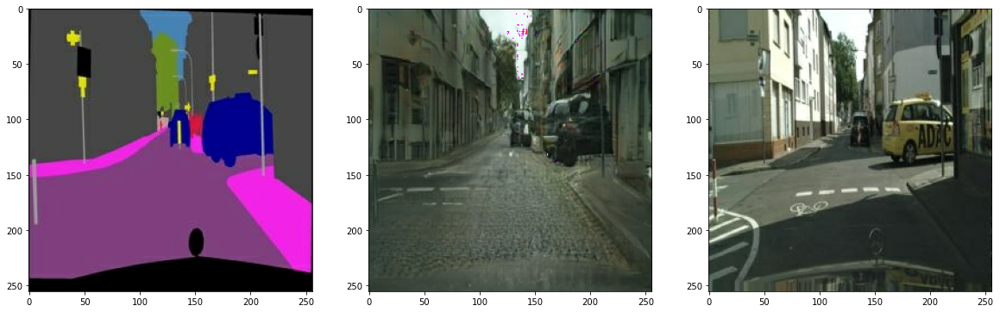

In [45]:
val_path = os.getenv('HOME')+'/aiffel/conditional_generation/cityscapes/val/'
#학습해본 모델로 채색을 시켜보자!
test_ind = 1

f = val_path + os.listdir(val_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))